In [1]:
!git clone https://github.com/huynhdang0987/DLFinal.git



Cloning into 'DLFinal'...
remote: Enumerating objects: 5187, done.
remote: Counting objects: 100% (37/37), done.
remote: Compressing objects: 100% (37/37), done.
remote: Total 5187 (delta 14), reused 0 (delta 0), pack-reused 5150 (from 2)
Receiving objects: 100% (5187/5187), 225.79 MiB | 17.49 MiB/s, done.
Resolving deltas: 100% (18/18), done.
Updating files: 100% (5629/5629), done.


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import numpy as np
import torch
import torchvision.transforms as T
from PIL import Image
from torchvision.transforms.functional import InterpolationMode
from transformers import AutoModel, AutoTokenizer
import requests

# Tiền Xử Lí

In [4]:
import os
import json
from PIL import Image
from tqdm import tqdm

def crop_images_from_ocr(image_dir, output_dir, ocr_results_json):
    # Đọc kết quả OCR từ file JSON
    with open(ocr_results_json, 'r', encoding='utf-8') as f:
        ocr_results = json.load(f)

    # Kiểm tra nếu thư mục output không tồn tại thì tạo mới
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    # Duyệt qua tất cả các kết quả OCR
    for filename, ocr_data in tqdm(ocr_results.items(), desc="🔪 Cắt ảnh"):
        image_path = os.path.join(image_dir, filename)
        if os.path.exists(image_path):
            image = Image.open(image_path)

            # Duyệt qua từng dòng văn bản trong kết quả OCR
            for idx, item in enumerate(ocr_data):
                box = item['box']
                text = item['text']

                # Chuyển đổi bounding box thành tọa độ (left, top, right, bottom)
                left = min([p[0] for p in box])
                top = min([p[1] for p in box])
                right = max([p[0] for p in box])
                bottom = max([p[1] for p in box])

                # Cắt ảnh theo bounding box
                cropped_image = image.crop((left, top, right, bottom))

                # Xóa hết đuôi ".jpg" và lưu dưới tên mới với đuôi ".png"
                base_filename = os.path.splitext(filename)[0]  # Lấy phần tên file trước đuôi
                cropped_filename = f"{base_filename.replace('.jpg', '')}_crop_{idx}.png"  # Loại bỏ ".jpg" và thêm "_crop_"
                cropped_image_path = os.path.join(output_dir, cropped_filename)

                # Lưu ảnh đã cắt vào thư mục output
                cropped_image.save(cropped_image_path)
                print(f"✅ Đã lưu ảnh cắt: {cropped_image_path}")
        else:
            print(f"❌ Không tìm thấy ảnh: {image_path}")

    print(f"\n✅ Đã cắt và lưu tất cả ảnh vào thư mục: {output_dir}")

# Ví dụ gọi hàm:
crop_images_from_ocr(image_dir='/content/DLFinal/images',
                     output_dir='/content/DLFinal/output_crops',
                     ocr_results_json='/content/DLFinal/output_ocr.json')


🔪 Cắt ảnh:   0%|          | 5/2811 [00:00<01:55, 24.30it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/200_jpg.rf.b7e8eb62e200d808b23f0a662fa407c6_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/200_jpg.rf.b7e8eb62e200d808b23f0a662fa407c6_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/200_jpg.rf.b7e8eb62e200d808b23f0a662fa407c6_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/200_jpg.rf.b7e8eb62e200d808b23f0a662fa407c6_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/200_jpg.rf.b7e8eb62e200d808b23f0a662fa407c6_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/200_jpg.rf.b7e8eb62e200d808b23f0a662fa407c6_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/200_jpg.rf.b7e8eb62e200d808b23f0a662fa407c6_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/200_jpg.rf.b7e8eb62e200d808b23f0a662fa407c6_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/200_jpg.rf.b7e8eb62e200d808b23f0a662fa407c6_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/200_jpg.rf.b7e8eb62e200d8

🔪 Cắt ảnh:   0%|          | 9/2811 [00:00<02:03, 22.64it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/68_jpg.rf.4a5d0d43be5bc9e9c5df6c27cba02b63_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/68_jpg.rf.4a5d0d43be5bc9e9c5df6c27cba02b63_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/68_jpg.rf.4a5d0d43be5bc9e9c5df6c27cba02b63_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/68_jpg.rf.4a5d0d43be5bc9e9c5df6c27cba02b63_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/68_jpg.rf.4a5d0d43be5bc9e9c5df6c27cba02b63_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/68_jpg.rf.4a5d0d43be5bc9e9c5df6c27cba02b63_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/68_jpg.rf.4a5d0d43be5bc9e9c5df6c27cba02b63_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/68_jpg.rf.4a5d0d43be5bc9e9c5df6c27cba02b63_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/68_jpg.rf.4a5d0d43be5bc9e9c5df6c27cba02b63_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/68_jpg.rf.4a5d0d43be5bc9e9c5df6

🔪 Cắt ảnh:   0%|          | 12/2811 [00:00<02:12, 21.07it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/41_jpg.rf.d312fee6d96e57cc06b83001c757f164_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/41_jpg.rf.d312fee6d96e57cc06b83001c757f164_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/41_jpg.rf.d312fee6d96e57cc06b83001c757f164_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/41_jpg.rf.d312fee6d96e57cc06b83001c757f164_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/41_jpg.rf.d312fee6d96e57cc06b83001c757f164_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/41_jpg.rf.d312fee6d96e57cc06b83001c757f164_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/41_jpg.rf.d312fee6d96e57cc06b83001c757f164_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/46_jpg.rf.1359e2aa9351f9e8e168eeb63601b8df_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/46_jpg.rf.1359e2aa9351f9e8e168eeb63601b8df_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/46_jpg.rf.1359e2aa9351f9e8e1

🔪 Cắt ảnh:   1%|          | 19/2811 [00:00<01:53, 24.52it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/282_jpg.rf.379a91ec4e55daa80a08bd7ebf4810b6_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/282_jpg.rf.379a91ec4e55daa80a08bd7ebf4810b6_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/282_jpg.rf.379a91ec4e55daa80a08bd7ebf4810b6_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/282_jpg.rf.379a91ec4e55daa80a08bd7ebf4810b6_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/282_jpg.rf.379a91ec4e55daa80a08bd7ebf4810b6_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/282_jpg.rf.379a91ec4e55daa80a08bd7ebf4810b6_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/282_jpg.rf.379a91ec4e55daa80a08bd7ebf4810b6_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/282_jpg.rf.379a91ec4e55daa80a08bd7ebf4810b6_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/282_jpg.rf.379a91ec4e55daa80a08bd7ebf4810b6_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/282_jpg.rf.379a91ec4e55da

🔪 Cắt ảnh:   1%|          | 25/2811 [00:01<01:52, 24.69it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/416_jpg.rf.b162d1701746ea584fd4817155078310_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/416_jpg.rf.b162d1701746ea584fd4817155078310_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/416_jpg.rf.b162d1701746ea584fd4817155078310_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/416_jpg.rf.b162d1701746ea584fd4817155078310_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/416_jpg.rf.b162d1701746ea584fd4817155078310_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/416_jpg.rf.b162d1701746ea584fd4817155078310_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/416_jpg.rf.b162d1701746ea584fd4817155078310_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/416_jpg.rf.b162d1701746ea584fd4817155078310_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/416_jpg.rf.b162d1701746ea584fd4817155078310_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/416_jpg.rf.b162d170174

🔪 Cắt ảnh:   1%|          | 31/2811 [00:01<01:46, 26.00it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/358_jpg.rf.2b15d2c12fe7ed9dfa481220ea8f86e0_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/358_jpg.rf.2b15d2c12fe7ed9dfa481220ea8f86e0_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/358_jpg.rf.2b15d2c12fe7ed9dfa481220ea8f86e0_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/358_jpg.rf.2b15d2c12fe7ed9dfa481220ea8f86e0_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/358_jpg.rf.2b15d2c12fe7ed9dfa481220ea8f86e0_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/358_jpg.rf.2b15d2c12fe7ed9dfa481220ea8f86e0_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/358_jpg.rf.2b15d2c12fe7ed9dfa481220ea8f86e0_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/358_jpg.rf.2b15d2c12fe7ed9dfa481220ea8f86e0_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/358_jpg.rf.2b15d2c12fe7ed9dfa481220ea8f86e0_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/358_jpg.rf.2b15d2c12fe7ed

🔪 Cắt ảnh:   1%|▏         | 37/2811 [00:01<01:42, 27.08it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/242_jpg.rf.b4d6106fdeeec1cff473ebb294454818_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/242_jpg.rf.b4d6106fdeeec1cff473ebb294454818_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/242_jpg.rf.b4d6106fdeeec1cff473ebb294454818_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/242_jpg.rf.b4d6106fdeeec1cff473ebb294454818_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/242_jpg.rf.b4d6106fdeeec1cff473ebb294454818_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/242_jpg.rf.b4d6106fdeeec1cff473ebb294454818_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/242_jpg.rf.b4d6106fdeeec1cff473ebb294454818_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/242_jpg.rf.b4d6106fdeeec1cff473ebb294454818_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/242_jpg.rf.b4d6106fdeeec1cff473ebb294454818_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/242_jpg.rf.b4d6106fde

🔪 Cắt ảnh:   1%|▏         | 40/2811 [00:01<01:41, 27.33it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/433_jpg.rf.e060f2e0a6dbe98c2950b76e79c95eee_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/433_jpg.rf.e060f2e0a6dbe98c2950b76e79c95eee_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/433_jpg.rf.e060f2e0a6dbe98c2950b76e79c95eee_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/433_jpg.rf.e060f2e0a6dbe98c2950b76e79c95eee_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/433_jpg.rf.e060f2e0a6dbe98c2950b76e79c95eee_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/433_jpg.rf.e060f2e0a6dbe98c2950b76e79c95eee_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/433_jpg.rf.e060f2e0a6dbe98c2950b76e79c95eee_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/433_jpg.rf.e060f2e0a6dbe98c2950b76e79c95eee_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/433_jpg.rf.e060f2e0a6dbe98c2950b76e79c95eee_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/433_jpg.rf.e060f2e0a6dbe9

🔪 Cắt ảnh:   2%|▏         | 43/2811 [00:01<02:15, 20.44it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/85_png.rf.0eb76c9637406b822d20cede70b7488b_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/85_png.rf.0eb76c9637406b822d20cede70b7488b_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/259_jpg.rf.468a6f87faba118d784806f4ab7f577f_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/259_jpg.rf.468a6f87faba118d784806f4ab7f577f_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/259_jpg.rf.468a6f87faba118d784806f4ab7f577f_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/259_jpg.rf.468a6f87faba118d784806f4ab7f577f_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/259_jpg.rf.468a6f87faba118d784806f4ab7f577f_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/259_jpg.rf.468a6f87faba118d784806f4ab7f577f_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/259_jpg.rf.468a6f87faba118d784806f4ab7f577f_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/259_jpg.rf.468a6f87faba11

🔪 Cắt ảnh:   2%|▏         | 46/2811 [00:02<03:23, 13.60it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/25_jpg.rf.7f1b848a527e5f9f344e0e7c639bfef6_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/25_jpg.rf.7f1b848a527e5f9f344e0e7c639bfef6_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/25_jpg.rf.7f1b848a527e5f9f344e0e7c639bfef6_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/25_jpg.rf.7f1b848a527e5f9f344e0e7c639bfef6_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/25_jpg.rf.7f1b848a527e5f9f344e0e7c639bfef6_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/25_jpg.rf.7f1b848a527e5f9f344e0e7c639bfef6_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/25_jpg.rf.7f1b848a527e5f9f344e0e7c639bfef6_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/25_jpg.rf.7f1b848a527e5f9f344e0e7c639bfef6_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/25_jpg.rf.7f1b848a527e5f9f344e0e7c639bfef6_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/25_jpg.rf.7f1b848a527e5f9f344e0

🔪 Cắt ảnh:   2%|▏         | 51/2811 [00:02<02:55, 15.75it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/53_jpg.rf.4b30537836b728187f16b894844fee21_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/53_jpg.rf.4b30537836b728187f16b894844fee21_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/53_jpg.rf.4b30537836b728187f16b894844fee21_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/53_jpg.rf.4b30537836b728187f16b894844fee21_crop_18.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/376_jpg.rf.52c34edf2d0d8a9abc92cb5d8e983e52_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/376_jpg.rf.52c34edf2d0d8a9abc92cb5d8e983e52_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/376_jpg.rf.52c34edf2d0d8a9abc92cb5d8e983e52_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/376_jpg.rf.52c34edf2d0d8a9abc92cb5d8e983e52_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/376_jpg.rf.52c34edf2d0d8a9abc92cb5d8e983e52_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/376_jpg.rf.52c34edf2d0d8a

🔪 Cắt ảnh:   2%|▏         | 58/2811 [00:02<02:07, 21.54it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/63_jpg.rf.0ce55f4d27daa32e583612cf84bac8f8_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/63_jpg.rf.0ce55f4d27daa32e583612cf84bac8f8_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/63_jpg.rf.0ce55f4d27daa32e583612cf84bac8f8_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/63_jpg.rf.0ce55f4d27daa32e583612cf84bac8f8_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/63_jpg.rf.0ce55f4d27daa32e583612cf84bac8f8_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/63_jpg.rf.0ce55f4d27daa32e583612cf84bac8f8_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/63_jpg.rf.0ce55f4d27daa32e583612cf84bac8f8_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/63_jpg.rf.0ce55f4d27daa32e583612cf84bac8f8_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/365_jpg.rf.5f36cbe375103165ae2e58e65df83ed4_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/365_jpg.rf.5f36cbe375103165

🔪 Cắt ảnh:   2%|▏         | 62/2811 [00:02<01:48, 25.23it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003232_jpg.rf.12e3129d4de3a65d2f218c6107442b1f_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003232_jpg.rf.12e3129d4de3a65d2f218c6107442b1f_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003232_jpg.rf.12e3129d4de3a65d2f218c6107442b1f_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003232_jpg.rf.12e3129d4de3a65d2f218c6107442b1f_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003232_jpg.rf.12e3129d4de3a65d2f218c6107442b1f_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003232_jpg.rf.12e3129d4de3a65d2f218c6107442b1f_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003232_jpg.rf.12e3129d4de3a65d2f218c6107442b1f_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003232_jpg.rf.12e3129d4de3a65d2f218c6107442b1f_crop_18.png
✅ Đã lưu ảnh cắt

🔪 Cắt ảnh:   2%|▏         | 66/2811 [00:03<01:57, 23.45it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002532_jpg.rf.60758f543b5bcd9dc5ac7015d26187ff_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002532_jpg.rf.60758f543b5bcd9dc5ac7015d26187ff_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002532_jpg.rf.60758f543b5bcd9dc5ac7015d26187ff_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002532_jpg.rf.60758f543b5bcd9dc5ac7015d26187ff_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002532_jpg.rf.60758f543b5bcd9dc5ac7015d26187ff_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002532_jpg.rf.60758f543b5bcd9dc5ac7015d26187ff_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002532_jpg.rf.60758f543b5bcd9dc5ac7015d26187ff_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002532_jpg.rf.60758f543b5bcd9dc5ac7015d26187ff_crop_12.png
✅ Đã lưu ảnh cắt: /co

🔪 Cắt ảnh:   2%|▏         | 69/2811 [00:03<02:37, 17.46it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114806_jpg.rf.ac36e72ac5d02e3857b854a29dab97cd_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114806_jpg.rf.ac36e72ac5d02e3857b854a29dab97cd_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114806_jpg.rf.ac36e72ac5d02e3857b854a29dab97cd_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114806_jpg.rf.ac36e72ac5d02e3857b854a29dab97cd_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114806_jpg.rf.ac36e72ac5d02e3857b854a29dab97cd_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114806_jpg.rf.ac36e72ac5d02e3857b854a29dab97cd_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114806_jpg.rf.ac36e72ac5d02e3857b854a29dab97cd_crop_18.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/87_png.rf.6b5c6d6cc79a8888a8464e536dec3d5b_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/ou

🔪 Cắt ảnh:   3%|▎         | 75/2811 [00:03<02:47, 16.29it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/55_jpg.rf.fb727733e5ab70be54c88c0bc34eb654_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/55_jpg.rf.fb727733e5ab70be54c88c0bc34eb654_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/197_jpg.rf.7baed1192317d360def85e82cc564ca4_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/197_jpg.rf.7baed1192317d360def85e82cc564ca4_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/197_jpg.rf.7baed1192317d360def85e82cc564ca4_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/197_jpg.rf.7baed1192317d360def85e82cc564ca4_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/197_jpg.rf.7baed1192317d360def85e82cc564ca4_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/197_jpg.rf.7baed1192317d360def85e82cc564ca4_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/197_jpg.rf.7baed1192317d360def85e82cc564ca4_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/197_jpg.rf.7baed1192317d3

🔪 Cắt ảnh:   3%|▎         | 83/2811 [00:03<01:58, 23.09it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/36_jpg.rf.6701a885408034cafedded96a5d59925_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/36_jpg.rf.6701a885408034cafedded96a5d59925_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/36_jpg.rf.6701a885408034cafedded96a5d59925_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/36_jpg.rf.6701a885408034cafedded96a5d59925_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/36_jpg.rf.6701a885408034cafedded96a5d59925_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/36_jpg.rf.6701a885408034cafedded96a5d59925_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/36_jpg.rf.6701a885408034cafedded96a5d59925_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/36_jpg.rf.6701a885408034cafedded96a5d59925_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/36_jpg.rf.6701a885408034cafedded96a5d59925_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/36_jpg.rf.6701a885408034cafedd

🔪 Cắt ảnh:   3%|▎         | 86/2811 [00:04<02:13, 20.38it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/83_png.rf.056f8a877dcfcc5b60916483f859ef5d_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/83_png.rf.056f8a877dcfcc5b60916483f859ef5d_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/83_png.rf.056f8a877dcfcc5b60916483f859ef5d_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/83_png.rf.056f8a877dcfcc5b60916483f859ef5d_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/83_png.rf.056f8a877dcfcc5b60916483f859ef5d_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/83_png.rf.056f8a877dcfcc5b60916483f859ef5d_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/83_png.rf.056f8a877dcfcc5b60916483f859ef5d_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/83_png.rf.056f8a877dcfcc5b60916483f859ef5d_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/83_png.rf.056f8a877dcfcc5b60916483f859ef5d_crop_18.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/248_jpg.rf.30ff44071461f8

🔪 Cắt ảnh:   3%|▎         | 89/2811 [00:04<03:06, 14.61it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/76_jpg.rf.e07c130100741ab927c4605063f8e15d_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/76_jpg.rf.e07c130100741ab927c4605063f8e15d_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/76_jpg.rf.e07c130100741ab927c4605063f8e15d_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/76_jpg.rf.e07c130100741ab927c4605063f8e15d_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/76_jpg.rf.e07c130100741ab927c4605063f8e15d_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/76_jpg.rf.e07c130100741ab927c4605063f8e15d_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/76_jpg.rf.e07c130100741ab927c4605063f8e15d_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/76_jpg.rf.e07c130100741ab927c4605063f8e15d_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/76_jpg.rf.e07c130100741ab927c4605063f8e15d_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/76_jpg.rf.e07c130100741ab927c46050

🔪 Cắt ảnh:   3%|▎         | 91/2811 [00:04<03:34, 12.69it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/377_jpg.rf.69ae8e8e1e3a5435ff115193d81212b2_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/377_jpg.rf.69ae8e8e1e3a5435ff115193d81212b2_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img780_jpg.rf.2ece51a052bf080b3d0b0f2f22c49def_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img780_jpg.rf.2ece51a052bf080b3d0b0f2f22c49def_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img780_jpg.rf.2ece51a052bf080b3d0b0f2f22c49def_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img780_jpg.rf.2ece51a052bf080b3d0b0f2f22c49def_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img780_jpg.rf.2ece51a052bf080b3d0b0f2f22c49def_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img780_jpg.rf.2ece51a052bf080b3d0b0f2f22c49def_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img780_jpg.rf.2ece51a052bf080b3d0b0f2f22c49def_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/im

🔪 Cắt ảnh:   4%|▎         | 99/2811 [00:04<02:10, 20.71it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/396_jpg.rf.29f61905cd731a6d3d44ec1f29c3bd06_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/396_jpg.rf.29f61905cd731a6d3d44ec1f29c3bd06_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/396_jpg.rf.29f61905cd731a6d3d44ec1f29c3bd06_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/396_jpg.rf.29f61905cd731a6d3d44ec1f29c3bd06_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/396_jpg.rf.29f61905cd731a6d3d44ec1f29c3bd06_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/396_jpg.rf.29f61905cd731a6d3d44ec1f29c3bd06_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/396_jpg.rf.29f61905cd731a6d3d44ec1f29c3bd06_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/411_jpg.rf.565ddc5f33a0989a27bd4b49b565e1f1_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/411_jpg.rf.565ddc5f33a0989a27bd4b49b565e1f1_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/411_jpg.rf.565ddc5f

🔪 Cắt ảnh:   4%|▍         | 106/2811 [00:05<01:47, 25.15it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/208_png.rf.5194414831624d5ad3c27f3646d59dce_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/208_png.rf.5194414831624d5ad3c27f3646d59dce_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/208_png.rf.5194414831624d5ad3c27f3646d59dce_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/208_png.rf.5194414831624d5ad3c27f3646d59dce_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/355_jpg.rf.ed9b8c665cb55aeffddb5097264a854c_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/355_jpg.rf.ed9b8c665cb55aeffddb5097264a854c_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/355_jpg.rf.ed9b8c665cb55aeffddb5097264a854c_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/355_jpg.rf.ed9b8c665cb55aeffddb5097264a854c_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/355_jpg.rf.ed9b8c665cb55aeffddb5097264a854c_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/355_jpg.rf.ed9b8c665c

🔪 Cắt ảnh:   4%|▍         | 110/2811 [00:05<01:36, 27.96it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/79_jpg.rf.82db0e80acac6844b4dd8e6f8e3d9f52_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/79_jpg.rf.82db0e80acac6844b4dd8e6f8e3d9f52_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/79_jpg.rf.82db0e80acac6844b4dd8e6f8e3d9f52_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/79_jpg.rf.82db0e80acac6844b4dd8e6f8e3d9f52_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/79_jpg.rf.82db0e80acac6844b4dd8e6f8e3d9f52_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/79_jpg.rf.82db0e80acac6844b4dd8e6f8e3d9f52_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/79_jpg.rf.82db0e80acac6844b4dd8e6f8e3d9f52_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/79_jpg.rf.82db0e80acac6844b4dd8e6f8e3d9f52_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/79_jpg.rf.82db0e80acac6844b4dd8e6f8e3d9f52_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/79_jpg.rf.82db0e80acac6844b4d

🔪 Cắt ảnh:   4%|▍         | 118/2811 [00:05<01:35, 28.13it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/381_jpg.rf.cd691d67f6247189b41bec98f083cda1_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/381_jpg.rf.cd691d67f6247189b41bec98f083cda1_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/381_jpg.rf.cd691d67f6247189b41bec98f083cda1_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/381_jpg.rf.cd691d67f6247189b41bec98f083cda1_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/381_jpg.rf.cd691d67f6247189b41bec98f083cda1_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/400_jpg.rf.fb90c796f3cd95a63fa452e35ed408d7_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/400_jpg.rf.fb90c796f3cd95a63fa452e35ed408d7_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/400_jpg.rf.fb90c796f3cd95a63fa452e35ed408d7_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/400_jpg.rf.fb90c796f3cd95a63fa452e35ed408d7_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/400_jpg.rf.fb90c796f

🔪 Cắt ảnh:   5%|▍         | 127/2811 [00:05<01:22, 32.40it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/444_jpg.rf.7c27271c5cb4944f4a4f2284eeb72591_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/444_jpg.rf.7c27271c5cb4944f4a4f2284eeb72591_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/444_jpg.rf.7c27271c5cb4944f4a4f2284eeb72591_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/444_jpg.rf.7c27271c5cb4944f4a4f2284eeb72591_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/444_jpg.rf.7c27271c5cb4944f4a4f2284eeb72591_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/444_jpg.rf.7c27271c5cb4944f4a4f2284eeb72591_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/444_jpg.rf.7c27271c5cb4944f4a4f2284eeb72591_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/444_jpg.rf.7c27271c5cb4944f4a4f2284eeb72591_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/444_jpg.rf.7c27271c5cb4944f4a4f2284eeb72591_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/444_jpg.rf.7c27271c5cb494

🔪 Cắt ảnh:   5%|▍         | 131/2811 [00:05<01:21, 32.75it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img1637_jpg.rf.0b3459d199e66882e48701fb0fd4b3e1_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img1637_jpg.rf.0b3459d199e66882e48701fb0fd4b3e1_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img1637_jpg.rf.0b3459d199e66882e48701fb0fd4b3e1_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img1637_jpg.rf.0b3459d199e66882e48701fb0fd4b3e1_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img1637_jpg.rf.0b3459d199e66882e48701fb0fd4b3e1_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img1637_jpg.rf.0b3459d199e66882e48701fb0fd4b3e1_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img1637_jpg.rf.0b3459d199e66882e48701fb0fd4b3e1_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img1637_jpg.rf.0b3459d199e66882e48701fb0fd4b3e1_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img1637_jpg.rf.0b3459d199e66882e48701fb0fd4b3e1_crop_17.png
✅ Đã lưu ảnh cắt: /content/DL

🔪 Cắt ảnh:   5%|▍         | 139/2811 [00:06<01:24, 31.66it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/380_jpg.rf.298cf888e299fa25d5a327d63def2736_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/380_jpg.rf.298cf888e299fa25d5a327d63def2736_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/380_jpg.rf.298cf888e299fa25d5a327d63def2736_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/380_jpg.rf.298cf888e299fa25d5a327d63def2736_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/380_jpg.rf.298cf888e299fa25d5a327d63def2736_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/310_jpg.rf.0c9d395326988cbb775d7aefb879d11e_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/310_jpg.rf.0c9d395326988cbb775d7aefb879d11e_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/310_jpg.rf.0c9d395326988cbb775d7aefb879d11e_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/310_jpg.rf.0c9d395326988cbb775d7aefb879d11e_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/310_jpg.rf.0c9d39532698

🔪 Cắt ảnh:   5%|▌         | 143/2811 [00:06<01:25, 31.18it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/422_jpg.rf.2d23ce640bae71f0b00d26b6c05ee1d6_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/422_jpg.rf.2d23ce640bae71f0b00d26b6c05ee1d6_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/422_jpg.rf.2d23ce640bae71f0b00d26b6c05ee1d6_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/422_jpg.rf.2d23ce640bae71f0b00d26b6c05ee1d6_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/422_jpg.rf.2d23ce640bae71f0b00d26b6c05ee1d6_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/422_jpg.rf.2d23ce640bae71f0b00d26b6c05ee1d6_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/422_jpg.rf.2d23ce640bae71f0b00d26b6c05ee1d6_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/422_jpg.rf.2d23ce640bae71f0b00d26b6c05ee1d6_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/311_jpg.rf.09776c49c8378259b22111d3705a54ea_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/311_jpg.rf.09776c49

🔪 Cắt ảnh:   5%|▌         | 147/2811 [00:06<01:40, 26.41it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/376_jpg.rf.2155c422183322df2cff25b1216c73eb_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/376_jpg.rf.2155c422183322df2cff25b1216c73eb_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/376_jpg.rf.2155c422183322df2cff25b1216c73eb_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/376_jpg.rf.2155c422183322df2cff25b1216c73eb_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/376_jpg.rf.2155c422183322df2cff25b1216c73eb_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/376_jpg.rf.2155c422183322df2cff25b1216c73eb_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/376_jpg.rf.2155c422183322df2cff25b1216c73eb_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/376_jpg.rf.2155c422183322df2cff25b1216c73eb_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/376_jpg.rf.2155c422183322df2cff25b1216c73eb_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/376_jpg.rf.2155c422183322

🔪 Cắt ảnh:   5%|▌         | 153/2811 [00:06<01:44, 25.53it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/158_jpg.rf.5cd8d696a8fc8308eedb27aa441c97e1_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/158_jpg.rf.5cd8d696a8fc8308eedb27aa441c97e1_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/158_jpg.rf.5cd8d696a8fc8308eedb27aa441c97e1_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/158_jpg.rf.5cd8d696a8fc8308eedb27aa441c97e1_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/158_jpg.rf.5cd8d696a8fc8308eedb27aa441c97e1_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/158_jpg.rf.5cd8d696a8fc8308eedb27aa441c97e1_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/158_jpg.rf.5cd8d696a8fc8308eedb27aa441c97e1_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/158_jpg.rf.5cd8d696a8fc8308eedb27aa441c97e1_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/158_jpg.rf.5cd8d696a8fc8308eedb27aa441c97e1_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/158_jpg.rf.5cd8d696a8fc83

🔪 Cắt ảnh:   6%|▌         | 160/2811 [00:07<01:38, 26.95it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img778_jpg.rf.75ff3a6994a13d6fb76f6e4da702b9c2_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img778_jpg.rf.75ff3a6994a13d6fb76f6e4da702b9c2_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img778_jpg.rf.75ff3a6994a13d6fb76f6e4da702b9c2_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img778_jpg.rf.75ff3a6994a13d6fb76f6e4da702b9c2_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img778_jpg.rf.75ff3a6994a13d6fb76f6e4da702b9c2_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img778_jpg.rf.75ff3a6994a13d6fb76f6e4da702b9c2_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img778_jpg.rf.75ff3a6994a13d6fb76f6e4da702b9c2_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img778_jpg.rf.75ff3a6994a13d6fb76f6e4da702b9c2_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img778_jpg.rf.75ff3a6994a13d6fb76f6e4da702b9c2_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crop

🔪 Cắt ảnh:   6%|▌         | 163/2811 [00:07<01:51, 23.81it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/82_jpg.rf.484caeb7fbeb5f1e869a071d06922440_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/82_jpg.rf.484caeb7fbeb5f1e869a071d06922440_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/82_jpg.rf.484caeb7fbeb5f1e869a071d06922440_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/82_jpg.rf.484caeb7fbeb5f1e869a071d06922440_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/82_jpg.rf.484caeb7fbeb5f1e869a071d06922440_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/82_jpg.rf.484caeb7fbeb5f1e869a071d06922440_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/82_jpg.rf.484caeb7fbeb5f1e869a071d06922440_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/82_jpg.rf.484caeb7fbeb5f1e869a071d06922440_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/82_jpg.rf.484caeb7fbeb5f1e869a071d06922440_crop_18.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/118_jpg.rf.3562c5ffcc3b4c

🔪 Cắt ảnh:   6%|▌         | 169/2811 [00:07<01:53, 23.22it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/84_png.rf.6cd8a4e9335fd52ea97017f51c8de597_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/84_png.rf.6cd8a4e9335fd52ea97017f51c8de597_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/84_png.rf.6cd8a4e9335fd52ea97017f51c8de597_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/84_png.rf.6cd8a4e9335fd52ea97017f51c8de597_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/84_png.rf.6cd8a4e9335fd52ea97017f51c8de597_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/84_png.rf.6cd8a4e9335fd52ea97017f51c8de597_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/84_png.rf.6cd8a4e9335fd52ea97017f51c8de597_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/84_png.rf.6cd8a4e9335fd52ea97017f51c8de597_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/84_png.rf.6cd8a4e9335fd52ea97017f51c8de597_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/84_png.rf.6cd8a4e9335fd52ea97017f5

🔪 Cắt ảnh:   6%|▌         | 172/2811 [00:07<01:58, 22.32it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/56_jpg.rf.7e6b2d5a22b4c8af831a4568cba0a2b5_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/56_jpg.rf.7e6b2d5a22b4c8af831a4568cba0a2b5_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/56_jpg.rf.7e6b2d5a22b4c8af831a4568cba0a2b5_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/56_jpg.rf.7e6b2d5a22b4c8af831a4568cba0a2b5_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/56_jpg.rf.7e6b2d5a22b4c8af831a4568cba0a2b5_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/56_jpg.rf.7e6b2d5a22b4c8af831a4568cba0a2b5_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/56_jpg.rf.7e6b2d5a22b4c8af831a4568cba0a2b5_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/56_jpg.rf.7e6b2d5a22b4c8af831a4568cba0a2b5_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/56_jpg.rf.7e6b2d5a22b4c8af831a4568cba0a2b5_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/56_jpg.rf.7e6b2d5a22b4c8af831a45

🔪 Cắt ảnh:   6%|▋         | 178/2811 [00:07<01:48, 24.34it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/311_jpg.rf.f1fe41da22f83dd8352f81bf22020a0e_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/311_jpg.rf.f1fe41da22f83dd8352f81bf22020a0e_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/311_jpg.rf.f1fe41da22f83dd8352f81bf22020a0e_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/311_jpg.rf.f1fe41da22f83dd8352f81bf22020a0e_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/311_jpg.rf.f1fe41da22f83dd8352f81bf22020a0e_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/311_jpg.rf.f1fe41da22f83dd8352f81bf22020a0e_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/311_jpg.rf.f1fe41da22f83dd8352f81bf22020a0e_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/311_jpg.rf.f1fe41da22f83dd8352f81bf22020a0e_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/311_jpg.rf.f1fe41da22f83dd8352f81bf22020a0e_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/311_jpg.rf.f1fe41da22f83d

🔪 Cắt ảnh:   6%|▋         | 181/2811 [00:08<01:52, 23.34it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/170_jpg.rf.51e5e9c3308d4f88f1eca4de815e4520_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_115051_jpg.rf.18be8ea73f8b22bfca6b36f7aea50fc8_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_115051_jpg.rf.18be8ea73f8b22bfca6b36f7aea50fc8_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_115051_jpg.rf.18be8ea73f8b22bfca6b36f7aea50fc8_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_115051_jpg.rf.18be8ea73f8b22bfca6b36f7aea50fc8_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_115051_jpg.rf.18be8ea73f8b22bfca6b36f7aea50fc8_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_115051_jpg.rf.18be8ea73f8b22bfca6b36f7aea50fc8_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_115051_jpg.rf.18be8ea73f8b22bfca6b36f7aea50fc8_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_

🔪 Cắt ảnh:   7%|▋         | 188/2811 [00:08<01:52, 23.37it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/292_jpg.rf.b7d950e08bb0239bd08728774c953b29_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/292_jpg.rf.b7d950e08bb0239bd08728774c953b29_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/292_jpg.rf.b7d950e08bb0239bd08728774c953b29_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/292_jpg.rf.b7d950e08bb0239bd08728774c953b29_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/292_jpg.rf.b7d950e08bb0239bd08728774c953b29_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/292_jpg.rf.b7d950e08bb0239bd08728774c953b29_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/59_jpg.rf.edc7b9754fdd72bf2a262035defe115c_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/59_jpg.rf.edc7b9754fdd72bf2a262035defe115c_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/59_jpg.rf.edc7b9754fdd72bf2a262035defe115c_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/59_jpg.rf.edc7b9754fdd

🔪 Cắt ảnh:   7%|▋         | 195/2811 [00:08<01:31, 28.47it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/85_png.rf.d4de30f0896b330dafde6b798338b9dd_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/85_png.rf.d4de30f0896b330dafde6b798338b9dd_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/85_png.rf.d4de30f0896b330dafde6b798338b9dd_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/85_png.rf.d4de30f0896b330dafde6b798338b9dd_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/85_png.rf.d4de30f0896b330dafde6b798338b9dd_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/85_png.rf.d4de30f0896b330dafde6b798338b9dd_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/85_png.rf.d4de30f0896b330dafde6b798338b9dd_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/433_jpg.rf.7b955d6d25a007d03109204faadc2c0a_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/433_jpg.rf.7b955d6d25a007d03109204faadc2c0a_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/433_jpg.rf.7b955d6d25a007

🔪 Cắt ảnh:   7%|▋         | 198/2811 [00:08<01:32, 28.38it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/77_jpg.rf.a276d2fef5ace48960919f140b2bb0fa_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/77_jpg.rf.a276d2fef5ace48960919f140b2bb0fa_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/77_jpg.rf.a276d2fef5ace48960919f140b2bb0fa_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/77_jpg.rf.a276d2fef5ace48960919f140b2bb0fa_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/77_jpg.rf.a276d2fef5ace48960919f140b2bb0fa_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/77_jpg.rf.a276d2fef5ace48960919f140b2bb0fa_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/77_jpg.rf.a276d2fef5ace48960919f140b2bb0fa_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/77_jpg.rf.a276d2fef5ace48960919f140b2bb0fa_crop_18.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/58_jpg.rf.3d88222a36b44f7b339a4bfadd9f42cb_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/58_jpg.rf.3d88222a36b44f7b

🔪 Cắt ảnh:   7%|▋         | 201/2811 [00:08<01:43, 25.21it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/23_jpg.rf.e42c15e6f79a4bb5c7dd974dae8917d0_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/23_jpg.rf.e42c15e6f79a4bb5c7dd974dae8917d0_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/23_jpg.rf.e42c15e6f79a4bb5c7dd974dae8917d0_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/376_jpg.rf.03595fa0e4b049e24d9bd1ae762c06d4_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/376_jpg.rf.03595fa0e4b049e24d9bd1ae762c06d4_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/376_jpg.rf.03595fa0e4b049e24d9bd1ae762c06d4_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/376_jpg.rf.03595fa0e4b049e24d9bd1ae762c06d4_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/376_jpg.rf.03595fa0e4b049e24d9bd1ae762c06d4_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/376_jpg.rf.03595fa0e4b049e24d9bd1ae762c06d4_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/376_jpg.rf.03595fa0e4b049

🔪 Cắt ảnh:   7%|▋         | 207/2811 [00:09<01:57, 22.13it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/345_jpg.rf.adb17382f7dbda767610c68e1a36f657_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/345_jpg.rf.adb17382f7dbda767610c68e1a36f657_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/345_jpg.rf.adb17382f7dbda767610c68e1a36f657_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/345_jpg.rf.adb17382f7dbda767610c68e1a36f657_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/345_jpg.rf.adb17382f7dbda767610c68e1a36f657_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/345_jpg.rf.adb17382f7dbda767610c68e1a36f657_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/345_jpg.rf.adb17382f7dbda767610c68e1a36f657_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/345_jpg.rf.adb17382f7dbda767610c68e1a36f657_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/345_jpg.rf.adb17382f7dbda767610c68e1a36f657_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/345_jpg.rf.adb17382f7db

🔪 Cắt ảnh:   8%|▊         | 213/2811 [00:09<01:48, 23.84it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/407_jpg.rf.83e88c0802cfbe72e51a26f8558042a4_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/407_jpg.rf.83e88c0802cfbe72e51a26f8558042a4_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/407_jpg.rf.83e88c0802cfbe72e51a26f8558042a4_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/407_jpg.rf.83e88c0802cfbe72e51a26f8558042a4_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/407_jpg.rf.83e88c0802cfbe72e51a26f8558042a4_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/407_jpg.rf.83e88c0802cfbe72e51a26f8558042a4_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/407_jpg.rf.83e88c0802cfbe72e51a26f8558042a4_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/407_jpg.rf.83e88c0802cfbe72e51a26f8558042a4_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/407_jpg.rf.83e88c0802cfbe72e51a26f8558042a4_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/407_jpg.rf.83e88c0802cfbe

🔪 Cắt ảnh:   8%|▊         | 219/2811 [00:09<01:39, 25.96it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/710_jpg.rf.648f8be4e4f42d9fa5a5eedcdc6334ed_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/710_jpg.rf.648f8be4e4f42d9fa5a5eedcdc6334ed_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/710_jpg.rf.648f8be4e4f42d9fa5a5eedcdc6334ed_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/710_jpg.rf.648f8be4e4f42d9fa5a5eedcdc6334ed_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/710_jpg.rf.648f8be4e4f42d9fa5a5eedcdc6334ed_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/710_jpg.rf.648f8be4e4f42d9fa5a5eedcdc6334ed_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/710_jpg.rf.648f8be4e4f42d9fa5a5eedcdc6334ed_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/710_jpg.rf.648f8be4e4f42d9fa5a5eedcdc6334ed_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/710_jpg.rf.648f8be4e4f42d9fa5a5eedcdc6334ed_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/710_jpg.rf.648f8be4e4f42d

🔪 Cắt ảnh:   8%|▊         | 225/2811 [00:09<01:38, 26.16it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/290_jpg.rf.e6dc31b9073d09c7a2265d601b82f53d_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/290_jpg.rf.e6dc31b9073d09c7a2265d601b82f53d_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/290_jpg.rf.e6dc31b9073d09c7a2265d601b82f53d_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/290_jpg.rf.e6dc31b9073d09c7a2265d601b82f53d_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/290_jpg.rf.e6dc31b9073d09c7a2265d601b82f53d_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003532_jpg.rf.8c9b48d7b3a84892148e0f1683aeaa68_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003532_jpg.rf.8c9b48d7b3a84892148e0f1683aeaa68_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003532_jpg.rf.8c9b48d7b3a84892148e0f1683aeaa68_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003532_jpg.rf.8c9b48d7b3a84892148e0f1683aeaa68_crop

🔪 Cắt ảnh:   8%|▊         | 228/2811 [00:09<01:36, 26.86it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/176_jpg.rf.e6880039b1e120f09b104cff7b351ab7_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/176_jpg.rf.e6880039b1e120f09b104cff7b351ab7_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/176_jpg.rf.e6880039b1e120f09b104cff7b351ab7_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/176_jpg.rf.e6880039b1e120f09b104cff7b351ab7_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/176_jpg.rf.e6880039b1e120f09b104cff7b351ab7_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/176_jpg.rf.e6880039b1e120f09b104cff7b351ab7_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/176_jpg.rf.e6880039b1e120f09b104cff7b351ab7_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/176_jpg.rf.e6880039b1e120f09b104cff7b351ab7_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/176_jpg.rf.e6880039b1e120f09b104cff7b351ab7_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/176_jpg.rf.e6880039b1e120

🔪 Cắt ảnh:   8%|▊         | 237/2811 [00:10<01:24, 30.47it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/300_jpg.rf.949b1aec2d6b42b66c93c700c887d64c_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/300_jpg.rf.949b1aec2d6b42b66c93c700c887d64c_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/300_jpg.rf.949b1aec2d6b42b66c93c700c887d64c_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/300_jpg.rf.949b1aec2d6b42b66c93c700c887d64c_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/300_jpg.rf.949b1aec2d6b42b66c93c700c887d64c_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/300_jpg.rf.949b1aec2d6b42b66c93c700c887d64c_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/300_jpg.rf.949b1aec2d6b42b66c93c700c887d64c_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/300_jpg.rf.949b1aec2d6b42b66c93c700c887d64c_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/300_jpg.rf.949b1aec2d6b42b66c93c700c887d64c_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/300_jpg.rf.949b1aec2

🔪 Cắt ảnh:   9%|▊         | 245/2811 [00:10<01:21, 31.50it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/45_jpg.rf.7fb25ec047849ab04d848b73c4fca906_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/71_jpg.rf.f6ae65f21719e44e87d706d96bd39032_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/71_jpg.rf.f6ae65f21719e44e87d706d96bd39032_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/71_jpg.rf.f6ae65f21719e44e87d706d96bd39032_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/71_jpg.rf.f6ae65f21719e44e87d706d96bd39032_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/71_jpg.rf.f6ae65f21719e44e87d706d96bd39032_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/71_jpg.rf.f6ae65f21719e44e87d706d96bd39032_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/71_jpg.rf.f6ae65f21719e44e87d706d96bd39032_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/71_jpg.rf.f6ae65f21719e44e87d706d96bd39032_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/71_jpg.rf.f6ae65f21719e44e87d706d

🔪 Cắt ảnh:   9%|▉         | 250/2811 [00:10<01:11, 35.86it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/259_jpg.rf.f54cf04251c83a3b4189341b0aa729a1_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/259_jpg.rf.f54cf04251c83a3b4189341b0aa729a1_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/259_jpg.rf.f54cf04251c83a3b4189341b0aa729a1_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/259_jpg.rf.f54cf04251c83a3b4189341b0aa729a1_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/259_jpg.rf.f54cf04251c83a3b4189341b0aa729a1_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/259_jpg.rf.f54cf04251c83a3b4189341b0aa729a1_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/259_jpg.rf.f54cf04251c83a3b4189341b0aa729a1_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/259_jpg.rf.f54cf04251c83a3b4189341b0aa729a1_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/259_jpg.rf.f54cf04251c83a3b4189341b0aa729a1_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/259_jpg.rf.f54cf04251c83

🔪 Cắt ảnh:   9%|▉         | 258/2811 [00:10<01:15, 33.72it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/371_jpg.rf.42cfe29f37976b9c2b09998cef007373_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/371_jpg.rf.42cfe29f37976b9c2b09998cef007373_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/371_jpg.rf.42cfe29f37976b9c2b09998cef007373_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/371_jpg.rf.42cfe29f37976b9c2b09998cef007373_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/371_jpg.rf.42cfe29f37976b9c2b09998cef007373_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/371_jpg.rf.42cfe29f37976b9c2b09998cef007373_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/371_jpg.rf.42cfe29f37976b9c2b09998cef007373_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/371_jpg.rf.42cfe29f37976b9c2b09998cef007373_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/371_jpg.rf.42cfe29f37976b9c2b09998cef007373_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/371_jpg.rf.42cfe29f37976

🔪 Cắt ảnh:   9%|▉         | 267/2811 [00:10<01:10, 36.24it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/46_jpg.rf.dc360e429eb298c483fb741a3ed7f718_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/46_jpg.rf.dc360e429eb298c483fb741a3ed7f718_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/82_jpg.rf.cff9552380ade0786f6223c7e2ba5763_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/82_jpg.rf.cff9552380ade0786f6223c7e2ba5763_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/82_jpg.rf.cff9552380ade0786f6223c7e2ba5763_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/82_jpg.rf.cff9552380ade0786f6223c7e2ba5763_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/82_jpg.rf.cff9552380ade0786f6223c7e2ba5763_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/82_jpg.rf.cff9552380ade0786f6223c7e2ba5763_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/82_jpg.rf.cff9552380ade0786f6223c7e2ba5763_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/82_jpg.rf.cff9552380ade0786f6223

🔪 Cắt ảnh:  10%|▉         | 271/2811 [00:11<01:17, 32.80it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/158_jpg.rf.221ce0e01c1e11507a9fa905c83c44b3_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/158_jpg.rf.221ce0e01c1e11507a9fa905c83c44b3_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/158_jpg.rf.221ce0e01c1e11507a9fa905c83c44b3_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/158_jpg.rf.221ce0e01c1e11507a9fa905c83c44b3_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/158_jpg.rf.221ce0e01c1e11507a9fa905c83c44b3_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/158_jpg.rf.221ce0e01c1e11507a9fa905c83c44b3_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/158_jpg.rf.221ce0e01c1e11507a9fa905c83c44b3_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/158_jpg.rf.221ce0e01c1e11507a9fa905c83c44b3_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/82_jpg.rf.e4be904e9bc1c5deb82c059eab3cecaf_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/82_jpg.rf.e4be904e

🔪 Cắt ảnh:  10%|▉         | 279/2811 [00:11<01:17, 32.72it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/24_jpg.rf.1057e5a5dadefc7ad32bc8d8ed871647_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/24_jpg.rf.1057e5a5dadefc7ad32bc8d8ed871647_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/24_jpg.rf.1057e5a5dadefc7ad32bc8d8ed871647_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/24_jpg.rf.1057e5a5dadefc7ad32bc8d8ed871647_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/24_jpg.rf.1057e5a5dadefc7ad32bc8d8ed871647_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/24_jpg.rf.1057e5a5dadefc7ad32bc8d8ed871647_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/24_jpg.rf.1057e5a5dadefc7ad32bc8d8ed871647_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/24_jpg.rf.1057e5a5dadefc7ad32bc8d8ed871647_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/216_jpg.rf.827c3708f9346fcf819693df5def4315_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/216_jpg.rf.827c3708f9346f

🔪 Cắt ảnh:  10%|█         | 283/2811 [00:11<01:22, 30.60it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_115041_jpg.rf.783c31bb977462659e6273a9c1e372f2_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_115041_jpg.rf.783c31bb977462659e6273a9c1e372f2_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_115041_jpg.rf.783c31bb977462659e6273a9c1e372f2_crop_18.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_115041_jpg.rf.783c31bb977462659e6273a9c1e372f2_crop_19.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_115041_jpg.rf.783c31bb977462659e6273a9c1e372f2_crop_20.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/184_jpg.rf.fdc3057a355657a2014c87b227154977_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/184_jpg.rf.fdc3057a355657a2014c87b227154977_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/184_jpg.rf.fdc3057a355657a2014c87b227154977_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/184_jpg.rf.fdc3057a355657a20

🔪 Cắt ảnh:  10%|█         | 291/2811 [00:11<01:15, 33.26it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/193_jpg.rf.4808ef381650ce168ce55da4dc79ed6f_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/193_jpg.rf.4808ef381650ce168ce55da4dc79ed6f_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/193_jpg.rf.4808ef381650ce168ce55da4dc79ed6f_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/193_jpg.rf.4808ef381650ce168ce55da4dc79ed6f_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/193_jpg.rf.4808ef381650ce168ce55da4dc79ed6f_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/193_jpg.rf.4808ef381650ce168ce55da4dc79ed6f_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/193_jpg.rf.4808ef381650ce168ce55da4dc79ed6f_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/193_jpg.rf.4808ef381650ce168ce55da4dc79ed6f_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/193_jpg.rf.4808ef381650ce168ce55da4dc79ed6f_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/193_jpg.rf.4808ef38165

🔪 Cắt ảnh:  11%|█         | 299/2811 [00:11<01:18, 32.15it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002752_jpg.rf.50f8b4512fd08b73257676c1e94640ce_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002752_jpg.rf.50f8b4512fd08b73257676c1e94640ce_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002752_jpg.rf.50f8b4512fd08b73257676c1e94640ce_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002752_jpg.rf.50f8b4512fd08b73257676c1e94640ce_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002752_jpg.rf.50f8b4512fd08b73257676c1e94640ce_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002752_jpg.rf.50f8b4512fd08b73257676c1e94640ce_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002752_jpg.rf.50f8b4512fd08b73257676c1e94640ce_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002752_jpg.rf.50f8b4512fd08b73257676c1e94640ce_crop_17.png
✅ Đã lưu ảnh cắt

🔪 Cắt ảnh:  11%|█         | 303/2811 [00:12<01:23, 30.13it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/303_jpg.rf.9f765ead4429ea6dc5d0d9fdfa8b6ca5_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/303_jpg.rf.9f765ead4429ea6dc5d0d9fdfa8b6ca5_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/303_jpg.rf.9f765ead4429ea6dc5d0d9fdfa8b6ca5_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/303_jpg.rf.9f765ead4429ea6dc5d0d9fdfa8b6ca5_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/303_jpg.rf.9f765ead4429ea6dc5d0d9fdfa8b6ca5_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/303_jpg.rf.9f765ead4429ea6dc5d0d9fdfa8b6ca5_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/303_jpg.rf.9f765ead4429ea6dc5d0d9fdfa8b6ca5_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/303_jpg.rf.9f765ead4429ea6dc5d0d9fdfa8b6ca5_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/303_jpg.rf.9f765ead4429ea6dc5d0d9fdfa8b6ca5_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/690_jpg.rf.11f45c5955c

🔪 Cắt ảnh:  11%|█         | 310/2811 [00:12<01:28, 28.30it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/201_jpg.rf.6c54c3174be73e1f4a1aaa5bb9bcdb86_crop_18.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/144_jpg.rf.5b0cc9e0eed18c41b693e1fbc3cd4b75_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/144_jpg.rf.5b0cc9e0eed18c41b693e1fbc3cd4b75_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/144_jpg.rf.5b0cc9e0eed18c41b693e1fbc3cd4b75_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/144_jpg.rf.5b0cc9e0eed18c41b693e1fbc3cd4b75_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/144_jpg.rf.5b0cc9e0eed18c41b693e1fbc3cd4b75_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/144_jpg.rf.5b0cc9e0eed18c41b693e1fbc3cd4b75_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/144_jpg.rf.5b0cc9e0eed18c41b693e1fbc3cd4b75_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/144_jpg.rf.5b0cc9e0eed18c41b693e1fbc3cd4b75_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/144_jpg.rf.5b0cc9e0eed18

🔪 Cắt ảnh:  11%|█         | 314/2811 [00:12<01:24, 29.47it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/339_jpg.rf.3508f4bf023f0d756078d911479eec10_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/339_jpg.rf.3508f4bf023f0d756078d911479eec10_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/339_jpg.rf.3508f4bf023f0d756078d911479eec10_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/339_jpg.rf.3508f4bf023f0d756078d911479eec10_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/339_jpg.rf.3508f4bf023f0d756078d911479eec10_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/339_jpg.rf.3508f4bf023f0d756078d911479eec10_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/339_jpg.rf.3508f4bf023f0d756078d911479eec10_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/339_jpg.rf.3508f4bf023f0d756078d911479eec10_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/339_jpg.rf.3508f4bf023f0d756078d911479eec10_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/339_jpg.rf.3508f4bf023

🔪 Cắt ảnh:  11%|█▏        | 321/2811 [00:12<01:22, 30.28it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/174_jpg.rf.43b5524be612a68e74803e5999774c49_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/174_jpg.rf.43b5524be612a68e74803e5999774c49_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/174_jpg.rf.43b5524be612a68e74803e5999774c49_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/174_jpg.rf.43b5524be612a68e74803e5999774c49_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/174_jpg.rf.43b5524be612a68e74803e5999774c49_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/174_jpg.rf.43b5524be612a68e74803e5999774c49_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/174_jpg.rf.43b5524be612a68e74803e5999774c49_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/174_jpg.rf.43b5524be612a68e74803e5999774c49_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/174_jpg.rf.43b5524be612a68e74803e5999774c49_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/174_jpg.rf.43b5524be6

🔪 Cắt ảnh:  12%|█▏        | 329/2811 [00:12<01:20, 30.94it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002641_jpg.rf.8a4ba4d2a145e21f62a90bd5b24b506a_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002641_jpg.rf.8a4ba4d2a145e21f62a90bd5b24b506a_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002641_jpg.rf.8a4ba4d2a145e21f62a90bd5b24b506a_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002641_jpg.rf.8a4ba4d2a145e21f62a90bd5b24b506a_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002641_jpg.rf.8a4ba4d2a145e21f62a90bd5b24b506a_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002641_jpg.rf.8a4ba4d2a145e21f62a90bd5b24b506a_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002641_jpg.rf.8a4ba4d2a145e21f62a90bd5b24b506a_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002641_jpg.rf.8a4ba4d2a145e21f62a90bd5b24b506a_crop_12.png
✅ Đã lưu ảnh cắt: /co

🔪 Cắt ảnh:  12%|█▏        | 333/2811 [00:13<01:24, 29.24it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/3_jpg.rf.6afe640e0b8145e16d15df57fd1e752c_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/3_jpg.rf.6afe640e0b8145e16d15df57fd1e752c_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/3_jpg.rf.6afe640e0b8145e16d15df57fd1e752c_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img787_jpg.rf.792e9d2b7c6c68e936d55c80ab15e675_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img787_jpg.rf.792e9d2b7c6c68e936d55c80ab15e675_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img787_jpg.rf.792e9d2b7c6c68e936d55c80ab15e675_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img787_jpg.rf.792e9d2b7c6c68e936d55c80ab15e675_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img787_jpg.rf.792e9d2b7c6c68e936d55c80ab15e675_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img787_jpg.rf.792e9d2b7c6c68e936d55c80ab15e675_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img787_jpg

🔪 Cắt ảnh:  12%|█▏        | 339/2811 [00:13<01:28, 27.85it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/20_jpg.rf.f815bdf7cbce732f9e6bb89af107d3b7_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/20_jpg.rf.f815bdf7cbce732f9e6bb89af107d3b7_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/20_jpg.rf.f815bdf7cbce732f9e6bb89af107d3b7_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/20_jpg.rf.f815bdf7cbce732f9e6bb89af107d3b7_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/20_jpg.rf.f815bdf7cbce732f9e6bb89af107d3b7_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/20_jpg.rf.f815bdf7cbce732f9e6bb89af107d3b7_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/20_jpg.rf.f815bdf7cbce732f9e6bb89af107d3b7_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/20_jpg.rf.f815bdf7cbce732f9e6bb89af107d3b7_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/20_jpg.rf.f815bdf7cbce732f9e6bb89af107d3b7_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/20_jpg.rf.f815bdf7cbce732f9e6bb89a

🔪 Cắt ảnh:  12%|█▏        | 342/2811 [00:13<01:34, 26.01it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/246_jpg.rf.bcdc2f32801f2f83062b3ddbca29d31b_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/246_jpg.rf.bcdc2f32801f2f83062b3ddbca29d31b_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/246_jpg.rf.bcdc2f32801f2f83062b3ddbca29d31b_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/246_jpg.rf.bcdc2f32801f2f83062b3ddbca29d31b_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/246_jpg.rf.bcdc2f32801f2f83062b3ddbca29d31b_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/246_jpg.rf.bcdc2f32801f2f83062b3ddbca29d31b_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/246_jpg.rf.bcdc2f32801f2f83062b3ddbca29d31b_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/246_jpg.rf.bcdc2f32801f2f83062b3ddbca29d31b_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/246_jpg.rf.bcdc2f32801f2f83062b3ddbca29d31b_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/440_jpg.rf.003d07

🔪 Cắt ảnh:  12%|█▏        | 351/2811 [00:13<01:20, 30.69it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/81_jpg.rf.1cfd79f8da40aa612ae05a20170d83b0_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/81_jpg.rf.1cfd79f8da40aa612ae05a20170d83b0_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/81_jpg.rf.1cfd79f8da40aa612ae05a20170d83b0_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/216_jpg.rf.3889883e68d77df3fb5ed08b649891fd_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/216_jpg.rf.3889883e68d77df3fb5ed08b649891fd_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/216_jpg.rf.3889883e68d77df3fb5ed08b649891fd_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/216_jpg.rf.3889883e68d77df3fb5ed08b649891fd_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/216_jpg.rf.3889883e68d77df3fb5ed08b649891fd_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/216_jpg.rf.3889883e68d77df3fb5ed08b649891fd_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/216_jpg.rf.3889883e68d77d

🔪 Cắt ảnh:  13%|█▎        | 355/2811 [00:13<01:18, 31.22it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/364_jpg.rf.67a954e11d60c936d10d5c5728659090_crop_18.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/91_jpg.rf.c2819e1154431ada3cfccd70e41cea12_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/91_jpg.rf.c2819e1154431ada3cfccd70e41cea12_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/91_jpg.rf.c2819e1154431ada3cfccd70e41cea12_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/91_jpg.rf.c2819e1154431ada3cfccd70e41cea12_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/91_jpg.rf.c2819e1154431ada3cfccd70e41cea12_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/91_jpg.rf.c2819e1154431ada3cfccd70e41cea12_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/91_jpg.rf.c2819e1154431ada3cfccd70e41cea12_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/91_jpg.rf.c2819e1154431ada3cfccd70e41cea12_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/91_jpg.rf.c2819e1154431ada3cfccd

🔪 Cắt ảnh:  13%|█▎        | 364/2811 [00:14<01:11, 34.14it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002828_jpg.rf.5daccf4503e3b281cc3cc7b39f03d4cf_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002828_jpg.rf.5daccf4503e3b281cc3cc7b39f03d4cf_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002828_jpg.rf.5daccf4503e3b281cc3cc7b39f03d4cf_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002828_jpg.rf.5daccf4503e3b281cc3cc7b39f03d4cf_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/12_jpg.rf.6e09f6e4b4544011eab4ea85673796d1_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/12_jpg.rf.6e09f6e4b4544011eab4ea85673796d1_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/12_jpg.rf.6e09f6e4b4544011eab4ea85673796d1_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/12_jpg.rf.6e09f6e4b4544011eab4ea85673796d1_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/12_jpg.rf.6e09f6e4b4544011eab4ea85673796d1_crop_4.pn

🔪 Cắt ảnh:  13%|█▎        | 372/2811 [00:14<01:12, 33.57it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/62_jpg.rf.06e10181f83f80240b6c3ad73ff7ed3b_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/62_jpg.rf.06e10181f83f80240b6c3ad73ff7ed3b_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/62_jpg.rf.06e10181f83f80240b6c3ad73ff7ed3b_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/62_jpg.rf.06e10181f83f80240b6c3ad73ff7ed3b_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/62_jpg.rf.06e10181f83f80240b6c3ad73ff7ed3b_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/62_jpg.rf.06e10181f83f80240b6c3ad73ff7ed3b_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/62_jpg.rf.06e10181f83f80240b6c3ad73ff7ed3b_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/62_jpg.rf.06e10181f83f80240b6c3ad73ff7ed3b_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/62_jpg.rf.06e10181f83f80240b6c3ad73ff7ed3b_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/62_jpg.rf.06e10181f83f80240b6c

🔪 Cắt ảnh:  13%|█▎        | 376/2811 [00:14<01:15, 32.20it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002626_jpg.rf.b5a64f269d88ad243e9d45250526b701_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002626_jpg.rf.b5a64f269d88ad243e9d45250526b701_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002626_jpg.rf.b5a64f269d88ad243e9d45250526b701_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002626_jpg.rf.b5a64f269d88ad243e9d45250526b701_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002626_jpg.rf.b5a64f269d88ad243e9d45250526b701_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002626_jpg.rf.b5a64f269d88ad243e9d45250526b701_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002626_jpg.rf.b5a64f269d88ad243e9d45250526b701_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002626_jpg.rf.b5a64f269d88ad243e9d45250526b701_crop_14.png
✅ Đã lưu ảnh cắt: /

🔪 Cắt ảnh:  14%|█▎        | 384/2811 [00:14<01:12, 33.66it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/280_jpg.rf.d0c1287995473ec1bd4e404742c291a6_crop_28.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/280_jpg.rf.d0c1287995473ec1bd4e404742c291a6_crop_29.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/411_jpg.rf.575872efa4aee934cd54a642c0a232cf_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/411_jpg.rf.575872efa4aee934cd54a642c0a232cf_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/411_jpg.rf.575872efa4aee934cd54a642c0a232cf_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/411_jpg.rf.575872efa4aee934cd54a642c0a232cf_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/411_jpg.rf.575872efa4aee934cd54a642c0a232cf_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/411_jpg.rf.575872efa4aee934cd54a642c0a232cf_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/411_jpg.rf.575872efa4aee934cd54a642c0a232cf_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/411_jpg.rf.575872efa4ae

🔪 Cắt ảnh:  14%|█▍        | 392/2811 [00:14<01:11, 33.83it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/63_jpg.rf.9b50069d9e07f0ca5e46a74fc3eef759_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/63_jpg.rf.9b50069d9e07f0ca5e46a74fc3eef759_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/63_jpg.rf.9b50069d9e07f0ca5e46a74fc3eef759_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/63_jpg.rf.9b50069d9e07f0ca5e46a74fc3eef759_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/63_jpg.rf.9b50069d9e07f0ca5e46a74fc3eef759_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/63_jpg.rf.9b50069d9e07f0ca5e46a74fc3eef759_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/63_jpg.rf.9b50069d9e07f0ca5e46a74fc3eef759_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/63_jpg.rf.9b50069d9e07f0ca5e46a74fc3eef759_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/63_jpg.rf.9b50069d9e07f0ca5e46a74fc3eef759_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/63_jpg.rf.9b50069d9e07f0ca5e46a

🔪 Cắt ảnh:  14%|█▍        | 401/2811 [00:15<01:02, 38.85it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002638_jpg.rf.e8ece3cdaaf3866a5ca72ceddd24bd39_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002638_jpg.rf.e8ece3cdaaf3866a5ca72ceddd24bd39_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002638_jpg.rf.e8ece3cdaaf3866a5ca72ceddd24bd39_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002638_jpg.rf.e8ece3cdaaf3866a5ca72ceddd24bd39_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002638_jpg.rf.e8ece3cdaaf3866a5ca72ceddd24bd39_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002638_jpg.rf.e8ece3cdaaf3866a5ca72ceddd24bd39_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002638_jpg.rf.e8ece3cdaaf3866a5ca72ceddd24bd39_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002638_jpg.rf.e8ece3cdaaf3866a5ca72ceddd24bd39_crop_11.png
✅ Đã lưu ảnh cắt: /con

🔪 Cắt ảnh:  15%|█▍        | 410/2811 [00:15<01:01, 38.88it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/51_jpg.rf.3a231eede49210829850ac400134693a_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/51_jpg.rf.3a231eede49210829850ac400134693a_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/51_jpg.rf.3a231eede49210829850ac400134693a_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/51_jpg.rf.3a231eede49210829850ac400134693a_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/51_jpg.rf.3a231eede49210829850ac400134693a_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/51_jpg.rf.3a231eede49210829850ac400134693a_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/51_jpg.rf.3a231eede49210829850ac400134693a_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/51_jpg.rf.3a231eede49210829850ac400134693a_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/51_jpg.rf.3a231eede49210829850ac400134693a_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/51_jpg.rf.3a231eede49210829850

🔪 Cắt ảnh:  15%|█▍        | 414/2811 [00:15<01:08, 35.23it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/45_jpg.rf.a55e077ad26d5522c291ba79977cafad_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/45_jpg.rf.a55e077ad26d5522c291ba79977cafad_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/45_jpg.rf.a55e077ad26d5522c291ba79977cafad_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/45_jpg.rf.a55e077ad26d5522c291ba79977cafad_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/45_jpg.rf.a55e077ad26d5522c291ba79977cafad_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/45_jpg.rf.a55e077ad26d5522c291ba79977cafad_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/45_jpg.rf.a55e077ad26d5522c291ba79977cafad_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/45_jpg.rf.a55e077ad26d5522c291ba79977cafad_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/45_jpg.rf.a55e077ad26d5522c291ba79977cafad_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/45_jpg.rf.a55e077ad26d5522c291ba79

🔪 Cắt ảnh:  15%|█▌        | 422/2811 [00:15<01:09, 34.61it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/213_jpg.rf.f30db8320c1ad459d4dda0f3d1829a7f_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/213_jpg.rf.f30db8320c1ad459d4dda0f3d1829a7f_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/213_jpg.rf.f30db8320c1ad459d4dda0f3d1829a7f_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_115041_jpg.rf.dd6d04ed3ed2ff8f3803c512b84071a6_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_115041_jpg.rf.dd6d04ed3ed2ff8f3803c512b84071a6_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_115041_jpg.rf.dd6d04ed3ed2ff8f3803c512b84071a6_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_115041_jpg.rf.dd6d04ed3ed2ff8f3803c512b84071a6_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_115041_jpg.rf.dd6d04ed3ed2ff8f3803c512b84071a6_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_115041_jpg.rf.

🔪 Cắt ảnh:  15%|█▌        | 426/2811 [00:15<01:09, 34.42it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/19_jpg.rf.8fa286849da1ff1c6cc65604224d4fd4_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/19_jpg.rf.8fa286849da1ff1c6cc65604224d4fd4_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/19_jpg.rf.8fa286849da1ff1c6cc65604224d4fd4_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/19_jpg.rf.8fa286849da1ff1c6cc65604224d4fd4_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/19_jpg.rf.8fa286849da1ff1c6cc65604224d4fd4_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/19_jpg.rf.8fa286849da1ff1c6cc65604224d4fd4_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/19_jpg.rf.8fa286849da1ff1c6cc65604224d4fd4_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/19_jpg.rf.8fa286849da1ff1c6cc65604224d4fd4_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/19_jpg.rf.8fa286849da1ff1c6cc65604224d4fd4_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/19_jpg.rf.8fa286849da1ff1c6cc65

🔪 Cắt ảnh:  15%|█▌        | 434/2811 [00:16<01:12, 32.66it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/39_jpg.rf.5ff960e251973951caac4aff9e6e1b12_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/39_jpg.rf.5ff960e251973951caac4aff9e6e1b12_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/39_jpg.rf.5ff960e251973951caac4aff9e6e1b12_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/39_jpg.rf.5ff960e251973951caac4aff9e6e1b12_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/224_jpg.rf.4f09325e3bd075a5d2803391cbb8b379_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/224_jpg.rf.4f09325e3bd075a5d2803391cbb8b379_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/224_jpg.rf.4f09325e3bd075a5d2803391cbb8b379_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/224_jpg.rf.4f09325e3bd075a5d2803391cbb8b379_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/224_jpg.rf.4f09325e3bd075a5d2803391cbb8b379_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/224_jpg.rf.4f09325e3bd075

🔪 Cắt ảnh:  16%|█▌        | 442/2811 [00:16<01:16, 30.77it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/65_jpg.rf.ced238b434093ff5ee4cb1adf29a9654_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/65_jpg.rf.ced238b434093ff5ee4cb1adf29a9654_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/379_jpg.rf.3cf5e8fce3527b3745f0dbe4abccc046_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/379_jpg.rf.3cf5e8fce3527b3745f0dbe4abccc046_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/379_jpg.rf.3cf5e8fce3527b3745f0dbe4abccc046_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/379_jpg.rf.3cf5e8fce3527b3745f0dbe4abccc046_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/379_jpg.rf.3cf5e8fce3527b3745f0dbe4abccc046_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/379_jpg.rf.3cf5e8fce3527b3745f0dbe4abccc046_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/379_jpg.rf.3cf5e8fce3527b3745f0dbe4abccc046_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/379_jpg.rf.3cf5e8fce3527b

🔪 Cắt ảnh:  16%|█▌        | 446/2811 [00:16<01:23, 28.40it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002641_jpg.rf.cd9a7a6aca13c74f449ae57708c972db_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002641_jpg.rf.cd9a7a6aca13c74f449ae57708c972db_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002641_jpg.rf.cd9a7a6aca13c74f449ae57708c972db_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002641_jpg.rf.cd9a7a6aca13c74f449ae57708c972db_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002641_jpg.rf.cd9a7a6aca13c74f449ae57708c972db_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002641_jpg.rf.cd9a7a6aca13c74f449ae57708c972db_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002641_jpg.rf.cd9a7a6aca13c74f449ae57708c972db_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002641_jpg.rf.cd9a7a6aca13c74f449ae57708c972db_crop_7.png
✅ Đã lưu ảnh cắt: /conte

🔪 Cắt ảnh:  16%|█▌        | 453/2811 [00:16<01:17, 30.39it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/250_jpg.rf.ee93f540e5b9d43f372e806b2b19d08f_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/250_jpg.rf.ee93f540e5b9d43f372e806b2b19d08f_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/250_jpg.rf.ee93f540e5b9d43f372e806b2b19d08f_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/250_jpg.rf.ee93f540e5b9d43f372e806b2b19d08f_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/250_jpg.rf.ee93f540e5b9d43f372e806b2b19d08f_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/250_jpg.rf.ee93f540e5b9d43f372e806b2b19d08f_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003447_jpg.rf.72c1b2b1eeef1c15bb9deaefad2affaf_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003447_jpg.rf.72c1b2b1eeef1c15bb9deaefad2affaf_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003447_jpg.rf.72c1b2b1eeef1c15bb9deaefad2affaf_crop_2.png
✅ Đã lưu ả

🔪 Cắt ảnh:  16%|█▋        | 457/2811 [00:16<01:18, 29.88it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/25_jpg.rf.7438b5a97457d599141ad3b2bdb6571f_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/25_jpg.rf.7438b5a97457d599141ad3b2bdb6571f_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/25_jpg.rf.7438b5a97457d599141ad3b2bdb6571f_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/9_jpg.rf.dac1660b809ac49bc47e26b9a4bd80b4_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/9_jpg.rf.dac1660b809ac49bc47e26b9a4bd80b4_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/9_jpg.rf.dac1660b809ac49bc47e26b9a4bd80b4_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/9_jpg.rf.dac1660b809ac49bc47e26b9a4bd80b4_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/9_jpg.rf.dac1660b809ac49bc47e26b9a4bd80b4_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/9_jpg.rf.dac1660b809ac49bc47e26b9a4bd80b4_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/9_jpg.rf.dac1660b809ac49bc47e26b9a4bd

🔪 Cắt ảnh:  17%|█▋        | 466/2811 [00:17<01:10, 33.26it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/221_jpg.rf.3a58e0ef1cda6e74c830eaf190e9e857_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/221_jpg.rf.3a58e0ef1cda6e74c830eaf190e9e857_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/221_jpg.rf.3a58e0ef1cda6e74c830eaf190e9e857_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/221_jpg.rf.3a58e0ef1cda6e74c830eaf190e9e857_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/221_jpg.rf.3a58e0ef1cda6e74c830eaf190e9e857_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/221_jpg.rf.3a58e0ef1cda6e74c830eaf190e9e857_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/221_jpg.rf.3a58e0ef1cda6e74c830eaf190e9e857_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/221_jpg.rf.3a58e0ef1cda6e74c830eaf190e9e857_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/221_jpg.rf.3a58e0ef1cda6e74c830eaf190e9e857_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/390_jpg.rf.8c44540

🔪 Cắt ảnh:  17%|█▋        | 474/2811 [00:17<01:12, 32.23it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/64_jpg.rf.832c1922bd89211d4440e32647735c6f_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/64_jpg.rf.832c1922bd89211d4440e32647735c6f_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/64_jpg.rf.832c1922bd89211d4440e32647735c6f_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/64_jpg.rf.832c1922bd89211d4440e32647735c6f_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/64_jpg.rf.832c1922bd89211d4440e32647735c6f_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/64_jpg.rf.832c1922bd89211d4440e32647735c6f_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/64_jpg.rf.832c1922bd89211d4440e32647735c6f_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/64_jpg.rf.832c1922bd89211d4440e32647735c6f_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/64_jpg.rf.832c1922bd89211d4440e32647735c6f_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/64_jpg.rf.832c1922bd89211d4440

🔪 Cắt ảnh:  17%|█▋        | 478/2811 [00:17<01:14, 31.28it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/363_jpg.rf.75013b2c3c5f1ab5a7af72b6f39d6001_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/363_jpg.rf.75013b2c3c5f1ab5a7af72b6f39d6001_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/363_jpg.rf.75013b2c3c5f1ab5a7af72b6f39d6001_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/363_jpg.rf.75013b2c3c5f1ab5a7af72b6f39d6001_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/363_jpg.rf.75013b2c3c5f1ab5a7af72b6f39d6001_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/363_jpg.rf.75013b2c3c5f1ab5a7af72b6f39d6001_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/363_jpg.rf.75013b2c3c5f1ab5a7af72b6f39d6001_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/363_jpg.rf.75013b2c3c5f1ab5a7af72b6f39d6001_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/363_jpg.rf.75013b2c3c5f1ab5a7af72b6f39d6001_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/363_jpg.rf.75013b2c3

🔪 Cắt ảnh:  17%|█▋        | 486/2811 [00:17<01:15, 30.87it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/711_jpg.rf.0c0cf2f0ad2817959f07686faa7c4a7c_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/711_jpg.rf.0c0cf2f0ad2817959f07686faa7c4a7c_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/711_jpg.rf.0c0cf2f0ad2817959f07686faa7c4a7c_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/711_jpg.rf.0c0cf2f0ad2817959f07686faa7c4a7c_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/711_jpg.rf.0c0cf2f0ad2817959f07686faa7c4a7c_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/355_jpg.rf.de2531b7c24b8ebed8e8ee069b762b1b_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/355_jpg.rf.de2531b7c24b8ebed8e8ee069b762b1b_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/355_jpg.rf.de2531b7c24b8ebed8e8ee069b762b1b_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/355_jpg.rf.de2531b7c24b8ebed8e8ee069b762b1b_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/355_jpg.rf.de2531b7c24b

🔪 Cắt ảnh:  17%|█▋        | 490/2811 [00:18<01:13, 31.59it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/22_jpg.rf.f7c810985ba27521fd61acc230e375b0_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/22_jpg.rf.f7c810985ba27521fd61acc230e375b0_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/22_jpg.rf.f7c810985ba27521fd61acc230e375b0_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/22_jpg.rf.f7c810985ba27521fd61acc230e375b0_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/22_jpg.rf.f7c810985ba27521fd61acc230e375b0_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/22_jpg.rf.f7c810985ba27521fd61acc230e375b0_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/22_jpg.rf.f7c810985ba27521fd61acc230e375b0_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/22_jpg.rf.f7c810985ba27521fd61acc230e375b0_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/22_jpg.rf.f7c810985ba27521fd61acc230e375b0_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/22_jpg.rf.f7c810985ba27521f

🔪 Cắt ảnh:  18%|█▊        | 498/2811 [00:18<01:14, 30.85it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/177_jpg.rf.86fc2e6506c44b2159098c2cf12cdac4_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/177_jpg.rf.86fc2e6506c44b2159098c2cf12cdac4_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/177_jpg.rf.86fc2e6506c44b2159098c2cf12cdac4_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/177_jpg.rf.86fc2e6506c44b2159098c2cf12cdac4_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/139_jpg.rf.33ab81b13f4bddf6641546c29dc355da_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/139_jpg.rf.33ab81b13f4bddf6641546c29dc355da_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/139_jpg.rf.33ab81b13f4bddf6641546c29dc355da_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/139_jpg.rf.33ab81b13f4bddf6641546c29dc355da_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/139_jpg.rf.33ab81b13f4bddf6641546c29dc355da_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/139_jpg.rf.33ab81b13f

🔪 Cắt ảnh:  18%|█▊        | 506/2811 [00:18<01:11, 32.43it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/119_jpg.rf.8130ce188a5892dfda1aef0d27135601_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/119_jpg.rf.8130ce188a5892dfda1aef0d27135601_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/119_jpg.rf.8130ce188a5892dfda1aef0d27135601_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/15_jpg.rf.89323ca0d583ec9bacf0d650d240b7af_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/15_jpg.rf.89323ca0d583ec9bacf0d650d240b7af_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/15_jpg.rf.89323ca0d583ec9bacf0d650d240b7af_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/15_jpg.rf.89323ca0d583ec9bacf0d650d240b7af_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/15_jpg.rf.89323ca0d583ec9bacf0d650d240b7af_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/15_jpg.rf.89323ca0d583ec9bacf0d650d240b7af_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/15_jpg.rf.89323ca0d583ec9bac

🔪 Cắt ảnh:  18%|█▊        | 510/2811 [00:18<01:19, 29.10it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/226_jpg.rf.c617c6e3b0d11fcc78728944162cfbbb_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/226_jpg.rf.c617c6e3b0d11fcc78728944162cfbbb_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/226_jpg.rf.c617c6e3b0d11fcc78728944162cfbbb_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/226_jpg.rf.c617c6e3b0d11fcc78728944162cfbbb_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/226_jpg.rf.c617c6e3b0d11fcc78728944162cfbbb_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/226_jpg.rf.c617c6e3b0d11fcc78728944162cfbbb_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/226_jpg.rf.c617c6e3b0d11fcc78728944162cfbbb_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/226_jpg.rf.c617c6e3b0d11fcc78728944162cfbbb_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/226_jpg.rf.c617c6e3b0d11fcc78728944162cfbbb_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/73_jpg.rf.4c65cb060dd

🔪 Cắt ảnh:  18%|█▊        | 517/2811 [00:18<01:17, 29.78it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114631_jpg.rf.91e7018875193c4df6a15e95da760194_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114631_jpg.rf.91e7018875193c4df6a15e95da760194_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114631_jpg.rf.91e7018875193c4df6a15e95da760194_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003532_jpg.rf.73d4f73975c531a689ddb102e2b0c1e3_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003532_jpg.rf.73d4f73975c531a689ddb102e2b0c1e3_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003532_jpg.rf.73d4f73975c531a689ddb102e2b0c1e3_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003532_jpg.rf.73d4f73975c531a689ddb102e2b0c1e3_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003532_jpg.rf.73d4f73975c531a689ddb102e2b0c1e3_crop_4.png
✅ Đã lưu ảnh cắt: /co

🔪 Cắt ảnh:  19%|█▊        | 521/2811 [00:19<01:18, 29.30it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/195_jpg.rf.1ccd3e05fe04e1a1eda61f9df39db7bf_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/195_jpg.rf.1ccd3e05fe04e1a1eda61f9df39db7bf_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/195_jpg.rf.1ccd3e05fe04e1a1eda61f9df39db7bf_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/195_jpg.rf.1ccd3e05fe04e1a1eda61f9df39db7bf_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/195_jpg.rf.1ccd3e05fe04e1a1eda61f9df39db7bf_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/195_jpg.rf.1ccd3e05fe04e1a1eda61f9df39db7bf_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/195_jpg.rf.1ccd3e05fe04e1a1eda61f9df39db7bf_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/195_jpg.rf.1ccd3e05fe04e1a1eda61f9df39db7bf_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/195_jpg.rf.1ccd3e05fe04e1a1eda61f9df39db7bf_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/195_jpg.rf.1ccd3e05

🔪 Cắt ảnh:  19%|█▉        | 529/2811 [00:19<01:08, 33.15it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/123_jpg.rf.0f9277490bae98fee6f35c33df51a28f_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/123_jpg.rf.0f9277490bae98fee6f35c33df51a28f_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/123_jpg.rf.0f9277490bae98fee6f35c33df51a28f_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/123_jpg.rf.0f9277490bae98fee6f35c33df51a28f_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/123_jpg.rf.0f9277490bae98fee6f35c33df51a28f_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/123_jpg.rf.0f9277490bae98fee6f35c33df51a28f_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/123_jpg.rf.0f9277490bae98fee6f35c33df51a28f_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/123_jpg.rf.0f9277490bae98fee6f35c33df51a28f_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/123_jpg.rf.0f9277490bae98fee6f35c33df51a28f_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/123_jpg.rf.0f9277490ba

🔪 Cắt ảnh:  19%|█▉        | 537/2811 [00:19<01:07, 33.84it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/170_jpg.rf.58064ea9ab12b2b47da3e4be314d255d_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/170_jpg.rf.58064ea9ab12b2b47da3e4be314d255d_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/170_jpg.rf.58064ea9ab12b2b47da3e4be314d255d_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/170_jpg.rf.58064ea9ab12b2b47da3e4be314d255d_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/170_jpg.rf.58064ea9ab12b2b47da3e4be314d255d_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/170_jpg.rf.58064ea9ab12b2b47da3e4be314d255d_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/170_jpg.rf.58064ea9ab12b2b47da3e4be314d255d_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/170_jpg.rf.58064ea9ab12b2b47da3e4be314d255d_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/170_jpg.rf.58064ea9ab12b2b47da3e4be314d255d_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/170_jpg.rf.58064ea9a

🔪 Cắt ảnh:  19%|█▉        | 541/2811 [00:19<01:17, 29.34it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/116_jpg.rf.41665ffa481ee3cec29e83894877c8ed_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/116_jpg.rf.41665ffa481ee3cec29e83894877c8ed_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/116_jpg.rf.41665ffa481ee3cec29e83894877c8ed_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/116_jpg.rf.41665ffa481ee3cec29e83894877c8ed_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/116_jpg.rf.41665ffa481ee3cec29e83894877c8ed_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/116_jpg.rf.41665ffa481ee3cec29e83894877c8ed_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/116_jpg.rf.41665ffa481ee3cec29e83894877c8ed_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/116_jpg.rf.41665ffa481ee3cec29e83894877c8ed_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/116_jpg.rf.41665ffa481ee3cec29e83894877c8ed_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/116_jpg.rf.41665ffa481ee3

🔪 Cắt ảnh:  19%|█▉        | 545/2811 [00:19<01:14, 30.61it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/339_jpg.rf.5248ba26ff096a91a045502cf71a9872_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/339_jpg.rf.5248ba26ff096a91a045502cf71a9872_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/339_jpg.rf.5248ba26ff096a91a045502cf71a9872_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/339_jpg.rf.5248ba26ff096a91a045502cf71a9872_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/321_jpg.rf.aa8b0b100484a0f3e0dc68cf8f152b64_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/321_jpg.rf.aa8b0b100484a0f3e0dc68cf8f152b64_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/321_jpg.rf.aa8b0b100484a0f3e0dc68cf8f152b64_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/321_jpg.rf.aa8b0b100484a0f3e0dc68cf8f152b64_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/321_jpg.rf.aa8b0b100484a0f3e0dc68cf8f152b64_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/321_jpg.rf.aa8b0b1004

🔪 Cắt ảnh:  20%|█▉        | 552/2811 [00:20<01:26, 26.02it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/40_jpg.rf.8f46140cfbee267035d52eda9445f1a1_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/40_jpg.rf.8f46140cfbee267035d52eda9445f1a1_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/40_jpg.rf.8f46140cfbee267035d52eda9445f1a1_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/40_jpg.rf.8f46140cfbee267035d52eda9445f1a1_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/40_jpg.rf.8f46140cfbee267035d52eda9445f1a1_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/40_jpg.rf.8f46140cfbee267035d52eda9445f1a1_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/40_jpg.rf.8f46140cfbee267035d52eda9445f1a1_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/40_jpg.rf.8f46140cfbee267035d52eda9445f1a1_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/40_jpg.rf.8f46140cfbee267035d52eda9445f1a1_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/40_jpg.rf.8f46140cfbee267035d

🔪 Cắt ảnh:  20%|█▉        | 555/2811 [00:20<01:30, 24.81it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/60_jpg.rf.0d2d2873008a931c1b180717a58d5cd7_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/60_jpg.rf.0d2d2873008a931c1b180717a58d5cd7_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/83_jpg.rf.d998cbbdd6c8fa2d35f57e14d2b28d16_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/83_jpg.rf.d998cbbdd6c8fa2d35f57e14d2b28d16_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/83_jpg.rf.d998cbbdd6c8fa2d35f57e14d2b28d16_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/83_jpg.rf.d998cbbdd6c8fa2d35f57e14d2b28d16_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/83_jpg.rf.d998cbbdd6c8fa2d35f57e14d2b28d16_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/83_jpg.rf.d998cbbdd6c8fa2d35f57e14d2b28d16_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/83_jpg.rf.d998cbbdd6c8fa2d35f57e14d2b28d16_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/83_jpg.rf.d998cbbdd6c8fa2d35f57e

🔪 Cắt ảnh:  20%|█▉        | 561/2811 [00:20<01:35, 23.48it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/4_jpg.rf.cb3826bec8f2cefcb2089cbf3087f13c_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/4_jpg.rf.cb3826bec8f2cefcb2089cbf3087f13c_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/4_jpg.rf.cb3826bec8f2cefcb2089cbf3087f13c_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/4_jpg.rf.cb3826bec8f2cefcb2089cbf3087f13c_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/4_jpg.rf.cb3826bec8f2cefcb2089cbf3087f13c_crop_18.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003459_jpg.rf.971fa60cefa4fc95e0da56465f6ceb68_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003459_jpg.rf.971fa60cefa4fc95e0da56465f6ceb68_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003459_jpg.rf.971fa60cefa4fc95e0da56465f6ceb68_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003459_jpg.rf.971fa60cefa4fc95e0da56465f6ceb68_crop_3.png
✅ 

🔪 Cắt ảnh:  20%|██        | 564/2811 [00:20<01:40, 22.36it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/231_jpg.rf.798185fe674d227317b03fb65fa8f628_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/231_jpg.rf.798185fe674d227317b03fb65fa8f628_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/231_jpg.rf.798185fe674d227317b03fb65fa8f628_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/231_jpg.rf.798185fe674d227317b03fb65fa8f628_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/231_jpg.rf.798185fe674d227317b03fb65fa8f628_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/231_jpg.rf.798185fe674d227317b03fb65fa8f628_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/231_jpg.rf.798185fe674d227317b03fb65fa8f628_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/441_jpg.rf.0f540f04f1d9dbb9265f21a7d5d81fbb_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/441_jpg.rf.0f540f04f1d9dbb9265f21a7d5d81fbb_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/441_jpg.rf.0f540f0

🔪 Cắt ảnh:  20%|██        | 571/2811 [00:20<01:26, 25.88it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/55_jpg.rf.ae6069061936444348418b3dcb103d86_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/55_jpg.rf.ae6069061936444348418b3dcb103d86_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/55_jpg.rf.ae6069061936444348418b3dcb103d86_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/55_jpg.rf.ae6069061936444348418b3dcb103d86_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/55_jpg.rf.ae6069061936444348418b3dcb103d86_crop_18.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/407_jpg.rf.a0fa8daedd0d38146ab8c8ed6c9c05ea_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/407_jpg.rf.a0fa8daedd0d38146ab8c8ed6c9c05ea_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/407_jpg.rf.a0fa8daedd0d38146ab8c8ed6c9c05ea_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/407_jpg.rf.a0fa8daedd0d38146ab8c8ed6c9c05ea_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/407_jpg.rf.a0fa8daedd0d38

🔪 Cắt ảnh:  20%|██        | 574/2811 [00:21<01:33, 23.92it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/396_jpg.rf.5135f2587bba3c859c159c4887276851_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/396_jpg.rf.5135f2587bba3c859c159c4887276851_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/396_jpg.rf.5135f2587bba3c859c159c4887276851_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/396_jpg.rf.5135f2587bba3c859c159c4887276851_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/396_jpg.rf.5135f2587bba3c859c159c4887276851_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/396_jpg.rf.5135f2587bba3c859c159c4887276851_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/396_jpg.rf.5135f2587bba3c859c159c4887276851_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/396_jpg.rf.5135f2587bba3c859c159c4887276851_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/396_jpg.rf.5135f2587bba3c859c159c4887276851_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/396_jpg.rf.5135f2587b

🔪 Cắt ảnh:  21%|██        | 580/2811 [00:21<01:33, 23.79it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/137_jpg.rf.7565ca47c686f9cd64bdabe6602d2c82_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/137_jpg.rf.7565ca47c686f9cd64bdabe6602d2c82_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/137_jpg.rf.7565ca47c686f9cd64bdabe6602d2c82_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/137_jpg.rf.7565ca47c686f9cd64bdabe6602d2c82_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/137_jpg.rf.7565ca47c686f9cd64bdabe6602d2c82_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/137_jpg.rf.7565ca47c686f9cd64bdabe6602d2c82_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/137_jpg.rf.7565ca47c686f9cd64bdabe6602d2c82_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/137_jpg.rf.7565ca47c686f9cd64bdabe6602d2c82_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/137_jpg.rf.7565ca47c686f9cd64bdabe6602d2c82_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/137_jpg.rf.7565ca47c686f

🔪 Cắt ảnh:  21%|██        | 586/2811 [00:21<01:30, 24.48it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/286_jpg.rf.4b76b5c8b6e20b0703c04a52c0ee413d_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/286_jpg.rf.4b76b5c8b6e20b0703c04a52c0ee413d_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/286_jpg.rf.4b76b5c8b6e20b0703c04a52c0ee413d_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/286_jpg.rf.4b76b5c8b6e20b0703c04a52c0ee413d_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/286_jpg.rf.4b76b5c8b6e20b0703c04a52c0ee413d_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/286_jpg.rf.4b76b5c8b6e20b0703c04a52c0ee413d_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/286_jpg.rf.4b76b5c8b6e20b0703c04a52c0ee413d_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/286_jpg.rf.4b76b5c8b6e20b0703c04a52c0ee413d_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/286_jpg.rf.4b76b5c8b6e20b0703c04a52c0ee413d_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/286_jpg.rf.4b76b5c8b6e20b

🔪 Cắt ảnh:  21%|██        | 589/2811 [00:21<01:44, 21.19it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003512_jpg.rf.a84cffe91b6d37a94a6b97a67206c693_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003512_jpg.rf.a84cffe91b6d37a94a6b97a67206c693_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003512_jpg.rf.a84cffe91b6d37a94a6b97a67206c693_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003512_jpg.rf.a84cffe91b6d37a94a6b97a67206c693_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003512_jpg.rf.a84cffe91b6d37a94a6b97a67206c693_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003512_jpg.rf.a84cffe91b6d37a94a6b97a67206c693_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003512_jpg.rf.a84cffe91b6d37a94a6b97a67206c693_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003512_jpg.rf.a84cffe91b6d37a94a6b97a67206c693_crop_10.png
✅ Đã lưu ảnh cắt: /cont

🔪 Cắt ảnh:  21%|██        | 595/2811 [00:21<01:34, 23.50it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/73_jpg.rf.e5ce321120dc450253e3cb3f5d104c5a_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/108_jpg.rf.dcff927cb11ff507fc116464713cd0b7_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/108_jpg.rf.dcff927cb11ff507fc116464713cd0b7_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/108_jpg.rf.dcff927cb11ff507fc116464713cd0b7_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/108_jpg.rf.dcff927cb11ff507fc116464713cd0b7_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/108_jpg.rf.dcff927cb11ff507fc116464713cd0b7_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/108_jpg.rf.dcff927cb11ff507fc116464713cd0b7_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/108_jpg.rf.dcff927cb11ff507fc116464713cd0b7_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/108_jpg.rf.dcff927cb11ff507fc116464713cd0b7_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/108_jpg.rf.dcff927cb11ff5

🔪 Cắt ảnh:  21%|██▏       | 598/2811 [00:22<01:43, 21.34it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/109_jpg.rf.a72afcf1819defb26c8f59386735ced6_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/109_jpg.rf.a72afcf1819defb26c8f59386735ced6_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/109_jpg.rf.a72afcf1819defb26c8f59386735ced6_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/109_jpg.rf.a72afcf1819defb26c8f59386735ced6_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/109_jpg.rf.a72afcf1819defb26c8f59386735ced6_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/109_jpg.rf.a72afcf1819defb26c8f59386735ced6_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/109_jpg.rf.a72afcf1819defb26c8f59386735ced6_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/109_jpg.rf.a72afcf1819defb26c8f59386735ced6_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/109_jpg.rf.a72afcf1819defb26c8f59386735ced6_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/109_jpg.rf.a72afcf1819def

🔪 Cắt ảnh:  21%|██▏       | 601/2811 [00:22<01:36, 22.94it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/69_jpg.rf.db9225bd301122d706b8716b00a5389e_crop_18.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/316_jpg.rf.b5483d60c6fc2227b10ce3956ef2d382_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/316_jpg.rf.b5483d60c6fc2227b10ce3956ef2d382_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/316_jpg.rf.b5483d60c6fc2227b10ce3956ef2d382_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/316_jpg.rf.b5483d60c6fc2227b10ce3956ef2d382_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/316_jpg.rf.b5483d60c6fc2227b10ce3956ef2d382_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/316_jpg.rf.b5483d60c6fc2227b10ce3956ef2d382_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/316_jpg.rf.b5483d60c6fc2227b10ce3956ef2d382_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/316_jpg.rf.b5483d60c6fc2227b10ce3956ef2d382_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/316_jpg.rf.b5483d60c6fc22

🔪 Cắt ảnh:  21%|██▏       | 604/2811 [00:22<01:43, 21.32it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002652_jpg.rf.df3b5007d32b5f5e6b63ca2eb9405918_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002652_jpg.rf.df3b5007d32b5f5e6b63ca2eb9405918_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002652_jpg.rf.df3b5007d32b5f5e6b63ca2eb9405918_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002652_jpg.rf.df3b5007d32b5f5e6b63ca2eb9405918_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002652_jpg.rf.df3b5007d32b5f5e6b63ca2eb9405918_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002652_jpg.rf.df3b5007d32b5f5e6b63ca2eb9405918_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/326_jpg.rf.38b5f9147921f033352c6a655c69e3e1_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/326_jpg.rf.38b5f9147921f033352c6a655c69e3e1_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/326_jpg.

🔪 Cắt ảnh:  22%|██▏       | 610/2811 [00:22<01:55, 19.01it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/376_jpg.rf.b12060b8fc348d1d564770d5be868259_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/419_jpg.rf.202066b53ed9af7601c9baf7b0aa4eab_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/419_jpg.rf.202066b53ed9af7601c9baf7b0aa4eab_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/419_jpg.rf.202066b53ed9af7601c9baf7b0aa4eab_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/419_jpg.rf.202066b53ed9af7601c9baf7b0aa4eab_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/419_jpg.rf.202066b53ed9af7601c9baf7b0aa4eab_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/419_jpg.rf.202066b53ed9af7601c9baf7b0aa4eab_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/419_jpg.rf.202066b53ed9af7601c9baf7b0aa4eab_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/419_jpg.rf.202066b53ed9af7601c9baf7b0aa4eab_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/419_jpg.rf.202066b53ed9a

🔪 Cắt ảnh:  22%|██▏       | 613/2811 [00:22<01:57, 18.65it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/84_png.rf.7681d096057f0cf284dd32484265357a_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/84_png.rf.7681d096057f0cf284dd32484265357a_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/84_png.rf.7681d096057f0cf284dd32484265357a_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/84_png.rf.7681d096057f0cf284dd32484265357a_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/84_png.rf.7681d096057f0cf284dd32484265357a_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/84_png.rf.7681d096057f0cf284dd32484265357a_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/84_png.rf.7681d096057f0cf284dd32484265357a_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/84_png.rf.7681d096057f0cf284dd32484265357a_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/84_png.rf.7681d096057f0cf284dd32484265357a_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/84_png.rf.7681d096057f0cf284dd3

🔪 Cắt ảnh:  22%|██▏       | 616/2811 [00:23<01:49, 19.98it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/390_jpg.rf.f0f9173e3d5ee5ea6118b8305ff3224b_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/390_jpg.rf.f0f9173e3d5ee5ea6118b8305ff3224b_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/390_jpg.rf.f0f9173e3d5ee5ea6118b8305ff3224b_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/390_jpg.rf.f0f9173e3d5ee5ea6118b8305ff3224b_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/390_jpg.rf.f0f9173e3d5ee5ea6118b8305ff3224b_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/390_jpg.rf.f0f9173e3d5ee5ea6118b8305ff3224b_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/390_jpg.rf.f0f9173e3d5ee5ea6118b8305ff3224b_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/390_jpg.rf.f0f9173e3d5ee5ea6118b8305ff3224b_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/390_jpg.rf.f0f9173e3d5ee5ea6118b8305ff3224b_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/390_jpg.rf.f0f9173e3

🔪 Cắt ảnh:  22%|██▏       | 623/2811 [00:23<01:45, 20.72it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/23_jpg.rf.63b38747d1ebe352ae8609576f2eaaf1_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/23_jpg.rf.63b38747d1ebe352ae8609576f2eaaf1_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/23_jpg.rf.63b38747d1ebe352ae8609576f2eaaf1_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/39_jpg.rf.5fa9b8cc770d268e76f84283ffaaea67_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/39_jpg.rf.5fa9b8cc770d268e76f84283ffaaea67_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/39_jpg.rf.5fa9b8cc770d268e76f84283ffaaea67_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/39_jpg.rf.5fa9b8cc770d268e76f84283ffaaea67_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/39_jpg.rf.5fa9b8cc770d268e76f84283ffaaea67_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/39_jpg.rf.5fa9b8cc770d268e76f84283ffaaea67_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/39_jpg.rf.5fa9b8cc770d268e76f84

🔪 Cắt ảnh:  22%|██▏       | 626/2811 [00:23<01:46, 20.50it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/1122_jpg.rf.1883abbdb5125e4602f651e35930af46_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/1122_jpg.rf.1883abbdb5125e4602f651e35930af46_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/1122_jpg.rf.1883abbdb5125e4602f651e35930af46_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/1122_jpg.rf.1883abbdb5125e4602f651e35930af46_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/1122_jpg.rf.1883abbdb5125e4602f651e35930af46_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/1122_jpg.rf.1883abbdb5125e4602f651e35930af46_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/1122_jpg.rf.1883abbdb5125e4602f651e35930af46_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/1122_jpg.rf.1883abbdb5125e4602f651e35930af46_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/1122_jpg.rf.1883abbdb5125e4602f651e35930af46_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/1122_jpg.rf.188

🔪 Cắt ảnh:  23%|██▎       | 633/2811 [00:23<01:26, 25.29it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/393_jpg.rf.58cdb7142ad8024f0bdb7863c5e458bc_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/393_jpg.rf.58cdb7142ad8024f0bdb7863c5e458bc_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/393_jpg.rf.58cdb7142ad8024f0bdb7863c5e458bc_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/393_jpg.rf.58cdb7142ad8024f0bdb7863c5e458bc_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/393_jpg.rf.58cdb7142ad8024f0bdb7863c5e458bc_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/393_jpg.rf.58cdb7142ad8024f0bdb7863c5e458bc_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/393_jpg.rf.58cdb7142ad8024f0bdb7863c5e458bc_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/393_jpg.rf.58cdb7142ad8024f0bdb7863c5e458bc_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003454_jpg.rf.4b9718eeb78a133dd86b888bd801e008_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops

🔪 Cắt ảnh:  23%|██▎       | 636/2811 [00:23<01:31, 23.80it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/226_jpg.rf.ba3577cb059ebc02e5214e67d7c96231_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/226_jpg.rf.ba3577cb059ebc02e5214e67d7c96231_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114631_jpg.rf.6a41d72cb0d6636b34bf3d51ad9d4bc1_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114631_jpg.rf.6a41d72cb0d6636b34bf3d51ad9d4bc1_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114631_jpg.rf.6a41d72cb0d6636b34bf3d51ad9d4bc1_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114631_jpg.rf.6a41d72cb0d6636b34bf3d51ad9d4bc1_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114631_jpg.rf.6a41d72cb0d6636b34bf3d51ad9d4bc1_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114631_jpg.rf.6a41d72cb0d6636b34bf3d51ad9d4bc1_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240

🔪 Cắt ảnh:  23%|██▎       | 642/2811 [00:24<01:30, 23.89it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/66_jpg.rf.847460e703983545c35fad4c5bafdb7e_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/66_jpg.rf.847460e703983545c35fad4c5bafdb7e_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/66_jpg.rf.847460e703983545c35fad4c5bafdb7e_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/66_jpg.rf.847460e703983545c35fad4c5bafdb7e_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/66_jpg.rf.847460e703983545c35fad4c5bafdb7e_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/66_jpg.rf.847460e703983545c35fad4c5bafdb7e_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/66_jpg.rf.847460e703983545c35fad4c5bafdb7e_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/66_jpg.rf.847460e703983545c35fad4c5bafdb7e_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/66_jpg.rf.847460e703983545c35fad4c5bafdb7e_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/66_jpg.rf.847460e703983545

🔪 Cắt ảnh:  23%|██▎       | 647/2811 [00:24<01:13, 29.47it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/81_jpg.rf.9e806c016d472474c6f51eb8a5c5c60a_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/305_jpg.rf.ae2394e8db5db99e37678232401f5e6e_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/305_jpg.rf.ae2394e8db5db99e37678232401f5e6e_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/305_jpg.rf.ae2394e8db5db99e37678232401f5e6e_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/305_jpg.rf.ae2394e8db5db99e37678232401f5e6e_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/305_jpg.rf.ae2394e8db5db99e37678232401f5e6e_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/305_jpg.rf.ae2394e8db5db99e37678232401f5e6e_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/305_jpg.rf.ae2394e8db5db99e37678232401f5e6e_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/305_jpg.rf.ae2394e8db5db99e37678232401f5e6e_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/305_jpg.rf.ae2394e8db5db9

🔪 Cắt ảnh:  23%|██▎       | 655/2811 [00:24<01:09, 31.07it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002631_jpg.rf.0d268a913a76755e698e7eba8aced7bb_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002631_jpg.rf.0d268a913a76755e698e7eba8aced7bb_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002631_jpg.rf.0d268a913a76755e698e7eba8aced7bb_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002631_jpg.rf.0d268a913a76755e698e7eba8aced7bb_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002631_jpg.rf.0d268a913a76755e698e7eba8aced7bb_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002631_jpg.rf.0d268a913a76755e698e7eba8aced7bb_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002631_jpg.rf.0d268a913a76755e698e7eba8aced7bb_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/432_jpg.rf.90cf9a07d406d81940c290b62d61fafd_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/o

🔪 Cắt ảnh:  24%|██▎       | 663/2811 [00:24<01:10, 30.27it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/266_jpg.rf.f96705c7684f82151c595df5608f7664_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/266_jpg.rf.f96705c7684f82151c595df5608f7664_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/266_jpg.rf.f96705c7684f82151c595df5608f7664_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/266_jpg.rf.f96705c7684f82151c595df5608f7664_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/266_jpg.rf.f96705c7684f82151c595df5608f7664_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/266_jpg.rf.f96705c7684f82151c595df5608f7664_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/266_jpg.rf.f96705c7684f82151c595df5608f7664_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/266_jpg.rf.f96705c7684f82151c595df5608f7664_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/266_jpg.rf.f96705c7684f82151c595df5608f7664_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/266_jpg.rf.f96705c7

🔪 Cắt ảnh:  24%|██▎       | 667/2811 [00:24<01:10, 30.44it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/422_jpg.rf.6e00d74d07946f25a218c371f09e88a7_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/422_jpg.rf.6e00d74d07946f25a218c371f09e88a7_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/422_jpg.rf.6e00d74d07946f25a218c371f09e88a7_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/422_jpg.rf.6e00d74d07946f25a218c371f09e88a7_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/422_jpg.rf.6e00d74d07946f25a218c371f09e88a7_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/422_jpg.rf.6e00d74d07946f25a218c371f09e88a7_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/422_jpg.rf.6e00d74d07946f25a218c371f09e88a7_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/422_jpg.rf.6e00d74d07946f25a218c371f09e88a7_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/422_jpg.rf.6e00d74d07946f25a218c371f09e88a7_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/422_jpg.rf.6e00d74d07946f

🔪 Cắt ảnh:  24%|██▍       | 675/2811 [00:25<01:10, 30.51it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/434_jpg.rf.1c8680a7197568af9dc2d4721f4d5555_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/434_jpg.rf.1c8680a7197568af9dc2d4721f4d5555_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/434_jpg.rf.1c8680a7197568af9dc2d4721f4d5555_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/434_jpg.rf.1c8680a7197568af9dc2d4721f4d5555_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/434_jpg.rf.1c8680a7197568af9dc2d4721f4d5555_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/434_jpg.rf.1c8680a7197568af9dc2d4721f4d5555_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/22_jpg.rf.388d129b24fbebf7776a122d14f9fd0f_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/22_jpg.rf.388d129b24fbebf7776a122d14f9fd0f_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/22_jpg.rf.388d129b24fbebf7776a122d14f9fd0f_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/22_jpg.rf.388d129b24fb

🔪 Cắt ảnh:  24%|██▍       | 683/2811 [00:25<01:06, 31.87it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/175_jpg.rf.acf091d77bebf4b5679ed0cea6ece8cb_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/175_jpg.rf.acf091d77bebf4b5679ed0cea6ece8cb_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/175_jpg.rf.acf091d77bebf4b5679ed0cea6ece8cb_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/175_jpg.rf.acf091d77bebf4b5679ed0cea6ece8cb_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/175_jpg.rf.acf091d77bebf4b5679ed0cea6ece8cb_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/175_jpg.rf.acf091d77bebf4b5679ed0cea6ece8cb_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/175_jpg.rf.acf091d77bebf4b5679ed0cea6ece8cb_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/175_jpg.rf.acf091d77bebf4b5679ed0cea6ece8cb_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/175_jpg.rf.acf091d77bebf4b5679ed0cea6ece8cb_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/175_jpg.rf.acf091d77bebf4

🔪 Cắt ảnh:  24%|██▍       | 687/2811 [00:25<01:06, 32.01it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/386_jpg.rf.3b1941c0c0924c0af88136e2fa9288eb_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/386_jpg.rf.3b1941c0c0924c0af88136e2fa9288eb_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/386_jpg.rf.3b1941c0c0924c0af88136e2fa9288eb_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/386_jpg.rf.3b1941c0c0924c0af88136e2fa9288eb_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/386_jpg.rf.3b1941c0c0924c0af88136e2fa9288eb_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/386_jpg.rf.3b1941c0c0924c0af88136e2fa9288eb_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/386_jpg.rf.3b1941c0c0924c0af88136e2fa9288eb_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/386_jpg.rf.3b1941c0c0924c0af88136e2fa9288eb_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/386_jpg.rf.3b1941c0c0924c0af88136e2fa9288eb_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/386_jpg.rf.3b1941c0c0924c

🔪 Cắt ảnh:  25%|██▍       | 696/2811 [00:25<00:58, 36.00it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/247_jpg.rf.830532023ad08f7a18cedb08334e0fbb_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/247_jpg.rf.830532023ad08f7a18cedb08334e0fbb_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/247_jpg.rf.830532023ad08f7a18cedb08334e0fbb_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/247_jpg.rf.830532023ad08f7a18cedb08334e0fbb_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/247_jpg.rf.830532023ad08f7a18cedb08334e0fbb_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/331_jpg.rf.9fa7dc1df155e56ec636668a6acb337c_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/331_jpg.rf.9fa7dc1df155e56ec636668a6acb337c_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/331_jpg.rf.9fa7dc1df155e56ec636668a6acb337c_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/331_jpg.rf.9fa7dc1df155e56ec636668a6acb337c_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/331_jpg.rf.9fa7dc1df

🔪 Cắt ảnh:  25%|██▍       | 700/2811 [00:25<01:03, 33.10it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/13_jpg.rf.599c87dec7692cfb950d3871f17189ec_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/13_jpg.rf.599c87dec7692cfb950d3871f17189ec_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/13_jpg.rf.599c87dec7692cfb950d3871f17189ec_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/13_jpg.rf.599c87dec7692cfb950d3871f17189ec_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/13_jpg.rf.599c87dec7692cfb950d3871f17189ec_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/13_jpg.rf.599c87dec7692cfb950d3871f17189ec_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/13_jpg.rf.599c87dec7692cfb950d3871f17189ec_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/63_jpg.rf.10efddf14aa3d99635eec58ba54a894a_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/63_jpg.rf.10efddf14aa3d99635eec58ba54a894a_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/63_jpg.rf.10efddf14aa3d9963

🔪 Cắt ảnh:  25%|██▌       | 704/2811 [00:26<01:11, 29.56it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/78_jpg.rf.3d9be34a035968095e5eb9faa654b041_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/78_jpg.rf.3d9be34a035968095e5eb9faa654b041_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/78_jpg.rf.3d9be34a035968095e5eb9faa654b041_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/78_jpg.rf.3d9be34a035968095e5eb9faa654b041_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/78_jpg.rf.3d9be34a035968095e5eb9faa654b041_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/78_jpg.rf.3d9be34a035968095e5eb9faa654b041_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/78_jpg.rf.3d9be34a035968095e5eb9faa654b041_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/78_jpg.rf.3d9be34a035968095e5eb9faa654b041_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/78_jpg.rf.3d9be34a035968095e5eb9faa654b041_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/78_jpg.rf.3d9be34a035968095e5eb9fa

🔪 Cắt ảnh:  25%|██▌       | 712/2811 [00:26<01:13, 28.75it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/51_jpg.rf.7e750d27d34a0a89cd7f8bf491d83934_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/51_jpg.rf.7e750d27d34a0a89cd7f8bf491d83934_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/51_jpg.rf.7e750d27d34a0a89cd7f8bf491d83934_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/51_jpg.rf.7e750d27d34a0a89cd7f8bf491d83934_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/51_jpg.rf.7e750d27d34a0a89cd7f8bf491d83934_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/51_jpg.rf.7e750d27d34a0a89cd7f8bf491d83934_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/51_jpg.rf.7e750d27d34a0a89cd7f8bf491d83934_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/51_jpg.rf.7e750d27d34a0a89cd7f8bf491d83934_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/51_jpg.rf.7e750d27d34a0a89cd7f8bf491d83934_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/142_jpg.rf.9e183f6db24eff2f1

🔪 Cắt ảnh:  25%|██▌       | 716/2811 [00:26<01:13, 28.53it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/87_jpg.rf.d2da97a26b37381da6bb15f1efbb1102_crop_18.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/123_jpg.rf.f6afa29cb4dc120f3a3f2a1cabb1901a_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/123_jpg.rf.f6afa29cb4dc120f3a3f2a1cabb1901a_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/123_jpg.rf.f6afa29cb4dc120f3a3f2a1cabb1901a_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/123_jpg.rf.f6afa29cb4dc120f3a3f2a1cabb1901a_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/123_jpg.rf.f6afa29cb4dc120f3a3f2a1cabb1901a_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/123_jpg.rf.f6afa29cb4dc120f3a3f2a1cabb1901a_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/123_jpg.rf.f6afa29cb4dc120f3a3f2a1cabb1901a_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/123_jpg.rf.f6afa29cb4dc120f3a3f2a1cabb1901a_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/123_jpg.rf.f6afa29cb4dc12

🔪 Cắt ảnh:  26%|██▌       | 723/2811 [00:26<01:14, 28.18it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/343_jpg.rf.edf3a7b9e6c1c80c81e1856f6b1f0f03_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/343_jpg.rf.edf3a7b9e6c1c80c81e1856f6b1f0f03_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/343_jpg.rf.edf3a7b9e6c1c80c81e1856f6b1f0f03_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/343_jpg.rf.edf3a7b9e6c1c80c81e1856f6b1f0f03_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/343_jpg.rf.edf3a7b9e6c1c80c81e1856f6b1f0f03_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/343_jpg.rf.edf3a7b9e6c1c80c81e1856f6b1f0f03_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/343_jpg.rf.edf3a7b9e6c1c80c81e1856f6b1f0f03_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/232_jpg.rf.94b7db47447b3abb650035a565e52fd8_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/232_jpg.rf.94b7db47447b3abb650035a565e52fd8_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/232_jpg.rf.94b7db4

🔪 Cắt ảnh:  26%|██▌       | 731/2811 [00:27<01:06, 31.16it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/721_jpg.rf.396c20b0782f6fcd6ff70026aedf3a02_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/721_jpg.rf.396c20b0782f6fcd6ff70026aedf3a02_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/721_jpg.rf.396c20b0782f6fcd6ff70026aedf3a02_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/721_jpg.rf.396c20b0782f6fcd6ff70026aedf3a02_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/721_jpg.rf.396c20b0782f6fcd6ff70026aedf3a02_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/721_jpg.rf.396c20b0782f6fcd6ff70026aedf3a02_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/721_jpg.rf.396c20b0782f6fcd6ff70026aedf3a02_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/721_jpg.rf.396c20b0782f6fcd6ff70026aedf3a02_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/721_jpg.rf.396c20b0782f6fcd6ff70026aedf3a02_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/721_jpg.rf.396c20b0782f

🔪 Cắt ảnh:  26%|██▌       | 735/2811 [00:27<01:07, 30.87it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/303_jpg.rf.9d9753827a54a6596f0653ed4bb6f489_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/303_jpg.rf.9d9753827a54a6596f0653ed4bb6f489_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/303_jpg.rf.9d9753827a54a6596f0653ed4bb6f489_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/303_jpg.rf.9d9753827a54a6596f0653ed4bb6f489_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/303_jpg.rf.9d9753827a54a6596f0653ed4bb6f489_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/303_jpg.rf.9d9753827a54a6596f0653ed4bb6f489_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/297_jpg.rf.6d91cc459411a34164549e945f042f7e_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/297_jpg.rf.6d91cc459411a34164549e945f042f7e_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/297_jpg.rf.6d91cc459411a34164549e945f042f7e_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/297_jpg.rf.6d91cc45

🔪 Cắt ảnh:  26%|██▋       | 744/2811 [00:27<01:00, 34.43it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/254_jpg.rf.f65c5907cbd7599d9f4e44298042ddcc_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/254_jpg.rf.f65c5907cbd7599d9f4e44298042ddcc_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/254_jpg.rf.f65c5907cbd7599d9f4e44298042ddcc_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/254_jpg.rf.f65c5907cbd7599d9f4e44298042ddcc_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/222_jpg.rf.8b52f441ae9e293317c757026c65f268_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/222_jpg.rf.8b52f441ae9e293317c757026c65f268_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/222_jpg.rf.8b52f441ae9e293317c757026c65f268_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/222_jpg.rf.8b52f441ae9e293317c757026c65f268_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/222_jpg.rf.8b52f441ae9e293317c757026c65f268_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/222_jpg.rf.8b52f441ae

🔪 Cắt ảnh:  27%|██▋       | 752/2811 [00:27<01:01, 33.56it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/727_jpg.rf.f81a5af1f653e6bd7b94f41723221f2e_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/727_jpg.rf.f81a5af1f653e6bd7b94f41723221f2e_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/727_jpg.rf.f81a5af1f653e6bd7b94f41723221f2e_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/727_jpg.rf.f81a5af1f653e6bd7b94f41723221f2e_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/727_jpg.rf.f81a5af1f653e6bd7b94f41723221f2e_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/727_jpg.rf.f81a5af1f653e6bd7b94f41723221f2e_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/727_jpg.rf.f81a5af1f653e6bd7b94f41723221f2e_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/727_jpg.rf.f81a5af1f653e6bd7b94f41723221f2e_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/727_jpg.rf.f81a5af1f653e6bd7b94f41723221f2e_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/727_jpg.rf.f81a5af1f653

🔪 Cắt ảnh:  27%|██▋       | 756/2811 [00:27<01:04, 31.94it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002648_jpg.rf.8874a1fbc41a6656892275dd112e3611_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002648_jpg.rf.8874a1fbc41a6656892275dd112e3611_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002648_jpg.rf.8874a1fbc41a6656892275dd112e3611_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002648_jpg.rf.8874a1fbc41a6656892275dd112e3611_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002648_jpg.rf.8874a1fbc41a6656892275dd112e3611_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002648_jpg.rf.8874a1fbc41a6656892275dd112e3611_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002648_jpg.rf.8874a1fbc41a6656892275dd112e3611_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002648_jpg.rf.8874a1fbc41a6656892275dd112e3611_crop_7.png
✅ Đã lưu ảnh cắt: /conte

🔪 Cắt ảnh:  27%|██▋       | 760/2811 [00:27<01:07, 30.31it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/433_jpg.rf.c4e8e9d41d5fd1ac48530dfa581e92d0_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/89_png.rf.3d72a554215de8b8eb7aad47918176f8_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/89_png.rf.3d72a554215de8b8eb7aad47918176f8_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/89_png.rf.3d72a554215de8b8eb7aad47918176f8_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/89_png.rf.3d72a554215de8b8eb7aad47918176f8_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/89_png.rf.3d72a554215de8b8eb7aad47918176f8_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/89_png.rf.3d72a554215de8b8eb7aad47918176f8_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/89_png.rf.3d72a554215de8b8eb7aad47918176f8_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/89_png.rf.3d72a554215de8b8eb7aad47918176f8_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/89_png.rf.3d72a554215de8b8eb7aad

🔪 Cắt ảnh:  27%|██▋       | 768/2811 [00:28<01:11, 28.70it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/10_jpg.rf.92633fa02a8d889dc8d975fb44b85473_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/10_jpg.rf.92633fa02a8d889dc8d975fb44b85473_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/10_jpg.rf.92633fa02a8d889dc8d975fb44b85473_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/10_jpg.rf.92633fa02a8d889dc8d975fb44b85473_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/10_jpg.rf.92633fa02a8d889dc8d975fb44b85473_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/10_jpg.rf.92633fa02a8d889dc8d975fb44b85473_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/10_jpg.rf.92633fa02a8d889dc8d975fb44b85473_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/10_jpg.rf.92633fa02a8d889dc8d975fb44b85473_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/10_jpg.rf.92633fa02a8d889dc8d975fb44b85473_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/10_jpg.rf.92633fa02a8d889dc8d97

🔪 Cắt ảnh:  28%|██▊       | 775/2811 [00:28<01:09, 29.35it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_115035_jpg.rf.84de2befba0710654f4497ca98a97ab4_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_115035_jpg.rf.84de2befba0710654f4497ca98a97ab4_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_115035_jpg.rf.84de2befba0710654f4497ca98a97ab4_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_115035_jpg.rf.84de2befba0710654f4497ca98a97ab4_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_115035_jpg.rf.84de2befba0710654f4497ca98a97ab4_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_115035_jpg.rf.84de2befba0710654f4497ca98a97ab4_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_115035_jpg.rf.84de2befba0710654f4497ca98a97ab4_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_115035_jpg.rf.84de2befba0710654f4497ca98a97ab4_crop_9.png
✅ Đã lưu ảnh cắt: /conte

🔪 Cắt ảnh:  28%|██▊       | 778/2811 [00:28<01:14, 27.38it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/26_jpg.rf.aead0f0025c60173ea738e0ac06fbd6d_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/26_jpg.rf.aead0f0025c60173ea738e0ac06fbd6d_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/26_jpg.rf.aead0f0025c60173ea738e0ac06fbd6d_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/26_jpg.rf.aead0f0025c60173ea738e0ac06fbd6d_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/26_jpg.rf.aead0f0025c60173ea738e0ac06fbd6d_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/26_jpg.rf.aead0f0025c60173ea738e0ac06fbd6d_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/26_jpg.rf.aead0f0025c60173ea738e0ac06fbd6d_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/301_jpg.rf.3113ee07ccc4f1e26605fb5bb76db826_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/301_jpg.rf.3113ee07ccc4f1e26605fb5bb76db826_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/301_jpg.rf.3113ee07ccc4f1

🔪 Cắt ảnh:  28%|██▊       | 784/2811 [00:28<01:14, 27.15it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114825_jpg.rf.8f0c6f405684c2e7df6687bd098bc0bf_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114825_jpg.rf.8f0c6f405684c2e7df6687bd098bc0bf_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114825_jpg.rf.8f0c6f405684c2e7df6687bd098bc0bf_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114825_jpg.rf.8f0c6f405684c2e7df6687bd098bc0bf_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114825_jpg.rf.8f0c6f405684c2e7df6687bd098bc0bf_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114825_jpg.rf.8f0c6f405684c2e7df6687bd098bc0bf_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114825_jpg.rf.8f0c6f405684c2e7df6687bd098bc0bf_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/131_jpg.rf.b380330648ea4f184b31087ad3cc8371_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/ou

🔪 Cắt ảnh:  28%|██▊       | 792/2811 [00:29<01:02, 32.07it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/232_jpg.rf.8cd2ecf2e89c82307abf8be7fd630be0_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/232_jpg.rf.8cd2ecf2e89c82307abf8be7fd630be0_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/232_jpg.rf.8cd2ecf2e89c82307abf8be7fd630be0_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/232_jpg.rf.8cd2ecf2e89c82307abf8be7fd630be0_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/232_jpg.rf.8cd2ecf2e89c82307abf8be7fd630be0_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/109_jpg.rf.20b17ad0db85a97bf4c28e2fb9932842_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/109_jpg.rf.20b17ad0db85a97bf4c28e2fb9932842_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/109_jpg.rf.20b17ad0db85a97bf4c28e2fb9932842_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/109_jpg.rf.20b17ad0db85a97bf4c28e2fb9932842_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/109_jpg.rf.20b17ad0d

🔪 Cắt ảnh:  28%|██▊       | 796/2811 [00:29<01:09, 29.07it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/34_jpg.rf.075ca53c251dc577f04ec1e4fe0db93e_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/34_jpg.rf.075ca53c251dc577f04ec1e4fe0db93e_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/45_jpg.rf.8ebe5fa0b41d9f171c9ce9a3d767a044_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/45_jpg.rf.8ebe5fa0b41d9f171c9ce9a3d767a044_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/45_jpg.rf.8ebe5fa0b41d9f171c9ce9a3d767a044_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/45_jpg.rf.8ebe5fa0b41d9f171c9ce9a3d767a044_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/45_jpg.rf.8ebe5fa0b41d9f171c9ce9a3d767a044_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/45_jpg.rf.8ebe5fa0b41d9f171c9ce9a3d767a044_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/45_jpg.rf.8ebe5fa0b41d9f171c9ce9a3d767a044_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/45_jpg.rf.8ebe5fa0b41d9f171c9ce9

🔪 Cắt ảnh:  29%|██▊       | 804/2811 [00:29<01:05, 30.66it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/316_jpg.rf.18de14e58d4792b01e25354c50a9a152_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/316_jpg.rf.18de14e58d4792b01e25354c50a9a152_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/316_jpg.rf.18de14e58d4792b01e25354c50a9a152_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/316_jpg.rf.18de14e58d4792b01e25354c50a9a152_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/316_jpg.rf.18de14e58d4792b01e25354c50a9a152_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/316_jpg.rf.18de14e58d4792b01e25354c50a9a152_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/316_jpg.rf.18de14e58d4792b01e25354c50a9a152_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/316_jpg.rf.18de14e58d4792b01e25354c50a9a152_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/316_jpg.rf.18de14e58d4792b01e25354c50a9a152_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/316_jpg.rf.18de14e58d4792

🔪 Cắt ảnh:  29%|██▊       | 808/2811 [00:29<01:05, 30.65it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/77_jpg.rf.cdbb89f73b4e6b1ed22618c3cd6c0a3d_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/77_jpg.rf.cdbb89f73b4e6b1ed22618c3cd6c0a3d_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/77_jpg.rf.cdbb89f73b4e6b1ed22618c3cd6c0a3d_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/77_jpg.rf.cdbb89f73b4e6b1ed22618c3cd6c0a3d_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/77_jpg.rf.cdbb89f73b4e6b1ed22618c3cd6c0a3d_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/77_jpg.rf.cdbb89f73b4e6b1ed22618c3cd6c0a3d_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/77_jpg.rf.cdbb89f73b4e6b1ed22618c3cd6c0a3d_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/77_jpg.rf.cdbb89f73b4e6b1ed22618c3cd6c0a3d_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/77_jpg.rf.cdbb89f73b4e6b1ed22618c3cd6c0a3d_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/77_jpg.rf.cdbb89f73b4e6b1ed22618c

🔪 Cắt ảnh:  29%|██▉       | 816/2811 [00:29<01:01, 32.28it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/30_jpg.rf.d2c64df442de54130a8d66b9f6a24db4_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/43_jpg.rf.fb42b888427607916a7a18954c89ed25_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/43_jpg.rf.fb42b888427607916a7a18954c89ed25_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/43_jpg.rf.fb42b888427607916a7a18954c89ed25_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/43_jpg.rf.fb42b888427607916a7a18954c89ed25_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/43_jpg.rf.fb42b888427607916a7a18954c89ed25_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/43_jpg.rf.fb42b888427607916a7a18954c89ed25_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/43_jpg.rf.fb42b888427607916a7a18954c89ed25_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/43_jpg.rf.fb42b888427607916a7a18954c89ed25_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/43_jpg.rf.fb42b888427607916a7a189

🔪 Cắt ảnh:  29%|██▉       | 824/2811 [00:30<01:02, 31.88it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/254_jpg.rf.beb4c43062571dfcd2fe73812de4cace_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/254_jpg.rf.beb4c43062571dfcd2fe73812de4cace_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/254_jpg.rf.beb4c43062571dfcd2fe73812de4cace_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/254_jpg.rf.beb4c43062571dfcd2fe73812de4cace_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114612_jpg.rf.7484310154806346658bb147378bde60_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114612_jpg.rf.7484310154806346658bb147378bde60_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114612_jpg.rf.7484310154806346658bb147378bde60_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114612_jpg.rf.7484310154806346658bb147378bde60_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114612_jpg.rf.748431015480634665

🔪 Cắt ảnh:  29%|██▉       | 828/2811 [00:30<01:04, 30.69it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/40_jpg.rf.428f644b662e2a796272c6eb3b1157f7_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/40_jpg.rf.428f644b662e2a796272c6eb3b1157f7_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/40_jpg.rf.428f644b662e2a796272c6eb3b1157f7_crop_18.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/356_jpg.rf.68dfe3361920d8076b16a7dfaa7bd6e8_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/356_jpg.rf.68dfe3361920d8076b16a7dfaa7bd6e8_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/356_jpg.rf.68dfe3361920d8076b16a7dfaa7bd6e8_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/356_jpg.rf.68dfe3361920d8076b16a7dfaa7bd6e8_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/356_jpg.rf.68dfe3361920d8076b16a7dfaa7bd6e8_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/356_jpg.rf.68dfe3361920d8076b16a7dfaa7bd6e8_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/356_jpg.rf.68dfe3361920d8

🔪 Cắt ảnh:  30%|██▉       | 836/2811 [00:30<01:03, 31.33it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/40_jpg.rf.648f526cab25223e70576aaa39d4ad34_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/40_jpg.rf.648f526cab25223e70576aaa39d4ad34_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/40_jpg.rf.648f526cab25223e70576aaa39d4ad34_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/40_jpg.rf.648f526cab25223e70576aaa39d4ad34_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/40_jpg.rf.648f526cab25223e70576aaa39d4ad34_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/40_jpg.rf.648f526cab25223e70576aaa39d4ad34_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/40_jpg.rf.648f526cab25223e70576aaa39d4ad34_crop_18.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/373_jpg.rf.412458e02d05c4754731a080a82ab970_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/373_jpg.rf.412458e02d05c4754731a080a82ab970_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/373_jpg.rf.412458e02d05c4

🔪 Cắt ảnh:  30%|███       | 844/2811 [00:30<00:59, 32.83it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/92_png.rf.2c6d01075a4373a9a4dcf98d98fd6b90_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/122_jpg.rf.7d63863874cbdee2ac67e8cb36641910_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/122_jpg.rf.7d63863874cbdee2ac67e8cb36641910_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/122_jpg.rf.7d63863874cbdee2ac67e8cb36641910_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/122_jpg.rf.7d63863874cbdee2ac67e8cb36641910_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/122_jpg.rf.7d63863874cbdee2ac67e8cb36641910_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/122_jpg.rf.7d63863874cbdee2ac67e8cb36641910_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/122_jpg.rf.7d63863874cbdee2ac67e8cb36641910_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/122_jpg.rf.7d63863874cbdee2ac67e8cb36641910_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/122_jpg.rf.7d63863874cbde

🔪 Cắt ảnh:  30%|███       | 848/2811 [00:30<01:01, 31.94it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003451_jpg.rf.70e8a7ceae024d68a253d45c435f33de_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003451_jpg.rf.70e8a7ceae024d68a253d45c435f33de_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003451_jpg.rf.70e8a7ceae024d68a253d45c435f33de_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003451_jpg.rf.70e8a7ceae024d68a253d45c435f33de_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003451_jpg.rf.70e8a7ceae024d68a253d45c435f33de_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003451_jpg.rf.70e8a7ceae024d68a253d45c435f33de_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003451_jpg.rf.70e8a7ceae024d68a253d45c435f33de_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/224_jpg.rf.85f4ce10167d44609bb4ad34df73f564_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/ou

🔪 Cắt ảnh:  30%|███       | 856/2811 [00:31<01:01, 31.93it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/34_jpg.rf.075a4f7b6635c2e036047aec4c4ebb96_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/34_jpg.rf.075a4f7b6635c2e036047aec4c4ebb96_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/34_jpg.rf.075a4f7b6635c2e036047aec4c4ebb96_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/34_jpg.rf.075a4f7b6635c2e036047aec4c4ebb96_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/34_jpg.rf.075a4f7b6635c2e036047aec4c4ebb96_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/34_jpg.rf.075a4f7b6635c2e036047aec4c4ebb96_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/34_jpg.rf.075a4f7b6635c2e036047aec4c4ebb96_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/34_jpg.rf.075a4f7b6635c2e036047aec4c4ebb96_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/34_jpg.rf.075a4f7b6635c2e036047aec4c4ebb96_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/34_jpg.rf.075a4f7b6635c2e036

🔪 Cắt ảnh:  31%|███       | 864/2811 [00:31<00:58, 33.04it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/288_jpg.rf.8f790185d84c4e63bdddea09911dab90_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/288_jpg.rf.8f790185d84c4e63bdddea09911dab90_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/288_jpg.rf.8f790185d84c4e63bdddea09911dab90_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/288_jpg.rf.8f790185d84c4e63bdddea09911dab90_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/288_jpg.rf.8f790185d84c4e63bdddea09911dab90_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/288_jpg.rf.8f790185d84c4e63bdddea09911dab90_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/288_jpg.rf.8f790185d84c4e63bdddea09911dab90_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/288_jpg.rf.8f790185d84c4e63bdddea09911dab90_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/288_jpg.rf.8f790185d84c4e63bdddea09911dab90_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/288_jpg.rf.8f790185d

🔪 Cắt ảnh:  31%|███       | 868/2811 [00:31<00:59, 32.39it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/256_jpg.rf.7ab54c641e9e0c9283a0924c0ae67ace_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/256_jpg.rf.7ab54c641e9e0c9283a0924c0ae67ace_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/256_jpg.rf.7ab54c641e9e0c9283a0924c0ae67ace_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/256_jpg.rf.7ab54c641e9e0c9283a0924c0ae67ace_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/256_jpg.rf.7ab54c641e9e0c9283a0924c0ae67ace_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/256_jpg.rf.7ab54c641e9e0c9283a0924c0ae67ace_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/256_jpg.rf.7ab54c641e9e0c9283a0924c0ae67ace_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/256_jpg.rf.7ab54c641e9e0c9283a0924c0ae67ace_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/256_jpg.rf.7ab54c641e9e0c9283a0924c0ae67ace_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/256_jpg.rf.7ab54c641e9e0c

🔪 Cắt ảnh:  31%|███       | 876/2811 [00:31<01:02, 30.80it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/54_jpg.rf.f31553e746d099053bb3655344ebef75_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/54_jpg.rf.f31553e746d099053bb3655344ebef75_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/54_jpg.rf.f31553e746d099053bb3655344ebef75_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/54_jpg.rf.f31553e746d099053bb3655344ebef75_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/54_jpg.rf.f31553e746d099053bb3655344ebef75_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/54_jpg.rf.f31553e746d099053bb3655344ebef75_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/54_jpg.rf.f31553e746d099053bb3655344ebef75_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/54_jpg.rf.f31553e746d099053bb3655344ebef75_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/695_jpg.rf.556ea8827a3ec8bb60e05b84674ba948_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/695_jpg.rf.556ea8827a3ec8

🔪 Cắt ảnh:  31%|███▏      | 880/2811 [00:31<01:03, 30.51it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/242_jpg.rf.0b4ece0605d44864c5ca10f5fd469d05_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/242_jpg.rf.0b4ece0605d44864c5ca10f5fd469d05_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/242_jpg.rf.0b4ece0605d44864c5ca10f5fd469d05_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/242_jpg.rf.0b4ece0605d44864c5ca10f5fd469d05_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/242_jpg.rf.0b4ece0605d44864c5ca10f5fd469d05_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/242_jpg.rf.0b4ece0605d44864c5ca10f5fd469d05_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/242_jpg.rf.0b4ece0605d44864c5ca10f5fd469d05_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/242_jpg.rf.0b4ece0605d44864c5ca10f5fd469d05_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/242_jpg.rf.0b4ece0605d44864c5ca10f5fd469d05_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/242_jpg.rf.0b4ece060

🔪 Cắt ảnh:  32%|███▏      | 888/2811 [00:32<01:01, 31.07it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/321_jpg.rf.2280b9263cb5ba5688a19175f3086e3a_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/321_jpg.rf.2280b9263cb5ba5688a19175f3086e3a_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/321_jpg.rf.2280b9263cb5ba5688a19175f3086e3a_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/321_jpg.rf.2280b9263cb5ba5688a19175f3086e3a_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/321_jpg.rf.2280b9263cb5ba5688a19175f3086e3a_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/321_jpg.rf.2280b9263cb5ba5688a19175f3086e3a_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/321_jpg.rf.2280b9263cb5ba5688a19175f3086e3a_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/321_jpg.rf.2280b9263cb5ba5688a19175f3086e3a_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/396_jpg.rf.49b7dbb42136202a535efe7961d3c1f8_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/396_jpg.rf.49b7dbb4

🔪 Cắt ảnh:  32%|███▏      | 892/2811 [00:32<01:07, 28.26it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/152_jpg.rf.b3c40871a47bc09e300d748c4dcc45f7_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/152_jpg.rf.b3c40871a47bc09e300d748c4dcc45f7_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/152_jpg.rf.b3c40871a47bc09e300d748c4dcc45f7_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/152_jpg.rf.b3c40871a47bc09e300d748c4dcc45f7_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/152_jpg.rf.b3c40871a47bc09e300d748c4dcc45f7_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/152_jpg.rf.b3c40871a47bc09e300d748c4dcc45f7_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/152_jpg.rf.b3c40871a47bc09e300d748c4dcc45f7_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003448_jpg.rf.20df2995ae61f6ce334fec593c941b0e_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003448_jpg.rf.20df2995ae61f6ce334fec593c941b0e_crop_1.png
✅ Đã lưu ảnh cắt: /content/D

🔪 Cắt ảnh:  32%|███▏      | 899/2811 [00:32<01:04, 29.63it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/73_jpg.rf.7925da2ec230b8b7a6601c84d7f05665_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/73_jpg.rf.7925da2ec230b8b7a6601c84d7f05665_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/73_jpg.rf.7925da2ec230b8b7a6601c84d7f05665_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/73_jpg.rf.7925da2ec230b8b7a6601c84d7f05665_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/73_jpg.rf.7925da2ec230b8b7a6601c84d7f05665_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/73_jpg.rf.7925da2ec230b8b7a6601c84d7f05665_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/73_jpg.rf.7925da2ec230b8b7a6601c84d7f05665_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/73_jpg.rf.7925da2ec230b8b7a6601c84d7f05665_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/73_jpg.rf.7925da2ec230b8b7a6601c84d7f05665_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/73_jpg.rf.7925da2ec230b8b7a

🔪 Cắt ảnh:  32%|███▏      | 903/2811 [00:32<01:03, 30.23it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002648_jpg.rf.96463b2ff36528e0c8eb441343f132e1_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002648_jpg.rf.96463b2ff36528e0c8eb441343f132e1_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002648_jpg.rf.96463b2ff36528e0c8eb441343f132e1_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002648_jpg.rf.96463b2ff36528e0c8eb441343f132e1_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002648_jpg.rf.96463b2ff36528e0c8eb441343f132e1_crop_18.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002648_jpg.rf.96463b2ff36528e0c8eb441343f132e1_crop_19.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/343_jpg.rf.91c84012be5dbe1de3dc883fba021aa7_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/343_jpg.rf.91c84012be5dbe1de3dc883fba021aa7_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/343_jpg.

🔪 Cắt ảnh:  32%|███▏      | 910/2811 [00:32<01:04, 29.46it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/51_jpg.rf.714642f688c10ebbe379db4e4e65216d_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/51_jpg.rf.714642f688c10ebbe379db4e4e65216d_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/51_jpg.rf.714642f688c10ebbe379db4e4e65216d_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/51_jpg.rf.714642f688c10ebbe379db4e4e65216d_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/51_jpg.rf.714642f688c10ebbe379db4e4e65216d_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/51_jpg.rf.714642f688c10ebbe379db4e4e65216d_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/51_jpg.rf.714642f688c10ebbe379db4e4e65216d_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/51_jpg.rf.714642f688c10ebbe379db4e4e65216d_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/51_jpg.rf.714642f688c10ebbe379db4e4e65216d_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/51_jpg.rf.714642f688c10ebbe379

🔪 Cắt ảnh:  33%|███▎      | 917/2811 [00:33<01:02, 30.50it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/60_jpg.rf.34600aa35d0baf64f63432d7219118c5_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/60_jpg.rf.34600aa35d0baf64f63432d7219118c5_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/60_jpg.rf.34600aa35d0baf64f63432d7219118c5_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/60_jpg.rf.34600aa35d0baf64f63432d7219118c5_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/60_jpg.rf.34600aa35d0baf64f63432d7219118c5_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/60_jpg.rf.34600aa35d0baf64f63432d7219118c5_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/60_jpg.rf.34600aa35d0baf64f63432d7219118c5_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/60_jpg.rf.34600aa35d0baf64f63432d7219118c5_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/261_jpg.rf.537d2e228acb5851da8ccaf189938c1e_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/261_jpg.rf.537d2e228acb585

🔪 Cắt ảnh:  33%|███▎      | 925/2811 [00:33<00:59, 31.92it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/252_jpg.rf.6f2868bacad5318cda864498fb93597d_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/252_jpg.rf.6f2868bacad5318cda864498fb93597d_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/252_jpg.rf.6f2868bacad5318cda864498fb93597d_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/252_jpg.rf.6f2868bacad5318cda864498fb93597d_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/252_jpg.rf.6f2868bacad5318cda864498fb93597d_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/252_jpg.rf.6f2868bacad5318cda864498fb93597d_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/252_jpg.rf.6f2868bacad5318cda864498fb93597d_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/252_jpg.rf.6f2868bacad5318cda864498fb93597d_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/252_jpg.rf.6f2868bacad5318cda864498fb93597d_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/252_jpg.rf.6f2868bacad

🔪 Cắt ảnh:  33%|███▎      | 929/2811 [00:33<01:00, 31.20it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/37_jpg.rf.34586555a3337dbfea8cfe27d4a2d491_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/37_jpg.rf.34586555a3337dbfea8cfe27d4a2d491_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/37_jpg.rf.34586555a3337dbfea8cfe27d4a2d491_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/37_jpg.rf.34586555a3337dbfea8cfe27d4a2d491_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/37_jpg.rf.34586555a3337dbfea8cfe27d4a2d491_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/37_jpg.rf.34586555a3337dbfea8cfe27d4a2d491_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/37_jpg.rf.34586555a3337dbfea8cfe27d4a2d491_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/37_jpg.rf.34586555a3337dbfea8cfe27d4a2d491_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/37_jpg.rf.34586555a3337dbfea8cfe27d4a2d491_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/37_jpg.rf.34586555a3337dbfea8cfe27

🔪 Cắt ảnh:  33%|███▎      | 933/2811 [00:33<01:00, 30.86it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img408_jpg.rf.48629adc68e6452814eef81f1a913487_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/32_jpg.rf.3856bb6cf2c314b98e7ba7236c866829_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/32_jpg.rf.3856bb6cf2c314b98e7ba7236c866829_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/32_jpg.rf.3856bb6cf2c314b98e7ba7236c866829_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/32_jpg.rf.3856bb6cf2c314b98e7ba7236c866829_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/32_jpg.rf.3856bb6cf2c314b98e7ba7236c866829_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/32_jpg.rf.3856bb6cf2c314b98e7ba7236c866829_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/32_jpg.rf.3856bb6cf2c314b98e7ba7236c866829_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/32_jpg.rf.3856bb6cf2c314b98e7ba7236c866829_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/32_jpg.rf.3856bb6cf2c314b98e7

🔪 Cắt ảnh:  33%|███▎      | 940/2811 [00:33<01:08, 27.38it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/357_jpg.rf.8a62439d0c362dcb44aec4e9ed87c738_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/357_jpg.rf.8a62439d0c362dcb44aec4e9ed87c738_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/357_jpg.rf.8a62439d0c362dcb44aec4e9ed87c738_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/357_jpg.rf.8a62439d0c362dcb44aec4e9ed87c738_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/296_jpg.rf.1c17f500b848c15819b48a8a5f284fd8_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/296_jpg.rf.1c17f500b848c15819b48a8a5f284fd8_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/296_jpg.rf.1c17f500b848c15819b48a8a5f284fd8_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/296_jpg.rf.1c17f500b848c15819b48a8a5f284fd8_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/296_jpg.rf.1c17f500b848c15819b48a8a5f284fd8_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/296_jpg.rf.1c17f500b8

🔪 Cắt ảnh:  34%|███▎      | 943/2811 [00:34<01:18, 23.76it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img394_jpg.rf.bce8aa1c4b6e9f9e12f65848da3e1a5e_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img394_jpg.rf.bce8aa1c4b6e9f9e12f65848da3e1a5e_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img394_jpg.rf.bce8aa1c4b6e9f9e12f65848da3e1a5e_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img394_jpg.rf.bce8aa1c4b6e9f9e12f65848da3e1a5e_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/393_jpg.rf.08397d59581fbdd7e137483402bb3c49_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/393_jpg.rf.08397d59581fbdd7e137483402bb3c49_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/393_jpg.rf.08397d59581fbdd7e137483402bb3c49_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/393_jpg.rf.08397d59581fbdd7e137483402bb3c49_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/393_jpg.rf.08397d59581fbdd7e137483402bb3c49_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/393_jpg.r

🔪 Cắt ảnh:  34%|███▍      | 949/2811 [00:34<01:19, 23.36it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/306_jpg.rf.1fb62222df7f913b0ce283b48e312be7_crop_18.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/710_jpg.rf.32347bf2146cc9063193e4c054560522_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/710_jpg.rf.32347bf2146cc9063193e4c054560522_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/710_jpg.rf.32347bf2146cc9063193e4c054560522_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/710_jpg.rf.32347bf2146cc9063193e4c054560522_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/710_jpg.rf.32347bf2146cc9063193e4c054560522_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/710_jpg.rf.32347bf2146cc9063193e4c054560522_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/710_jpg.rf.32347bf2146cc9063193e4c054560522_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/710_jpg.rf.32347bf2146cc9063193e4c054560522_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/710_jpg.rf.32347bf2146cc

🔪 Cắt ảnh:  34%|███▍      | 955/2811 [00:34<01:12, 25.77it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/195_jpg.rf.ff781615986b0f4d627ca2a09f55796b_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/195_jpg.rf.ff781615986b0f4d627ca2a09f55796b_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/195_jpg.rf.ff781615986b0f4d627ca2a09f55796b_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/195_jpg.rf.ff781615986b0f4d627ca2a09f55796b_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/279_jpg.rf.42967ef3d8e54d8ddff8e439bf324f5e_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/279_jpg.rf.42967ef3d8e54d8ddff8e439bf324f5e_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/279_jpg.rf.42967ef3d8e54d8ddff8e439bf324f5e_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/279_jpg.rf.42967ef3d8e54d8ddff8e439bf324f5e_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/279_jpg.rf.42967ef3d8e54d8ddff8e439bf324f5e_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/279_jpg.rf.42967ef3d8

🔪 Cắt ảnh:  34%|███▍      | 958/2811 [00:34<01:11, 26.03it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/67_jpg.rf.6f95458fe481a876a320149cf74165f4_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/67_jpg.rf.6f95458fe481a876a320149cf74165f4_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/67_jpg.rf.6f95458fe481a876a320149cf74165f4_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/67_jpg.rf.6f95458fe481a876a320149cf74165f4_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/67_jpg.rf.6f95458fe481a876a320149cf74165f4_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/67_jpg.rf.6f95458fe481a876a320149cf74165f4_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/67_jpg.rf.6f95458fe481a876a320149cf74165f4_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/67_jpg.rf.6f95458fe481a876a320149cf74165f4_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/67_jpg.rf.6f95458fe481a876a320149cf74165f4_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/67_jpg.rf.6f95458fe481a876a320149c

🔪 Cắt ảnh:  34%|███▍      | 964/2811 [00:34<01:18, 23.65it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/217_jpg.rf.8a36c6fa405413e59607f6e0d109d87f_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/217_jpg.rf.8a36c6fa405413e59607f6e0d109d87f_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/217_jpg.rf.8a36c6fa405413e59607f6e0d109d87f_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003232_jpg.rf.06897f7fea76059d22f883a6fb3016c5_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003232_jpg.rf.06897f7fea76059d22f883a6fb3016c5_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003232_jpg.rf.06897f7fea76059d22f883a6fb3016c5_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003232_jpg.rf.06897f7fea76059d22f883a6fb3016c5_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003232_jpg.rf.06897f7fea76059d22f883a6fb3016c5_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003232_jpg.rf.

🔪 Cắt ảnh:  34%|███▍      | 967/2811 [00:35<01:22, 22.43it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/24_jpg.rf.17cc3a824d12e1a7309ea83c0999ed41_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003518_jpg.rf.e0757f2cd2c13e18b99826186d913204_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003518_jpg.rf.e0757f2cd2c13e18b99826186d913204_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003518_jpg.rf.e0757f2cd2c13e18b99826186d913204_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003518_jpg.rf.e0757f2cd2c13e18b99826186d913204_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003518_jpg.rf.e0757f2cd2c13e18b99826186d913204_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003518_jpg.rf.e0757f2cd2c13e18b99826186d913204_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003518_jpg.rf.e0757f2cd2c13e18b99826186d913204_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_c

🔪 Cắt ảnh:  35%|███▍      | 973/2811 [00:35<01:27, 20.93it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/434_jpg.rf.2c35f855dcca8c2b50fd89c1813342a1_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/19_jpg.rf.eb972c7cec445242a47e9f29e6fde6b3_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/19_jpg.rf.eb972c7cec445242a47e9f29e6fde6b3_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/19_jpg.rf.eb972c7cec445242a47e9f29e6fde6b3_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/19_jpg.rf.eb972c7cec445242a47e9f29e6fde6b3_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/19_jpg.rf.eb972c7cec445242a47e9f29e6fde6b3_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/19_jpg.rf.eb972c7cec445242a47e9f29e6fde6b3_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/19_jpg.rf.eb972c7cec445242a47e9f29e6fde6b3_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/19_jpg.rf.eb972c7cec445242a47e9f29e6fde6b3_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/19_jpg.rf.eb972c7cec445242a47e9f

🔪 Cắt ảnh:  35%|███▍      | 976/2811 [00:35<01:24, 21.64it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003457_jpg.rf.f3fe658b0bd86870e8cb63138cae70ce_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003457_jpg.rf.f3fe658b0bd86870e8cb63138cae70ce_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003457_jpg.rf.f3fe658b0bd86870e8cb63138cae70ce_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003457_jpg.rf.f3fe658b0bd86870e8cb63138cae70ce_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003457_jpg.rf.f3fe658b0bd86870e8cb63138cae70ce_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003457_jpg.rf.f3fe658b0bd86870e8cb63138cae70ce_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003457_jpg.rf.f3fe658b0bd86870e8cb63138cae70ce_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/229_jpg.rf.91f0c7311f3368cae887619925e59ff2_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_c

🔪 Cắt ảnh:  35%|███▍      | 979/2811 [00:35<01:24, 21.71it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/430_jpg.rf.326b056154e9f9e320da5d5dde65e9df_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/367_jpg.rf.00ea7de522779bb4c2a0533b5b78bfa5_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/367_jpg.rf.00ea7de522779bb4c2a0533b5b78bfa5_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/367_jpg.rf.00ea7de522779bb4c2a0533b5b78bfa5_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/367_jpg.rf.00ea7de522779bb4c2a0533b5b78bfa5_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/367_jpg.rf.00ea7de522779bb4c2a0533b5b78bfa5_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/367_jpg.rf.00ea7de522779bb4c2a0533b5b78bfa5_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/367_jpg.rf.00ea7de522779bb4c2a0533b5b78bfa5_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/367_jpg.rf.00ea7de522779bb4c2a0533b5b78bfa5_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/367_jpg.rf.00ea7de522779

🔪 Cắt ảnh:  35%|███▌      | 985/2811 [00:35<01:22, 22.22it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003451_jpg.rf.118b5610cbb7cedf2fbb0429e18b0340_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003451_jpg.rf.118b5610cbb7cedf2fbb0429e18b0340_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img1_jpg.rf.b9ba8862dcd033992fb0c624378c7ff0_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img1_jpg.rf.b9ba8862dcd033992fb0c624378c7ff0_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img1_jpg.rf.b9ba8862dcd033992fb0c624378c7ff0_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img1_jpg.rf.b9ba8862dcd033992fb0c624378c7ff0_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img1_jpg.rf.b9ba8862dcd033992fb0c624378c7ff0_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img1_jpg.rf.b9ba8862dcd033992fb0c624378c7ff0_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img1_jpg.rf.b9ba8862dcd033992fb0c624378c7ff0_crop_6.png
✅ Đã lưu ảnh cắt: /content

🔪 Cắt ảnh:  35%|███▌      | 991/2811 [00:36<01:19, 22.84it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/28_jpg.rf.caf66c82ff1fdfedd91bcaaf8a62dc94_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/45_jpg.rf.139c78ed19c0c90d2269c6c558d889b8_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/45_jpg.rf.139c78ed19c0c90d2269c6c558d889b8_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/45_jpg.rf.139c78ed19c0c90d2269c6c558d889b8_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/45_jpg.rf.139c78ed19c0c90d2269c6c558d889b8_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/45_jpg.rf.139c78ed19c0c90d2269c6c558d889b8_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/45_jpg.rf.139c78ed19c0c90d2269c6c558d889b8_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/45_jpg.rf.139c78ed19c0c90d2269c6c558d889b8_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/45_jpg.rf.139c78ed19c0c90d2269c6c558d889b8_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/45_jpg.rf.139c78ed19c0c90d2269c6c

🔪 Cắt ảnh:  35%|███▌      | 994/2811 [00:36<01:17, 23.31it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_115057_jpg.rf.9f9ea539374e248ca373e7c60d57f571_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_115057_jpg.rf.9f9ea539374e248ca373e7c60d57f571_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_115057_jpg.rf.9f9ea539374e248ca373e7c60d57f571_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_115057_jpg.rf.9f9ea539374e248ca373e7c60d57f571_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_115057_jpg.rf.9f9ea539374e248ca373e7c60d57f571_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/342_jpg.rf.69d0f88e678c7fe26ebe2df82292b211_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/342_jpg.rf.69d0f88e678c7fe26ebe2df82292b211_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/342_jpg.rf.69d0f88e678c7fe26ebe2df82292b211_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/342_jpg.rf.69d0f88e678c7fe26

🔪 Cắt ảnh:  36%|███▌      | 1000/2811 [00:36<01:15, 24.05it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_115043_jpg.rf.627631559a27150a78edcfa30e9a1b4f_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_115043_jpg.rf.627631559a27150a78edcfa30e9a1b4f_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_115043_jpg.rf.627631559a27150a78edcfa30e9a1b4f_crop_18.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_115043_jpg.rf.627631559a27150a78edcfa30e9a1b4f_crop_19.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_115043_jpg.rf.627631559a27150a78edcfa30e9a1b4f_crop_20.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/126_jpg.rf.b0c6e89a7eff5d12e7109aab3bfccd7d_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/126_jpg.rf.b0c6e89a7eff5d12e7109aab3bfccd7d_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/126_jpg.rf.b0c6e89a7eff5d12e7109aab3bfccd7d_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/126_jpg.rf.b0c6e89a7eff5d12e

🔪 Cắt ảnh:  36%|███▌      | 1006/2811 [00:36<01:16, 23.75it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/218_jpg.rf.faec3c0cfbfe764295d139173be786be_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/218_jpg.rf.faec3c0cfbfe764295d139173be786be_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/218_jpg.rf.faec3c0cfbfe764295d139173be786be_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/218_jpg.rf.faec3c0cfbfe764295d139173be786be_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/218_jpg.rf.faec3c0cfbfe764295d139173be786be_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/218_jpg.rf.faec3c0cfbfe764295d139173be786be_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/218_jpg.rf.faec3c0cfbfe764295d139173be786be_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/218_jpg.rf.faec3c0cfbfe764295d139173be786be_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/218_jpg.rf.faec3c0cfbfe764295d139173be786be_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/218_jpg.rf.faec3c0cfbfe76

🔪 Cắt ảnh:  36%|███▌      | 1009/2811 [00:36<01:22, 21.86it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/326_jpg.rf.ffcaf130d1316358a68e51615910fc8f_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/326_jpg.rf.ffcaf130d1316358a68e51615910fc8f_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/326_jpg.rf.ffcaf130d1316358a68e51615910fc8f_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/326_jpg.rf.ffcaf130d1316358a68e51615910fc8f_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/326_jpg.rf.ffcaf130d1316358a68e51615910fc8f_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/326_jpg.rf.ffcaf130d1316358a68e51615910fc8f_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/326_jpg.rf.ffcaf130d1316358a68e51615910fc8f_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/326_jpg.rf.ffcaf130d1316358a68e51615910fc8f_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/25_jpg.rf.69d13eb1c702fbf0645d472de9229881_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/25_jpg.rf.69d13eb1c

🔪 Cắt ảnh:  36%|███▌      | 1012/2811 [00:37<01:19, 22.58it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/338_jpg.rf.982792a52e031c2d41e176b5cbfa14a9_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/338_jpg.rf.982792a52e031c2d41e176b5cbfa14a9_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003536_jpg.rf.b9acdaab3d2e31e88fc5a5d3d506f44b_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003536_jpg.rf.b9acdaab3d2e31e88fc5a5d3d506f44b_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003536_jpg.rf.b9acdaab3d2e31e88fc5a5d3d506f44b_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003536_jpg.rf.b9acdaab3d2e31e88fc5a5d3d506f44b_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003536_jpg.rf.b9acdaab3d2e31e88fc5a5d3d506f44b_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003536_jpg.rf.b9acdaab3d2e31e88fc5a5d3d506f44b_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240

🔪 Cắt ảnh:  36%|███▌      | 1018/2811 [00:37<01:20, 22.24it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/83_png.rf.6126aa98f7c66e8cd1d2e6539e78ec97_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/83_png.rf.6126aa98f7c66e8cd1d2e6539e78ec97_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/83_png.rf.6126aa98f7c66e8cd1d2e6539e78ec97_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/83_png.rf.6126aa98f7c66e8cd1d2e6539e78ec97_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/83_png.rf.6126aa98f7c66e8cd1d2e6539e78ec97_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/83_png.rf.6126aa98f7c66e8cd1d2e6539e78ec97_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/429_jpg.rf.210f5b38c7f4a8eb705e24bba5ed5c01_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/429_jpg.rf.210f5b38c7f4a8eb705e24bba5ed5c01_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/429_jpg.rf.210f5b38c7f4a8eb705e24bba5ed5c01_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/429_jpg.rf.210f5b38c7f4a8

🔪 Cắt ảnh:  36%|███▋      | 1021/2811 [00:37<01:29, 20.01it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/80_jpg.rf.29e6e1f23ef87b146fb2366bfb683dc5_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/80_jpg.rf.29e6e1f23ef87b146fb2366bfb683dc5_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/80_jpg.rf.29e6e1f23ef87b146fb2366bfb683dc5_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/80_jpg.rf.29e6e1f23ef87b146fb2366bfb683dc5_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/80_jpg.rf.29e6e1f23ef87b146fb2366bfb683dc5_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/80_jpg.rf.29e6e1f23ef87b146fb2366bfb683dc5_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/80_jpg.rf.29e6e1f23ef87b146fb2366bfb683dc5_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img732_jpg.rf.63a47eccb5169215240640bc62857183_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img732_jpg.rf.63a47eccb5169215240640bc62857183_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img732_jpg.rf.63a47

🔪 Cắt ảnh:  36%|███▋      | 1024/2811 [00:37<01:29, 20.00it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/55_jpg.rf.02c5743ff38b159a337f580c2ca4abda_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/55_jpg.rf.02c5743ff38b159a337f580c2ca4abda_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/55_jpg.rf.02c5743ff38b159a337f580c2ca4abda_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/55_jpg.rf.02c5743ff38b159a337f580c2ca4abda_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/55_jpg.rf.02c5743ff38b159a337f580c2ca4abda_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/55_jpg.rf.02c5743ff38b159a337f580c2ca4abda_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/55_jpg.rf.02c5743ff38b159a337f580c2ca4abda_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/282_jpg.rf.4533f5c36907415ddefba9b22c1dc65a_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/282_jpg.rf.4533f5c36907415ddefba9b22c1dc65a_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/282_jpg.rf.4533f5c3690741

🔪 Cắt ảnh:  37%|███▋      | 1030/2811 [00:37<01:23, 21.30it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/48_jpg.rf.92f530b34545d4f7dcd422fdb1d665af_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/48_jpg.rf.92f530b34545d4f7dcd422fdb1d665af_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/48_jpg.rf.92f530b34545d4f7dcd422fdb1d665af_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/48_jpg.rf.92f530b34545d4f7dcd422fdb1d665af_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/406_jpg.rf.4a4c08c842da46259adef410282b4e17_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/406_jpg.rf.4a4c08c842da46259adef410282b4e17_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/406_jpg.rf.4a4c08c842da46259adef410282b4e17_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/406_jpg.rf.4a4c08c842da46259adef410282b4e17_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/406_jpg.rf.4a4c08c842da46259adef410282b4e17_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/406_jpg.rf.4a4c08c842da46

🔪 Cắt ảnh:  37%|███▋      | 1034/2811 [00:38<01:20, 21.95it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/372_jpg.rf.cd1f00c0ef74230943b2b1e5eeba28c5_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/372_jpg.rf.cd1f00c0ef74230943b2b1e5eeba28c5_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/372_jpg.rf.cd1f00c0ef74230943b2b1e5eeba28c5_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/372_jpg.rf.cd1f00c0ef74230943b2b1e5eeba28c5_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/372_jpg.rf.cd1f00c0ef74230943b2b1e5eeba28c5_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/372_jpg.rf.cd1f00c0ef74230943b2b1e5eeba28c5_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/372_jpg.rf.cd1f00c0ef74230943b2b1e5eeba28c5_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/372_jpg.rf.cd1f00c0ef74230943b2b1e5eeba28c5_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img493_jpg.rf.fa9207f11d4b91a552846752f275cab2_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img493_jpg.rf.fa

🔪 Cắt ảnh:  37%|███▋      | 1040/2811 [00:38<01:20, 22.02it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/82_jpg.rf.dd256b230f369c2d5daa6933749e5ee1_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/82_jpg.rf.dd256b230f369c2d5daa6933749e5ee1_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/82_jpg.rf.dd256b230f369c2d5daa6933749e5ee1_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/82_jpg.rf.dd256b230f369c2d5daa6933749e5ee1_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003453_jpg.rf.e07127bdabdd61c30177383383903dd8_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003453_jpg.rf.e07127bdabdd61c30177383383903dd8_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003453_jpg.rf.e07127bdabdd61c30177383383903dd8_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003453_jpg.rf.e07127bdabdd61c30177383383903dd8_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003453_jpg.rf.e07127bdabdd61c3017738

🔪 Cắt ảnh:  37%|███▋      | 1048/2811 [00:38<01:01, 28.59it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/415_jpg.rf.ac7e7beaf5b1ec732fd930df1164d385_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/415_jpg.rf.ac7e7beaf5b1ec732fd930df1164d385_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/415_jpg.rf.ac7e7beaf5b1ec732fd930df1164d385_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/415_jpg.rf.ac7e7beaf5b1ec732fd930df1164d385_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/415_jpg.rf.ac7e7beaf5b1ec732fd930df1164d385_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/415_jpg.rf.ac7e7beaf5b1ec732fd930df1164d385_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/415_jpg.rf.ac7e7beaf5b1ec732fd930df1164d385_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/415_jpg.rf.ac7e7beaf5b1ec732fd930df1164d385_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/415_jpg.rf.ac7e7beaf5b1ec732fd930df1164d385_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/415_jpg.rf.ac7e7beaf5b1ec

🔪 Cắt ảnh:  37%|███▋      | 1052/2811 [00:38<01:00, 28.99it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/371_jpg.rf.444cb44b3c9efc7e44926af66e586131_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/371_jpg.rf.444cb44b3c9efc7e44926af66e586131_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/371_jpg.rf.444cb44b3c9efc7e44926af66e586131_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/371_jpg.rf.444cb44b3c9efc7e44926af66e586131_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/371_jpg.rf.444cb44b3c9efc7e44926af66e586131_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/371_jpg.rf.444cb44b3c9efc7e44926af66e586131_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/371_jpg.rf.444cb44b3c9efc7e44926af66e586131_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/371_jpg.rf.444cb44b3c9efc7e44926af66e586131_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/371_jpg.rf.444cb44b3c9efc7e44926af66e586131_crop_18.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/24_jpg.rf.754752

🔪 Cắt ảnh:  38%|███▊      | 1060/2811 [00:39<00:59, 29.47it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/248_jpg.rf.151e017eb2ea06b839808b1889ca0436_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/248_jpg.rf.151e017eb2ea06b839808b1889ca0436_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/248_jpg.rf.151e017eb2ea06b839808b1889ca0436_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/248_jpg.rf.151e017eb2ea06b839808b1889ca0436_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/248_jpg.rf.151e017eb2ea06b839808b1889ca0436_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/248_jpg.rf.151e017eb2ea06b839808b1889ca0436_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/248_jpg.rf.151e017eb2ea06b839808b1889ca0436_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/248_jpg.rf.151e017eb2ea06b839808b1889ca0436_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/248_jpg.rf.151e017eb2ea06b839808b1889ca0436_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/248_jpg.rf.151e017eb2ea06

🔪 Cắt ảnh:  38%|███▊      | 1064/2811 [00:39<01:04, 27.12it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/17_jpg.rf.233eb05f73c390557198f188619ff49a_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/17_jpg.rf.233eb05f73c390557198f188619ff49a_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/17_jpg.rf.233eb05f73c390557198f188619ff49a_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/17_jpg.rf.233eb05f73c390557198f188619ff49a_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/17_jpg.rf.233eb05f73c390557198f188619ff49a_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/17_jpg.rf.233eb05f73c390557198f188619ff49a_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114636_jpg.rf.208a9278d6dd8a65571322c3d5e0a024_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114636_jpg.rf.208a9278d6dd8a65571322c3d5e0a024_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114636_jpg.rf.208a9278d6dd8a65571322c3d5e0a024_crop_2.png
✅ Đã lưu ảnh cắt

🔪 Cắt ảnh:  38%|███▊      | 1072/2811 [00:39<00:58, 29.90it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img526_jpg.rf.0535b0b05421313e232bcf408913cce6_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img526_jpg.rf.0535b0b05421313e232bcf408913cce6_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img526_jpg.rf.0535b0b05421313e232bcf408913cce6_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img526_jpg.rf.0535b0b05421313e232bcf408913cce6_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img526_jpg.rf.0535b0b05421313e232bcf408913cce6_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img526_jpg.rf.0535b0b05421313e232bcf408913cce6_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img526_jpg.rf.0535b0b05421313e232bcf408913cce6_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img526_jpg.rf.0535b0b05421313e232bcf408913cce6_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img526_jpg.rf.0535b0b05421313e232bcf408913cce6_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_cr

🔪 Cắt ảnh:  38%|███▊      | 1076/2811 [00:39<01:01, 28.26it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114625_jpg.rf.8d7c7a69c7836e21000e99add3874f05_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114625_jpg.rf.8d7c7a69c7836e21000e99add3874f05_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114625_jpg.rf.8d7c7a69c7836e21000e99add3874f05_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114625_jpg.rf.8d7c7a69c7836e21000e99add3874f05_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114625_jpg.rf.8d7c7a69c7836e21000e99add3874f05_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114625_jpg.rf.8d7c7a69c7836e21000e99add3874f05_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114625_jpg.rf.8d7c7a69c7836e21000e99add3874f05_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114625_jpg.rf.8d7c7a69c7836e21000e99add3874f05_crop_14.png
✅ Đã lưu ảnh cắt: /

🔪 Cắt ảnh:  39%|███▊      | 1083/2811 [00:39<00:57, 30.13it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/317_jpg.rf.b97f8bc7eccd941cb314af478b275878_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/317_jpg.rf.b97f8bc7eccd941cb314af478b275878_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/317_jpg.rf.b97f8bc7eccd941cb314af478b275878_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/317_jpg.rf.b97f8bc7eccd941cb314af478b275878_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/317_jpg.rf.b97f8bc7eccd941cb314af478b275878_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/17_jpg.rf.22c440de86b33dc08b8ababee3f250b3_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/17_jpg.rf.22c440de86b33dc08b8ababee3f250b3_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/17_jpg.rf.22c440de86b33dc08b8ababee3f250b3_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/17_jpg.rf.22c440de86b33dc08b8ababee3f250b3_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/17_jpg.rf.22c440de86b33d

🔪 Cắt ảnh:  39%|███▊      | 1087/2811 [00:39<00:56, 30.52it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/71_jpg.rf.e8f6903e774b74b4a8eaffdf7a44454b_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/71_jpg.rf.e8f6903e774b74b4a8eaffdf7a44454b_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/71_jpg.rf.e8f6903e774b74b4a8eaffdf7a44454b_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/71_jpg.rf.e8f6903e774b74b4a8eaffdf7a44454b_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/71_jpg.rf.e8f6903e774b74b4a8eaffdf7a44454b_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/71_jpg.rf.e8f6903e774b74b4a8eaffdf7a44454b_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/71_jpg.rf.e8f6903e774b74b4a8eaffdf7a44454b_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/71_jpg.rf.e8f6903e774b74b4a8eaffdf7a44454b_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/71_jpg.rf.e8f6903e774b74b4a8eaffdf7a44454b_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/71_jpg.rf.e8f6903e774b74b4a8eaffdf

🔪 Cắt ảnh:  39%|███▉      | 1095/2811 [00:40<00:57, 29.94it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/22_jpg.rf.bcfa0dec1b19aaeb4a452c6e1e24ceeb_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/22_jpg.rf.bcfa0dec1b19aaeb4a452c6e1e24ceeb_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/22_jpg.rf.bcfa0dec1b19aaeb4a452c6e1e24ceeb_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/22_jpg.rf.bcfa0dec1b19aaeb4a452c6e1e24ceeb_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/22_jpg.rf.bcfa0dec1b19aaeb4a452c6e1e24ceeb_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/22_jpg.rf.bcfa0dec1b19aaeb4a452c6e1e24ceeb_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/22_jpg.rf.bcfa0dec1b19aaeb4a452c6e1e24ceeb_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/22_jpg.rf.bcfa0dec1b19aaeb4a452c6e1e24ceeb_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/22_jpg.rf.bcfa0dec1b19aaeb4a452c6e1e24ceeb_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/22_jpg.rf.bcfa0dec1b19aaeb4a452c6

🔪 Cắt ảnh:  39%|███▉      | 1099/2811 [00:40<00:57, 29.64it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/74_jpg.rf.daefe580e3f809d8fb609db174ee40e0_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/74_jpg.rf.daefe580e3f809d8fb609db174ee40e0_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/74_jpg.rf.daefe580e3f809d8fb609db174ee40e0_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/74_jpg.rf.daefe580e3f809d8fb609db174ee40e0_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/74_jpg.rf.daefe580e3f809d8fb609db174ee40e0_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/74_jpg.rf.daefe580e3f809d8fb609db174ee40e0_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/74_jpg.rf.daefe580e3f809d8fb609db174ee40e0_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/329_jpg.rf.4dc4b440eb37d8c067aae881d27fcb1a_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/329_jpg.rf.4dc4b440eb37d8c067aae881d27fcb1a_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/329_jpg.rf.4dc4b440eb37d8

🔪 Cắt ảnh:  39%|███▉      | 1106/2811 [00:40<00:58, 28.94it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/47_jpg.rf.14f107ed019481ea5f70738e6298648a_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/47_jpg.rf.14f107ed019481ea5f70738e6298648a_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/232_jpg.rf.e3f4981060428cdfb46512ca6e7219fe_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/232_jpg.rf.e3f4981060428cdfb46512ca6e7219fe_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/232_jpg.rf.e3f4981060428cdfb46512ca6e7219fe_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/232_jpg.rf.e3f4981060428cdfb46512ca6e7219fe_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/232_jpg.rf.e3f4981060428cdfb46512ca6e7219fe_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/232_jpg.rf.e3f4981060428cdfb46512ca6e7219fe_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/232_jpg.rf.e3f4981060428cdfb46512ca6e7219fe_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/232_jpg.rf.e3f4981060428c

🔪 Cắt ảnh:  40%|███▉      | 1113/2811 [00:40<00:54, 31.24it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/313_jpg.rf.d0bb67bf85676fa9eaf82333e8e3210f_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/313_jpg.rf.d0bb67bf85676fa9eaf82333e8e3210f_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/313_jpg.rf.d0bb67bf85676fa9eaf82333e8e3210f_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/313_jpg.rf.d0bb67bf85676fa9eaf82333e8e3210f_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/313_jpg.rf.d0bb67bf85676fa9eaf82333e8e3210f_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/313_jpg.rf.d0bb67bf85676fa9eaf82333e8e3210f_crop_18.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/53_jpg.rf.8b43235f0b2c023586a4694a6774d8b4_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/53_jpg.rf.8b43235f0b2c023586a4694a6774d8b4_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/53_jpg.rf.8b43235f0b2c023586a4694a6774d8b4_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/53_jpg.rf.8b43235f0b2c

🔪 Cắt ảnh:  40%|███▉      | 1117/2811 [00:41<00:58, 28.76it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/70_jpg.rf.96ecd2d6aa7693e41664eb99c9cdb4ca_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/70_jpg.rf.96ecd2d6aa7693e41664eb99c9cdb4ca_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/70_jpg.rf.96ecd2d6aa7693e41664eb99c9cdb4ca_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/70_jpg.rf.96ecd2d6aa7693e41664eb99c9cdb4ca_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/70_jpg.rf.96ecd2d6aa7693e41664eb99c9cdb4ca_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/70_jpg.rf.96ecd2d6aa7693e41664eb99c9cdb4ca_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/70_jpg.rf.96ecd2d6aa7693e41664eb99c9cdb4ca_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/70_jpg.rf.96ecd2d6aa7693e41664eb99c9cdb4ca_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/70_jpg.rf.96ecd2d6aa7693e41664eb99c9cdb4ca_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/70_jpg.rf.96ecd2d6aa7693e41664eb99

🔪 Cắt ảnh:  40%|████      | 1125/2811 [00:41<00:55, 30.47it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/65_jpg.rf.6130b87541e0d20f574db926c192ab5c_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/65_jpg.rf.6130b87541e0d20f574db926c192ab5c_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/65_jpg.rf.6130b87541e0d20f574db926c192ab5c_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/65_jpg.rf.6130b87541e0d20f574db926c192ab5c_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/65_jpg.rf.6130b87541e0d20f574db926c192ab5c_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/65_jpg.rf.6130b87541e0d20f574db926c192ab5c_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/65_jpg.rf.6130b87541e0d20f574db926c192ab5c_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/65_jpg.rf.6130b87541e0d20f574db926c192ab5c_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/65_jpg.rf.6130b87541e0d20f574db926c192ab5c_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/65_jpg.rf.6130b87541e0d20f574d

🔪 Cắt ảnh:  40%|████      | 1129/2811 [00:41<00:55, 30.36it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/228_jpg.rf.157596998ee99ddfe7d52bc8821d62db_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/228_jpg.rf.157596998ee99ddfe7d52bc8821d62db_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/228_jpg.rf.157596998ee99ddfe7d52bc8821d62db_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/228_jpg.rf.157596998ee99ddfe7d52bc8821d62db_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/228_jpg.rf.157596998ee99ddfe7d52bc8821d62db_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/228_jpg.rf.157596998ee99ddfe7d52bc8821d62db_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img783_jpg.rf.2d7950c2e6e4b3f04cc4c30036e03c07_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img783_jpg.rf.2d7950c2e6e4b3f04cc4c30036e03c07_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img783_jpg.rf.2d7950c2e6e4b3f04cc4c30036e03c07_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img783_jpg

🔪 Cắt ảnh:  40%|████      | 1137/2811 [00:41<00:57, 29.30it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/74_jpg.rf.e749b5edfcde2a9b33e693f0ad89a526_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/74_jpg.rf.e749b5edfcde2a9b33e693f0ad89a526_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/74_jpg.rf.e749b5edfcde2a9b33e693f0ad89a526_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/231_jpg.rf.9922e47541765427b167c46ebb3011b0_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/231_jpg.rf.9922e47541765427b167c46ebb3011b0_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/231_jpg.rf.9922e47541765427b167c46ebb3011b0_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/231_jpg.rf.9922e47541765427b167c46ebb3011b0_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/231_jpg.rf.9922e47541765427b167c46ebb3011b0_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/231_jpg.rf.9922e47541765427b167c46ebb3011b0_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/231_jpg.rf.9922e475417654

🔪 Cắt ảnh:  41%|████      | 1144/2811 [00:41<00:54, 30.58it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/212_jpg.rf.7dba610c7e1c0096b94a1caeb64c73b3_crop_19.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/87_jpg.rf.1c46c09969f61ff207563874c7918fe0_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/87_jpg.rf.1c46c09969f61ff207563874c7918fe0_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/87_jpg.rf.1c46c09969f61ff207563874c7918fe0_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/87_jpg.rf.1c46c09969f61ff207563874c7918fe0_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/87_jpg.rf.1c46c09969f61ff207563874c7918fe0_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/87_jpg.rf.1c46c09969f61ff207563874c7918fe0_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/87_jpg.rf.1c46c09969f61ff207563874c7918fe0_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/87_jpg.rf.1c46c09969f61ff207563874c7918fe0_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/87_jpg.rf.1c46c09969f61ff2075638

🔪 Cắt ảnh:  41%|████      | 1148/2811 [00:42<00:57, 29.12it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/102_jpg.rf.4f0f73a5e6391bfd4a9692ceb9404089_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/102_jpg.rf.4f0f73a5e6391bfd4a9692ceb9404089_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/102_jpg.rf.4f0f73a5e6391bfd4a9692ceb9404089_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/102_jpg.rf.4f0f73a5e6391bfd4a9692ceb9404089_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/102_jpg.rf.4f0f73a5e6391bfd4a9692ceb9404089_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/102_jpg.rf.4f0f73a5e6391bfd4a9692ceb9404089_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/102_jpg.rf.4f0f73a5e6391bfd4a9692ceb9404089_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/102_jpg.rf.4f0f73a5e6391bfd4a9692ceb9404089_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/58_jpg.rf.a7e90f05b287d685d7a3ed4ef0574014_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/58_jpg.rf.a7e90f05b

🔪 Cắt ảnh:  41%|████      | 1154/2811 [00:42<01:04, 25.57it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/180_jpg.rf.31c4089dc6bf778d91d326ad5b66a313_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/180_jpg.rf.31c4089dc6bf778d91d326ad5b66a313_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/180_jpg.rf.31c4089dc6bf778d91d326ad5b66a313_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/180_jpg.rf.31c4089dc6bf778d91d326ad5b66a313_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/180_jpg.rf.31c4089dc6bf778d91d326ad5b66a313_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/180_jpg.rf.31c4089dc6bf778d91d326ad5b66a313_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/180_jpg.rf.31c4089dc6bf778d91d326ad5b66a313_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/180_jpg.rf.31c4089dc6bf778d91d326ad5b66a313_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/180_jpg.rf.31c4089dc6bf778d91d326ad5b66a313_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/180_jpg.rf.31c4089dc6bf77

🔪 Cắt ảnh:  41%|████      | 1157/2811 [00:42<01:05, 25.18it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/25_jpg.rf.d7835d79ce89b5f0aae286d68e2b9dd1_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/25_jpg.rf.d7835d79ce89b5f0aae286d68e2b9dd1_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/25_jpg.rf.d7835d79ce89b5f0aae286d68e2b9dd1_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/25_jpg.rf.d7835d79ce89b5f0aae286d68e2b9dd1_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/25_jpg.rf.d7835d79ce89b5f0aae286d68e2b9dd1_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/25_jpg.rf.d7835d79ce89b5f0aae286d68e2b9dd1_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/25_jpg.rf.d7835d79ce89b5f0aae286d68e2b9dd1_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/25_jpg.rf.d7835d79ce89b5f0aae286d68e2b9dd1_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/25_jpg.rf.d7835d79ce89b5f0aae286d68e2b9dd1_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/25_jpg.rf.d7835d79ce89b5f0aae28

🔪 Cắt ảnh:  41%|████▏     | 1164/2811 [00:42<00:59, 27.60it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/401_jpg.rf.e95635c6c75a74621ec32360b546e9cc_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/401_jpg.rf.e95635c6c75a74621ec32360b546e9cc_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/401_jpg.rf.e95635c6c75a74621ec32360b546e9cc_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/401_jpg.rf.e95635c6c75a74621ec32360b546e9cc_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/401_jpg.rf.e95635c6c75a74621ec32360b546e9cc_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/401_jpg.rf.e95635c6c75a74621ec32360b546e9cc_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/401_jpg.rf.e95635c6c75a74621ec32360b546e9cc_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/401_jpg.rf.e95635c6c75a74621ec32360b546e9cc_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/401_jpg.rf.e95635c6c75a74621ec32360b546e9cc_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/401_jpg.rf.e95635c6c75a74

🔪 Cắt ảnh:  42%|████▏     | 1172/2811 [00:42<00:53, 30.52it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/2_jpg.rf.c46cfa0140b54705881988a9713ce25d_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/2_jpg.rf.c46cfa0140b54705881988a9713ce25d_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/2_jpg.rf.c46cfa0140b54705881988a9713ce25d_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/2_jpg.rf.c46cfa0140b54705881988a9713ce25d_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/2_jpg.rf.c46cfa0140b54705881988a9713ce25d_crop_18.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/2_jpg.rf.c46cfa0140b54705881988a9713ce25d_crop_19.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/317_jpg.rf.6004b922d1dc42275c044d036901734d_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/317_jpg.rf.6004b922d1dc42275c044d036901734d_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/317_jpg.rf.6004b922d1dc42275c044d036901734d_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/317_jpg.rf.6004b922d1dc42275c04

🔪 Cắt ảnh:  42%|████▏     | 1176/2811 [00:43<00:57, 28.52it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/14_jpg.rf.cb007043a6abbb02723846920d72f6a7_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/14_jpg.rf.cb007043a6abbb02723846920d72f6a7_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/14_jpg.rf.cb007043a6abbb02723846920d72f6a7_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/14_jpg.rf.cb007043a6abbb02723846920d72f6a7_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/14_jpg.rf.cb007043a6abbb02723846920d72f6a7_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/14_jpg.rf.cb007043a6abbb02723846920d72f6a7_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/14_jpg.rf.cb007043a6abbb02723846920d72f6a7_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/14_jpg.rf.cb007043a6abbb02723846920d72f6a7_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/61_jpg.rf.cffcf001d085049d3c68188b9621d5ac_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/61_jpg.rf.cffcf001d085049d

🔪 Cắt ảnh:  42%|████▏     | 1182/2811 [00:43<00:59, 27.19it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/54_jpg.rf.c56915b078aa1f8f349cb76f1da6dedd_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/54_jpg.rf.c56915b078aa1f8f349cb76f1da6dedd_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/54_jpg.rf.c56915b078aa1f8f349cb76f1da6dedd_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/54_jpg.rf.c56915b078aa1f8f349cb76f1da6dedd_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/54_jpg.rf.c56915b078aa1f8f349cb76f1da6dedd_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/54_jpg.rf.c56915b078aa1f8f349cb76f1da6dedd_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/54_jpg.rf.c56915b078aa1f8f349cb76f1da6dedd_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/54_jpg.rf.c56915b078aa1f8f349cb76f1da6dedd_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/54_jpg.rf.c56915b078aa1f8f349cb76f1da6dedd_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/54_jpg.rf.c56915b078aa1f8f349cb

🔪 Cắt ảnh:  42%|████▏     | 1189/2811 [00:43<00:54, 29.63it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/81_jpg.rf.890f82a5c20e0168250fd08426039cd7_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/81_jpg.rf.890f82a5c20e0168250fd08426039cd7_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/81_jpg.rf.890f82a5c20e0168250fd08426039cd7_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/81_jpg.rf.890f82a5c20e0168250fd08426039cd7_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/81_jpg.rf.890f82a5c20e0168250fd08426039cd7_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/81_jpg.rf.890f82a5c20e0168250fd08426039cd7_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/81_jpg.rf.890f82a5c20e0168250fd08426039cd7_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/81_jpg.rf.890f82a5c20e0168250fd08426039cd7_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/81_jpg.rf.890f82a5c20e0168250fd08426039cd7_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/81_jpg.rf.890f82a5c20e0168250fd0

🔪 Cắt ảnh:  43%|████▎     | 1195/2811 [00:43<00:56, 28.59it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/292_jpg.rf.44278c7ff49b5d1777c75553ed9eb14e_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/292_jpg.rf.44278c7ff49b5d1777c75553ed9eb14e_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/292_jpg.rf.44278c7ff49b5d1777c75553ed9eb14e_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/292_jpg.rf.44278c7ff49b5d1777c75553ed9eb14e_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/292_jpg.rf.44278c7ff49b5d1777c75553ed9eb14e_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/292_jpg.rf.44278c7ff49b5d1777c75553ed9eb14e_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/26_jpg.rf.b6894650ae24978c3fbc322177b1b9a3_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/26_jpg.rf.b6894650ae24978c3fbc322177b1b9a3_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/26_jpg.rf.b6894650ae24978c3fbc322177b1b9a3_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/26_jpg.rf.b6894650ae24

🔪 Cắt ảnh:  43%|████▎     | 1198/2811 [00:43<01:00, 26.65it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/364_jpg.rf.47c270d89fcbf293f14953d1ce79a4a8_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/364_jpg.rf.47c270d89fcbf293f14953d1ce79a4a8_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/364_jpg.rf.47c270d89fcbf293f14953d1ce79a4a8_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/364_jpg.rf.47c270d89fcbf293f14953d1ce79a4a8_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/364_jpg.rf.47c270d89fcbf293f14953d1ce79a4a8_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/364_jpg.rf.47c270d89fcbf293f14953d1ce79a4a8_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/364_jpg.rf.47c270d89fcbf293f14953d1ce79a4a8_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/364_jpg.rf.47c270d89fcbf293f14953d1ce79a4a8_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/364_jpg.rf.47c270d89fcbf293f14953d1ce79a4a8_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/364_jpg.rf.47c270d89fc

🔪 Cắt ảnh:  43%|████▎     | 1205/2811 [00:44<00:59, 27.10it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/321_jpg.rf.044641ce8fe2f30283511cf285c36838_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/321_jpg.rf.044641ce8fe2f30283511cf285c36838_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/321_jpg.rf.044641ce8fe2f30283511cf285c36838_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/321_jpg.rf.044641ce8fe2f30283511cf285c36838_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/321_jpg.rf.044641ce8fe2f30283511cf285c36838_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/321_jpg.rf.044641ce8fe2f30283511cf285c36838_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/321_jpg.rf.044641ce8fe2f30283511cf285c36838_crop_18.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img776_jpg.rf.7850d8a2fa6adb7142487d7fb1c73a7e_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img776_jpg.rf.7850d8a2fa6adb7142487d7fb1c73a7e_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img776_jpg.r

🔪 Cắt ảnh:  43%|████▎     | 1213/2811 [00:44<00:53, 29.60it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/387_jpg.rf.ad90dbfdcc9050c2afadf07885df7350_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/387_jpg.rf.ad90dbfdcc9050c2afadf07885df7350_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/387_jpg.rf.ad90dbfdcc9050c2afadf07885df7350_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/387_jpg.rf.ad90dbfdcc9050c2afadf07885df7350_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/387_jpg.rf.ad90dbfdcc9050c2afadf07885df7350_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/256_jpg.rf.268bd8acb6c7f289c067f12a706391fa_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/256_jpg.rf.268bd8acb6c7f289c067f12a706391fa_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/256_jpg.rf.268bd8acb6c7f289c067f12a706391fa_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/256_jpg.rf.268bd8acb6c7f289c067f12a706391fa_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/256_jpg.rf.268bd8acb

🔪 Cắt ảnh:  43%|████▎     | 1216/2811 [00:44<00:57, 27.92it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/249_jpg.rf.5724888dd937f5f635fda86322202e94_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/249_jpg.rf.5724888dd937f5f635fda86322202e94_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/249_jpg.rf.5724888dd937f5f635fda86322202e94_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/249_jpg.rf.5724888dd937f5f635fda86322202e94_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/249_jpg.rf.5724888dd937f5f635fda86322202e94_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/249_jpg.rf.5724888dd937f5f635fda86322202e94_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/249_jpg.rf.5724888dd937f5f635fda86322202e94_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/249_jpg.rf.5724888dd937f5f635fda86322202e94_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/249_jpg.rf.5724888dd937f5f635fda86322202e94_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/249_jpg.rf.5724888dd937f5

🔪 Cắt ảnh:  44%|████▎     | 1223/2811 [00:44<00:55, 28.63it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/387_jpg.rf.713effdb9fbf990a45ed12c7bbd228f2_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/387_jpg.rf.713effdb9fbf990a45ed12c7bbd228f2_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/387_jpg.rf.713effdb9fbf990a45ed12c7bbd228f2_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/387_jpg.rf.713effdb9fbf990a45ed12c7bbd228f2_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/387_jpg.rf.713effdb9fbf990a45ed12c7bbd228f2_crop_18.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/198_jpg.rf.5d634824a13ec380071bc5ca2fb81c61_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/198_jpg.rf.5d634824a13ec380071bc5ca2fb81c61_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/198_jpg.rf.5d634824a13ec380071bc5ca2fb81c61_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/198_jpg.rf.5d634824a13ec380071bc5ca2fb81c61_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/198_jpg.rf.5d634824a

🔪 Cắt ảnh:  44%|████▍     | 1230/2811 [00:44<00:54, 29.21it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003515_jpg.rf.a8314f10894e5f4ef6f40dcc5f4db2db_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003515_jpg.rf.a8314f10894e5f4ef6f40dcc5f4db2db_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003515_jpg.rf.a8314f10894e5f4ef6f40dcc5f4db2db_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003515_jpg.rf.a8314f10894e5f4ef6f40dcc5f4db2db_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003515_jpg.rf.a8314f10894e5f4ef6f40dcc5f4db2db_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003515_jpg.rf.a8314f10894e5f4ef6f40dcc5f4db2db_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003515_jpg.rf.a8314f10894e5f4ef6f40dcc5f4db2db_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003515_jpg.rf.a8314f10894e5f4ef6f40dcc5f4db2db_crop_13.png
✅ Đã lưu ảnh cắt: /c

🔪 Cắt ảnh:  44%|████▍     | 1233/2811 [00:45<00:55, 28.48it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/26_jpg.rf.2e70a805bee8a831343c22892e75b3ae_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/26_jpg.rf.2e70a805bee8a831343c22892e75b3ae_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/26_jpg.rf.2e70a805bee8a831343c22892e75b3ae_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/26_jpg.rf.2e70a805bee8a831343c22892e75b3ae_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/26_jpg.rf.2e70a805bee8a831343c22892e75b3ae_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/26_jpg.rf.2e70a805bee8a831343c22892e75b3ae_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/26_jpg.rf.2e70a805bee8a831343c22892e75b3ae_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/26_jpg.rf.2e70a805bee8a831343c22892e75b3ae_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/26_jpg.rf.2e70a805bee8a831343c22892e75b3ae_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/26_jpg.rf.2e70a805bee8a831343c

🔪 Cắt ảnh:  44%|████▍     | 1239/2811 [00:45<00:58, 26.94it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/64_jpg.rf.173bfbdc7b1cff6631cf6cf559b2fe40_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/64_jpg.rf.173bfbdc7b1cff6631cf6cf559b2fe40_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/64_jpg.rf.173bfbdc7b1cff6631cf6cf559b2fe40_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/64_jpg.rf.173bfbdc7b1cff6631cf6cf559b2fe40_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/64_jpg.rf.173bfbdc7b1cff6631cf6cf559b2fe40_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002649_jpg.rf.700bc75ce06e179473e44f57987d916c_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002649_jpg.rf.700bc75ce06e179473e44f57987d916c_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002649_jpg.rf.700bc75ce06e179473e44f57987d916c_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002649_jpg.rf.700bc75ce06e179473e44f57987d916c_crop_3.p

🔪 Cắt ảnh:  44%|████▍     | 1246/2811 [00:45<00:57, 27.31it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/52_jpg.rf.fbc62863b4f2fb3f7e95e7e1ab326e67_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/52_jpg.rf.fbc62863b4f2fb3f7e95e7e1ab326e67_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/52_jpg.rf.fbc62863b4f2fb3f7e95e7e1ab326e67_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/52_jpg.rf.fbc62863b4f2fb3f7e95e7e1ab326e67_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/52_jpg.rf.fbc62863b4f2fb3f7e95e7e1ab326e67_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/52_jpg.rf.fbc62863b4f2fb3f7e95e7e1ab326e67_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/52_jpg.rf.fbc62863b4f2fb3f7e95e7e1ab326e67_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/52_jpg.rf.fbc62863b4f2fb3f7e95e7e1ab326e67_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/52_jpg.rf.fbc62863b4f2fb3f7e95e7e1ab326e67_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/52_jpg.rf.fbc62863b4f2fb3f7e95

🔪 Cắt ảnh:  44%|████▍     | 1249/2811 [00:45<01:00, 25.62it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/43_jpg.rf.da0437360e349a1e0dfeaf1a6fc9e4b8_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/43_jpg.rf.da0437360e349a1e0dfeaf1a6fc9e4b8_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/43_jpg.rf.da0437360e349a1e0dfeaf1a6fc9e4b8_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/43_jpg.rf.da0437360e349a1e0dfeaf1a6fc9e4b8_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/43_jpg.rf.da0437360e349a1e0dfeaf1a6fc9e4b8_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/43_jpg.rf.da0437360e349a1e0dfeaf1a6fc9e4b8_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/43_jpg.rf.da0437360e349a1e0dfeaf1a6fc9e4b8_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/444_jpg.rf.644eeab21ef2938e44f777fc75d345e5_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/444_jpg.rf.644eeab21ef2938e44f777fc75d345e5_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/444_jpg.rf.644eeab21ef2938

🔪 Cắt ảnh:  45%|████▍     | 1255/2811 [00:45<01:03, 24.60it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/24_jpg.rf.1071328c355b532af1841491e69fcd22_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/24_jpg.rf.1071328c355b532af1841491e69fcd22_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/24_jpg.rf.1071328c355b532af1841491e69fcd22_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/24_jpg.rf.1071328c355b532af1841491e69fcd22_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/24_jpg.rf.1071328c355b532af1841491e69fcd22_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/24_jpg.rf.1071328c355b532af1841491e69fcd22_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/24_jpg.rf.1071328c355b532af1841491e69fcd22_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/24_jpg.rf.1071328c355b532af1841491e69fcd22_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/24_jpg.rf.1071328c355b532af1841491e69fcd22_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/24_jpg.rf.1071328c355b532af18

🔪 Cắt ảnh:  45%|████▍     | 1259/2811 [00:46<00:59, 26.28it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/397_jpg.rf.bd898fd40295a330cbba11cd53b3807f_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/397_jpg.rf.bd898fd40295a330cbba11cd53b3807f_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/397_jpg.rf.bd898fd40295a330cbba11cd53b3807f_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/397_jpg.rf.bd898fd40295a330cbba11cd53b3807f_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/397_jpg.rf.bd898fd40295a330cbba11cd53b3807f_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/397_jpg.rf.bd898fd40295a330cbba11cd53b3807f_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/397_jpg.rf.bd898fd40295a330cbba11cd53b3807f_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/353_jpg.rf.e86f6efe13c74175dd70dfba51543db4_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/353_jpg.rf.e86f6efe13c74175dd70dfba51543db4_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/353_jpg.rf.e86f6ef

🔪 Cắt ảnh:  45%|████▌     | 1267/2811 [00:46<00:52, 29.20it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/364_jpg.rf.e54b4902f10840f8589cb94d1adf1a68_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/364_jpg.rf.e54b4902f10840f8589cb94d1adf1a68_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/364_jpg.rf.e54b4902f10840f8589cb94d1adf1a68_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/364_jpg.rf.e54b4902f10840f8589cb94d1adf1a68_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/364_jpg.rf.e54b4902f10840f8589cb94d1adf1a68_crop_18.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/364_jpg.rf.e54b4902f10840f8589cb94d1adf1a68_crop_19.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/230_jpg.rf.91bd702d8a497df050f4fa8d819f7fa1_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/230_jpg.rf.91bd702d8a497df050f4fa8d819f7fa1_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/230_jpg.rf.91bd702d8a497df050f4fa8d819f7fa1_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/230_jpg.rf.91bd702d

🔪 Cắt ảnh:  45%|████▌     | 1276/2811 [00:46<00:44, 34.88it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/248_jpg.rf.1e33f0ccf274b18120a8db9cdb0df384_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/248_jpg.rf.1e33f0ccf274b18120a8db9cdb0df384_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/248_jpg.rf.1e33f0ccf274b18120a8db9cdb0df384_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/248_jpg.rf.1e33f0ccf274b18120a8db9cdb0df384_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/248_jpg.rf.1e33f0ccf274b18120a8db9cdb0df384_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/248_jpg.rf.1e33f0ccf274b18120a8db9cdb0df384_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/248_jpg.rf.1e33f0ccf274b18120a8db9cdb0df384_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/248_jpg.rf.1e33f0ccf274b18120a8db9cdb0df384_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/248_jpg.rf.1e33f0ccf274b18120a8db9cdb0df384_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/248_jpg.rf.1e33f0ccf274b1

🔪 Cắt ảnh:  46%|████▌     | 1280/2811 [00:46<00:46, 33.20it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/141_jpg.rf.210abaebc214986f30ee99d4194447ef_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/141_jpg.rf.210abaebc214986f30ee99d4194447ef_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/141_jpg.rf.210abaebc214986f30ee99d4194447ef_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/141_jpg.rf.210abaebc214986f30ee99d4194447ef_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/141_jpg.rf.210abaebc214986f30ee99d4194447ef_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/141_jpg.rf.210abaebc214986f30ee99d4194447ef_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/141_jpg.rf.210abaebc214986f30ee99d4194447ef_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/141_jpg.rf.210abaebc214986f30ee99d4194447ef_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/141_jpg.rf.210abaebc214986f30ee99d4194447ef_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/405_jpg.rf.27a67f

🔪 Cắt ảnh:  46%|████▌     | 1288/2811 [00:46<00:47, 31.78it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/387_jpg.rf.3da3dfc77740674f9794b1e2615ff3c3_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/387_jpg.rf.3da3dfc77740674f9794b1e2615ff3c3_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/387_jpg.rf.3da3dfc77740674f9794b1e2615ff3c3_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/387_jpg.rf.3da3dfc77740674f9794b1e2615ff3c3_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/387_jpg.rf.3da3dfc77740674f9794b1e2615ff3c3_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/387_jpg.rf.3da3dfc77740674f9794b1e2615ff3c3_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/387_jpg.rf.3da3dfc77740674f9794b1e2615ff3c3_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/387_jpg.rf.3da3dfc77740674f9794b1e2615ff3c3_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/387_jpg.rf.3da3dfc77740674f9794b1e2615ff3c3_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/387_jpg.rf.3da3dfc7774

🔪 Cắt ảnh:  46%|████▌     | 1292/2811 [00:47<00:53, 28.35it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/76_jpg.rf.4f3ce5e4c416f388e84256e2a34ef28b_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/76_jpg.rf.4f3ce5e4c416f388e84256e2a34ef28b_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/76_jpg.rf.4f3ce5e4c416f388e84256e2a34ef28b_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/76_jpg.rf.4f3ce5e4c416f388e84256e2a34ef28b_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/76_jpg.rf.4f3ce5e4c416f388e84256e2a34ef28b_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/404_jpg.rf.050d61004c811c525b2785fe432fd80f_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/404_jpg.rf.050d61004c811c525b2785fe432fd80f_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/404_jpg.rf.050d61004c811c525b2785fe432fd80f_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/404_jpg.rf.050d61004c811c525b2785fe432fd80f_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/404_jpg.rf.050d61004c811c

🔪 Cắt ảnh:  46%|████▌     | 1298/2811 [00:47<00:53, 28.13it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/388_jpg.rf.2e399cedaad9db195abc37ae3d938114_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/388_jpg.rf.2e399cedaad9db195abc37ae3d938114_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/388_jpg.rf.2e399cedaad9db195abc37ae3d938114_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/388_jpg.rf.2e399cedaad9db195abc37ae3d938114_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/388_jpg.rf.2e399cedaad9db195abc37ae3d938114_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/388_jpg.rf.2e399cedaad9db195abc37ae3d938114_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/388_jpg.rf.2e399cedaad9db195abc37ae3d938114_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/388_jpg.rf.2e399cedaad9db195abc37ae3d938114_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/388_jpg.rf.2e399cedaad9db195abc37ae3d938114_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/388_jpg.rf.2e399cedaad

🔪 Cắt ảnh:  46%|████▋     | 1305/2811 [00:47<00:53, 27.97it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/193_jpg.rf.aa6af48ee741ea568b92a3084a5af040_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/193_jpg.rf.aa6af48ee741ea568b92a3084a5af040_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/193_jpg.rf.aa6af48ee741ea568b92a3084a5af040_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/193_jpg.rf.aa6af48ee741ea568b92a3084a5af040_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/193_jpg.rf.aa6af48ee741ea568b92a3084a5af040_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/193_jpg.rf.aa6af48ee741ea568b92a3084a5af040_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/193_jpg.rf.aa6af48ee741ea568b92a3084a5af040_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/193_jpg.rf.aa6af48ee741ea568b92a3084a5af040_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/193_jpg.rf.aa6af48ee741ea568b92a3084a5af040_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/193_jpg.rf.aa6af48ee74

🔪 Cắt ảnh:  47%|████▋     | 1309/2811 [00:47<00:49, 30.58it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/782_jpg.rf.d065b2ec01c01f1187f61c439bdd08e2_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/782_jpg.rf.d065b2ec01c01f1187f61c439bdd08e2_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/782_jpg.rf.d065b2ec01c01f1187f61c439bdd08e2_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/782_jpg.rf.d065b2ec01c01f1187f61c439bdd08e2_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/782_jpg.rf.d065b2ec01c01f1187f61c439bdd08e2_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/782_jpg.rf.d065b2ec01c01f1187f61c439bdd08e2_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/782_jpg.rf.d065b2ec01c01f1187f61c439bdd08e2_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/782_jpg.rf.d065b2ec01c01f1187f61c439bdd08e2_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/782_jpg.rf.d065b2ec01c01f1187f61c439bdd08e2_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/782_jpg.rf.d065b2ec01c01f

🔪 Cắt ảnh:  47%|████▋     | 1317/2811 [00:48<00:56, 26.62it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/350_jpg.rf.caee26601a21d8c01cc0c71e3653f379_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/350_jpg.rf.caee26601a21d8c01cc0c71e3653f379_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/350_jpg.rf.caee26601a21d8c01cc0c71e3653f379_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/350_jpg.rf.caee26601a21d8c01cc0c71e3653f379_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/350_jpg.rf.caee26601a21d8c01cc0c71e3653f379_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/350_jpg.rf.caee26601a21d8c01cc0c71e3653f379_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/350_jpg.rf.caee26601a21d8c01cc0c71e3653f379_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/350_jpg.rf.caee26601a21d8c01cc0c71e3653f379_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/350_jpg.rf.caee26601a21d8c01cc0c71e3653f379_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/207_png.rf.e5407c0

🔪 Cắt ảnh:  47%|████▋     | 1320/2811 [00:48<00:57, 26.09it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003509_jpg.rf.0e869345a7392c42145d9c44b4e65ee7_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003509_jpg.rf.0e869345a7392c42145d9c44b4e65ee7_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003509_jpg.rf.0e869345a7392c42145d9c44b4e65ee7_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003509_jpg.rf.0e869345a7392c42145d9c44b4e65ee7_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003509_jpg.rf.0e869345a7392c42145d9c44b4e65ee7_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003509_jpg.rf.0e869345a7392c42145d9c44b4e65ee7_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003509_jpg.rf.0e869345a7392c42145d9c44b4e65ee7_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003509_jpg.rf.0e869345a7392c42145d9c44b4e65ee7_crop_7.png
✅ Đã lưu ảnh cắt: /conte

🔪 Cắt ảnh:  47%|████▋     | 1326/2811 [00:48<01:00, 24.67it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/404_jpg.rf.e39293815c09feea8766feed1cc5b158_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/404_jpg.rf.e39293815c09feea8766feed1cc5b158_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/404_jpg.rf.e39293815c09feea8766feed1cc5b158_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/404_jpg.rf.e39293815c09feea8766feed1cc5b158_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/404_jpg.rf.e39293815c09feea8766feed1cc5b158_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/404_jpg.rf.e39293815c09feea8766feed1cc5b158_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/404_jpg.rf.e39293815c09feea8766feed1cc5b158_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/404_jpg.rf.e39293815c09feea8766feed1cc5b158_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/404_jpg.rf.e39293815c09feea8766feed1cc5b158_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/404_jpg.rf.e39293815c09

🔪 Cắt ảnh:  47%|████▋     | 1329/2811 [00:48<01:03, 23.39it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/335_jpg.rf.ee0aa3b3d1d1bc2878d6d17ed4921bf7_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/277_jpg.rf.bebeb32d65e073d6c960f310a55ee3c5_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/277_jpg.rf.bebeb32d65e073d6c960f310a55ee3c5_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/277_jpg.rf.bebeb32d65e073d6c960f310a55ee3c5_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/277_jpg.rf.bebeb32d65e073d6c960f310a55ee3c5_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/277_jpg.rf.bebeb32d65e073d6c960f310a55ee3c5_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/277_jpg.rf.bebeb32d65e073d6c960f310a55ee3c5_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/277_jpg.rf.bebeb32d65e073d6c960f310a55ee3c5_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/277_jpg.rf.bebeb32d65e073d6c960f310a55ee3c5_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/277_jpg.rf.bebeb32d65e07

🔪 Cắt ảnh:  47%|████▋     | 1335/2811 [00:48<01:05, 22.62it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_115042_jpg.rf.3124fb4971a35978e92b37e63e04aa5d_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_115042_jpg.rf.3124fb4971a35978e92b37e63e04aa5d_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_115042_jpg.rf.3124fb4971a35978e92b37e63e04aa5d_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_115042_jpg.rf.3124fb4971a35978e92b37e63e04aa5d_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_115042_jpg.rf.3124fb4971a35978e92b37e63e04aa5d_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_115042_jpg.rf.3124fb4971a35978e92b37e63e04aa5d_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_115042_jpg.rf.3124fb4971a35978e92b37e63e04aa5d_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_115042_jpg.rf.3124fb4971a35978e92b37e63e04aa5d_crop_16.png
✅ Đã lưu ảnh cắt:

🔪 Cắt ảnh:  48%|████▊     | 1338/2811 [00:49<01:08, 21.40it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/393_jpg.rf.76dea9edd09429c1e62840a9632eba65_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/393_jpg.rf.76dea9edd09429c1e62840a9632eba65_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/393_jpg.rf.76dea9edd09429c1e62840a9632eba65_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/393_jpg.rf.76dea9edd09429c1e62840a9632eba65_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/393_jpg.rf.76dea9edd09429c1e62840a9632eba65_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/393_jpg.rf.76dea9edd09429c1e62840a9632eba65_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/393_jpg.rf.76dea9edd09429c1e62840a9632eba65_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/393_jpg.rf.76dea9edd09429c1e62840a9632eba65_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/393_jpg.rf.76dea9edd09429c1e62840a9632eba65_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/393_jpg.rf.76dea9edd094

🔪 Cắt ảnh:  48%|████▊     | 1341/2811 [00:49<01:12, 20.32it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/440_jpg.rf.af85cb11e4c65c3151583d107deb76f5_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/440_jpg.rf.af85cb11e4c65c3151583d107deb76f5_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/440_jpg.rf.af85cb11e4c65c3151583d107deb76f5_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/440_jpg.rf.af85cb11e4c65c3151583d107deb76f5_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/440_jpg.rf.af85cb11e4c65c3151583d107deb76f5_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/440_jpg.rf.af85cb11e4c65c3151583d107deb76f5_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/440_jpg.rf.af85cb11e4c65c3151583d107deb76f5_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/440_jpg.rf.af85cb11e4c65c3151583d107deb76f5_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/440_jpg.rf.af85cb11e4c65c3151583d107deb76f5_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/440_jpg.rf.af85cb11e4c65c

🔪 Cắt ảnh:  48%|████▊     | 1347/2811 [00:49<01:08, 21.26it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114551_jpg.rf.2a6d584a5a602e2a3fe680c38bf77024_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114551_jpg.rf.2a6d584a5a602e2a3fe680c38bf77024_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114551_jpg.rf.2a6d584a5a602e2a3fe680c38bf77024_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114551_jpg.rf.2a6d584a5a602e2a3fe680c38bf77024_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114551_jpg.rf.2a6d584a5a602e2a3fe680c38bf77024_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114551_jpg.rf.2a6d584a5a602e2a3fe680c38bf77024_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/79_jpg.rf.73e8c7cbc2d3822606e83abf8f050ba6_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/79_jpg.rf.73e8c7cbc2d3822606e83abf8f050ba6_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/79_jpg.rf.

🔪 Cắt ảnh:  48%|████▊     | 1351/2811 [00:49<01:01, 23.61it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/211_jpg.rf.2c03acd11ab9e10f0f93031535380764_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/211_jpg.rf.2c03acd11ab9e10f0f93031535380764_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/211_jpg.rf.2c03acd11ab9e10f0f93031535380764_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/211_jpg.rf.2c03acd11ab9e10f0f93031535380764_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/211_jpg.rf.2c03acd11ab9e10f0f93031535380764_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/211_jpg.rf.2c03acd11ab9e10f0f93031535380764_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/211_jpg.rf.2c03acd11ab9e10f0f93031535380764_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/211_jpg.rf.2c03acd11ab9e10f0f93031535380764_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/211_jpg.rf.2c03acd11ab9e10f0f93031535380764_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/211_jpg.rf.2c03acd11ab

🔪 Cắt ảnh:  48%|████▊     | 1358/2811 [00:49<00:56, 25.68it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/326_jpg.rf.374bb19e934f2d996ee87c0700066c6a_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/326_jpg.rf.374bb19e934f2d996ee87c0700066c6a_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/326_jpg.rf.374bb19e934f2d996ee87c0700066c6a_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/326_jpg.rf.374bb19e934f2d996ee87c0700066c6a_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/233_jpg.rf.19019d812b7dd83054d33782f568b2e7_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/233_jpg.rf.19019d812b7dd83054d33782f568b2e7_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/233_jpg.rf.19019d812b7dd83054d33782f568b2e7_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/233_jpg.rf.19019d812b7dd83054d33782f568b2e7_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/233_jpg.rf.19019d812b7dd83054d33782f568b2e7_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/233_jpg.rf.19019d812b

🔪 Cắt ảnh:  49%|████▊     | 1365/2811 [00:50<00:53, 27.16it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/429_jpg.rf.cdf26e192dc841846a3840cd26dc4857_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/429_jpg.rf.cdf26e192dc841846a3840cd26dc4857_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/429_jpg.rf.cdf26e192dc841846a3840cd26dc4857_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/429_jpg.rf.cdf26e192dc841846a3840cd26dc4857_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/429_jpg.rf.cdf26e192dc841846a3840cd26dc4857_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/356_jpg.rf.ab07a1acd2f194009f99266c4a607a97_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/356_jpg.rf.ab07a1acd2f194009f99266c4a607a97_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/356_jpg.rf.ab07a1acd2f194009f99266c4a607a97_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/356_jpg.rf.ab07a1acd2f194009f99266c4a607a97_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/356_jpg.rf.ab07a1acd

🔪 Cắt ảnh:  49%|████▊     | 1368/2811 [00:50<00:56, 25.42it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/745_jpg.rf.6225497e47648057b33f90e3d446f3a6_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/745_jpg.rf.6225497e47648057b33f90e3d446f3a6_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/745_jpg.rf.6225497e47648057b33f90e3d446f3a6_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/745_jpg.rf.6225497e47648057b33f90e3d446f3a6_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/745_jpg.rf.6225497e47648057b33f90e3d446f3a6_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/745_jpg.rf.6225497e47648057b33f90e3d446f3a6_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/745_jpg.rf.6225497e47648057b33f90e3d446f3a6_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/745_jpg.rf.6225497e47648057b33f90e3d446f3a6_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/745_jpg.rf.6225497e47648057b33f90e3d446f3a6_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/745_jpg.rf.6225497e47648

🔪 Cắt ảnh:  49%|████▉     | 1374/2811 [00:50<00:57, 25.15it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/257_jpg.rf.8539a28f3c335d04043545e8cc8c7ca5_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/257_jpg.rf.8539a28f3c335d04043545e8cc8c7ca5_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/257_jpg.rf.8539a28f3c335d04043545e8cc8c7ca5_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/257_jpg.rf.8539a28f3c335d04043545e8cc8c7ca5_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/257_jpg.rf.8539a28f3c335d04043545e8cc8c7ca5_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/257_jpg.rf.8539a28f3c335d04043545e8cc8c7ca5_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/257_jpg.rf.8539a28f3c335d04043545e8cc8c7ca5_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/257_jpg.rf.8539a28f3c335d04043545e8cc8c7ca5_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/12_jpg.rf.984ae29b6072b8538c1d3fe8fc5e4368_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/12_jpg.rf.984ae29b607

🔪 Cắt ảnh:  49%|████▉     | 1380/2811 [00:50<00:58, 24.32it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/61_jpg.rf.8468db23a8abb3776a546479582e66a3_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/61_jpg.rf.8468db23a8abb3776a546479582e66a3_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/61_jpg.rf.8468db23a8abb3776a546479582e66a3_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/61_jpg.rf.8468db23a8abb3776a546479582e66a3_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/61_jpg.rf.8468db23a8abb3776a546479582e66a3_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/61_jpg.rf.8468db23a8abb3776a546479582e66a3_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/61_jpg.rf.8468db23a8abb3776a546479582e66a3_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/61_jpg.rf.8468db23a8abb3776a546479582e66a3_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/61_jpg.rf.8468db23a8abb3776a546479582e66a3_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/61_jpg.rf.8468db23a8abb3776a546479

🔪 Cắt ảnh:  49%|████▉     | 1383/2811 [00:50<00:59, 23.99it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/291_jpg.rf.da0753a5b1c322657617bd131595ce07_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/291_jpg.rf.da0753a5b1c322657617bd131595ce07_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/291_jpg.rf.da0753a5b1c322657617bd131595ce07_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/291_jpg.rf.da0753a5b1c322657617bd131595ce07_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/291_jpg.rf.da0753a5b1c322657617bd131595ce07_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/291_jpg.rf.da0753a5b1c322657617bd131595ce07_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/291_jpg.rf.da0753a5b1c322657617bd131595ce07_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/291_jpg.rf.da0753a5b1c322657617bd131595ce07_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/291_jpg.rf.da0753a5b1c322657617bd131595ce07_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/291_jpg.rf.da0753a5b1c322

🔪 Cắt ảnh:  49%|████▉     | 1389/2811 [00:51<00:58, 24.13it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/58_jpg.rf.058ad3e2951ba8de7b556c98f04bb036_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/58_jpg.rf.058ad3e2951ba8de7b556c98f04bb036_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/58_jpg.rf.058ad3e2951ba8de7b556c98f04bb036_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/58_jpg.rf.058ad3e2951ba8de7b556c98f04bb036_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/58_jpg.rf.058ad3e2951ba8de7b556c98f04bb036_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/58_jpg.rf.058ad3e2951ba8de7b556c98f04bb036_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/58_jpg.rf.058ad3e2951ba8de7b556c98f04bb036_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/58_jpg.rf.058ad3e2951ba8de7b556c98f04bb036_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/58_jpg.rf.058ad3e2951ba8de7b556c98f04bb036_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/58_jpg.rf.058ad3e2951ba8de7b556

🔪 Cắt ảnh:  50%|████▉     | 1392/2811 [00:51<01:02, 22.67it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/49_jpg.rf.006da1091b010dafb3062665b111311a_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/49_jpg.rf.006da1091b010dafb3062665b111311a_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/49_jpg.rf.006da1091b010dafb3062665b111311a_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/49_jpg.rf.006da1091b010dafb3062665b111311a_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/49_jpg.rf.006da1091b010dafb3062665b111311a_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/49_jpg.rf.006da1091b010dafb3062665b111311a_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/49_jpg.rf.006da1091b010dafb3062665b111311a_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/49_jpg.rf.006da1091b010dafb3062665b111311a_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/72_jpg.rf.ce44c737f101beec2eb71a942a64defc_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/72_jpg.rf.ce44c737f101beec2

🔪 Cắt ảnh:  50%|████▉     | 1395/2811 [00:51<01:03, 22.42it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/62_jpg.rf.ed488ac883ecf7590a7335d98a1051ab_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/62_jpg.rf.ed488ac883ecf7590a7335d98a1051ab_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/62_jpg.rf.ed488ac883ecf7590a7335d98a1051ab_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/62_jpg.rf.ed488ac883ecf7590a7335d98a1051ab_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/62_jpg.rf.ed488ac883ecf7590a7335d98a1051ab_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/62_jpg.rf.ed488ac883ecf7590a7335d98a1051ab_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/62_jpg.rf.ed488ac883ecf7590a7335d98a1051ab_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/62_jpg.rf.ed488ac883ecf7590a7335d98a1051ab_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/62_jpg.rf.ed488ac883ecf7590a7335d98a1051ab_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/62_jpg.rf.ed488ac883ecf7590a7335d9

🔪 Cắt ảnh:  50%|████▉     | 1401/2811 [00:51<01:03, 22.35it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/417_jpg.rf.65e2c878c0b6fe8b6d806695fef49de5_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/208_png.rf.36df6ced8e1f6bc1a1181b7c18e6032d_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/208_png.rf.36df6ced8e1f6bc1a1181b7c18e6032d_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/208_png.rf.36df6ced8e1f6bc1a1181b7c18e6032d_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/208_png.rf.36df6ced8e1f6bc1a1181b7c18e6032d_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/208_png.rf.36df6ced8e1f6bc1a1181b7c18e6032d_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/208_png.rf.36df6ced8e1f6bc1a1181b7c18e6032d_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/208_png.rf.36df6ced8e1f6bc1a1181b7c18e6032d_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/208_png.rf.36df6ced8e1f6bc1a1181b7c18e6032d_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/208_png.rf.36df6ced8e1f6

🔪 Cắt ảnh:  50%|█████     | 1407/2811 [00:51<00:59, 23.57it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/397_jpg.rf.5be09a8b55081361f384cdab9c2a937c_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/397_jpg.rf.5be09a8b55081361f384cdab9c2a937c_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/397_jpg.rf.5be09a8b55081361f384cdab9c2a937c_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/397_jpg.rf.5be09a8b55081361f384cdab9c2a937c_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/397_jpg.rf.5be09a8b55081361f384cdab9c2a937c_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/397_jpg.rf.5be09a8b55081361f384cdab9c2a937c_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/397_jpg.rf.5be09a8b55081361f384cdab9c2a937c_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/397_jpg.rf.5be09a8b55081361f384cdab9c2a937c_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/397_jpg.rf.5be09a8b55081361f384cdab9c2a937c_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/397_jpg.rf.5be09a8b550

🔪 Cắt ảnh:  50%|█████     | 1410/2811 [00:52<01:06, 21.03it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/440_jpg.rf.a9b745ee1dbea0497a224562c1835fb8_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/440_jpg.rf.a9b745ee1dbea0497a224562c1835fb8_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/440_jpg.rf.a9b745ee1dbea0497a224562c1835fb8_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/440_jpg.rf.a9b745ee1dbea0497a224562c1835fb8_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/440_jpg.rf.a9b745ee1dbea0497a224562c1835fb8_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/292_jpg.rf.936d5f4a4acbf6466b1dade16d767ab9_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/292_jpg.rf.936d5f4a4acbf6466b1dade16d767ab9_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/292_jpg.rf.936d5f4a4acbf6466b1dade16d767ab9_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/292_jpg.rf.936d5f4a4acbf6466b1dade16d767ab9_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/292_jpg.rf.936d5f4a4

🔪 Cắt ảnh:  50%|█████     | 1413/2811 [00:52<01:05, 21.35it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/53_jpg.rf.9bb7ce6275d15a2251ccb2ed5884b31b_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/53_jpg.rf.9bb7ce6275d15a2251ccb2ed5884b31b_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/53_jpg.rf.9bb7ce6275d15a2251ccb2ed5884b31b_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/53_jpg.rf.9bb7ce6275d15a2251ccb2ed5884b31b_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/53_jpg.rf.9bb7ce6275d15a2251ccb2ed5884b31b_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/53_jpg.rf.9bb7ce6275d15a2251ccb2ed5884b31b_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/53_jpg.rf.9bb7ce6275d15a2251ccb2ed5884b31b_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/53_jpg.rf.9bb7ce6275d15a2251ccb2ed5884b31b_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/53_jpg.rf.9bb7ce6275d15a2251ccb2ed5884b31b_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/53_jpg.rf.9bb7ce6275d15a2251c

🔪 Cắt ảnh:  50%|█████     | 1419/2811 [00:52<01:12, 19.19it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/358_jpg.rf.bd7ff5eb94291385a08efb4eae8435a0_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/358_jpg.rf.bd7ff5eb94291385a08efb4eae8435a0_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/358_jpg.rf.bd7ff5eb94291385a08efb4eae8435a0_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/358_jpg.rf.bd7ff5eb94291385a08efb4eae8435a0_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/358_jpg.rf.bd7ff5eb94291385a08efb4eae8435a0_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/358_jpg.rf.bd7ff5eb94291385a08efb4eae8435a0_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/358_jpg.rf.bd7ff5eb94291385a08efb4eae8435a0_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/358_jpg.rf.bd7ff5eb94291385a08efb4eae8435a0_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/358_jpg.rf.bd7ff5eb94291385a08efb4eae8435a0_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/358_jpg.rf.bd7ff5eb

🔪 Cắt ảnh:  51%|█████     | 1421/2811 [00:52<01:19, 17.39it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img3_jpg.rf.15e4f19b1df30cfac184d05ad8584e25_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img3_jpg.rf.15e4f19b1df30cfac184d05ad8584e25_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img3_jpg.rf.15e4f19b1df30cfac184d05ad8584e25_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img3_jpg.rf.15e4f19b1df30cfac184d05ad8584e25_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img3_jpg.rf.15e4f19b1df30cfac184d05ad8584e25_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img3_jpg.rf.15e4f19b1df30cfac184d05ad8584e25_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img3_jpg.rf.15e4f19b1df30cfac184d05ad8584e25_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img3_jpg.rf.15e4f19b1df30cfac184d05ad8584e25_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img3_jpg.rf.15e4f19b1df30cfac184d05ad8584e25_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img3_jpg.rf.15e4

🔪 Cắt ảnh:  51%|█████     | 1423/2811 [00:52<01:26, 16.03it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img784_jpg.rf.c7bb119d3233d035268fee803d2917cd_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img784_jpg.rf.c7bb119d3233d035268fee803d2917cd_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img784_jpg.rf.c7bb119d3233d035268fee803d2917cd_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/404_jpg.rf.dcd2b6bd5dd2cd37425fc5935cca8474_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/404_jpg.rf.dcd2b6bd5dd2cd37425fc5935cca8474_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/404_jpg.rf.dcd2b6bd5dd2cd37425fc5935cca8474_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/404_jpg.rf.dcd2b6bd5dd2cd37425fc5935cca8474_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/404_jpg.rf.dcd2b6bd5dd2cd37425fc5935cca8474_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/404_jpg.rf.dcd2b6bd5dd2cd37425fc5935cca8474_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/404_jpg.rf.dc

🔪 Cắt ảnh:  51%|█████     | 1427/2811 [00:53<01:20, 17.16it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/75_jpg.rf.3db46907ca26a64b6b1defeeccae5f34_crop_18.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/50_jpg.rf.ea771291627a1facd343a477a4f5673f_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/50_jpg.rf.ea771291627a1facd343a477a4f5673f_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/50_jpg.rf.ea771291627a1facd343a477a4f5673f_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/50_jpg.rf.ea771291627a1facd343a477a4f5673f_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/50_jpg.rf.ea771291627a1facd343a477a4f5673f_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/50_jpg.rf.ea771291627a1facd343a477a4f5673f_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/50_jpg.rf.ea771291627a1facd343a477a4f5673f_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/50_jpg.rf.ea771291627a1facd343a477a4f5673f_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/50_jpg.rf.ea771291627a1facd343a47

🔪 Cắt ảnh:  51%|█████     | 1431/2811 [00:53<01:20, 17.12it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/406_jpg.rf.9d604829a83403a299622b742cf7a8a8_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/406_jpg.rf.9d604829a83403a299622b742cf7a8a8_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/406_jpg.rf.9d604829a83403a299622b742cf7a8a8_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/406_jpg.rf.9d604829a83403a299622b742cf7a8a8_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/406_jpg.rf.9d604829a83403a299622b742cf7a8a8_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/406_jpg.rf.9d604829a83403a299622b742cf7a8a8_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/406_jpg.rf.9d604829a83403a299622b742cf7a8a8_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/406_jpg.rf.9d604829a83403a299622b742cf7a8a8_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/22_jpg.rf.82de489a9b6b8539c7d5a7ccbd244023_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/22_jpg.rf.82de489a9

🔪 Cắt ảnh:  51%|█████     | 1434/2811 [00:53<01:17, 17.67it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/374_jpg.rf.4993a2b698e5303fd9fb81b7b0ba40b2_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/374_jpg.rf.4993a2b698e5303fd9fb81b7b0ba40b2_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/374_jpg.rf.4993a2b698e5303fd9fb81b7b0ba40b2_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/374_jpg.rf.4993a2b698e5303fd9fb81b7b0ba40b2_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/374_jpg.rf.4993a2b698e5303fd9fb81b7b0ba40b2_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/374_jpg.rf.4993a2b698e5303fd9fb81b7b0ba40b2_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/374_jpg.rf.4993a2b698e5303fd9fb81b7b0ba40b2_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/43_jpg.rf.50cec69c445ca983c1468130909e58b7_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/43_jpg.rf.50cec69c445ca983c1468130909e58b7_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/43_jpg.rf.50cec69c445c

🔪 Cắt ảnh:  51%|█████     | 1439/2811 [00:53<01:11, 19.12it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/111_jpg.rf.ee6e988f184458bac98c13f98b1f0000_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/111_jpg.rf.ee6e988f184458bac98c13f98b1f0000_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/111_jpg.rf.ee6e988f184458bac98c13f98b1f0000_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/111_jpg.rf.ee6e988f184458bac98c13f98b1f0000_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/111_jpg.rf.ee6e988f184458bac98c13f98b1f0000_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/111_jpg.rf.ee6e988f184458bac98c13f98b1f0000_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/111_jpg.rf.ee6e988f184458bac98c13f98b1f0000_crop_18.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/111_jpg.rf.ee6e988f184458bac98c13f98b1f0000_crop_19.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/76_jpg.rf.8be6a2359de6d0f8a417c851504a642e_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/76_jpg.rf.8be6a235

🔪 Cắt ảnh:  51%|█████▏    | 1442/2811 [00:53<01:13, 18.58it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/247_jpg.rf.8650a89e0175e4bedb2475ad420b9bac_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/247_jpg.rf.8650a89e0175e4bedb2475ad420b9bac_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/247_jpg.rf.8650a89e0175e4bedb2475ad420b9bac_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/247_jpg.rf.8650a89e0175e4bedb2475ad420b9bac_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/247_jpg.rf.8650a89e0175e4bedb2475ad420b9bac_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/247_jpg.rf.8650a89e0175e4bedb2475ad420b9bac_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/247_jpg.rf.8650a89e0175e4bedb2475ad420b9bac_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/394_jpg.rf.17dc228ad59f56ac8ad41ed369034115_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/394_jpg.rf.17dc228ad59f56ac8ad41ed369034115_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/394_jpg.rf.17dc228

🔪 Cắt ảnh:  52%|█████▏    | 1449/2811 [00:54<00:58, 23.42it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/21_jpg.rf.37e6e4904e9863d72c55e955040f5d9d_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/21_jpg.rf.37e6e4904e9863d72c55e955040f5d9d_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/21_jpg.rf.37e6e4904e9863d72c55e955040f5d9d_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/21_jpg.rf.37e6e4904e9863d72c55e955040f5d9d_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/21_jpg.rf.37e6e4904e9863d72c55e955040f5d9d_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/21_jpg.rf.37e6e4904e9863d72c55e955040f5d9d_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/21_jpg.rf.37e6e4904e9863d72c55e955040f5d9d_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/21_jpg.rf.37e6e4904e9863d72c55e955040f5d9d_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/21_jpg.rf.37e6e4904e9863d72c55e955040f5d9d_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/21_jpg.rf.ed3d4e2e3378a3fe

🔪 Cắt ảnh:  52%|█████▏    | 1455/2811 [00:54<00:56, 24.02it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003125_jpg.rf.1d7e104526899030935c5a08d3423a25_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003125_jpg.rf.1d7e104526899030935c5a08d3423a25_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003125_jpg.rf.1d7e104526899030935c5a08d3423a25_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003125_jpg.rf.1d7e104526899030935c5a08d3423a25_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003125_jpg.rf.1d7e104526899030935c5a08d3423a25_crop_18.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/367_jpg.rf.463f31adf45d462eaead1f611c2986d7_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/367_jpg.rf.463f31adf45d462eaead1f611c2986d7_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/367_jpg.rf.463f31adf45d462eaead1f611c2986d7_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/367_jpg.rf.463f31adf45d462ea

🔪 Cắt ảnh:  52%|█████▏    | 1458/2811 [00:54<00:55, 24.16it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/105_jpg.rf.a9591ec6daae7c8434223b27ecceac62_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/105_jpg.rf.a9591ec6daae7c8434223b27ecceac62_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/105_jpg.rf.a9591ec6daae7c8434223b27ecceac62_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/105_jpg.rf.a9591ec6daae7c8434223b27ecceac62_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/105_jpg.rf.a9591ec6daae7c8434223b27ecceac62_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/105_jpg.rf.a9591ec6daae7c8434223b27ecceac62_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/105_jpg.rf.a9591ec6daae7c8434223b27ecceac62_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/105_jpg.rf.a9591ec6daae7c8434223b27ecceac62_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/105_jpg.rf.a9591ec6daae7c8434223b27ecceac62_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/105_jpg.rf.a9591ec6daae

🔪 Cắt ảnh:  52%|█████▏    | 1465/2811 [00:54<00:51, 26.20it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/88_png.rf.d3f47ecb92fecb2c663afa9bdc23668d_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/88_png.rf.d3f47ecb92fecb2c663afa9bdc23668d_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/416_jpg.rf.bdd60fcaaaef4bbcce6aa96f7870cdd0_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/416_jpg.rf.bdd60fcaaaef4bbcce6aa96f7870cdd0_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/416_jpg.rf.bdd60fcaaaef4bbcce6aa96f7870cdd0_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/416_jpg.rf.bdd60fcaaaef4bbcce6aa96f7870cdd0_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/416_jpg.rf.bdd60fcaaaef4bbcce6aa96f7870cdd0_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/416_jpg.rf.bdd60fcaaaef4bbcce6aa96f7870cdd0_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/416_jpg.rf.bdd60fcaaaef4bbcce6aa96f7870cdd0_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/416_jpg.rf.bdd60fcaaaef4b

🔪 Cắt ảnh:  52%|█████▏    | 1472/2811 [00:54<00:47, 28.22it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/399_jpg.rf.c79a5d9c0afebfa1ad1a5ba8c403061f_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/399_jpg.rf.c79a5d9c0afebfa1ad1a5ba8c403061f_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/399_jpg.rf.c79a5d9c0afebfa1ad1a5ba8c403061f_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/399_jpg.rf.c79a5d9c0afebfa1ad1a5ba8c403061f_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/399_jpg.rf.c79a5d9c0afebfa1ad1a5ba8c403061f_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/399_jpg.rf.c79a5d9c0afebfa1ad1a5ba8c403061f_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/399_jpg.rf.c79a5d9c0afebfa1ad1a5ba8c403061f_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/399_jpg.rf.c79a5d9c0afebfa1ad1a5ba8c403061f_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/399_jpg.rf.c79a5d9c0afebfa1ad1a5ba8c403061f_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/399_jpg.rf.c79a5d9c0afeb

🔪 Cắt ảnh:  52%|█████▏    | 1475/2811 [00:55<00:52, 25.68it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/162_jpg.rf.c77586e0aaec2f8e336e2cf31abf3920_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/162_jpg.rf.c77586e0aaec2f8e336e2cf31abf3920_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/162_jpg.rf.c77586e0aaec2f8e336e2cf31abf3920_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/162_jpg.rf.c77586e0aaec2f8e336e2cf31abf3920_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/162_jpg.rf.c77586e0aaec2f8e336e2cf31abf3920_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/162_jpg.rf.c77586e0aaec2f8e336e2cf31abf3920_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/162_jpg.rf.c77586e0aaec2f8e336e2cf31abf3920_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003449_jpg.rf.7237accde44cd79b761aeb97308c8333_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003449_jpg.rf.7237accde44cd79b761aeb97308c8333_crop_1.png
✅ Đã lưu ảnh cắt: /content/D

🔪 Cắt ảnh:  53%|█████▎    | 1483/2811 [00:55<00:45, 28.99it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/58_jpg.rf.8a6ff8c8d20ccc5d10e7a41f4637b952_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/58_jpg.rf.8a6ff8c8d20ccc5d10e7a41f4637b952_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/58_jpg.rf.8a6ff8c8d20ccc5d10e7a41f4637b952_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/58_jpg.rf.8a6ff8c8d20ccc5d10e7a41f4637b952_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/58_jpg.rf.8a6ff8c8d20ccc5d10e7a41f4637b952_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/58_jpg.rf.8a6ff8c8d20ccc5d10e7a41f4637b952_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/58_jpg.rf.8a6ff8c8d20ccc5d10e7a41f4637b952_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img526_jpg.rf.76f9e8b765c57ca6dc46c143ccdd8c38_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img526_jpg.rf.76f9e8b765c57ca6dc46c143ccdd8c38_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img526_jpg.rf.76f9e8

🔪 Cắt ảnh:  53%|█████▎    | 1489/2811 [00:55<00:50, 26.28it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/288_jpg.rf.60f8fb3d207c6852765daec3ab5ee586_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/288_jpg.rf.60f8fb3d207c6852765daec3ab5ee586_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/288_jpg.rf.60f8fb3d207c6852765daec3ab5ee586_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/288_jpg.rf.60f8fb3d207c6852765daec3ab5ee586_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/288_jpg.rf.60f8fb3d207c6852765daec3ab5ee586_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/288_jpg.rf.60f8fb3d207c6852765daec3ab5ee586_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/288_jpg.rf.60f8fb3d207c6852765daec3ab5ee586_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/288_jpg.rf.60f8fb3d207c6852765daec3ab5ee586_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/288_jpg.rf.60f8fb3d207c6852765daec3ab5ee586_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/288_jpg.rf.60f8fb3

🔪 Cắt ảnh:  53%|█████▎    | 1492/2811 [00:55<00:54, 24.15it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/6_jpg.rf.38855978522b85636c1e553a1d6187c3_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/6_jpg.rf.38855978522b85636c1e553a1d6187c3_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/6_jpg.rf.38855978522b85636c1e553a1d6187c3_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/6_jpg.rf.38855978522b85636c1e553a1d6187c3_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/6_jpg.rf.38855978522b85636c1e553a1d6187c3_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/6_jpg.rf.38855978522b85636c1e553a1d6187c3_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/6_jpg.rf.38855978522b85636c1e553a1d6187c3_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/6_jpg.rf.38855978522b85636c1e553a1d6187c3_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/6_jpg.rf.38855978522b85636c1e553a1d6187c3_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/6_jpg.rf.38855978522b85636c1e553a1d6187c3_c

🔪 Cắt ảnh:  53%|█████▎    | 1499/2811 [00:56<00:47, 27.47it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/7_jpg.rf.03211dcadc20c53f0ae6f0d1365566c2_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/7_jpg.rf.03211dcadc20c53f0ae6f0d1365566c2_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/7_jpg.rf.03211dcadc20c53f0ae6f0d1365566c2_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/7_jpg.rf.03211dcadc20c53f0ae6f0d1365566c2_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/7_jpg.rf.03211dcadc20c53f0ae6f0d1365566c2_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/7_jpg.rf.03211dcadc20c53f0ae6f0d1365566c2_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/7_jpg.rf.03211dcadc20c53f0ae6f0d1365566c2_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/7_jpg.rf.03211dcadc20c53f0ae6f0d1365566c2_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/7_jpg.rf.03211dcadc20c53f0ae6f0d1365566c2_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/7_jpg.rf.03211dcadc20c53f0ae6f0d1365566c2_

🔪 Cắt ảnh:  53%|█████▎    | 1502/2811 [00:56<00:50, 25.72it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/217_jpg.rf.c788d6913035dc6060c7a21548c12602_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/217_jpg.rf.c788d6913035dc6060c7a21548c12602_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/217_jpg.rf.c788d6913035dc6060c7a21548c12602_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/217_jpg.rf.c788d6913035dc6060c7a21548c12602_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/217_jpg.rf.c788d6913035dc6060c7a21548c12602_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/217_jpg.rf.c788d6913035dc6060c7a21548c12602_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/217_jpg.rf.c788d6913035dc6060c7a21548c12602_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/217_jpg.rf.c788d6913035dc6060c7a21548c12602_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/120_jpg.rf.f76ea4d33d9b0bde02d60cf8790f78a5_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/120_jpg.rf.f76ea4d

🔪 Cắt ảnh:  54%|█████▎    | 1509/2811 [00:56<00:48, 27.05it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/230_jpg.rf.8ffa97b9e634119b2ac0231f190f17f4_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/230_jpg.rf.8ffa97b9e634119b2ac0231f190f17f4_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/230_jpg.rf.8ffa97b9e634119b2ac0231f190f17f4_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/230_jpg.rf.8ffa97b9e634119b2ac0231f190f17f4_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/230_jpg.rf.8ffa97b9e634119b2ac0231f190f17f4_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/230_jpg.rf.8ffa97b9e634119b2ac0231f190f17f4_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/230_jpg.rf.8ffa97b9e634119b2ac0231f190f17f4_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/230_jpg.rf.8ffa97b9e634119b2ac0231f190f17f4_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/230_jpg.rf.8ffa97b9e634119b2ac0231f190f17f4_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/230_jpg.rf.8ffa97b9e634

🔪 Cắt ảnh:  54%|█████▍    | 1513/2811 [00:56<00:47, 27.28it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/717_jpg.rf.f59556f79db75fc13b03666ee0954a09_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/717_jpg.rf.f59556f79db75fc13b03666ee0954a09_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/717_jpg.rf.f59556f79db75fc13b03666ee0954a09_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/717_jpg.rf.f59556f79db75fc13b03666ee0954a09_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/717_jpg.rf.f59556f79db75fc13b03666ee0954a09_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/717_jpg.rf.f59556f79db75fc13b03666ee0954a09_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/24_jpg.rf.d3173297d8b07ac8e158c0d00c7de568_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/24_jpg.rf.d3173297d8b07ac8e158c0d00c7de568_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/24_jpg.rf.d3173297d8b07ac8e158c0d00c7de568_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/24_jpg.rf.d3173297d8b07ac

🔪 Cắt ảnh:  54%|█████▍    | 1519/2811 [00:56<00:48, 26.65it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/65_jpg.rf.49d81800a381b1b5f920fe8b2ad7da4b_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/65_jpg.rf.49d81800a381b1b5f920fe8b2ad7da4b_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/65_jpg.rf.49d81800a381b1b5f920fe8b2ad7da4b_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/65_jpg.rf.49d81800a381b1b5f920fe8b2ad7da4b_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/65_jpg.rf.49d81800a381b1b5f920fe8b2ad7da4b_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/65_jpg.rf.49d81800a381b1b5f920fe8b2ad7da4b_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/65_jpg.rf.49d81800a381b1b5f920fe8b2ad7da4b_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002644_jpg.rf.2d6e37393badb23df1a7b7d5e95440c9_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002644_jpg.rf.2d6e37393badb23df1a7b7d5e95440c9_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/

🔪 Cắt ảnh:  54%|█████▍    | 1527/2811 [00:57<00:43, 29.21it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003509_jpg.rf.429e29c04e0d0ee4c7e5889ffc1bf454_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003509_jpg.rf.429e29c04e0d0ee4c7e5889ffc1bf454_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003509_jpg.rf.429e29c04e0d0ee4c7e5889ffc1bf454_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003509_jpg.rf.429e29c04e0d0ee4c7e5889ffc1bf454_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003509_jpg.rf.429e29c04e0d0ee4c7e5889ffc1bf454_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003509_jpg.rf.429e29c04e0d0ee4c7e5889ffc1bf454_crop_18.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/360_jpg.rf.3ab390974d0a5ccdd7819063bec9266f_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/360_jpg.rf.3ab390974d0a5ccdd7819063bec9266f_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/360_jpg.

🔪 Cắt ảnh:  55%|█████▍    | 1534/2811 [00:57<00:42, 30.22it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/215_jpg.rf.6c5f72f170db3818923ec969160ef190_crop_19.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/191_jpg.rf.e05045f37739627cb62d08e2df7ce033_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/191_jpg.rf.e05045f37739627cb62d08e2df7ce033_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/191_jpg.rf.e05045f37739627cb62d08e2df7ce033_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/191_jpg.rf.e05045f37739627cb62d08e2df7ce033_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/191_jpg.rf.e05045f37739627cb62d08e2df7ce033_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/191_jpg.rf.e05045f37739627cb62d08e2df7ce033_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/191_jpg.rf.e05045f37739627cb62d08e2df7ce033_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/191_jpg.rf.e05045f37739627cb62d08e2df7ce033_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/191_jpg.rf.e05045f377396

🔪 Cắt ảnh:  55%|█████▍    | 1538/2811 [00:57<00:42, 30.19it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/756_jpg.rf.6ed4a0d807c895d72b31e1cd24a9e618_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/756_jpg.rf.6ed4a0d807c895d72b31e1cd24a9e618_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/756_jpg.rf.6ed4a0d807c895d72b31e1cd24a9e618_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/756_jpg.rf.6ed4a0d807c895d72b31e1cd24a9e618_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/756_jpg.rf.6ed4a0d807c895d72b31e1cd24a9e618_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/756_jpg.rf.6ed4a0d807c895d72b31e1cd24a9e618_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/756_jpg.rf.6ed4a0d807c895d72b31e1cd24a9e618_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/756_jpg.rf.6ed4a0d807c895d72b31e1cd24a9e618_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/756_jpg.rf.6ed4a0d807c895d72b31e1cd24a9e618_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/756_jpg.rf.6ed4a0d807c895

🔪 Cắt ảnh:  55%|█████▍    | 1546/2811 [00:57<00:42, 29.48it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/276_jpg.rf.9465b292c09c53d677eebb2da8748689_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/276_jpg.rf.9465b292c09c53d677eebb2da8748689_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/276_jpg.rf.9465b292c09c53d677eebb2da8748689_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/276_jpg.rf.9465b292c09c53d677eebb2da8748689_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/276_jpg.rf.9465b292c09c53d677eebb2da8748689_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/276_jpg.rf.9465b292c09c53d677eebb2da8748689_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/400_jpg.rf.1d140e2b8670d06967464e44a13b8854_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/400_jpg.rf.1d140e2b8670d06967464e44a13b8854_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/400_jpg.rf.1d140e2b8670d06967464e44a13b8854_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/400_jpg.rf.1d140e2b

🔪 Cắt ảnh:  55%|█████▌    | 1549/2811 [00:57<00:45, 27.55it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/286_jpg.rf.90ef4ae9f9611ecd45abf081da16c367_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/286_jpg.rf.90ef4ae9f9611ecd45abf081da16c367_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/286_jpg.rf.90ef4ae9f9611ecd45abf081da16c367_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/286_jpg.rf.90ef4ae9f9611ecd45abf081da16c367_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/286_jpg.rf.90ef4ae9f9611ecd45abf081da16c367_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/286_jpg.rf.90ef4ae9f9611ecd45abf081da16c367_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/286_jpg.rf.90ef4ae9f9611ecd45abf081da16c367_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/286_jpg.rf.90ef4ae9f9611ecd45abf081da16c367_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/286_jpg.rf.90ef4ae9f9611ecd45abf081da16c367_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/286_jpg.rf.90ef4ae9f9611e

🔪 Cắt ảnh:  55%|█████▌    | 1555/2811 [00:58<00:46, 27.06it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/430_jpg.rf.573105ecab433a14c16b8c8aaa999c21_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/430_jpg.rf.573105ecab433a14c16b8c8aaa999c21_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/430_jpg.rf.573105ecab433a14c16b8c8aaa999c21_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/430_jpg.rf.573105ecab433a14c16b8c8aaa999c21_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/430_jpg.rf.573105ecab433a14c16b8c8aaa999c21_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/430_jpg.rf.573105ecab433a14c16b8c8aaa999c21_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/430_jpg.rf.573105ecab433a14c16b8c8aaa999c21_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/430_jpg.rf.573105ecab433a14c16b8c8aaa999c21_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/430_jpg.rf.573105ecab433a14c16b8c8aaa999c21_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/430_jpg.rf.573105ec

🔪 Cắt ảnh:  55%|█████▌    | 1558/2811 [00:58<00:50, 25.04it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img1637_jpg.rf.def447ed48149e3025e9a47edbb3b6b1_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img1637_jpg.rf.def447ed48149e3025e9a47edbb3b6b1_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img1637_jpg.rf.def447ed48149e3025e9a47edbb3b6b1_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img1637_jpg.rf.def447ed48149e3025e9a47edbb3b6b1_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img1637_jpg.rf.def447ed48149e3025e9a47edbb3b6b1_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img1637_jpg.rf.def447ed48149e3025e9a47edbb3b6b1_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img1637_jpg.rf.def447ed48149e3025e9a47edbb3b6b1_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img1637_jpg.rf.def447ed48149e3025e9a47edbb3b6b1_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img1637_jpg.rf.def447ed48149e3025e9a47edbb3b6b1_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFin

🔪 Cắt ảnh:  56%|█████▌    | 1565/2811 [00:58<00:46, 26.82it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/60_jpg.rf.e7809372f0e1ee629275566f35fe20dc_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/60_jpg.rf.e7809372f0e1ee629275566f35fe20dc_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/331_jpg.rf.fa8eed19372371eff85e90d27f73d8f5_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/331_jpg.rf.fa8eed19372371eff85e90d27f73d8f5_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/331_jpg.rf.fa8eed19372371eff85e90d27f73d8f5_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/331_jpg.rf.fa8eed19372371eff85e90d27f73d8f5_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/331_jpg.rf.fa8eed19372371eff85e90d27f73d8f5_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/331_jpg.rf.fa8eed19372371eff85e90d27f73d8f5_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/331_jpg.rf.fa8eed19372371eff85e90d27f73d8f5_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/331_jpg.rf.fa8eed19372371

🔪 Cắt ảnh:  56%|█████▌    | 1572/2811 [00:58<00:44, 27.62it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/24_jpg.rf.3875b9e148e032d614d118652d6d6c13_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/24_jpg.rf.3875b9e148e032d614d118652d6d6c13_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/68_jpg.rf.6424368bd5ddd095ba79e62416d05301_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/68_jpg.rf.6424368bd5ddd095ba79e62416d05301_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/68_jpg.rf.6424368bd5ddd095ba79e62416d05301_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/68_jpg.rf.6424368bd5ddd095ba79e62416d05301_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/68_jpg.rf.6424368bd5ddd095ba79e62416d05301_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/68_jpg.rf.6424368bd5ddd095ba79e62416d05301_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/68_jpg.rf.6424368bd5ddd095ba79e62416d05301_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/68_jpg.rf.6424368bd5ddd095ba79e6

🔪 Cắt ảnh:  56%|█████▌    | 1575/2811 [00:58<00:47, 26.02it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003515_jpg.rf.82c84dd3ebfac54fd299fef81810fe01_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003515_jpg.rf.82c84dd3ebfac54fd299fef81810fe01_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003515_jpg.rf.82c84dd3ebfac54fd299fef81810fe01_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003515_jpg.rf.82c84dd3ebfac54fd299fef81810fe01_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003515_jpg.rf.82c84dd3ebfac54fd299fef81810fe01_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003515_jpg.rf.82c84dd3ebfac54fd299fef81810fe01_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003515_jpg.rf.82c84dd3ebfac54fd299fef81810fe01_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003515_jpg.rf.82c84dd3ebfac54fd299fef81810fe01_crop_15.png
✅ Đã lưu ảnh cắt: 

🔪 Cắt ảnh:  56%|█████▌    | 1581/2811 [00:59<00:46, 26.71it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/18_jpg.rf.42f307a5e4a1735152a763439839129d_crop_19.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/242_jpg.rf.f1273cdcc22bfe5afbc88415b639330f_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/242_jpg.rf.f1273cdcc22bfe5afbc88415b639330f_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/242_jpg.rf.f1273cdcc22bfe5afbc88415b639330f_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/242_jpg.rf.f1273cdcc22bfe5afbc88415b639330f_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/242_jpg.rf.f1273cdcc22bfe5afbc88415b639330f_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/242_jpg.rf.f1273cdcc22bfe5afbc88415b639330f_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/242_jpg.rf.f1273cdcc22bfe5afbc88415b639330f_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/242_jpg.rf.f1273cdcc22bfe5afbc88415b639330f_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/242_jpg.rf.f1273cdcc22bfe

🔪 Cắt ảnh:  57%|█████▋    | 1589/2811 [00:59<00:43, 28.37it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/342_jpg.rf.521d6457bde907cce8e8d93d2d1b133e_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/342_jpg.rf.521d6457bde907cce8e8d93d2d1b133e_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/434_jpg.rf.6ab9d4226406658295d21e6a14864f6a_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/434_jpg.rf.6ab9d4226406658295d21e6a14864f6a_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/434_jpg.rf.6ab9d4226406658295d21e6a14864f6a_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/434_jpg.rf.6ab9d4226406658295d21e6a14864f6a_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/434_jpg.rf.6ab9d4226406658295d21e6a14864f6a_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/434_jpg.rf.6ab9d4226406658295d21e6a14864f6a_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/434_jpg.rf.6ab9d4226406658295d21e6a14864f6a_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/434_jpg.rf.6ab9d4226406

🔪 Cắt ảnh:  57%|█████▋    | 1592/2811 [00:59<00:48, 25.35it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114621_jpg.rf.ef170980b6feeb003d5fa0e897dca74a_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114621_jpg.rf.ef170980b6feeb003d5fa0e897dca74a_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114621_jpg.rf.ef170980b6feeb003d5fa0e897dca74a_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114621_jpg.rf.ef170980b6feeb003d5fa0e897dca74a_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114621_jpg.rf.ef170980b6feeb003d5fa0e897dca74a_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114621_jpg.rf.ef170980b6feeb003d5fa0e897dca74a_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114621_jpg.rf.ef170980b6feeb003d5fa0e897dca74a_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114621_jpg.rf.ef170980b6feeb003d5fa0e897dca74a_crop_11.png
✅ Đã lưu ảnh cắt: /con

🔪 Cắt ảnh:  57%|█████▋    | 1598/2811 [00:59<00:46, 26.29it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/69_jpg.rf.64e61217d37e7d1c25f28f7751e83f3c_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/69_jpg.rf.64e61217d37e7d1c25f28f7751e83f3c_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/69_jpg.rf.64e61217d37e7d1c25f28f7751e83f3c_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/69_jpg.rf.64e61217d37e7d1c25f28f7751e83f3c_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/69_jpg.rf.64e61217d37e7d1c25f28f7751e83f3c_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/69_jpg.rf.64e61217d37e7d1c25f28f7751e83f3c_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/69_jpg.rf.64e61217d37e7d1c25f28f7751e83f3c_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/69_jpg.rf.64e61217d37e7d1c25f28f7751e83f3c_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/69_jpg.rf.64e61217d37e7d1c25f28f7751e83f3c_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/69_jpg.rf.64e61217d37e7d1c25f2

🔪 Cắt ảnh:  57%|█████▋    | 1605/2811 [00:59<00:41, 29.13it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/35_jpg.rf.82feb8111b28585949b7780b2630502b_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/35_jpg.rf.82feb8111b28585949b7780b2630502b_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/35_jpg.rf.82feb8111b28585949b7780b2630502b_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/35_jpg.rf.82feb8111b28585949b7780b2630502b_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/35_jpg.rf.82feb8111b28585949b7780b2630502b_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/35_jpg.rf.82feb8111b28585949b7780b2630502b_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/35_jpg.rf.82feb8111b28585949b7780b2630502b_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img1636_jpg.rf.27f7189c297bdf7253c94828ed6b3a82_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img1636_jpg.rf.27f7189c297bdf7253c94828ed6b3a82_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img1636_jpg.rf.27

🔪 Cắt ảnh:  57%|█████▋    | 1608/2811 [01:00<00:44, 27.28it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/66_jpg.rf.9bc4369ba4b5b3794756a2a4a2b265e7_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/66_jpg.rf.9bc4369ba4b5b3794756a2a4a2b265e7_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/66_jpg.rf.9bc4369ba4b5b3794756a2a4a2b265e7_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/194_jpg.rf.170c6ebcae7e62e4ceea442895370827_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/194_jpg.rf.170c6ebcae7e62e4ceea442895370827_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/194_jpg.rf.170c6ebcae7e62e4ceea442895370827_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/194_jpg.rf.170c6ebcae7e62e4ceea442895370827_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/194_jpg.rf.170c6ebcae7e62e4ceea442895370827_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/194_jpg.rf.170c6ebcae7e62e4ceea442895370827_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/194_jpg.rf.170c6ebcae7e62

🔪 Cắt ảnh:  57%|█████▋    | 1616/2811 [01:00<00:41, 28.84it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/5_jpg.rf.6a0ec6d0a83a11ab6f59f881595ec4b7_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/5_jpg.rf.6a0ec6d0a83a11ab6f59f881595ec4b7_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/5_jpg.rf.6a0ec6d0a83a11ab6f59f881595ec4b7_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img495_jpg.rf.1b1e0643824b38c3fe32834bd3d5b24b_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img495_jpg.rf.1b1e0643824b38c3fe32834bd3d5b24b_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img495_jpg.rf.1b1e0643824b38c3fe32834bd3d5b24b_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img495_jpg.rf.1b1e0643824b38c3fe32834bd3d5b24b_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img495_jpg.rf.1b1e0643824b38c3fe32834bd3d5b24b_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img495_jpg.rf.1b1e0643824b38c3fe32834bd3d5b24b_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img495_jpg

🔪 Cắt ảnh:  58%|█████▊    | 1619/2811 [01:00<00:45, 26.36it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/422_jpg.rf.f09f89a80f335d8fa5eff867c80514e4_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/422_jpg.rf.f09f89a80f335d8fa5eff867c80514e4_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/422_jpg.rf.f09f89a80f335d8fa5eff867c80514e4_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/422_jpg.rf.f09f89a80f335d8fa5eff867c80514e4_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/422_jpg.rf.f09f89a80f335d8fa5eff867c80514e4_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/422_jpg.rf.f09f89a80f335d8fa5eff867c80514e4_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/287_jpg.rf.ce8df16a3af93a3b1397455a81672915_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/287_jpg.rf.ce8df16a3af93a3b1397455a81672915_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/287_jpg.rf.ce8df16a3af93a3b1397455a81672915_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/287_jpg.rf.ce8df16a

🔪 Cắt ảnh:  58%|█████▊    | 1626/2811 [01:00<00:44, 26.76it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114640_jpg.rf.701688fbc55123f7c330ccf025a86aa6_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114640_jpg.rf.701688fbc55123f7c330ccf025a86aa6_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114640_jpg.rf.701688fbc55123f7c330ccf025a86aa6_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114640_jpg.rf.701688fbc55123f7c330ccf025a86aa6_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114640_jpg.rf.701688fbc55123f7c330ccf025a86aa6_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/117_jpg.rf.6f9058fd660c8bdefff3feb001e920a6_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/117_jpg.rf.6f9058fd660c8bdefff3feb001e920a6_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/117_jpg.rf.6f9058fd660c8bdefff3feb001e920a6_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/117_jpg.rf.6f9058fd660c8bdef

🔪 Cắt ảnh:  58%|█████▊    | 1632/2811 [01:00<00:45, 25.96it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/62_jpg.rf.51b14da73da061cfb2fe2de5341f389d_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/62_jpg.rf.51b14da73da061cfb2fe2de5341f389d_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/62_jpg.rf.51b14da73da061cfb2fe2de5341f389d_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/673_jpg.rf.6997aad3a3bcb5db46505eea1d7acb6b_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/673_jpg.rf.6997aad3a3bcb5db46505eea1d7acb6b_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/673_jpg.rf.6997aad3a3bcb5db46505eea1d7acb6b_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/673_jpg.rf.6997aad3a3bcb5db46505eea1d7acb6b_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/673_jpg.rf.6997aad3a3bcb5db46505eea1d7acb6b_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/673_jpg.rf.6997aad3a3bcb5db46505eea1d7acb6b_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/673_jpg.rf.6997aad3a3bcb5

🔪 Cắt ảnh:  58%|█████▊    | 1635/2811 [01:01<00:45, 25.80it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/64_jpg.rf.5f191fbdfc5849c0ae42b01e363b208e_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/64_jpg.rf.5f191fbdfc5849c0ae42b01e363b208e_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/64_jpg.rf.5f191fbdfc5849c0ae42b01e363b208e_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/414_jpg.rf.17981512afb2819670b3327c9dd30631_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/414_jpg.rf.17981512afb2819670b3327c9dd30631_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/414_jpg.rf.17981512afb2819670b3327c9dd30631_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/414_jpg.rf.17981512afb2819670b3327c9dd30631_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/414_jpg.rf.17981512afb2819670b3327c9dd30631_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/414_jpg.rf.17981512afb2819670b3327c9dd30631_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/414_jpg.rf.17981512afb281

🔪 Cắt ảnh:  58%|█████▊    | 1641/2811 [01:01<00:47, 24.73it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/272_jpg.rf.57ed5465c41af81ca59600cb368938e3_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/174_jpg.rf.b4c03cc4cb41fd1391e525f8e8d3c05b_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/174_jpg.rf.b4c03cc4cb41fd1391e525f8e8d3c05b_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/174_jpg.rf.b4c03cc4cb41fd1391e525f8e8d3c05b_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/174_jpg.rf.b4c03cc4cb41fd1391e525f8e8d3c05b_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/174_jpg.rf.b4c03cc4cb41fd1391e525f8e8d3c05b_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/174_jpg.rf.b4c03cc4cb41fd1391e525f8e8d3c05b_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/174_jpg.rf.b4c03cc4cb41fd1391e525f8e8d3c05b_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/174_jpg.rf.b4c03cc4cb41fd1391e525f8e8d3c05b_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/174_jpg.rf.b4c03cc4cb41f

🔪 Cắt ảnh:  59%|█████▊    | 1648/2811 [01:01<00:44, 26.29it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/390_jpg.rf.8d8a8c1f72a6bd604f975252e6c2a71b_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/390_jpg.rf.8d8a8c1f72a6bd604f975252e6c2a71b_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/390_jpg.rf.8d8a8c1f72a6bd604f975252e6c2a71b_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/390_jpg.rf.8d8a8c1f72a6bd604f975252e6c2a71b_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/390_jpg.rf.8d8a8c1f72a6bd604f975252e6c2a71b_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/390_jpg.rf.8d8a8c1f72a6bd604f975252e6c2a71b_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/390_jpg.rf.8d8a8c1f72a6bd604f975252e6c2a71b_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/390_jpg.rf.8d8a8c1f72a6bd604f975252e6c2a71b_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/390_jpg.rf.8d8a8c1f72a6bd604f975252e6c2a71b_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/390_jpg.rf.8d8a8c1f

🔪 Cắt ảnh:  59%|█████▉    | 1654/2811 [01:01<00:43, 26.88it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_115043_jpg.rf.da18241fad3bd785cb53b56655908550_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_115043_jpg.rf.da18241fad3bd785cb53b56655908550_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_115043_jpg.rf.da18241fad3bd785cb53b56655908550_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_115043_jpg.rf.da18241fad3bd785cb53b56655908550_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_115043_jpg.rf.da18241fad3bd785cb53b56655908550_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_115043_jpg.rf.da18241fad3bd785cb53b56655908550_crop_18.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_115043_jpg.rf.da18241fad3bd785cb53b56655908550_crop_19.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_115043_jpg.rf.da18241fad3bd785cb53b56655908550_crop_20.png
✅ Đã lưu ảnh cắt

🔪 Cắt ảnh:  59%|█████▉    | 1657/2811 [01:01<00:45, 25.60it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/212_png.rf.4e19b825bd5c33a6ffae446e2d6da45d_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/212_png.rf.4e19b825bd5c33a6ffae446e2d6da45d_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/212_png.rf.4e19b825bd5c33a6ffae446e2d6da45d_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/212_png.rf.4e19b825bd5c33a6ffae446e2d6da45d_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/212_png.rf.4e19b825bd5c33a6ffae446e2d6da45d_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/212_png.rf.4e19b825bd5c33a6ffae446e2d6da45d_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/212_png.rf.4e19b825bd5c33a6ffae446e2d6da45d_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/212_png.rf.4e19b825bd5c33a6ffae446e2d6da45d_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/212_png.rf.4e19b825bd5c33a6ffae446e2d6da45d_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/212_png.rf.4e19b825bd5c33

🔪 Cắt ảnh:  59%|█████▉    | 1664/2811 [01:02<00:43, 26.39it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/124_jpg.rf.485e0448553ed940d1c51c37b00fced2_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/124_jpg.rf.485e0448553ed940d1c51c37b00fced2_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/124_jpg.rf.485e0448553ed940d1c51c37b00fced2_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/124_jpg.rf.485e0448553ed940d1c51c37b00fced2_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/215_jpg.rf.ccadc4dc3cdd5178e4f1187baeb7d1f6_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/215_jpg.rf.ccadc4dc3cdd5178e4f1187baeb7d1f6_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/215_jpg.rf.ccadc4dc3cdd5178e4f1187baeb7d1f6_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/215_jpg.rf.ccadc4dc3cdd5178e4f1187baeb7d1f6_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/215_jpg.rf.ccadc4dc3cdd5178e4f1187baeb7d1f6_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/215_jpg.rf.ccadc4dc3c

🔪 Cắt ảnh:  59%|█████▉    | 1667/2811 [01:02<00:46, 24.72it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/78_jpg.rf.75c7cdacec4ac2c0fee18f0c5ae79150_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/78_jpg.rf.75c7cdacec4ac2c0fee18f0c5ae79150_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/78_jpg.rf.75c7cdacec4ac2c0fee18f0c5ae79150_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/78_jpg.rf.75c7cdacec4ac2c0fee18f0c5ae79150_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/78_jpg.rf.75c7cdacec4ac2c0fee18f0c5ae79150_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/78_jpg.rf.75c7cdacec4ac2c0fee18f0c5ae79150_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/78_jpg.rf.75c7cdacec4ac2c0fee18f0c5ae79150_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/78_jpg.rf.75c7cdacec4ac2c0fee18f0c5ae79150_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/78_jpg.rf.75c7cdacec4ac2c0fee18f0c5ae79150_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/78_jpg.rf.75c7cdacec4ac2c0fee18

🔪 Cắt ảnh:  60%|█████▉    | 1673/2811 [01:02<00:46, 24.54it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/311_jpg.rf.48b9ea26f7a9bf74260ea4eb6b8ac6ff_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/311_jpg.rf.48b9ea26f7a9bf74260ea4eb6b8ac6ff_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/311_jpg.rf.48b9ea26f7a9bf74260ea4eb6b8ac6ff_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/311_jpg.rf.48b9ea26f7a9bf74260ea4eb6b8ac6ff_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/311_jpg.rf.48b9ea26f7a9bf74260ea4eb6b8ac6ff_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/311_jpg.rf.48b9ea26f7a9bf74260ea4eb6b8ac6ff_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/311_jpg.rf.48b9ea26f7a9bf74260ea4eb6b8ac6ff_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/12_jpg.rf.54aaeebd0d44d40a44171983bd369014_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/12_jpg.rf.54aaeebd0d44d40a44171983bd369014_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/12_jpg.rf.54aaeebd0d

🔪 Cắt ảnh:  60%|█████▉    | 1677/2811 [01:02<00:41, 27.38it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114619_jpg.rf.46b02abd7f49493f0025c7a5bf325c59_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114619_jpg.rf.46b02abd7f49493f0025c7a5bf325c59_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114619_jpg.rf.46b02abd7f49493f0025c7a5bf325c59_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114619_jpg.rf.46b02abd7f49493f0025c7a5bf325c59_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114619_jpg.rf.46b02abd7f49493f0025c7a5bf325c59_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114619_jpg.rf.46b02abd7f49493f0025c7a5bf325c59_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114619_jpg.rf.46b02abd7f49493f0025c7a5bf325c59_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114619_jpg.rf.46b02abd7f49493f0025c7a5bf325c59_crop_13.png
✅ Đã lưu ảnh cắt: /c

🔪 Cắt ảnh:  60%|█████▉    | 1683/2811 [01:02<00:45, 24.93it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img783_jpg.rf.35f30bae998e2c4012b8907714c34428_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/310_jpg.rf.52205121329bcfe55b91e2ff6807fbff_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/310_jpg.rf.52205121329bcfe55b91e2ff6807fbff_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/310_jpg.rf.52205121329bcfe55b91e2ff6807fbff_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/310_jpg.rf.52205121329bcfe55b91e2ff6807fbff_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/310_jpg.rf.52205121329bcfe55b91e2ff6807fbff_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/310_jpg.rf.52205121329bcfe55b91e2ff6807fbff_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/310_jpg.rf.52205121329bcfe55b91e2ff6807fbff_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/310_jpg.rf.52205121329bcfe55b91e2ff6807fbff_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/310_jpg.rf.5220512132

🔪 Cắt ảnh:  60%|█████▉    | 1686/2811 [01:03<00:47, 23.78it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/2_jpg.rf.d40d08f7ab9c163077820f5ca207c963_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/2_jpg.rf.d40d08f7ab9c163077820f5ca207c963_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/2_jpg.rf.d40d08f7ab9c163077820f5ca207c963_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/2_jpg.rf.d40d08f7ab9c163077820f5ca207c963_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/2_jpg.rf.d40d08f7ab9c163077820f5ca207c963_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/2_jpg.rf.d40d08f7ab9c163077820f5ca207c963_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/2_jpg.rf.d40d08f7ab9c163077820f5ca207c963_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/2_jpg.rf.d40d08f7ab9c163077820f5ca207c963_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/2_jpg.rf.d40d08f7ab9c163077820f5ca207c963_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/2_jpg.rf.d40d08f7ab9c163077820f5ca207

🔪 Cắt ảnh:  60%|██████    | 1692/2811 [01:03<00:48, 23.30it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/321_jpg.rf.827563461a29d57235d8afad619446e1_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/49_jpg.rf.d61ae532ea8955554ffe0c70b9feb098_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/49_jpg.rf.d61ae532ea8955554ffe0c70b9feb098_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/49_jpg.rf.d61ae532ea8955554ffe0c70b9feb098_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/49_jpg.rf.d61ae532ea8955554ffe0c70b9feb098_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/49_jpg.rf.d61ae532ea8955554ffe0c70b9feb098_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/49_jpg.rf.d61ae532ea8955554ffe0c70b9feb098_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/49_jpg.rf.d61ae532ea8955554ffe0c70b9feb098_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/49_jpg.rf.d61ae532ea8955554ffe0c70b9feb098_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/49_jpg.rf.d61ae532ea8955554ffe0c

🔪 Cắt ảnh:  61%|██████    | 1701/2811 [01:03<00:37, 29.99it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/245_jpg.rf.68f56a139ed23e550113a07996a6d541_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/245_jpg.rf.68f56a139ed23e550113a07996a6d541_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/245_jpg.rf.68f56a139ed23e550113a07996a6d541_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/245_jpg.rf.68f56a139ed23e550113a07996a6d541_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/245_jpg.rf.68f56a139ed23e550113a07996a6d541_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/245_jpg.rf.68f56a139ed23e550113a07996a6d541_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/245_jpg.rf.68f56a139ed23e550113a07996a6d541_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/245_jpg.rf.68f56a139ed23e550113a07996a6d541_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/245_jpg.rf.68f56a139ed23e550113a07996a6d541_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/245_jpg.rf.68f56a139ed23e

🔪 Cắt ảnh:  61%|██████    | 1705/2811 [01:03<00:41, 26.80it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/29_jpg.rf.13fb129a02d10b6da9c5e71dc2094edf_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/29_jpg.rf.13fb129a02d10b6da9c5e71dc2094edf_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/29_jpg.rf.13fb129a02d10b6da9c5e71dc2094edf_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/29_jpg.rf.13fb129a02d10b6da9c5e71dc2094edf_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/29_jpg.rf.13fb129a02d10b6da9c5e71dc2094edf_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/29_jpg.rf.13fb129a02d10b6da9c5e71dc2094edf_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/29_jpg.rf.13fb129a02d10b6da9c5e71dc2094edf_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/128_jpg.rf.9649e4b26e95d41ce94adf9ba2849ebe_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/128_jpg.rf.9649e4b26e95d41ce94adf9ba2849ebe_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/128_jpg.rf.9649e4b26e95d4

🔪 Cắt ảnh:  61%|██████    | 1712/2811 [01:03<00:38, 28.37it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/345_jpg.rf.be837a09a9462375aa5e8a3729e58757_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/345_jpg.rf.be837a09a9462375aa5e8a3729e58757_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/345_jpg.rf.be837a09a9462375aa5e8a3729e58757_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/345_jpg.rf.be837a09a9462375aa5e8a3729e58757_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/345_jpg.rf.be837a09a9462375aa5e8a3729e58757_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/345_jpg.rf.be837a09a9462375aa5e8a3729e58757_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/345_jpg.rf.be837a09a9462375aa5e8a3729e58757_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/345_jpg.rf.be837a09a9462375aa5e8a3729e58757_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/345_jpg.rf.be837a09a9462375aa5e8a3729e58757_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/345_jpg.rf.be837a09a94

🔪 Cắt ảnh:  61%|██████    | 1715/2811 [01:04<00:39, 28.07it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003127_jpg.rf.962503b610a89569296f9ae23e7e9320_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003127_jpg.rf.962503b610a89569296f9ae23e7e9320_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003127_jpg.rf.962503b610a89569296f9ae23e7e9320_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003127_jpg.rf.962503b610a89569296f9ae23e7e9320_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003127_jpg.rf.962503b610a89569296f9ae23e7e9320_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003127_jpg.rf.962503b610a89569296f9ae23e7e9320_crop_18.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/437_jpg.rf.6ce29bd81f0fc77597b456e91eb2fdef_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/437_jpg.rf.6ce29bd81f0fc77597b456e91eb2fdef_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/437_jpg.

🔪 Cắt ảnh:  61%|██████▏   | 1722/2811 [01:04<00:41, 25.99it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/377_jpg.rf.f9f361cf67e4548304c4f58a5949955a_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/377_jpg.rf.f9f361cf67e4548304c4f58a5949955a_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/212_jpg.rf.00e5edb6298d63af7b20e9973f6e9b9e_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/212_jpg.rf.00e5edb6298d63af7b20e9973f6e9b9e_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/212_jpg.rf.00e5edb6298d63af7b20e9973f6e9b9e_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/212_jpg.rf.00e5edb6298d63af7b20e9973f6e9b9e_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/212_jpg.rf.00e5edb6298d63af7b20e9973f6e9b9e_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/212_jpg.rf.00e5edb6298d63af7b20e9973f6e9b9e_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/212_jpg.rf.00e5edb6298d63af7b20e9973f6e9b9e_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/212_jpg.rf.00e5edb6298d

🔪 Cắt ảnh:  61%|██████▏   | 1725/2811 [01:04<00:46, 23.19it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/443_jpg.rf.7471cba445d85a018407033b00094210_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/18_jpg.rf.23b3dbc8c27fd1349ca0a6d9842f4161_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/18_jpg.rf.23b3dbc8c27fd1349ca0a6d9842f4161_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/18_jpg.rf.23b3dbc8c27fd1349ca0a6d9842f4161_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/18_jpg.rf.23b3dbc8c27fd1349ca0a6d9842f4161_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/18_jpg.rf.23b3dbc8c27fd1349ca0a6d9842f4161_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/18_jpg.rf.23b3dbc8c27fd1349ca0a6d9842f4161_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/18_jpg.rf.23b3dbc8c27fd1349ca0a6d9842f4161_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/18_jpg.rf.23b3dbc8c27fd1349ca0a6d9842f4161_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/18_jpg.rf.23b3dbc8c27fd1349ca0a6

🔪 Cắt ảnh:  61%|██████▏   | 1728/2811 [01:04<00:46, 23.18it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/181_jpg.rf.6b0675b6bef1954a941f68ddffba9629_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/181_jpg.rf.6b0675b6bef1954a941f68ddffba9629_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/181_jpg.rf.6b0675b6bef1954a941f68ddffba9629_crop_18.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/181_jpg.rf.6b0675b6bef1954a941f68ddffba9629_crop_19.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/345_jpg.rf.31d0c95b233e057f13f96bf74a1a6916_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/345_jpg.rf.31d0c95b233e057f13f96bf74a1a6916_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/345_jpg.rf.31d0c95b233e057f13f96bf74a1a6916_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/345_jpg.rf.31d0c95b233e057f13f96bf74a1a6916_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/345_jpg.rf.31d0c95b233e057f13f96bf74a1a6916_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/345_jpg.rf.31d0c95b23

🔪 Cắt ảnh:  62%|██████▏   | 1734/2811 [01:05<00:55, 19.38it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/265_jpg.rf.3cc4ffb54225187cc87480909c2cee94_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/265_jpg.rf.3cc4ffb54225187cc87480909c2cee94_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/265_jpg.rf.3cc4ffb54225187cc87480909c2cee94_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/265_jpg.rf.3cc4ffb54225187cc87480909c2cee94_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/54_jpg.rf.a1d65712c74bd3b090d4c160bdb4654c_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/54_jpg.rf.a1d65712c74bd3b090d4c160bdb4654c_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/54_jpg.rf.a1d65712c74bd3b090d4c160bdb4654c_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/54_jpg.rf.a1d65712c74bd3b090d4c160bdb4654c_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/54_jpg.rf.a1d65712c74bd3b090d4c160bdb4654c_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/54_jpg.rf.a1d65712c74bd3b0

🔪 Cắt ảnh:  62%|██████▏   | 1737/2811 [01:05<00:50, 21.25it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/41_jpg.rf.02ef9ec701b972bff4df3b00c64c3c2c_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/41_jpg.rf.02ef9ec701b972bff4df3b00c64c3c2c_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/41_jpg.rf.02ef9ec701b972bff4df3b00c64c3c2c_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/41_jpg.rf.02ef9ec701b972bff4df3b00c64c3c2c_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/41_jpg.rf.02ef9ec701b972bff4df3b00c64c3c2c_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/41_jpg.rf.02ef9ec701b972bff4df3b00c64c3c2c_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/41_jpg.rf.02ef9ec701b972bff4df3b00c64c3c2c_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/41_jpg.rf.02ef9ec701b972bff4df3b00c64c3c2c_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/41_jpg.rf.02ef9ec701b972bff4df3b00c64c3c2c_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/41_jpg.rf.02ef9ec701b972bff4df3b00

🔪 Cắt ảnh:  62%|██████▏   | 1743/2811 [01:05<00:46, 22.89it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/166_jpg.rf.87b1cc173bf6f3be743b2b50a9455ade_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/166_jpg.rf.87b1cc173bf6f3be743b2b50a9455ade_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/166_jpg.rf.87b1cc173bf6f3be743b2b50a9455ade_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/166_jpg.rf.87b1cc173bf6f3be743b2b50a9455ade_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/166_jpg.rf.87b1cc173bf6f3be743b2b50a9455ade_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/166_jpg.rf.87b1cc173bf6f3be743b2b50a9455ade_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/166_jpg.rf.87b1cc173bf6f3be743b2b50a9455ade_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/166_jpg.rf.87b1cc173bf6f3be743b2b50a9455ade_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/373_jpg.rf.4c0ee78f23e2420988d1359d0979ea35_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/373_jpg.rf.4c0ee7

🔪 Cắt ảnh:  62%|██████▏   | 1746/2811 [01:05<00:50, 21.00it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/39_jpg.rf.3fcf1646efb98577bc02fe5f872d9ff1_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/39_jpg.rf.3fcf1646efb98577bc02fe5f872d9ff1_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/39_jpg.rf.3fcf1646efb98577bc02fe5f872d9ff1_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/39_jpg.rf.3fcf1646efb98577bc02fe5f872d9ff1_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/39_jpg.rf.3fcf1646efb98577bc02fe5f872d9ff1_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/39_jpg.rf.3fcf1646efb98577bc02fe5f872d9ff1_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/39_jpg.rf.3fcf1646efb98577bc02fe5f872d9ff1_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/39_jpg.rf.3fcf1646efb98577bc02fe5f872d9ff1_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/39_jpg.rf.3fcf1646efb98577bc02fe5f872d9ff1_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/39_jpg.rf.3fcf1646efb98577bc02

🔪 Cắt ảnh:  62%|██████▏   | 1749/2811 [01:05<00:51, 20.45it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/280_jpg.rf.9aded39357decc0af075b621ed3df80e_crop_26.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/280_jpg.rf.9aded39357decc0af075b621ed3df80e_crop_27.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/280_jpg.rf.9aded39357decc0af075b621ed3df80e_crop_28.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/280_jpg.rf.9aded39357decc0af075b621ed3df80e_crop_29.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/280_jpg.rf.9aded39357decc0af075b621ed3df80e_crop_30.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/280_jpg.rf.9aded39357decc0af075b621ed3df80e_crop_31.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/222_jpg.rf.146be48acf118e63929f4f1486a81cdc_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/222_jpg.rf.146be48acf118e63929f4f1486a81cdc_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/222_jpg.rf.146be48acf118e63929f4f1486a81cdc_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/222_jpg.rf.146be48a

🔪 Cắt ảnh:  62%|██████▏   | 1756/2811 [01:06<00:48, 21.81it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/1_jpg.rf.587e35f96490ccbc03697254127e6dad_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/1_jpg.rf.587e35f96490ccbc03697254127e6dad_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/1_jpg.rf.587e35f96490ccbc03697254127e6dad_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/1_jpg.rf.587e35f96490ccbc03697254127e6dad_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/1_jpg.rf.587e35f96490ccbc03697254127e6dad_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/1_jpg.rf.587e35f96490ccbc03697254127e6dad_crop_18.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/749_jpg.rf.1fa47d3f562d94cf87304f7af8ad9b39_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/749_jpg.rf.1fa47d3f562d94cf87304f7af8ad9b39_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/749_jpg.rf.1fa47d3f562d94cf87304f7af8ad9b39_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/749_jpg.rf.1fa47d3f562d94cf8730

🔪 Cắt ảnh:  63%|██████▎   | 1759/2811 [01:06<00:50, 20.83it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img1637_jpg.rf.2851f448554705d51010185f2b48e9f0_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img1637_jpg.rf.2851f448554705d51010185f2b48e9f0_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img1637_jpg.rf.2851f448554705d51010185f2b48e9f0_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img1637_jpg.rf.2851f448554705d51010185f2b48e9f0_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img1637_jpg.rf.2851f448554705d51010185f2b48e9f0_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img1637_jpg.rf.2851f448554705d51010185f2b48e9f0_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img1637_jpg.rf.2851f448554705d51010185f2b48e9f0_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img1637_jpg.rf.2851f448554705d51010185f2b48e9f0_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img1637_jpg.rf.2851f448554705d51010185f2b48e9f0_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFin

🔪 Cắt ảnh:  63%|██████▎   | 1765/2811 [01:06<00:48, 21.53it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/338_jpg.rf.3c1d513d6723592b12c5a65c470d14b8_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/338_jpg.rf.3c1d513d6723592b12c5a65c470d14b8_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/338_jpg.rf.3c1d513d6723592b12c5a65c470d14b8_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/338_jpg.rf.3c1d513d6723592b12c5a65c470d14b8_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/338_jpg.rf.3c1d513d6723592b12c5a65c470d14b8_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/277_jpg.rf.a980ccedfa7c3898f833b716078b9c3f_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/277_jpg.rf.a980ccedfa7c3898f833b716078b9c3f_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/277_jpg.rf.a980ccedfa7c3898f833b716078b9c3f_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/277_jpg.rf.a980ccedfa7c3898f833b716078b9c3f_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/277_jpg.rf.a980ccedf

🔪 Cắt ảnh:  63%|██████▎   | 1768/2811 [01:06<00:47, 22.04it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/25_jpg.rf.09810f820213a53634f3f45ba867e928_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/25_jpg.rf.09810f820213a53634f3f45ba867e928_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/25_jpg.rf.09810f820213a53634f3f45ba867e928_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/25_jpg.rf.09810f820213a53634f3f45ba867e928_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/25_jpg.rf.09810f820213a53634f3f45ba867e928_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/25_jpg.rf.09810f820213a53634f3f45ba867e928_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/111_jpg.rf.dbf1fba17369e8973b4ae3d778646b84_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/111_jpg.rf.dbf1fba17369e8973b4ae3d778646b84_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/111_jpg.rf.dbf1fba17369e8973b4ae3d778646b84_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/111_jpg.rf.dbf1fba17369e8

🔪 Cắt ảnh:  63%|██████▎   | 1774/2811 [01:06<00:44, 23.50it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img288_jpg.rf.c31c7507999d88e4997818a5a26d460d_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img288_jpg.rf.c31c7507999d88e4997818a5a26d460d_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img288_jpg.rf.c31c7507999d88e4997818a5a26d460d_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img288_jpg.rf.c31c7507999d88e4997818a5a26d460d_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img288_jpg.rf.c31c7507999d88e4997818a5a26d460d_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img288_jpg.rf.c31c7507999d88e4997818a5a26d460d_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img288_jpg.rf.c31c7507999d88e4997818a5a26d460d_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img288_jpg.rf.c31c7507999d88e4997818a5a26d460d_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img288_jpg.rf.c31c7507999d88e4997818a5a26d460d_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/out

🔪 Cắt ảnh:  63%|██████▎   | 1780/2811 [01:07<00:44, 23.29it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img786_jpg.rf.802756ab10fcc54784c183361e8e0126_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img786_jpg.rf.802756ab10fcc54784c183361e8e0126_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img786_jpg.rf.802756ab10fcc54784c183361e8e0126_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/326_jpg.rf.2df3b6e703862610aa8c4fdc26c86671_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/326_jpg.rf.2df3b6e703862610aa8c4fdc26c86671_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/326_jpg.rf.2df3b6e703862610aa8c4fdc26c86671_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/326_jpg.rf.2df3b6e703862610aa8c4fdc26c86671_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/326_jpg.rf.2df3b6e703862610aa8c4fdc26c86671_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/326_jpg.rf.2df3b6e703862610aa8c4fdc26c86671_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/326_jpg.rf.2d

🔪 Cắt ảnh:  63%|██████▎   | 1783/2811 [01:07<00:45, 22.48it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/39_jpg.rf.e06ec19a286e556b85d29e47d3791302_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/39_jpg.rf.e06ec19a286e556b85d29e47d3791302_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/39_jpg.rf.e06ec19a286e556b85d29e47d3791302_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/39_jpg.rf.e06ec19a286e556b85d29e47d3791302_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/39_jpg.rf.e06ec19a286e556b85d29e47d3791302_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/39_jpg.rf.e06ec19a286e556b85d29e47d3791302_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/39_jpg.rf.e06ec19a286e556b85d29e47d3791302_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/39_jpg.rf.e06ec19a286e556b85d29e47d3791302_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/39_jpg.rf.e06ec19a286e556b85d29e47d3791302_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/39_jpg.rf.e06ec19a286e556b85d29e47

🔪 Cắt ảnh:  64%|██████▎   | 1789/2811 [01:07<00:44, 22.72it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img493_jpg.rf.8ef99c7eff99c7b0988d924a487830c2_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img493_jpg.rf.8ef99c7eff99c7b0988d924a487830c2_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img493_jpg.rf.8ef99c7eff99c7b0988d924a487830c2_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img493_jpg.rf.8ef99c7eff99c7b0988d924a487830c2_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img493_jpg.rf.8ef99c7eff99c7b0988d924a487830c2_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img493_jpg.rf.8ef99c7eff99c7b0988d924a487830c2_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img493_jpg.rf.8ef99c7eff99c7b0988d924a487830c2_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img493_jpg.rf.8ef99c7eff99c7b0988d924a487830c2_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img493_jpg.rf.8ef99c7eff99c7b0988d924a487830c2_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crop

🔪 Cắt ảnh:  64%|██████▎   | 1792/2811 [01:07<00:41, 24.30it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/84_png.rf.38a96d697549eb0229f0dcfe01f74634_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/84_png.rf.38a96d697549eb0229f0dcfe01f74634_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/84_png.rf.38a96d697549eb0229f0dcfe01f74634_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/84_png.rf.38a96d697549eb0229f0dcfe01f74634_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/84_png.rf.38a96d697549eb0229f0dcfe01f74634_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/84_png.rf.38a96d697549eb0229f0dcfe01f74634_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/84_png.rf.38a96d697549eb0229f0dcfe01f74634_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/84_png.rf.38a96d697549eb0229f0dcfe01f74634_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/163_jpg.rf.37fcfaeee228561895e312efc7666d6c_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/163_jpg.rf.37fcfaeee228561

🔪 Cắt ảnh:  64%|██████▍   | 1795/2811 [01:07<00:49, 20.46it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/72_jpg.rf.f781e1b079321fc7651458fc2bbd767b_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/72_jpg.rf.f781e1b079321fc7651458fc2bbd767b_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/72_jpg.rf.f781e1b079321fc7651458fc2bbd767b_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/72_jpg.rf.f781e1b079321fc7651458fc2bbd767b_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/72_jpg.rf.f781e1b079321fc7651458fc2bbd767b_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/72_jpg.rf.f781e1b079321fc7651458fc2bbd767b_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/72_jpg.rf.f781e1b079321fc7651458fc2bbd767b_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/72_jpg.rf.f781e1b079321fc7651458fc2bbd767b_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/72_jpg.rf.f781e1b079321fc7651458fc2bbd767b_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/72_jpg.rf.f781e1b079321fc76514

🔪 Cắt ảnh:  64%|██████▍   | 1801/2811 [01:08<00:49, 20.32it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/49_jpg.rf.72e3572ef72c4c42f83047f61c9d7368_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/49_jpg.rf.72e3572ef72c4c42f83047f61c9d7368_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/49_jpg.rf.72e3572ef72c4c42f83047f61c9d7368_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/49_jpg.rf.72e3572ef72c4c42f83047f61c9d7368_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/49_jpg.rf.72e3572ef72c4c42f83047f61c9d7368_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/49_jpg.rf.72e3572ef72c4c42f83047f61c9d7368_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/49_jpg.rf.72e3572ef72c4c42f83047f61c9d7368_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/49_jpg.rf.72e3572ef72c4c42f83047f61c9d7368_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/49_jpg.rf.72e3572ef72c4c42f83047f61c9d7368_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/49_jpg.rf.72e3572ef72c4c42f83

🔪 Cắt ảnh:  64%|██████▍   | 1804/2811 [01:08<00:46, 21.81it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003540_jpg.rf.e2f8371af36252455111197fae41023f_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003540_jpg.rf.e2f8371af36252455111197fae41023f_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003540_jpg.rf.e2f8371af36252455111197fae41023f_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003540_jpg.rf.e2f8371af36252455111197fae41023f_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003540_jpg.rf.e2f8371af36252455111197fae41023f_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003540_jpg.rf.e2f8371af36252455111197fae41023f_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003540_jpg.rf.e2f8371af36252455111197fae41023f_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003540_jpg.rf.e2f8371af36252455111197fae41023f_crop_14.png
✅ Đã lưu ảnh cắt: /

🔪 Cắt ảnh:  64%|██████▍   | 1810/2811 [01:08<00:42, 23.60it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/84_jpg.rf.f811cf9433ac0b66848c9062d464e257_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/84_jpg.rf.f811cf9433ac0b66848c9062d464e257_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/84_jpg.rf.f811cf9433ac0b66848c9062d464e257_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/84_jpg.rf.f811cf9433ac0b66848c9062d464e257_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/84_jpg.rf.f811cf9433ac0b66848c9062d464e257_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/84_jpg.rf.f811cf9433ac0b66848c9062d464e257_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/84_jpg.rf.f811cf9433ac0b66848c9062d464e257_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/84_jpg.rf.f811cf9433ac0b66848c9062d464e257_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/4_jpg.rf.b2383187c35bc06bc45a59a9dd6ee8d7_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/4_jpg.rf.b2383187c35bc06bc45a

🔪 Cắt ảnh:  65%|██████▍   | 1817/2811 [01:08<00:39, 25.03it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/212_jpg.rf.3a729afd6c3ee4692f4af4622d3ea5cc_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/212_jpg.rf.3a729afd6c3ee4692f4af4622d3ea5cc_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/212_jpg.rf.3a729afd6c3ee4692f4af4622d3ea5cc_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/212_jpg.rf.3a729afd6c3ee4692f4af4622d3ea5cc_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/70_jpg.rf.891f530a9fb3f69d4911c2e8a9435292_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/70_jpg.rf.891f530a9fb3f69d4911c2e8a9435292_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/70_jpg.rf.891f530a9fb3f69d4911c2e8a9435292_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/70_jpg.rf.891f530a9fb3f69d4911c2e8a9435292_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/70_jpg.rf.891f530a9fb3f69d4911c2e8a9435292_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/70_jpg.rf.891f530a9fb3f69d

🔪 Cắt ảnh:  65%|██████▍   | 1820/2811 [01:08<00:44, 22.10it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003540_jpg.rf.763d2e8a0d113fd3cf3c5552e50ad923_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003540_jpg.rf.763d2e8a0d113fd3cf3c5552e50ad923_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003540_jpg.rf.763d2e8a0d113fd3cf3c5552e50ad923_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003540_jpg.rf.763d2e8a0d113fd3cf3c5552e50ad923_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003540_jpg.rf.763d2e8a0d113fd3cf3c5552e50ad923_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003540_jpg.rf.763d2e8a0d113fd3cf3c5552e50ad923_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003540_jpg.rf.763d2e8a0d113fd3cf3c5552e50ad923_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003540_jpg.rf.763d2e8a0d113fd3cf3c5552e50ad923_crop_7.png
✅ Đã lưu ảnh cắt: /conte

🔪 Cắt ảnh:  65%|██████▍   | 1823/2811 [01:09<00:46, 21.25it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/12_jpg.rf.647a3fdeed85f742c9f72e1605e2737b_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/12_jpg.rf.647a3fdeed85f742c9f72e1605e2737b_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/12_jpg.rf.647a3fdeed85f742c9f72e1605e2737b_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/12_jpg.rf.647a3fdeed85f742c9f72e1605e2737b_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/280_jpg.rf.0893704453d9254e74d07389a593abe2_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/280_jpg.rf.0893704453d9254e74d07389a593abe2_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/280_jpg.rf.0893704453d9254e74d07389a593abe2_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/280_jpg.rf.0893704453d9254e74d07389a593abe2_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/280_jpg.rf.0893704453d9254e74d07389a593abe2_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/280_jpg.rf.0893704453d925

🔪 Cắt ảnh:  65%|██████▍   | 1826/2811 [01:09<00:46, 21.21it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/14_jpg.rf.3a947441301e3245ed991d817de0e040_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/14_jpg.rf.3a947441301e3245ed991d817de0e040_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/14_jpg.rf.3a947441301e3245ed991d817de0e040_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/14_jpg.rf.3a947441301e3245ed991d817de0e040_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/14_jpg.rf.3a947441301e3245ed991d817de0e040_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/14_jpg.rf.3a947441301e3245ed991d817de0e040_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/380_jpg.rf.70345546a28b107fe6cf3b420dbe3ddd_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/380_jpg.rf.70345546a28b107fe6cf3b420dbe3ddd_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/380_jpg.rf.70345546a28b107fe6cf3b420dbe3ddd_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/380_jpg.rf.70345546a28b10

🔪 Cắt ảnh:  65%|██████▌   | 1832/2811 [01:09<00:47, 20.70it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/707_jpg.rf.5134de2cc1404ce1432c09fc46417a84_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/707_jpg.rf.5134de2cc1404ce1432c09fc46417a84_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/707_jpg.rf.5134de2cc1404ce1432c09fc46417a84_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/707_jpg.rf.5134de2cc1404ce1432c09fc46417a84_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/707_jpg.rf.5134de2cc1404ce1432c09fc46417a84_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/707_jpg.rf.5134de2cc1404ce1432c09fc46417a84_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/707_jpg.rf.5134de2cc1404ce1432c09fc46417a84_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/707_jpg.rf.5134de2cc1404ce1432c09fc46417a84_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/707_jpg.rf.5134de2cc1404ce1432c09fc46417a84_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/707_jpg.rf.5134de2cc1404

🔪 Cắt ảnh:  65%|██████▌   | 1835/2811 [01:09<00:44, 21.78it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/226_jpg.rf.af63acf607abfc3df86be0c86bf60bae_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/226_jpg.rf.af63acf607abfc3df86be0c86bf60bae_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/226_jpg.rf.af63acf607abfc3df86be0c86bf60bae_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/352_jpg.rf.454a0d91674e996f0e5b7aa9555d5e21_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/352_jpg.rf.454a0d91674e996f0e5b7aa9555d5e21_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/352_jpg.rf.454a0d91674e996f0e5b7aa9555d5e21_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/352_jpg.rf.454a0d91674e996f0e5b7aa9555d5e21_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/352_jpg.rf.454a0d91674e996f0e5b7aa9555d5e21_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/352_jpg.rf.454a0d91674e996f0e5b7aa9555d5e21_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/352_jpg.rf.454a0d91674

🔪 Cắt ảnh:  65%|██████▌   | 1841/2811 [01:09<00:46, 20.78it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/51_jpg.rf.8623fb8d12893147d0478e7328a540a3_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003447_jpg.rf.94df28ad45490029a24303f9e695eb76_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003447_jpg.rf.94df28ad45490029a24303f9e695eb76_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003447_jpg.rf.94df28ad45490029a24303f9e695eb76_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003447_jpg.rf.94df28ad45490029a24303f9e695eb76_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003447_jpg.rf.94df28ad45490029a24303f9e695eb76_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003447_jpg.rf.94df28ad45490029a24303f9e695eb76_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003447_jpg.rf.94df28ad45490029a24303f9e695eb76_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_c

🔪 Cắt ảnh:  66%|██████▌   | 1844/2811 [01:10<00:46, 20.76it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/187_jpg.rf.ebaa8c7363608bdc8876f5dabdd2c855_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/187_jpg.rf.ebaa8c7363608bdc8876f5dabdd2c855_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/187_jpg.rf.ebaa8c7363608bdc8876f5dabdd2c855_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/187_jpg.rf.ebaa8c7363608bdc8876f5dabdd2c855_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/187_jpg.rf.ebaa8c7363608bdc8876f5dabdd2c855_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/187_jpg.rf.ebaa8c7363608bdc8876f5dabdd2c855_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/422_jpg.rf.1b696e2d043be01906a0b20b516c0651_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/422_jpg.rf.1b696e2d043be01906a0b20b516c0651_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/422_jpg.rf.1b696e2d043be01906a0b20b516c0651_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/422_jpg.rf.1b696e2d

🔪 Cắt ảnh:  66%|██████▌   | 1850/2811 [01:10<00:43, 22.11it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/108_jpg.rf.332c644427a931d2a223a4aa7c8c1079_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/108_jpg.rf.332c644427a931d2a223a4aa7c8c1079_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/108_jpg.rf.332c644427a931d2a223a4aa7c8c1079_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/108_jpg.rf.332c644427a931d2a223a4aa7c8c1079_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/108_jpg.rf.332c644427a931d2a223a4aa7c8c1079_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/108_jpg.rf.332c644427a931d2a223a4aa7c8c1079_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/108_jpg.rf.332c644427a931d2a223a4aa7c8c1079_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/108_jpg.rf.332c644427a931d2a223a4aa7c8c1079_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/108_jpg.rf.332c644427a931d2a223a4aa7c8c1079_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/108_jpg.rf.332c644

🔪 Cắt ảnh:  66%|██████▌   | 1853/2811 [01:10<00:43, 21.78it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002532_jpg.rf.213352f071ca6c6702203c454a7052e4_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002532_jpg.rf.213352f071ca6c6702203c454a7052e4_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002532_jpg.rf.213352f071ca6c6702203c454a7052e4_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002532_jpg.rf.213352f071ca6c6702203c454a7052e4_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002532_jpg.rf.213352f071ca6c6702203c454a7052e4_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002532_jpg.rf.213352f071ca6c6702203c454a7052e4_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002532_jpg.rf.213352f071ca6c6702203c454a7052e4_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002532_jpg.rf.213352f071ca6c6702203c454a7052e4_crop_9.png
✅ Đã lưu ảnh cắt: /conte

🔪 Cắt ảnh:  66%|██████▌   | 1860/2811 [01:10<00:35, 26.43it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/317_jpg.rf.2d8f4b96100d5b0eb900adc2b1093f7d_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/445_jpg.rf.b2dd40fbce6ad709a862ee507e4f8f71_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/445_jpg.rf.b2dd40fbce6ad709a862ee507e4f8f71_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/445_jpg.rf.b2dd40fbce6ad709a862ee507e4f8f71_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/445_jpg.rf.b2dd40fbce6ad709a862ee507e4f8f71_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/445_jpg.rf.b2dd40fbce6ad709a862ee507e4f8f71_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/445_jpg.rf.b2dd40fbce6ad709a862ee507e4f8f71_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/445_jpg.rf.b2dd40fbce6ad709a862ee507e4f8f71_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/445_jpg.rf.b2dd40fbce6ad709a862ee507e4f8f71_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/445_jpg.rf.b2dd40fbce6ad

🔪 Cắt ảnh:  66%|██████▋   | 1863/2811 [01:10<00:38, 24.46it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/70_jpg.rf.cbe36fd0dd930d1bc07ed04a82b8bf7b_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/70_jpg.rf.cbe36fd0dd930d1bc07ed04a82b8bf7b_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/70_jpg.rf.cbe36fd0dd930d1bc07ed04a82b8bf7b_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/71_jpg.rf.e4093e97484b038be1d0b585f5997429_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/71_jpg.rf.e4093e97484b038be1d0b585f5997429_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/71_jpg.rf.e4093e97484b038be1d0b585f5997429_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/71_jpg.rf.e4093e97484b038be1d0b585f5997429_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/71_jpg.rf.e4093e97484b038be1d0b585f5997429_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/71_jpg.rf.e4093e97484b038be1d0b585f5997429_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/71_jpg.rf.e4093e97484b038be1d0b

🔪 Cắt ảnh:  66%|██████▋   | 1869/2811 [01:11<00:42, 22.08it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/749_jpg.rf.5c00a2e3d0ec5944b42039096d638e1f_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/749_jpg.rf.5c00a2e3d0ec5944b42039096d638e1f_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/749_jpg.rf.5c00a2e3d0ec5944b42039096d638e1f_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/749_jpg.rf.5c00a2e3d0ec5944b42039096d638e1f_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/749_jpg.rf.5c00a2e3d0ec5944b42039096d638e1f_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/749_jpg.rf.5c00a2e3d0ec5944b42039096d638e1f_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/749_jpg.rf.5c00a2e3d0ec5944b42039096d638e1f_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/749_jpg.rf.5c00a2e3d0ec5944b42039096d638e1f_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/749_jpg.rf.5c00a2e3d0ec5944b42039096d638e1f_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/749_jpg.rf.5c00a2e3d0ec

🔪 Cắt ảnh:  67%|██████▋   | 1872/2811 [01:11<00:41, 22.43it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/435_jpg.rf.1ee25aa22b48c34285867d79c1e07d4e_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/435_jpg.rf.1ee25aa22b48c34285867d79c1e07d4e_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/435_jpg.rf.1ee25aa22b48c34285867d79c1e07d4e_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/435_jpg.rf.1ee25aa22b48c34285867d79c1e07d4e_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/435_jpg.rf.1ee25aa22b48c34285867d79c1e07d4e_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/435_jpg.rf.1ee25aa22b48c34285867d79c1e07d4e_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/435_jpg.rf.1ee25aa22b48c34285867d79c1e07d4e_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/435_jpg.rf.1ee25aa22b48c34285867d79c1e07d4e_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/435_jpg.rf.1ee25aa22b48c34285867d79c1e07d4e_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/435_jpg.rf.1ee25aa22b48c

🔪 Cắt ảnh:  67%|██████▋   | 1878/2811 [01:11<00:39, 23.82it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/129_jpg.rf.f81dddfad875929c1d65b3c686092eb1_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/129_jpg.rf.f81dddfad875929c1d65b3c686092eb1_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/129_jpg.rf.f81dddfad875929c1d65b3c686092eb1_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/129_jpg.rf.f81dddfad875929c1d65b3c686092eb1_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/319_jpg.rf.6294582b665f1d8654493533fe286d78_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/319_jpg.rf.6294582b665f1d8654493533fe286d78_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/319_jpg.rf.6294582b665f1d8654493533fe286d78_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/319_jpg.rf.6294582b665f1d8654493533fe286d78_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/319_jpg.rf.6294582b665f1d8654493533fe286d78_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/319_jpg.rf.6294582b66

🔪 Cắt ảnh:  67%|██████▋   | 1881/2811 [01:11<00:43, 21.46it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/19_jpg.rf.7f39cc687c3590834919ce75ffb8dc92_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/19_jpg.rf.7f39cc687c3590834919ce75ffb8dc92_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/19_jpg.rf.7f39cc687c3590834919ce75ffb8dc92_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/19_jpg.rf.7f39cc687c3590834919ce75ffb8dc92_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/19_jpg.rf.7f39cc687c3590834919ce75ffb8dc92_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/182_jpg.rf.50cd596410dd64eaf1e5af9e167e9804_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/182_jpg.rf.50cd596410dd64eaf1e5af9e167e9804_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/182_jpg.rf.50cd596410dd64eaf1e5af9e167e9804_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/182_jpg.rf.50cd596410dd64eaf1e5af9e167e9804_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/182_jpg.rf.50cd596410dd64

🔪 Cắt ảnh:  67%|██████▋   | 1887/2811 [01:11<00:43, 21.46it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114636_jpg.rf.2c63f5c2401e1e657aabfc2f9a0ea4ff_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114636_jpg.rf.2c63f5c2401e1e657aabfc2f9a0ea4ff_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114636_jpg.rf.2c63f5c2401e1e657aabfc2f9a0ea4ff_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114636_jpg.rf.2c63f5c2401e1e657aabfc2f9a0ea4ff_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114636_jpg.rf.2c63f5c2401e1e657aabfc2f9a0ea4ff_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114636_jpg.rf.2c63f5c2401e1e657aabfc2f9a0ea4ff_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114636_jpg.rf.2c63f5c2401e1e657aabfc2f9a0ea4ff_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114636_jpg.rf.2c63f5c2401e1e657aabfc2f9a0ea4ff_crop_13.png
✅ Đã lưu ảnh cắt: /c

🔪 Cắt ảnh:  67%|██████▋   | 1890/2811 [01:12<00:40, 22.50it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img1_jpg.rf.8b12abcc0c7bf8960c63a2a553378ed0_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/347_jpg.rf.c8ac4c77c7b27318265da115b5e59917_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/347_jpg.rf.c8ac4c77c7b27318265da115b5e59917_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/347_jpg.rf.c8ac4c77c7b27318265da115b5e59917_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/347_jpg.rf.c8ac4c77c7b27318265da115b5e59917_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/347_jpg.rf.c8ac4c77c7b27318265da115b5e59917_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/347_jpg.rf.c8ac4c77c7b27318265da115b5e59917_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/347_jpg.rf.c8ac4c77c7b27318265da115b5e59917_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/347_jpg.rf.c8ac4c77c7b27318265da115b5e59917_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/347_jpg.rf.c8ac4c77c7b2

🔪 Cắt ảnh:  68%|██████▊   | 1898/2811 [01:12<00:34, 26.84it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/41_jpg.rf.82238a8f8d5d192767fe9e7221e6b460_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/41_jpg.rf.82238a8f8d5d192767fe9e7221e6b460_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/41_jpg.rf.82238a8f8d5d192767fe9e7221e6b460_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/41_jpg.rf.82238a8f8d5d192767fe9e7221e6b460_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/41_jpg.rf.82238a8f8d5d192767fe9e7221e6b460_crop_18.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/41_jpg.rf.82238a8f8d5d192767fe9e7221e6b460_crop_19.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img391_jpg.rf.dd57bbfbc94e8f84ffb879e3ed2a5727_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img391_jpg.rf.dd57bbfbc94e8f84ffb879e3ed2a5727_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img391_jpg.rf.dd57bbfbc94e8f84ffb879e3ed2a5727_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img391_jpg.rf.dd

🔪 Cắt ảnh:  68%|██████▊   | 1904/2811 [01:12<00:36, 25.10it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/55_jpg.rf.b305fd154d929a6fee9f2f132aa171c8_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/55_jpg.rf.b305fd154d929a6fee9f2f132aa171c8_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/55_jpg.rf.b305fd154d929a6fee9f2f132aa171c8_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/55_jpg.rf.b305fd154d929a6fee9f2f132aa171c8_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/55_jpg.rf.b305fd154d929a6fee9f2f132aa171c8_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/55_jpg.rf.b305fd154d929a6fee9f2f132aa171c8_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/55_jpg.rf.b305fd154d929a6fee9f2f132aa171c8_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/55_jpg.rf.b305fd154d929a6fee9f2f132aa171c8_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/55_jpg.rf.b305fd154d929a6fee9f2f132aa171c8_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/55_jpg.rf.b305fd154d929a6fee9

🔪 Cắt ảnh:  68%|██████▊   | 1907/2811 [01:12<00:39, 22.83it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/82_jpg.rf.da037ea0e256cba7c5633127e0aa22d5_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/82_jpg.rf.da037ea0e256cba7c5633127e0aa22d5_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/82_jpg.rf.da037ea0e256cba7c5633127e0aa22d5_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/82_jpg.rf.da037ea0e256cba7c5633127e0aa22d5_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/82_jpg.rf.da037ea0e256cba7c5633127e0aa22d5_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/82_jpg.rf.da037ea0e256cba7c5633127e0aa22d5_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/82_jpg.rf.da037ea0e256cba7c5633127e0aa22d5_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/82_jpg.rf.da037ea0e256cba7c5633127e0aa22d5_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/82_jpg.rf.da037ea0e256cba7c5633127e0aa22d5_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/82_jpg.rf.da037ea0e256cba7c563312

🔪 Cắt ảnh:  68%|██████▊   | 1913/2811 [01:12<00:36, 24.76it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/256_jpg.rf.67dd4bfd391878c06a84387d0eb48943_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/256_jpg.rf.67dd4bfd391878c06a84387d0eb48943_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/256_jpg.rf.67dd4bfd391878c06a84387d0eb48943_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/256_jpg.rf.67dd4bfd391878c06a84387d0eb48943_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/256_jpg.rf.67dd4bfd391878c06a84387d0eb48943_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/256_jpg.rf.67dd4bfd391878c06a84387d0eb48943_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/256_jpg.rf.67dd4bfd391878c06a84387d0eb48943_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/256_jpg.rf.67dd4bfd391878c06a84387d0eb48943_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/256_jpg.rf.67dd4bfd391878c06a84387d0eb48943_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/15_jpg.rf.0b885ee

🔪 Cắt ảnh:  68%|██████▊   | 1916/2811 [01:13<00:36, 24.28it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002632_jpg.rf.2f76dfce25e70ed04ad0aaea14bc978c_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002632_jpg.rf.2f76dfce25e70ed04ad0aaea14bc978c_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002632_jpg.rf.2f76dfce25e70ed04ad0aaea14bc978c_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002632_jpg.rf.2f76dfce25e70ed04ad0aaea14bc978c_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002632_jpg.rf.2f76dfce25e70ed04ad0aaea14bc978c_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002632_jpg.rf.2f76dfce25e70ed04ad0aaea14bc978c_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/42_jpg.rf.ea47cbb470f14681173a146b2d2280bf_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/42_jpg.rf.ea47cbb470f14681173a146b2d2280bf_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/42_jpg.rf.

🔪 Cắt ảnh:  68%|██████▊   | 1922/2811 [01:13<00:36, 24.33it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/33_jpg.rf.b2c4aff7c44870c26316bf2613c9b329_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/406_jpg.rf.96bb5258017285a2ba146345fd55894e_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/406_jpg.rf.96bb5258017285a2ba146345fd55894e_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/406_jpg.rf.96bb5258017285a2ba146345fd55894e_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/406_jpg.rf.96bb5258017285a2ba146345fd55894e_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/406_jpg.rf.96bb5258017285a2ba146345fd55894e_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/406_jpg.rf.96bb5258017285a2ba146345fd55894e_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/406_jpg.rf.96bb5258017285a2ba146345fd55894e_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/406_jpg.rf.96bb5258017285a2ba146345fd55894e_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/406_jpg.rf.96bb5258017285

🔪 Cắt ảnh:  69%|██████▊   | 1928/2811 [01:13<00:34, 25.31it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002851_jpg.rf.d09911a92544addb8b615ea2d53ba980_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002851_jpg.rf.d09911a92544addb8b615ea2d53ba980_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002851_jpg.rf.d09911a92544addb8b615ea2d53ba980_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002851_jpg.rf.d09911a92544addb8b615ea2d53ba980_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002851_jpg.rf.d09911a92544addb8b615ea2d53ba980_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002851_jpg.rf.d09911a92544addb8b615ea2d53ba980_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/10_jpg.rf.0b5446af157d9943f2638642e365b78f_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/10_jpg.rf.0b5446af157d9943f2638642e365b78f_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/10_jpg.rf.0

🔪 Cắt ảnh:  69%|██████▊   | 1931/2811 [01:13<00:37, 23.53it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/107_jpg.rf.8fdd0de0edce5ae51474c0589c4e4ce4_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/107_jpg.rf.8fdd0de0edce5ae51474c0589c4e4ce4_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/107_jpg.rf.8fdd0de0edce5ae51474c0589c4e4ce4_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/440_jpg.rf.eca08a567bf32d04eedb9e177b89a6ef_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/440_jpg.rf.eca08a567bf32d04eedb9e177b89a6ef_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/440_jpg.rf.eca08a567bf32d04eedb9e177b89a6ef_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/440_jpg.rf.eca08a567bf32d04eedb9e177b89a6ef_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/440_jpg.rf.eca08a567bf32d04eedb9e177b89a6ef_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/440_jpg.rf.eca08a567bf32d04eedb9e177b89a6ef_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/440_jpg.rf.eca08a567bf

🔪 Cắt ảnh:  69%|██████▉   | 1937/2811 [01:13<00:35, 24.70it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003535_jpg.rf.1dace474c0ca246e034529ed879f2ded_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003535_jpg.rf.1dace474c0ca246e034529ed879f2ded_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003535_jpg.rf.1dace474c0ca246e034529ed879f2ded_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003535_jpg.rf.1dace474c0ca246e034529ed879f2ded_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003535_jpg.rf.1dace474c0ca246e034529ed879f2ded_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003535_jpg.rf.1dace474c0ca246e034529ed879f2ded_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003535_jpg.rf.1dace474c0ca246e034529ed879f2ded_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003535_jpg.rf.1dace474c0ca246e034529ed879f2ded_crop_18.png
✅ Đã lưu ảnh cắt

🔪 Cắt ảnh:  69%|██████▉   | 1943/2811 [01:14<00:32, 26.55it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/390_jpg.rf.285610e60523516ac6958b882043fcb4_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/390_jpg.rf.285610e60523516ac6958b882043fcb4_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/390_jpg.rf.285610e60523516ac6958b882043fcb4_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/270_jpg.rf.d6134c9177dc4d668e582a89a46083bd_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/270_jpg.rf.d6134c9177dc4d668e582a89a46083bd_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/270_jpg.rf.d6134c9177dc4d668e582a89a46083bd_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/270_jpg.rf.d6134c9177dc4d668e582a89a46083bd_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/270_jpg.rf.d6134c9177dc4d668e582a89a46083bd_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/270_jpg.rf.d6134c9177dc4d668e582a89a46083bd_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/270_jpg.rf.d6134c9177d

🔪 Cắt ảnh:  69%|██████▉   | 1951/2811 [01:14<00:28, 30.54it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/62_jpg.rf.96e2c353149405f0de85ec0179857478_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/62_jpg.rf.96e2c353149405f0de85ec0179857478_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_115057_jpg.rf.88d089082c55c79934f4c015b94ee63b_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_115057_jpg.rf.88d089082c55c79934f4c015b94ee63b_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_115057_jpg.rf.88d089082c55c79934f4c015b94ee63b_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_115057_jpg.rf.88d089082c55c79934f4c015b94ee63b_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_115057_jpg.rf.88d089082c55c79934f4c015b94ee63b_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_115057_jpg.rf.88d089082c55c79934f4c015b94ee63b_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_2024091

🔪 Cắt ảnh:  70%|██████▉   | 1955/2811 [01:14<00:28, 30.30it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003453_jpg.rf.b64cdb07a68f2af1302f23fa87316896_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003453_jpg.rf.b64cdb07a68f2af1302f23fa87316896_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003453_jpg.rf.b64cdb07a68f2af1302f23fa87316896_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003453_jpg.rf.b64cdb07a68f2af1302f23fa87316896_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003453_jpg.rf.b64cdb07a68f2af1302f23fa87316896_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003453_jpg.rf.b64cdb07a68f2af1302f23fa87316896_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003453_jpg.rf.b64cdb07a68f2af1302f23fa87316896_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003453_jpg.rf.b64cdb07a68f2af1302f23fa87316896_crop_13.png
✅ Đã lưu ảnh cắt: /c

🔪 Cắt ảnh:  70%|██████▉   | 1962/2811 [01:14<00:30, 27.47it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/334_jpg.rf.8b84fa54fac71535d652b57e6059b244_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/334_jpg.rf.8b84fa54fac71535d652b57e6059b244_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/334_jpg.rf.8b84fa54fac71535d652b57e6059b244_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/334_jpg.rf.8b84fa54fac71535d652b57e6059b244_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/334_jpg.rf.8b84fa54fac71535d652b57e6059b244_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/334_jpg.rf.8b84fa54fac71535d652b57e6059b244_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/334_jpg.rf.8b84fa54fac71535d652b57e6059b244_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/334_jpg.rf.8b84fa54fac71535d652b57e6059b244_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/87_png.rf.e94b8b5d72ef3d0dc1b5b86065ec663e_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/87_png.rf.e94b8b5d7

🔪 Cắt ảnh:  70%|███████   | 1968/2811 [01:15<00:30, 27.86it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/276_jpg.rf.0eea6acac9fe8b9a13cbbd3ab6198b33_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/276_jpg.rf.0eea6acac9fe8b9a13cbbd3ab6198b33_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/276_jpg.rf.0eea6acac9fe8b9a13cbbd3ab6198b33_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/276_jpg.rf.0eea6acac9fe8b9a13cbbd3ab6198b33_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/276_jpg.rf.0eea6acac9fe8b9a13cbbd3ab6198b33_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/276_jpg.rf.0eea6acac9fe8b9a13cbbd3ab6198b33_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/276_jpg.rf.0eea6acac9fe8b9a13cbbd3ab6198b33_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/276_jpg.rf.0eea6acac9fe8b9a13cbbd3ab6198b33_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/276_jpg.rf.0eea6acac9fe8b9a13cbbd3ab6198b33_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/276_jpg.rf.0eea6acac9

🔪 Cắt ảnh:  70%|███████   | 1971/2811 [01:15<00:31, 27.00it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/77_jpg.rf.3788aa2b3ab5bba3bad83d703d9f46a6_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/77_jpg.rf.3788aa2b3ab5bba3bad83d703d9f46a6_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/77_jpg.rf.3788aa2b3ab5bba3bad83d703d9f46a6_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/77_jpg.rf.3788aa2b3ab5bba3bad83d703d9f46a6_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/77_jpg.rf.3788aa2b3ab5bba3bad83d703d9f46a6_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/77_jpg.rf.3788aa2b3ab5bba3bad83d703d9f46a6_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/77_jpg.rf.3788aa2b3ab5bba3bad83d703d9f46a6_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/77_jpg.rf.3788aa2b3ab5bba3bad83d703d9f46a6_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/77_jpg.rf.3788aa2b3ab5bba3bad83d703d9f46a6_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/77_jpg.rf.3788aa2b3ab5bba3bad83d70

🔪 Cắt ảnh:  70%|███████   | 1977/2811 [01:15<00:31, 26.21it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/320_jpg.rf.79aba63eb6da3c58669df2bf0e21f332_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/320_jpg.rf.79aba63eb6da3c58669df2bf0e21f332_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/320_jpg.rf.79aba63eb6da3c58669df2bf0e21f332_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/320_jpg.rf.79aba63eb6da3c58669df2bf0e21f332_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/320_jpg.rf.79aba63eb6da3c58669df2bf0e21f332_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/320_jpg.rf.79aba63eb6da3c58669df2bf0e21f332_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/320_jpg.rf.79aba63eb6da3c58669df2bf0e21f332_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/320_jpg.rf.79aba63eb6da3c58669df2bf0e21f332_crop_18.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/51_jpg.rf.395743d3c18ec619b5cb4df034dc06ea_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/51_jpg.rf.395743d3

🔪 Cắt ảnh:  71%|███████   | 1983/2811 [01:15<00:32, 25.85it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/775_jpg.rf.479b793e21df1b50b2956d2e28b865e0_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/775_jpg.rf.479b793e21df1b50b2956d2e28b865e0_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/775_jpg.rf.479b793e21df1b50b2956d2e28b865e0_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/775_jpg.rf.479b793e21df1b50b2956d2e28b865e0_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/775_jpg.rf.479b793e21df1b50b2956d2e28b865e0_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/775_jpg.rf.479b793e21df1b50b2956d2e28b865e0_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img7_jpg.rf.092f4a98e6d833d8a0fc86cef4a53bdf_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img7_jpg.rf.092f4a98e6d833d8a0fc86cef4a53bdf_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img7_jpg.rf.092f4a98e6d833d8a0fc86cef4a53bdf_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img7_jpg.rf.092f4a9

🔪 Cắt ảnh:  71%|███████   | 1987/2811 [01:15<00:30, 27.06it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/56_jpg.rf.f252db1b4c887cfb10590d9240ef5caa_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/56_jpg.rf.f252db1b4c887cfb10590d9240ef5caa_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/56_jpg.rf.f252db1b4c887cfb10590d9240ef5caa_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/56_jpg.rf.f252db1b4c887cfb10590d9240ef5caa_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/56_jpg.rf.f252db1b4c887cfb10590d9240ef5caa_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/56_jpg.rf.f252db1b4c887cfb10590d9240ef5caa_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/56_jpg.rf.f252db1b4c887cfb10590d9240ef5caa_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/56_jpg.rf.f252db1b4c887cfb10590d9240ef5caa_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/56_jpg.rf.f252db1b4c887cfb10590d9240ef5caa_crop_18.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/2_jpg.rf.0cb9e94f1d72fdfa

🔪 Cắt ảnh:  71%|███████   | 1993/2811 [01:16<00:33, 24.32it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/93_png.rf.670ed5ad2996a3d1bf0641281f79cc9a_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/93_png.rf.670ed5ad2996a3d1bf0641281f79cc9a_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/93_png.rf.670ed5ad2996a3d1bf0641281f79cc9a_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/93_png.rf.670ed5ad2996a3d1bf0641281f79cc9a_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/93_png.rf.670ed5ad2996a3d1bf0641281f79cc9a_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/93_png.rf.670ed5ad2996a3d1bf0641281f79cc9a_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/93_png.rf.670ed5ad2996a3d1bf0641281f79cc9a_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/93_png.rf.670ed5ad2996a3d1bf0641281f79cc9a_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/93_png.rf.670ed5ad2996a3d1bf0641281f79cc9a_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/93_png.rf.670ed5ad2996a3d1bf064128

🔪 Cắt ảnh:  71%|███████   | 1996/2811 [01:16<00:32, 24.98it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/250_jpg.rf.5abe3f3cd4568700efed2c19be68d1a2_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/250_jpg.rf.5abe3f3cd4568700efed2c19be68d1a2_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/250_jpg.rf.5abe3f3cd4568700efed2c19be68d1a2_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/250_jpg.rf.5abe3f3cd4568700efed2c19be68d1a2_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/250_jpg.rf.5abe3f3cd4568700efed2c19be68d1a2_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/250_jpg.rf.5abe3f3cd4568700efed2c19be68d1a2_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/413_jpg.rf.a402a92403dfdfcb72a7f159857cd808_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/413_jpg.rf.a402a92403dfdfcb72a7f159857cd808_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/413_jpg.rf.a402a92403dfdfcb72a7f159857cd808_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/413_jpg.rf.a402a924

🔪 Cắt ảnh:  71%|███████   | 2002/2811 [01:16<00:32, 24.79it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/127_jpg.rf.df51cde600f14fd7b529b6ac48006b2a_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/255_jpg.rf.d98496519fe07fd2d0977a978a9583a9_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/255_jpg.rf.d98496519fe07fd2d0977a978a9583a9_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/255_jpg.rf.d98496519fe07fd2d0977a978a9583a9_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/255_jpg.rf.d98496519fe07fd2d0977a978a9583a9_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/255_jpg.rf.d98496519fe07fd2d0977a978a9583a9_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/255_jpg.rf.d98496519fe07fd2d0977a978a9583a9_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/255_jpg.rf.d98496519fe07fd2d0977a978a9583a9_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/255_jpg.rf.d98496519fe07fd2d0977a978a9583a9_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/255_jpg.rf.d98496519fe07

🔪 Cắt ảnh:  71%|███████▏  | 2008/2811 [01:16<00:32, 24.57it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003137_jpg.rf.3d15f7ef3070e06358a606dc188c482c_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003137_jpg.rf.3d15f7ef3070e06358a606dc188c482c_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003137_jpg.rf.3d15f7ef3070e06358a606dc188c482c_crop_18.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002632_jpg.rf.0b04fe66b3db373f651504ec28fe0380_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002632_jpg.rf.0b04fe66b3db373f651504ec28fe0380_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002632_jpg.rf.0b04fe66b3db373f651504ec28fe0380_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002632_jpg.rf.0b04fe66b3db373f651504ec28fe0380_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002632_jpg.rf.0b04fe66b3db373f651504ec28fe0380_crop_4.png
✅ Đã lưu ảnh cắt: /co

🔪 Cắt ảnh:  72%|███████▏  | 2011/2811 [01:16<00:32, 24.93it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/398_jpg.rf.60acccfd5abbac96aa2d3d79921c83b0_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/398_jpg.rf.60acccfd5abbac96aa2d3d79921c83b0_crop_18.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/334_jpg.rf.04f11ed2c49a4873a2ffa4e4bcd6f4b5_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/334_jpg.rf.04f11ed2c49a4873a2ffa4e4bcd6f4b5_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/334_jpg.rf.04f11ed2c49a4873a2ffa4e4bcd6f4b5_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/334_jpg.rf.04f11ed2c49a4873a2ffa4e4bcd6f4b5_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/334_jpg.rf.04f11ed2c49a4873a2ffa4e4bcd6f4b5_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/334_jpg.rf.04f11ed2c49a4873a2ffa4e4bcd6f4b5_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/334_jpg.rf.04f11ed2c49a4873a2ffa4e4bcd6f4b5_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/334_jpg.rf.04f11ed2c49a

🔪 Cắt ảnh:  72%|███████▏  | 2017/2811 [01:17<00:30, 25.77it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/48_jpg.rf.f6c2b38ad97c48dd9eafafff413706ed_crop_18.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/197_jpg.rf.985fe0b9ea3f58d426c92e3755218505_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/197_jpg.rf.985fe0b9ea3f58d426c92e3755218505_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/197_jpg.rf.985fe0b9ea3f58d426c92e3755218505_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/197_jpg.rf.985fe0b9ea3f58d426c92e3755218505_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/197_jpg.rf.985fe0b9ea3f58d426c92e3755218505_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/197_jpg.rf.985fe0b9ea3f58d426c92e3755218505_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/197_jpg.rf.985fe0b9ea3f58d426c92e3755218505_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/197_jpg.rf.985fe0b9ea3f58d426c92e3755218505_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/197_jpg.rf.985fe0b9ea3f58

🔪 Cắt ảnh:  72%|███████▏  | 2023/2811 [01:17<00:31, 25.41it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/59_jpg.rf.4e499f085b49f3833289e4c6ca446d7d_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/59_jpg.rf.4e499f085b49f3833289e4c6ca446d7d_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/59_jpg.rf.4e499f085b49f3833289e4c6ca446d7d_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/59_jpg.rf.4e499f085b49f3833289e4c6ca446d7d_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/59_jpg.rf.4e499f085b49f3833289e4c6ca446d7d_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/59_jpg.rf.4e499f085b49f3833289e4c6ca446d7d_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/59_jpg.rf.4e499f085b49f3833289e4c6ca446d7d_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/59_jpg.rf.4e499f085b49f3833289e4c6ca446d7d_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/59_jpg.rf.4e499f085b49f3833289e4c6ca446d7d_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/59_jpg.rf.4e499f085b49f383

🔪 Cắt ảnh:  72%|███████▏  | 2029/2811 [01:17<00:30, 25.83it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/710_jpg.rf.2d76752616b6dad7f87fd22d5b27ee2c_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/710_jpg.rf.2d76752616b6dad7f87fd22d5b27ee2c_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/710_jpg.rf.2d76752616b6dad7f87fd22d5b27ee2c_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/710_jpg.rf.2d76752616b6dad7f87fd22d5b27ee2c_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/710_jpg.rf.2d76752616b6dad7f87fd22d5b27ee2c_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/710_jpg.rf.2d76752616b6dad7f87fd22d5b27ee2c_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/710_jpg.rf.2d76752616b6dad7f87fd22d5b27ee2c_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/710_jpg.rf.2d76752616b6dad7f87fd22d5b27ee2c_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/710_jpg.rf.2d76752616b6dad7f87fd22d5b27ee2c_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/710_jpg.rf.2d76752616b6da

🔪 Cắt ảnh:  72%|███████▏  | 2035/2811 [01:17<00:30, 25.59it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/232_jpg.rf.7279b59ea01bb19c0a24d7e4ec3d737b_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/428_jpg.rf.1b9db8063c09eecf21daac7cbb3cd2d0_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/428_jpg.rf.1b9db8063c09eecf21daac7cbb3cd2d0_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/428_jpg.rf.1b9db8063c09eecf21daac7cbb3cd2d0_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/428_jpg.rf.1b9db8063c09eecf21daac7cbb3cd2d0_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/428_jpg.rf.1b9db8063c09eecf21daac7cbb3cd2d0_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/428_jpg.rf.1b9db8063c09eecf21daac7cbb3cd2d0_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/428_jpg.rf.1b9db8063c09eecf21daac7cbb3cd2d0_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/428_jpg.rf.1b9db8063c09eecf21daac7cbb3cd2d0_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/428_jpg.rf.1b9db8063c09e

🔪 Cắt ảnh:  73%|███████▎  | 2038/2811 [01:17<00:32, 23.87it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/45_jpg.rf.ab304c9b742ea979b4b2a70c82e3862c_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/45_jpg.rf.ab304c9b742ea979b4b2a70c82e3862c_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/45_jpg.rf.ab304c9b742ea979b4b2a70c82e3862c_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/45_jpg.rf.ab304c9b742ea979b4b2a70c82e3862c_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/45_jpg.rf.ab304c9b742ea979b4b2a70c82e3862c_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/45_jpg.rf.ab304c9b742ea979b4b2a70c82e3862c_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/45_jpg.rf.ab304c9b742ea979b4b2a70c82e3862c_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/45_jpg.rf.ab304c9b742ea979b4b2a70c82e3862c_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/45_jpg.rf.ab304c9b742ea979b4b2a70c82e3862c_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/45_jpg.rf.ab304c9b742ea979b4b2a70

🔪 Cắt ảnh:  73%|███████▎  | 2044/2811 [01:18<00:32, 23.38it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/186_jpg.rf.8073427e0c19fef50bbfd14607389497_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/186_jpg.rf.8073427e0c19fef50bbfd14607389497_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/186_jpg.rf.8073427e0c19fef50bbfd14607389497_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/186_jpg.rf.8073427e0c19fef50bbfd14607389497_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/186_jpg.rf.8073427e0c19fef50bbfd14607389497_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/186_jpg.rf.8073427e0c19fef50bbfd14607389497_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/186_jpg.rf.8073427e0c19fef50bbfd14607389497_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/186_jpg.rf.8073427e0c19fef50bbfd14607389497_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/186_jpg.rf.8073427e0c19fef50bbfd14607389497_crop_18.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/186_jpg.rf.80734

🔪 Cắt ảnh:  73%|███████▎  | 2048/2811 [01:18<00:30, 25.16it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/717_jpg.rf.f125ef8fcf1147731807c7553abf9b95_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/717_jpg.rf.f125ef8fcf1147731807c7553abf9b95_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/717_jpg.rf.f125ef8fcf1147731807c7553abf9b95_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/717_jpg.rf.f125ef8fcf1147731807c7553abf9b95_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/717_jpg.rf.f125ef8fcf1147731807c7553abf9b95_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/717_jpg.rf.f125ef8fcf1147731807c7553abf9b95_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/717_jpg.rf.f125ef8fcf1147731807c7553abf9b95_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/717_jpg.rf.f125ef8fcf1147731807c7553abf9b95_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/717_jpg.rf.f125ef8fcf1147731807c7553abf9b95_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/717_jpg.rf.f125ef8fcf1147

🔪 Cắt ảnh:  73%|███████▎  | 2055/2811 [01:18<00:28, 26.60it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/17_jpg.rf.4387469ce6eea331381109b3d43ca2b2_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/17_jpg.rf.4387469ce6eea331381109b3d43ca2b2_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/17_jpg.rf.4387469ce6eea331381109b3d43ca2b2_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/17_jpg.rf.4387469ce6eea331381109b3d43ca2b2_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/17_jpg.rf.4387469ce6eea331381109b3d43ca2b2_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/17_jpg.rf.4387469ce6eea331381109b3d43ca2b2_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/17_jpg.rf.4387469ce6eea331381109b3d43ca2b2_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/17_jpg.rf.4387469ce6eea331381109b3d43ca2b2_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_115043_jpg.rf.836104e46c6a9e565c0fbe170956bed7_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped

🔪 Cắt ảnh:  73%|███████▎  | 2058/2811 [01:18<00:31, 23.97it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/14_jpg.rf.defcf754e119e5f4ed5adf53319ae464_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/14_jpg.rf.defcf754e119e5f4ed5adf53319ae464_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/14_jpg.rf.defcf754e119e5f4ed5adf53319ae464_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img783_jpg.rf.687843b0e1c8701b6c3517fc1780fed5_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img783_jpg.rf.687843b0e1c8701b6c3517fc1780fed5_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img783_jpg.rf.687843b0e1c8701b6c3517fc1780fed5_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img783_jpg.rf.687843b0e1c8701b6c3517fc1780fed5_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img783_jpg.rf.687843b0e1c8701b6c3517fc1780fed5_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img783_jpg.rf.687843b0e1c8701b6c3517fc1780fed5_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img783_

🔪 Cắt ảnh:  73%|███████▎  | 2065/2811 [01:18<00:27, 27.30it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/24_jpg.rf.33fa5958b3b227f292c38284c06c6bc1_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/24_jpg.rf.33fa5958b3b227f292c38284c06c6bc1_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/388_jpg.rf.ec173337fada7bff6f9b05217571cc2b_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/388_jpg.rf.ec173337fada7bff6f9b05217571cc2b_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/388_jpg.rf.ec173337fada7bff6f9b05217571cc2b_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/388_jpg.rf.ec173337fada7bff6f9b05217571cc2b_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/388_jpg.rf.ec173337fada7bff6f9b05217571cc2b_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/388_jpg.rf.ec173337fada7bff6f9b05217571cc2b_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/388_jpg.rf.ec173337fada7bff6f9b05217571cc2b_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/388_jpg.rf.ec173337fada7b

🔪 Cắt ảnh:  74%|███████▎  | 2071/2811 [01:19<00:29, 25.31it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/290_jpg.rf.bf9ee2204880b23f7d5c16844384495a_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/290_jpg.rf.bf9ee2204880b23f7d5c16844384495a_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/290_jpg.rf.bf9ee2204880b23f7d5c16844384495a_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/290_jpg.rf.bf9ee2204880b23f7d5c16844384495a_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/290_jpg.rf.bf9ee2204880b23f7d5c16844384495a_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/290_jpg.rf.bf9ee2204880b23f7d5c16844384495a_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/290_jpg.rf.bf9ee2204880b23f7d5c16844384495a_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/2_jpg.rf.e38a09fb056a67e520bcf1b401c34410_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/2_jpg.rf.e38a09fb056a67e520bcf1b401c34410_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/2_jpg.rf.e38a09fb056a6

🔪 Cắt ảnh:  74%|███████▍  | 2074/2811 [01:19<00:30, 24.10it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/69_jpg.rf.90fbc67d3baed330c5c5c8e82df00a94_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/69_jpg.rf.90fbc67d3baed330c5c5c8e82df00a94_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/69_jpg.rf.90fbc67d3baed330c5c5c8e82df00a94_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/69_jpg.rf.90fbc67d3baed330c5c5c8e82df00a94_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/69_jpg.rf.90fbc67d3baed330c5c5c8e82df00a94_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/69_jpg.rf.90fbc67d3baed330c5c5c8e82df00a94_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/69_jpg.rf.90fbc67d3baed330c5c5c8e82df00a94_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/69_jpg.rf.90fbc67d3baed330c5c5c8e82df00a94_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/69_jpg.rf.90fbc67d3baed330c5c5c8e82df00a94_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/69_jpg.rf.90fbc67d3baed330c5c5c8

🔪 Cắt ảnh:  74%|███████▍  | 2082/2811 [01:19<00:25, 28.06it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/266_jpg.rf.1a997670dff3515966e9c43aa7344e0c_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/266_jpg.rf.1a997670dff3515966e9c43aa7344e0c_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/266_jpg.rf.1a997670dff3515966e9c43aa7344e0c_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/266_jpg.rf.1a997670dff3515966e9c43aa7344e0c_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/266_jpg.rf.1a997670dff3515966e9c43aa7344e0c_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/266_jpg.rf.1a997670dff3515966e9c43aa7344e0c_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/266_jpg.rf.1a997670dff3515966e9c43aa7344e0c_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/266_jpg.rf.1a997670dff3515966e9c43aa7344e0c_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/266_jpg.rf.1a997670dff3515966e9c43aa7344e0c_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/266_jpg.rf.1a997670d

🔪 Cắt ảnh:  74%|███████▍  | 2085/2811 [01:19<00:26, 27.44it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/240_jpg.rf.fefb08ab42683778fe5d5ae3fbce03d4_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/194_jpg.rf.3e2284a93f4bf9d09f41df284a1a666d_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/194_jpg.rf.3e2284a93f4bf9d09f41df284a1a666d_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/194_jpg.rf.3e2284a93f4bf9d09f41df284a1a666d_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/194_jpg.rf.3e2284a93f4bf9d09f41df284a1a666d_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/194_jpg.rf.3e2284a93f4bf9d09f41df284a1a666d_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/194_jpg.rf.3e2284a93f4bf9d09f41df284a1a666d_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/194_jpg.rf.3e2284a93f4bf9d09f41df284a1a666d_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/194_jpg.rf.3e2284a93f4bf9d09f41df284a1a666d_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/194_jpg.rf.3e2284a93f4bf

🔪 Cắt ảnh:  74%|███████▍  | 2092/2811 [01:19<00:26, 27.10it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/4_jpg.rf.fc7c7c15d45564e55ed0699287b60355_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/4_jpg.rf.fc7c7c15d45564e55ed0699287b60355_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/4_jpg.rf.fc7c7c15d45564e55ed0699287b60355_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/444_jpg.rf.c6445b19b6396a352868fee8236386af_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/444_jpg.rf.c6445b19b6396a352868fee8236386af_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/444_jpg.rf.c6445b19b6396a352868fee8236386af_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/444_jpg.rf.c6445b19b6396a352868fee8236386af_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/444_jpg.rf.c6445b19b6396a352868fee8236386af_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/444_jpg.rf.c6445b19b6396a352868fee8236386af_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/444_jpg.rf.c6445b19b6396a352

🔪 Cắt ảnh:  75%|███████▍  | 2095/2811 [01:20<00:28, 25.13it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/105_jpg.rf.045c665c4dabb94c57c1147e3c48b5d6_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/105_jpg.rf.045c665c4dabb94c57c1147e3c48b5d6_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/105_jpg.rf.045c665c4dabb94c57c1147e3c48b5d6_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/105_jpg.rf.045c665c4dabb94c57c1147e3c48b5d6_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/105_jpg.rf.045c665c4dabb94c57c1147e3c48b5d6_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/105_jpg.rf.045c665c4dabb94c57c1147e3c48b5d6_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/105_jpg.rf.045c665c4dabb94c57c1147e3c48b5d6_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/105_jpg.rf.045c665c4dabb94c57c1147e3c48b5d6_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/105_jpg.rf.045c665c4dabb94c57c1147e3c48b5d6_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/105_jpg.rf.045c665

🔪 Cắt ảnh:  75%|███████▍  | 2101/2811 [01:20<00:31, 22.62it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/48_jpg.rf.9940f39b5c8f6f53ac99551fbafe5df6_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/48_jpg.rf.9940f39b5c8f6f53ac99551fbafe5df6_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/48_jpg.rf.9940f39b5c8f6f53ac99551fbafe5df6_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/48_jpg.rf.9940f39b5c8f6f53ac99551fbafe5df6_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/248_jpg.rf.766b81f8e012bc2c0d679daf308cfe10_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/248_jpg.rf.766b81f8e012bc2c0d679daf308cfe10_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/248_jpg.rf.766b81f8e012bc2c0d679daf308cfe10_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/248_jpg.rf.766b81f8e012bc2c0d679daf308cfe10_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/248_jpg.rf.766b81f8e012bc2c0d679daf308cfe10_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/248_jpg.rf.766b81f8e012bc

🔪 Cắt ảnh:  75%|███████▍  | 2104/2811 [01:20<00:30, 23.35it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/422_jpg.rf.dfa3b0e20c3fd129a1501a27005abb99_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/422_jpg.rf.dfa3b0e20c3fd129a1501a27005abb99_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/422_jpg.rf.dfa3b0e20c3fd129a1501a27005abb99_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/422_jpg.rf.dfa3b0e20c3fd129a1501a27005abb99_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/422_jpg.rf.dfa3b0e20c3fd129a1501a27005abb99_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/422_jpg.rf.dfa3b0e20c3fd129a1501a27005abb99_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/422_jpg.rf.dfa3b0e20c3fd129a1501a27005abb99_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/422_jpg.rf.dfa3b0e20c3fd129a1501a27005abb99_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/422_jpg.rf.dfa3b0e20c3fd129a1501a27005abb99_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/422_jpg.rf.dfa3b0e20c3fd

🔪 Cắt ảnh:  75%|███████▌  | 2111/2811 [01:20<00:29, 23.98it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_115042_jpg.rf.5c336b6b75d8e1fbeda92db5e30f119a_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_115042_jpg.rf.5c336b6b75d8e1fbeda92db5e30f119a_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_115042_jpg.rf.5c336b6b75d8e1fbeda92db5e30f119a_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_115042_jpg.rf.5c336b6b75d8e1fbeda92db5e30f119a_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/14_jpg.rf.3fd1d10dda5bd6498f5b69357afc005d_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/14_jpg.rf.3fd1d10dda5bd6498f5b69357afc005d_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/14_jpg.rf.3fd1d10dda5bd6498f5b69357afc005d_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/14_jpg.rf.3fd1d10dda5bd6498f5b69357afc005d_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/14_jpg.rf.3fd1d10dda5bd6498f5b69357afc005d_crop_4.pn

🔪 Cắt ảnh:  75%|███████▌  | 2114/2811 [01:20<00:30, 22.98it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img287_jpg.rf.a571be6212c4a1231c845f0483cd9d52_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img287_jpg.rf.a571be6212c4a1231c845f0483cd9d52_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img287_jpg.rf.a571be6212c4a1231c845f0483cd9d52_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img287_jpg.rf.a571be6212c4a1231c845f0483cd9d52_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img287_jpg.rf.a571be6212c4a1231c845f0483cd9d52_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img287_jpg.rf.a571be6212c4a1231c845f0483cd9d52_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img287_jpg.rf.a571be6212c4a1231c845f0483cd9d52_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img287_jpg.rf.a571be6212c4a1231c845f0483cd9d52_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img287_jpg.rf.a571be6212c4a1231c845f0483cd9d52_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_

🔪 Cắt ảnh:  75%|███████▌  | 2117/2811 [01:21<00:33, 21.00it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/363_jpg.rf.6f586064db315a23f9a0559a6cc961ea_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/363_jpg.rf.6f586064db315a23f9a0559a6cc961ea_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/363_jpg.rf.6f586064db315a23f9a0559a6cc961ea_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/363_jpg.rf.6f586064db315a23f9a0559a6cc961ea_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/363_jpg.rf.6f586064db315a23f9a0559a6cc961ea_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/363_jpg.rf.6f586064db315a23f9a0559a6cc961ea_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/363_jpg.rf.6f586064db315a23f9a0559a6cc961ea_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/363_jpg.rf.6f586064db315a23f9a0559a6cc961ea_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/363_jpg.rf.6f586064db315a23f9a0559a6cc961ea_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/363_jpg.rf.6f586064db315a

🔪 Cắt ảnh:  76%|███████▌  | 2123/2811 [01:21<00:30, 22.39it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/36_jpg.rf.789f1b104902c5ad9f95cd20aad7e9d2_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/36_jpg.rf.789f1b104902c5ad9f95cd20aad7e9d2_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/377_jpg.rf.7f2a50a28c39d4369ae133df742b43cf_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/377_jpg.rf.7f2a50a28c39d4369ae133df742b43cf_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/377_jpg.rf.7f2a50a28c39d4369ae133df742b43cf_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/377_jpg.rf.7f2a50a28c39d4369ae133df742b43cf_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/377_jpg.rf.7f2a50a28c39d4369ae133df742b43cf_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/377_jpg.rf.7f2a50a28c39d4369ae133df742b43cf_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/377_jpg.rf.7f2a50a28c39d4369ae133df742b43cf_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/377_jpg.rf.7f2a50a28c39d4

🔪 Cắt ảnh:  76%|███████▌  | 2126/2811 [01:21<00:33, 20.44it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/26_jpg.rf.8e2497fe1d58e1d880400043a28cbcbf_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/26_jpg.rf.8e2497fe1d58e1d880400043a28cbcbf_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/26_jpg.rf.8e2497fe1d58e1d880400043a28cbcbf_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/26_jpg.rf.8e2497fe1d58e1d880400043a28cbcbf_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/26_jpg.rf.8e2497fe1d58e1d880400043a28cbcbf_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/26_jpg.rf.8e2497fe1d58e1d880400043a28cbcbf_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/26_jpg.rf.8e2497fe1d58e1d880400043a28cbcbf_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/26_jpg.rf.8e2497fe1d58e1d880400043a28cbcbf_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/26_jpg.rf.8e2497fe1d58e1d880400043a28cbcbf_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/26_jpg.rf.8e2497fe1d58e1d880400043

🔪 Cắt ảnh:  76%|███████▌  | 2129/2811 [01:21<00:34, 19.66it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img785_jpg.rf.cca825408271da6ed6e090a01c73bd80_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img785_jpg.rf.cca825408271da6ed6e090a01c73bd80_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img785_jpg.rf.cca825408271da6ed6e090a01c73bd80_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img785_jpg.rf.cca825408271da6ed6e090a01c73bd80_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/51_jpg.rf.6282cede8b4eb6a42d6c7bb484482634_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/51_jpg.rf.6282cede8b4eb6a42d6c7bb484482634_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/51_jpg.rf.6282cede8b4eb6a42d6c7bb484482634_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/51_jpg.rf.6282cede8b4eb6a42d6c7bb484482634_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/51_jpg.rf.6282cede8b4eb6a42d6c7bb484482634_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/51_jpg.rf.6282

🔪 Cắt ảnh:  76%|███████▌  | 2135/2811 [01:21<00:32, 20.51it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/201_jpg.rf.294a118f9955d169ee87ef56f56f2932_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/201_jpg.rf.294a118f9955d169ee87ef56f56f2932_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/201_jpg.rf.294a118f9955d169ee87ef56f56f2932_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/201_jpg.rf.294a118f9955d169ee87ef56f56f2932_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/201_jpg.rf.294a118f9955d169ee87ef56f56f2932_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/201_jpg.rf.294a118f9955d169ee87ef56f56f2932_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/201_jpg.rf.294a118f9955d169ee87ef56f56f2932_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/2_jpg.rf.065a8b54b2f01a2c94e37b8f83c3b9b4_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/2_jpg.rf.065a8b54b2f01a2c94e37b8f83c3b9b4_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/2_jpg.rf.065a8b54b2f01

🔪 Cắt ảnh:  76%|███████▌  | 2138/2811 [01:22<00:34, 19.41it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/43_jpg.rf.ac56faa86a8576438531de35540d58a6_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/43_jpg.rf.ac56faa86a8576438531de35540d58a6_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/43_jpg.rf.ac56faa86a8576438531de35540d58a6_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/43_jpg.rf.ac56faa86a8576438531de35540d58a6_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/43_jpg.rf.ac56faa86a8576438531de35540d58a6_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/43_jpg.rf.ac56faa86a8576438531de35540d58a6_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/43_jpg.rf.ac56faa86a8576438531de35540d58a6_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/43_jpg.rf.ac56faa86a8576438531de35540d58a6_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/43_jpg.rf.ac56faa86a8576438531de35540d58a6_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/43_jpg.rf.ac56faa86a8576438531de35

🔪 Cắt ảnh:  76%|███████▌  | 2143/2811 [01:22<00:33, 19.65it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/34_jpg.rf.31028f7cf4f1ef1593560e0ace56571c_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/34_jpg.rf.31028f7cf4f1ef1593560e0ace56571c_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/34_jpg.rf.31028f7cf4f1ef1593560e0ace56571c_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/34_jpg.rf.31028f7cf4f1ef1593560e0ace56571c_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/34_jpg.rf.31028f7cf4f1ef1593560e0ace56571c_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/34_jpg.rf.31028f7cf4f1ef1593560e0ace56571c_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/34_jpg.rf.31028f7cf4f1ef1593560e0ace56571c_crop_18.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/34_jpg.rf.31028f7cf4f1ef1593560e0ace56571c_crop_19.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img8_jpg.rf.2648b8b41ff75264260bf5dc6a6e3e05_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img8_jpg.rf.2648b8b41ff7

🔪 Cắt ảnh:  76%|███████▋  | 2146/2811 [01:22<00:33, 19.61it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/275_jpg.rf.1617543e98265368f4c21ad82266da8f_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/275_jpg.rf.1617543e98265368f4c21ad82266da8f_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/275_jpg.rf.1617543e98265368f4c21ad82266da8f_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/275_jpg.rf.1617543e98265368f4c21ad82266da8f_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/275_jpg.rf.1617543e98265368f4c21ad82266da8f_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/275_jpg.rf.1617543e98265368f4c21ad82266da8f_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/275_jpg.rf.1617543e98265368f4c21ad82266da8f_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/275_jpg.rf.1617543e98265368f4c21ad82266da8f_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/275_jpg.rf.1617543e98265368f4c21ad82266da8f_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/275_jpg.rf.1617543e982653

🔪 Cắt ảnh:  77%|███████▋  | 2152/2811 [01:22<00:29, 22.09it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/335_jpg.rf.76d9263a758fe89f60ef0e368b66c77e_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/335_jpg.rf.76d9263a758fe89f60ef0e368b66c77e_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/335_jpg.rf.76d9263a758fe89f60ef0e368b66c77e_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/335_jpg.rf.76d9263a758fe89f60ef0e368b66c77e_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/335_jpg.rf.76d9263a758fe89f60ef0e368b66c77e_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/335_jpg.rf.76d9263a758fe89f60ef0e368b66c77e_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/335_jpg.rf.76d9263a758fe89f60ef0e368b66c77e_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/335_jpg.rf.76d9263a758fe89f60ef0e368b66c77e_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/335_jpg.rf.76d9263a758fe89f60ef0e368b66c77e_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/335_jpg.rf.76d926

🔪 Cắt ảnh:  77%|███████▋  | 2155/2811 [01:22<00:30, 21.27it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/14_jpg.rf.5efb256d4f6ad99178f83b09e0e24071_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/14_jpg.rf.5efb256d4f6ad99178f83b09e0e24071_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/14_jpg.rf.5efb256d4f6ad99178f83b09e0e24071_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/14_jpg.rf.5efb256d4f6ad99178f83b09e0e24071_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/14_jpg.rf.5efb256d4f6ad99178f83b09e0e24071_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/14_jpg.rf.5efb256d4f6ad99178f83b09e0e24071_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/14_jpg.rf.5efb256d4f6ad99178f83b09e0e24071_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/14_jpg.rf.5efb256d4f6ad99178f83b09e0e24071_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/14_jpg.rf.5efb256d4f6ad99178f83b09e0e24071_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/14_jpg.rf.5efb256d4f6ad99178f83b09

🔪 Cắt ảnh:  77%|███████▋  | 2161/2811 [01:23<00:29, 21.93it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/140_jpg.rf.37c0946713cfbf9fb758ec14250fc991_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/140_jpg.rf.37c0946713cfbf9fb758ec14250fc991_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/140_jpg.rf.37c0946713cfbf9fb758ec14250fc991_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/140_jpg.rf.37c0946713cfbf9fb758ec14250fc991_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/140_jpg.rf.37c0946713cfbf9fb758ec14250fc991_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/140_jpg.rf.37c0946713cfbf9fb758ec14250fc991_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/140_jpg.rf.37c0946713cfbf9fb758ec14250fc991_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/140_jpg.rf.37c0946713cfbf9fb758ec14250fc991_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/214_jpg.rf.ea7764ef26bb33782044fe522001515a_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/214_jpg.rf.ea7764

🔪 Cắt ảnh:  77%|███████▋  | 2167/2811 [01:23<00:27, 23.11it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/389_jpg.rf.d1ce98164978ee8ba36cbed65b725b56_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/389_jpg.rf.d1ce98164978ee8ba36cbed65b725b56_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/389_jpg.rf.d1ce98164978ee8ba36cbed65b725b56_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/389_jpg.rf.d1ce98164978ee8ba36cbed65b725b56_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/389_jpg.rf.d1ce98164978ee8ba36cbed65b725b56_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/389_jpg.rf.d1ce98164978ee8ba36cbed65b725b56_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/389_jpg.rf.d1ce98164978ee8ba36cbed65b725b56_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/389_jpg.rf.d1ce98164978ee8ba36cbed65b725b56_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/389_jpg.rf.d1ce98164978ee8ba36cbed65b725b56_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/389_jpg.rf.d1ce98164978ee

🔪 Cắt ảnh:  77%|███████▋  | 2170/2811 [01:23<00:26, 24.58it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/369_jpg.rf.2874f70c4feff84ea124d30b43013f3d_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/369_jpg.rf.2874f70c4feff84ea124d30b43013f3d_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/369_jpg.rf.2874f70c4feff84ea124d30b43013f3d_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/369_jpg.rf.2874f70c4feff84ea124d30b43013f3d_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/369_jpg.rf.2874f70c4feff84ea124d30b43013f3d_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/369_jpg.rf.2874f70c4feff84ea124d30b43013f3d_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/369_jpg.rf.2874f70c4feff84ea124d30b43013f3d_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/369_jpg.rf.2874f70c4feff84ea124d30b43013f3d_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/369_jpg.rf.2874f70c4feff84ea124d30b43013f3d_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/369_jpg.rf.2874f70c4feff8

🔪 Cắt ảnh:  77%|███████▋  | 2177/2811 [01:23<00:25, 24.70it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/79_jpg.rf.5e49edd322f1be003148a1a45d4331cd_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/79_jpg.rf.5e49edd322f1be003148a1a45d4331cd_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/79_jpg.rf.5e49edd322f1be003148a1a45d4331cd_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/79_jpg.rf.5e49edd322f1be003148a1a45d4331cd_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/79_jpg.rf.5e49edd322f1be003148a1a45d4331cd_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/79_jpg.rf.5e49edd322f1be003148a1a45d4331cd_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/79_jpg.rf.5e49edd322f1be003148a1a45d4331cd_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/79_jpg.rf.5e49edd322f1be003148a1a45d4331cd_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/79_jpg.rf.5e49edd322f1be003148a1a45d4331cd_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/79_jpg.rf.5e49edd322f1be00314

🔪 Cắt ảnh:  78%|███████▊  | 2180/2811 [01:23<00:26, 24.13it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/37_jpg.rf.99fe1a5989c069e6fdddea0ec1db1bec_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/37_jpg.rf.99fe1a5989c069e6fdddea0ec1db1bec_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/37_jpg.rf.99fe1a5989c069e6fdddea0ec1db1bec_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/37_jpg.rf.99fe1a5989c069e6fdddea0ec1db1bec_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/37_jpg.rf.99fe1a5989c069e6fdddea0ec1db1bec_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/37_jpg.rf.99fe1a5989c069e6fdddea0ec1db1bec_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/37_jpg.rf.99fe1a5989c069e6fdddea0ec1db1bec_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/37_jpg.rf.99fe1a5989c069e6fdddea0ec1db1bec_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/37_jpg.rf.99fe1a5989c069e6fdddea0ec1db1bec_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/37_jpg.rf.99fe1a5989c069e6fdd

🔪 Cắt ảnh:  78%|███████▊  | 2187/2811 [01:24<00:24, 25.00it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/38_jpg.rf.fd27d86940453d49f6d6facc2b07b907_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/38_jpg.rf.fd27d86940453d49f6d6facc2b07b907_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/38_jpg.rf.fd27d86940453d49f6d6facc2b07b907_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/38_jpg.rf.fd27d86940453d49f6d6facc2b07b907_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/38_jpg.rf.fd27d86940453d49f6d6facc2b07b907_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/38_jpg.rf.fd27d86940453d49f6d6facc2b07b907_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/38_jpg.rf.fd27d86940453d49f6d6facc2b07b907_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/38_jpg.rf.fd27d86940453d49f6d6facc2b07b907_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/38_jpg.rf.fd27d86940453d49f6d6facc2b07b907_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img1634_jpg.rf.4268a87f06c6

🔪 Cắt ảnh:  78%|███████▊  | 2190/2811 [01:24<00:24, 25.32it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/334_jpg.rf.d0374135a09565a42c21dee62a63ddae_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/334_jpg.rf.d0374135a09565a42c21dee62a63ddae_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/334_jpg.rf.d0374135a09565a42c21dee62a63ddae_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/334_jpg.rf.d0374135a09565a42c21dee62a63ddae_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/334_jpg.rf.d0374135a09565a42c21dee62a63ddae_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/334_jpg.rf.d0374135a09565a42c21dee62a63ddae_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/334_jpg.rf.d0374135a09565a42c21dee62a63ddae_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/334_jpg.rf.d0374135a09565a42c21dee62a63ddae_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/334_jpg.rf.d0374135a09565a42c21dee62a63ddae_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/334_jpg.rf.d0374135a09

🔪 Cắt ảnh:  78%|███████▊  | 2196/2811 [01:24<00:27, 22.37it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/342_jpg.rf.84f90d65e11d987ce90f02f233a4071b_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/342_jpg.rf.84f90d65e11d987ce90f02f233a4071b_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/342_jpg.rf.84f90d65e11d987ce90f02f233a4071b_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/342_jpg.rf.84f90d65e11d987ce90f02f233a4071b_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/342_jpg.rf.84f90d65e11d987ce90f02f233a4071b_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/342_jpg.rf.84f90d65e11d987ce90f02f233a4071b_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/342_jpg.rf.84f90d65e11d987ce90f02f233a4071b_crop_18.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002649_jpg.rf.f6211d6373e886942b52543bb1003670_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002649_jpg.rf.f6211d6373e886942b52543bb1003670_crop_1.png
✅ Đã lưu ảnh cắt: /content/D

🔪 Cắt ảnh:  78%|███████▊  | 2199/2811 [01:24<00:30, 20.18it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/296_jpg.rf.5b2340b1cdee6ae3315f4f4239dc7884_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/296_jpg.rf.5b2340b1cdee6ae3315f4f4239dc7884_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/296_jpg.rf.5b2340b1cdee6ae3315f4f4239dc7884_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/296_jpg.rf.5b2340b1cdee6ae3315f4f4239dc7884_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/296_jpg.rf.5b2340b1cdee6ae3315f4f4239dc7884_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/296_jpg.rf.5b2340b1cdee6ae3315f4f4239dc7884_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/296_jpg.rf.5b2340b1cdee6ae3315f4f4239dc7884_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/296_jpg.rf.5b2340b1cdee6ae3315f4f4239dc7884_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/296_jpg.rf.5b2340b1cdee6ae3315f4f4239dc7884_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/296_jpg.rf.5b2340b1cde

🔪 Cắt ảnh:  78%|███████▊  | 2202/2811 [01:24<00:30, 19.73it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/338_jpg.rf.f563fa1e43f3868a472f2fece0d4ba31_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/343_jpg.rf.ca02436c2e11b646617a00380faed612_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/343_jpg.rf.ca02436c2e11b646617a00380faed612_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/343_jpg.rf.ca02436c2e11b646617a00380faed612_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/343_jpg.rf.ca02436c2e11b646617a00380faed612_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/343_jpg.rf.ca02436c2e11b646617a00380faed612_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/343_jpg.rf.ca02436c2e11b646617a00380faed612_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/343_jpg.rf.ca02436c2e11b646617a00380faed612_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/343_jpg.rf.ca02436c2e11b646617a00380faed612_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/343_jpg.rf.ca02436c2e11b

🔪 Cắt ảnh:  78%|███████▊  | 2205/2811 [01:25<00:33, 17.86it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/39_jpg.rf.b4fe282a7fdbbe9d0daa6655e675abca_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114806_jpg.rf.af132fac214b9fc3699f4ab26a51c963_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114806_jpg.rf.af132fac214b9fc3699f4ab26a51c963_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114806_jpg.rf.af132fac214b9fc3699f4ab26a51c963_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114806_jpg.rf.af132fac214b9fc3699f4ab26a51c963_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114806_jpg.rf.af132fac214b9fc3699f4ab26a51c963_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114806_jpg.rf.af132fac214b9fc3699f4ab26a51c963_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114806_jpg.rf.af132fac214b9fc3699f4ab26a51c963_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_c

🔪 Cắt ảnh:  79%|███████▊  | 2210/2811 [01:25<00:32, 18.26it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/212_jpg.rf.d7dff8212626edc65df1185972e8d09f_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/212_jpg.rf.d7dff8212626edc65df1185972e8d09f_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/212_jpg.rf.d7dff8212626edc65df1185972e8d09f_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/212_jpg.rf.d7dff8212626edc65df1185972e8d09f_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/212_jpg.rf.d7dff8212626edc65df1185972e8d09f_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/212_jpg.rf.d7dff8212626edc65df1185972e8d09f_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/212_jpg.rf.d7dff8212626edc65df1185972e8d09f_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/212_jpg.rf.d7dff8212626edc65df1185972e8d09f_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/212_jpg.rf.d7dff8212626edc65df1185972e8d09f_crop_18.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/212_jpg.rf.d7dff

🔪 Cắt ảnh:  79%|███████▊  | 2213/2811 [01:25<00:29, 20.55it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/373_jpg.rf.6caea4ffaaaae9152b975492b1fbe078_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/373_jpg.rf.6caea4ffaaaae9152b975492b1fbe078_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/373_jpg.rf.6caea4ffaaaae9152b975492b1fbe078_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/373_jpg.rf.6caea4ffaaaae9152b975492b1fbe078_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/373_jpg.rf.6caea4ffaaaae9152b975492b1fbe078_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/373_jpg.rf.6caea4ffaaaae9152b975492b1fbe078_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/373_jpg.rf.6caea4ffaaaae9152b975492b1fbe078_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/373_jpg.rf.6caea4ffaaaae9152b975492b1fbe078_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/373_jpg.rf.6caea4ffaaaae9152b975492b1fbe078_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/373_jpg.rf.6caea4ffaa

🔪 Cắt ảnh:  79%|███████▉  | 2216/2811 [01:25<00:29, 20.51it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/218_jpg.rf.f79f93253535ce81024837b780737c0a_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/218_jpg.rf.f79f93253535ce81024837b780737c0a_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/393_jpg.rf.c39dcf621d8ff7ec1360d1291234df7f_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/393_jpg.rf.c39dcf621d8ff7ec1360d1291234df7f_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/393_jpg.rf.c39dcf621d8ff7ec1360d1291234df7f_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/393_jpg.rf.c39dcf621d8ff7ec1360d1291234df7f_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/393_jpg.rf.c39dcf621d8ff7ec1360d1291234df7f_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/393_jpg.rf.c39dcf621d8ff7ec1360d1291234df7f_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/393_jpg.rf.c39dcf621d8ff7ec1360d1291234df7f_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/393_jpg.rf.c39dcf621d8f

🔪 Cắt ảnh:  79%|███████▉  | 2222/2811 [01:26<00:30, 19.30it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/376_jpg.rf.3aebedd853f37f6b7ba3ec0b4ea8738f_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/376_jpg.rf.3aebedd853f37f6b7ba3ec0b4ea8738f_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/376_jpg.rf.3aebedd853f37f6b7ba3ec0b4ea8738f_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/376_jpg.rf.3aebedd853f37f6b7ba3ec0b4ea8738f_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/376_jpg.rf.3aebedd853f37f6b7ba3ec0b4ea8738f_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/376_jpg.rf.3aebedd853f37f6b7ba3ec0b4ea8738f_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/376_jpg.rf.3aebedd853f37f6b7ba3ec0b4ea8738f_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/374_jpg.rf.3a8a82e152a640d75ec18d0082d37f63_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/374_jpg.rf.3a8a82e152a640d75ec18d0082d37f63_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/374_jpg.rf.3a8a82e15

🔪 Cắt ảnh:  79%|███████▉  | 2228/2811 [01:26<00:24, 23.46it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/342_jpg.rf.51fcb72f1db6d7b591ec8f66b4709afd_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/342_jpg.rf.51fcb72f1db6d7b591ec8f66b4709afd_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/342_jpg.rf.51fcb72f1db6d7b591ec8f66b4709afd_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/342_jpg.rf.51fcb72f1db6d7b591ec8f66b4709afd_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/342_jpg.rf.51fcb72f1db6d7b591ec8f66b4709afd_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/342_jpg.rf.51fcb72f1db6d7b591ec8f66b4709afd_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/342_jpg.rf.51fcb72f1db6d7b591ec8f66b4709afd_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/342_jpg.rf.51fcb72f1db6d7b591ec8f66b4709afd_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/342_jpg.rf.51fcb72f1db6d7b591ec8f66b4709afd_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/342_jpg.rf.51fcb72

🔪 Cắt ảnh:  79%|███████▉  | 2231/2811 [01:26<00:23, 24.54it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/34_jpg.rf.5c1ff3a3e3e20c16f128bcf44df926a0_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/34_jpg.rf.5c1ff3a3e3e20c16f128bcf44df926a0_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/34_jpg.rf.5c1ff3a3e3e20c16f128bcf44df926a0_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/34_jpg.rf.5c1ff3a3e3e20c16f128bcf44df926a0_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/34_jpg.rf.5c1ff3a3e3e20c16f128bcf44df926a0_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/34_jpg.rf.5c1ff3a3e3e20c16f128bcf44df926a0_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/34_jpg.rf.5c1ff3a3e3e20c16f128bcf44df926a0_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/34_jpg.rf.5c1ff3a3e3e20c16f128bcf44df926a0_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/34_jpg.rf.5c1ff3a3e3e20c16f128bcf44df926a0_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/34_jpg.rf.5c1ff3a3e3e20c16f128b

🔪 Cắt ảnh:  80%|███████▉  | 2237/2811 [01:26<00:22, 25.82it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/51_jpg.rf.bb4c4afd481c1fcf2b198a1335693f65_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/51_jpg.rf.bb4c4afd481c1fcf2b198a1335693f65_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/51_jpg.rf.bb4c4afd481c1fcf2b198a1335693f65_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/51_jpg.rf.bb4c4afd481c1fcf2b198a1335693f65_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/51_jpg.rf.bb4c4afd481c1fcf2b198a1335693f65_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003117_jpg.rf.46268b82fb33df77131c3da27c6759b3_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003117_jpg.rf.46268b82fb33df77131c3da27c6759b3_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003117_jpg.rf.46268b82fb33df77131c3da27c6759b3_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003117_jpg.rf.46268b82fb33df77131c3da27c6759b3_crop_3.p

🔪 Cắt ảnh:  80%|███████▉  | 2243/2811 [01:26<00:23, 24.65it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114619_jpg.rf.3568066601a87afdc78565ccb308aba2_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114619_jpg.rf.3568066601a87afdc78565ccb308aba2_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114619_jpg.rf.3568066601a87afdc78565ccb308aba2_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114619_jpg.rf.3568066601a87afdc78565ccb308aba2_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114619_jpg.rf.3568066601a87afdc78565ccb308aba2_crop_18.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/122_jpg.rf.27af8b9dcacc53e3a8ed295365fc5d2d_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/122_jpg.rf.27af8b9dcacc53e3a8ed295365fc5d2d_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/122_jpg.rf.27af8b9dcacc53e3a8ed295365fc5d2d_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/122_jpg.rf.27af8b9dcacc53e3a

🔪 Cắt ảnh:  80%|████████  | 2249/2811 [01:27<00:21, 25.85it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/80_jpg.rf.926c356d9118984945294e6cd1e0d130_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/80_jpg.rf.926c356d9118984945294e6cd1e0d130_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/80_jpg.rf.926c356d9118984945294e6cd1e0d130_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/224_jpg.rf.5bc957ba36931329d0058bddadab92f8_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/224_jpg.rf.5bc957ba36931329d0058bddadab92f8_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/224_jpg.rf.5bc957ba36931329d0058bddadab92f8_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/224_jpg.rf.5bc957ba36931329d0058bddadab92f8_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/224_jpg.rf.5bc957ba36931329d0058bddadab92f8_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/224_jpg.rf.5bc957ba36931329d0058bddadab92f8_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/224_jpg.rf.5bc957ba369313

🔪 Cắt ảnh:  80%|████████  | 2252/2811 [01:27<00:22, 24.68it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/279_jpg.rf.7aa6ba5a59dccdcf2790e0d319f49590_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/279_jpg.rf.7aa6ba5a59dccdcf2790e0d319f49590_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/279_jpg.rf.7aa6ba5a59dccdcf2790e0d319f49590_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/279_jpg.rf.7aa6ba5a59dccdcf2790e0d319f49590_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/279_jpg.rf.7aa6ba5a59dccdcf2790e0d319f49590_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/279_jpg.rf.7aa6ba5a59dccdcf2790e0d319f49590_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/279_jpg.rf.7aa6ba5a59dccdcf2790e0d319f49590_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/279_jpg.rf.7aa6ba5a59dccdcf2790e0d319f49590_crop_18.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/84_png.rf.bfcba9fe8caa78095398d68a16014f01_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/84_png.rf.bfcba9fe

🔪 Cắt ảnh:  80%|████████  | 2260/2811 [01:27<00:19, 28.68it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/431_jpg.rf.906b200d7619e23cce521bd7fd3c4a91_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/431_jpg.rf.906b200d7619e23cce521bd7fd3c4a91_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/431_jpg.rf.906b200d7619e23cce521bd7fd3c4a91_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/431_jpg.rf.906b200d7619e23cce521bd7fd3c4a91_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/431_jpg.rf.906b200d7619e23cce521bd7fd3c4a91_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/431_jpg.rf.906b200d7619e23cce521bd7fd3c4a91_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/431_jpg.rf.906b200d7619e23cce521bd7fd3c4a91_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/431_jpg.rf.906b200d7619e23cce521bd7fd3c4a91_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/431_jpg.rf.906b200d7619e23cce521bd7fd3c4a91_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/431_jpg.rf.906b200d7619

🔪 Cắt ảnh:  81%|████████  | 2263/2811 [01:27<00:21, 25.50it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/82_jpg.rf.a9eb2d6be8e382056dec1d363885b1fe_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/82_jpg.rf.a9eb2d6be8e382056dec1d363885b1fe_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/82_jpg.rf.a9eb2d6be8e382056dec1d363885b1fe_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/82_jpg.rf.a9eb2d6be8e382056dec1d363885b1fe_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/82_jpg.rf.a9eb2d6be8e382056dec1d363885b1fe_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/82_jpg.rf.a9eb2d6be8e382056dec1d363885b1fe_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/82_jpg.rf.a9eb2d6be8e382056dec1d363885b1fe_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/82_jpg.rf.a9eb2d6be8e382056dec1d363885b1fe_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/82_jpg.rf.a9eb2d6be8e382056dec1d363885b1fe_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/82_jpg.rf.a9eb2d6be8e382056dec1d36

🔪 Cắt ảnh:  81%|████████  | 2269/2811 [01:27<00:21, 25.30it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/165_jpg.rf.b28551ec048234f2d5f6860eb2c38eeb_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/165_jpg.rf.b28551ec048234f2d5f6860eb2c38eeb_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/165_jpg.rf.b28551ec048234f2d5f6860eb2c38eeb_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/165_jpg.rf.b28551ec048234f2d5f6860eb2c38eeb_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/165_jpg.rf.b28551ec048234f2d5f6860eb2c38eeb_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/165_jpg.rf.b28551ec048234f2d5f6860eb2c38eeb_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/165_jpg.rf.b28551ec048234f2d5f6860eb2c38eeb_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/387_jpg.rf.a8b4235b34ae1e89ab2db96ab2e3919d_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/387_jpg.rf.a8b4235b34ae1e89ab2db96ab2e3919d_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/387_jpg.rf.a8b4235

🔪 Cắt ảnh:  81%|████████  | 2275/2811 [01:28<00:21, 24.63it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img777_jpg.rf.7c2322639e158d611531b23ccbd2d0c7_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img777_jpg.rf.7c2322639e158d611531b23ccbd2d0c7_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img777_jpg.rf.7c2322639e158d611531b23ccbd2d0c7_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img777_jpg.rf.7c2322639e158d611531b23ccbd2d0c7_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img777_jpg.rf.7c2322639e158d611531b23ccbd2d0c7_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img777_jpg.rf.7c2322639e158d611531b23ccbd2d0c7_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img777_jpg.rf.7c2322639e158d611531b23ccbd2d0c7_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img777_jpg.rf.7c2322639e158d611531b23ccbd2d0c7_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img777_jpg.rf.7c2322639e158d611531b23ccbd2d0c7_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_c

🔪 Cắt ảnh:  81%|████████  | 2279/2811 [01:28<00:20, 26.42it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/309_jpg.rf.20c060884bc954f71c6fb00975453be3_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/309_jpg.rf.20c060884bc954f71c6fb00975453be3_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/309_jpg.rf.20c060884bc954f71c6fb00975453be3_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/309_jpg.rf.20c060884bc954f71c6fb00975453be3_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/309_jpg.rf.20c060884bc954f71c6fb00975453be3_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/309_jpg.rf.20c060884bc954f71c6fb00975453be3_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/309_jpg.rf.20c060884bc954f71c6fb00975453be3_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/309_jpg.rf.20c060884bc954f71c6fb00975453be3_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/309_jpg.rf.20c060884bc954f71c6fb00975453be3_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/309_jpg.rf.20c060884

🔪 Cắt ảnh:  81%|████████▏ | 2285/2811 [01:28<00:19, 26.82it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/430_jpg.rf.bfa2f42525737447785404824b5d0b24_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/430_jpg.rf.bfa2f42525737447785404824b5d0b24_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/430_jpg.rf.bfa2f42525737447785404824b5d0b24_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/430_jpg.rf.bfa2f42525737447785404824b5d0b24_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/430_jpg.rf.bfa2f42525737447785404824b5d0b24_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/430_jpg.rf.bfa2f42525737447785404824b5d0b24_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/54_jpg.rf.b1d942a638cb8ca18ca19edebd990564_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/54_jpg.rf.b1d942a638cb8ca18ca19edebd990564_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/54_jpg.rf.b1d942a638cb8ca18ca19edebd990564_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/54_jpg.rf.b1d942a638cb

🔪 Cắt ảnh:  82%|████████▏ | 2291/2811 [01:28<00:21, 24.00it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/43_jpg.rf.5636180f7138e67c509cf10fecff8351_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/43_jpg.rf.5636180f7138e67c509cf10fecff8351_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/43_jpg.rf.5636180f7138e67c509cf10fecff8351_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/43_jpg.rf.5636180f7138e67c509cf10fecff8351_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/43_jpg.rf.5636180f7138e67c509cf10fecff8351_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/43_jpg.rf.5636180f7138e67c509cf10fecff8351_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/43_jpg.rf.5636180f7138e67c509cf10fecff8351_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/43_jpg.rf.5636180f7138e67c509cf10fecff8351_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/43_jpg.rf.5636180f7138e67c509cf10fecff8351_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/43_jpg.rf.5636180f7138e67c509cf10f

🔪 Cắt ảnh:  82%|████████▏ | 2294/2811 [01:28<00:21, 24.42it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/228_jpg.rf.1ffbcbc7b1270b7795365390ebc799e4_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/228_jpg.rf.1ffbcbc7b1270b7795365390ebc799e4_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/228_jpg.rf.1ffbcbc7b1270b7795365390ebc799e4_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/228_jpg.rf.1ffbcbc7b1270b7795365390ebc799e4_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/228_jpg.rf.1ffbcbc7b1270b7795365390ebc799e4_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/228_jpg.rf.1ffbcbc7b1270b7795365390ebc799e4_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/228_jpg.rf.1ffbcbc7b1270b7795365390ebc799e4_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/228_jpg.rf.1ffbcbc7b1270b7795365390ebc799e4_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/228_jpg.rf.1ffbcbc7b1270b7795365390ebc799e4_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/228_jpg.rf.1ffbcbc7b1270b

🔪 Cắt ảnh:  82%|████████▏ | 2301/2811 [01:29<00:18, 27.17it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/15_jpg.rf.af8e39ba86cb845281da29529463c6db_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/15_jpg.rf.af8e39ba86cb845281da29529463c6db_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/15_jpg.rf.af8e39ba86cb845281da29529463c6db_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/15_jpg.rf.af8e39ba86cb845281da29529463c6db_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/15_jpg.rf.af8e39ba86cb845281da29529463c6db_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/319_jpg.rf.d9c5225d80b4de8b98a46da4f46ea245_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/319_jpg.rf.d9c5225d80b4de8b98a46da4f46ea245_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/319_jpg.rf.d9c5225d80b4de8b98a46da4f46ea245_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/319_jpg.rf.d9c5225d80b4de8b98a46da4f46ea245_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/319_jpg.rf.d9c5225d80b4de8

🔪 Cắt ảnh:  82%|████████▏ | 2305/2811 [01:29<00:18, 27.46it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/401_jpg.rf.b782f16c47e175f3462684d7408bb078_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/401_jpg.rf.b782f16c47e175f3462684d7408bb078_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/401_jpg.rf.b782f16c47e175f3462684d7408bb078_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/401_jpg.rf.b782f16c47e175f3462684d7408bb078_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/401_jpg.rf.b782f16c47e175f3462684d7408bb078_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/401_jpg.rf.b782f16c47e175f3462684d7408bb078_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/401_jpg.rf.b782f16c47e175f3462684d7408bb078_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/373_jpg.rf.186b8cb045f2b230567b442031fc8e58_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/373_jpg.rf.186b8cb045f2b230567b442031fc8e58_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/373_jpg.rf.186b8cb

🔪 Cắt ảnh:  82%|████████▏ | 2311/2811 [01:29<00:20, 24.49it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/257_jpg.rf.9543e500e8ffa88de82b25851c166a79_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/138_jpg.rf.da76ac674b7b903f4921c77799b44aea_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/138_jpg.rf.da76ac674b7b903f4921c77799b44aea_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/138_jpg.rf.da76ac674b7b903f4921c77799b44aea_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/138_jpg.rf.da76ac674b7b903f4921c77799b44aea_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/138_jpg.rf.da76ac674b7b903f4921c77799b44aea_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/138_jpg.rf.da76ac674b7b903f4921c77799b44aea_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/138_jpg.rf.da76ac674b7b903f4921c77799b44aea_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/138_jpg.rf.da76ac674b7b903f4921c77799b44aea_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/138_jpg.rf.da76ac674b7b9

🔪 Cắt ảnh:  82%|████████▏ | 2317/2811 [01:29<00:20, 24.53it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/228_jpg.rf.8bc25a40c0680c75e26ea8db4080d2d8_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/228_jpg.rf.8bc25a40c0680c75e26ea8db4080d2d8_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/228_jpg.rf.8bc25a40c0680c75e26ea8db4080d2d8_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/228_jpg.rf.8bc25a40c0680c75e26ea8db4080d2d8_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/228_jpg.rf.8bc25a40c0680c75e26ea8db4080d2d8_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/228_jpg.rf.8bc25a40c0680c75e26ea8db4080d2d8_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/228_jpg.rf.8bc25a40c0680c75e26ea8db4080d2d8_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/228_jpg.rf.8bc25a40c0680c75e26ea8db4080d2d8_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/228_jpg.rf.8bc25a40c0680c75e26ea8db4080d2d8_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/228_jpg.rf.8bc25a40c0680c

🔪 Cắt ảnh:  83%|████████▎ | 2321/2811 [01:29<00:17, 27.34it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img785_jpg.rf.cc10e0dad5974c34a483186d68354a0d_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img785_jpg.rf.cc10e0dad5974c34a483186d68354a0d_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img785_jpg.rf.cc10e0dad5974c34a483186d68354a0d_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img785_jpg.rf.cc10e0dad5974c34a483186d68354a0d_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img785_jpg.rf.cc10e0dad5974c34a483186d68354a0d_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img785_jpg.rf.cc10e0dad5974c34a483186d68354a0d_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img785_jpg.rf.cc10e0dad5974c34a483186d68354a0d_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img785_jpg.rf.cc10e0dad5974c34a483186d68354a0d_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img785_jpg.rf.cc10e0dad5974c34a483186d68354a0d_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crop

🔪 Cắt ảnh:  83%|████████▎ | 2327/2811 [01:30<00:20, 23.93it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/357_jpg.rf.871160c87f6ae3ec6b7e67571a0729a7_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/357_jpg.rf.871160c87f6ae3ec6b7e67571a0729a7_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/357_jpg.rf.871160c87f6ae3ec6b7e67571a0729a7_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/357_jpg.rf.871160c87f6ae3ec6b7e67571a0729a7_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/357_jpg.rf.871160c87f6ae3ec6b7e67571a0729a7_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/357_jpg.rf.871160c87f6ae3ec6b7e67571a0729a7_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/357_jpg.rf.871160c87f6ae3ec6b7e67571a0729a7_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/357_jpg.rf.871160c87f6ae3ec6b7e67571a0729a7_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/357_jpg.rf.871160c87f6ae3ec6b7e67571a0729a7_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/357_jpg.rf.871160c87f6a

🔪 Cắt ảnh:  83%|████████▎ | 2330/2811 [01:30<00:19, 24.20it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/166_jpg.rf.d7fd5d8e0632f06b4e9ebadf16629838_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/166_jpg.rf.d7fd5d8e0632f06b4e9ebadf16629838_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/166_jpg.rf.d7fd5d8e0632f06b4e9ebadf16629838_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/166_jpg.rf.d7fd5d8e0632f06b4e9ebadf16629838_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/166_jpg.rf.d7fd5d8e0632f06b4e9ebadf16629838_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/166_jpg.rf.d7fd5d8e0632f06b4e9ebadf16629838_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/166_jpg.rf.d7fd5d8e0632f06b4e9ebadf16629838_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/166_jpg.rf.d7fd5d8e0632f06b4e9ebadf16629838_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/166_jpg.rf.d7fd5d8e0632f06b4e9ebadf16629838_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/166_jpg.rf.d7fd5d8e0632f0

🔪 Cắt ảnh:  83%|████████▎ | 2337/2811 [01:30<00:18, 24.99it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/69_jpg.rf.6376ac5c670fae9a38aac7a5cca9bd29_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/69_jpg.rf.6376ac5c670fae9a38aac7a5cca9bd29_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/69_jpg.rf.6376ac5c670fae9a38aac7a5cca9bd29_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/69_jpg.rf.6376ac5c670fae9a38aac7a5cca9bd29_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/69_jpg.rf.6376ac5c670fae9a38aac7a5cca9bd29_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/69_jpg.rf.6376ac5c670fae9a38aac7a5cca9bd29_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/69_jpg.rf.6376ac5c670fae9a38aac7a5cca9bd29_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/69_jpg.rf.6376ac5c670fae9a38aac7a5cca9bd29_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/69_jpg.rf.6376ac5c670fae9a38aac7a5cca9bd29_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/69_jpg.rf.6376ac5c670fae9a38aac7a5

🔪 Cắt ảnh:  83%|████████▎ | 2341/2811 [01:30<00:17, 27.18it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img408_jpg.rf.00a9bf9ffcbeb48fc17692c8ece7abe8_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img408_jpg.rf.00a9bf9ffcbeb48fc17692c8ece7abe8_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img408_jpg.rf.00a9bf9ffcbeb48fc17692c8ece7abe8_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img408_jpg.rf.00a9bf9ffcbeb48fc17692c8ece7abe8_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img408_jpg.rf.00a9bf9ffcbeb48fc17692c8ece7abe8_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img408_jpg.rf.00a9bf9ffcbeb48fc17692c8ece7abe8_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img408_jpg.rf.00a9bf9ffcbeb48fc17692c8ece7abe8_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img408_jpg.rf.00a9bf9ffcbeb48fc17692c8ece7abe8_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/88_jpg.rf.b1f39821a72e42b6072299cdc99ec801_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_c

🔪 Cắt ảnh:  84%|████████▎ | 2348/2811 [01:30<00:16, 27.88it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/142_jpg.rf.56ec80e944af7b3467f2e37f7d8df194_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/142_jpg.rf.56ec80e944af7b3467f2e37f7d8df194_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/142_jpg.rf.56ec80e944af7b3467f2e37f7d8df194_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/142_jpg.rf.56ec80e944af7b3467f2e37f7d8df194_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/142_jpg.rf.56ec80e944af7b3467f2e37f7d8df194_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/142_jpg.rf.56ec80e944af7b3467f2e37f7d8df194_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/142_jpg.rf.56ec80e944af7b3467f2e37f7d8df194_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/142_jpg.rf.56ec80e944af7b3467f2e37f7d8df194_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/142_jpg.rf.56ec80e944af7b3467f2e37f7d8df194_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/84_jpg.rf.1ec0791

🔪 Cắt ảnh:  84%|████████▎ | 2351/2811 [01:31<00:18, 25.52it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003129_jpg.rf.af06c75f1c4b655e02da34d032745f54_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003129_jpg.rf.af06c75f1c4b655e02da34d032745f54_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003129_jpg.rf.af06c75f1c4b655e02da34d032745f54_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/65_jpg.rf.ae7011fdb6b45657592711f59a5141ae_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/65_jpg.rf.ae7011fdb6b45657592711f59a5141ae_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/65_jpg.rf.ae7011fdb6b45657592711f59a5141ae_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/65_jpg.rf.ae7011fdb6b45657592711f59a5141ae_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/65_jpg.rf.ae7011fdb6b45657592711f59a5141ae_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/65_jpg.rf.ae7011fdb6b45657592711f59a5141ae_crop_5.png
✅ Đã lưu ảnh cắt: /

🔪 Cắt ảnh:  84%|████████▍ | 2357/2811 [01:31<00:20, 22.59it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/15_jpg.rf.17ccc9c11629161396f1fdb9394871c2_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/15_jpg.rf.17ccc9c11629161396f1fdb9394871c2_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/64_jpg.rf.0dd53c631ee4479882357ae363f2138e_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/64_jpg.rf.0dd53c631ee4479882357ae363f2138e_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/64_jpg.rf.0dd53c631ee4479882357ae363f2138e_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/64_jpg.rf.0dd53c631ee4479882357ae363f2138e_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/64_jpg.rf.0dd53c631ee4479882357ae363f2138e_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/64_jpg.rf.0dd53c631ee4479882357ae363f2138e_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/64_jpg.rf.0dd53c631ee4479882357ae363f2138e_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/64_jpg.rf.0dd53c631ee4479882357a

🔪 Cắt ảnh:  84%|████████▍ | 2360/2811 [01:31<00:20, 21.96it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003518_jpg.rf.9a2f1363229e5dd3fa4e656cc98be654_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003518_jpg.rf.9a2f1363229e5dd3fa4e656cc98be654_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003518_jpg.rf.9a2f1363229e5dd3fa4e656cc98be654_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003518_jpg.rf.9a2f1363229e5dd3fa4e656cc98be654_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003518_jpg.rf.9a2f1363229e5dd3fa4e656cc98be654_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003518_jpg.rf.9a2f1363229e5dd3fa4e656cc98be654_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003518_jpg.rf.9a2f1363229e5dd3fa4e656cc98be654_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003518_jpg.rf.9a2f1363229e5dd3fa4e656cc98be654_crop_16.png
✅ Đã lưu ảnh cắt:

🔪 Cắt ảnh:  84%|████████▍ | 2366/2811 [01:31<00:20, 22.22it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img288_jpg.rf.0e18d822b2e664ca9793ddcc4c86b2c1_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img288_jpg.rf.0e18d822b2e664ca9793ddcc4c86b2c1_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img288_jpg.rf.0e18d822b2e664ca9793ddcc4c86b2c1_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img288_jpg.rf.0e18d822b2e664ca9793ddcc4c86b2c1_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img288_jpg.rf.0e18d822b2e664ca9793ddcc4c86b2c1_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img288_jpg.rf.0e18d822b2e664ca9793ddcc4c86b2c1_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img288_jpg.rf.0e18d822b2e664ca9793ddcc4c86b2c1_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img288_jpg.rf.0e18d822b2e664ca9793ddcc4c86b2c1_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img288_jpg.rf.0e18d822b2e664ca9793ddcc4c86b2c1_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crop

🔪 Cắt ảnh:  84%|████████▍ | 2369/2811 [01:31<00:20, 21.85it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/46_jpg.rf.bf830c9670be063ee5caa461e39c0379_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/46_jpg.rf.bf830c9670be063ee5caa461e39c0379_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/46_jpg.rf.bf830c9670be063ee5caa461e39c0379_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/46_jpg.rf.bf830c9670be063ee5caa461e39c0379_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/46_jpg.rf.bf830c9670be063ee5caa461e39c0379_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/46_jpg.rf.bf830c9670be063ee5caa461e39c0379_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/46_jpg.rf.bf830c9670be063ee5caa461e39c0379_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/46_jpg.rf.bf830c9670be063ee5caa461e39c0379_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/46_jpg.rf.bf830c9670be063ee5caa461e39c0379_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/46_jpg.rf.bf830c9670be063ee5

🔪 Cắt ảnh:  84%|████████▍ | 2375/2811 [01:32<00:17, 24.47it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/244_jpg.rf.f3bffc3c569318ae58d47bb11bc44a39_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/244_jpg.rf.f3bffc3c569318ae58d47bb11bc44a39_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/244_jpg.rf.f3bffc3c569318ae58d47bb11bc44a39_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/244_jpg.rf.f3bffc3c569318ae58d47bb11bc44a39_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/244_jpg.rf.f3bffc3c569318ae58d47bb11bc44a39_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/244_jpg.rf.f3bffc3c569318ae58d47bb11bc44a39_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/244_jpg.rf.f3bffc3c569318ae58d47bb11bc44a39_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/244_jpg.rf.f3bffc3c569318ae58d47bb11bc44a39_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/244_jpg.rf.f3bffc3c569318ae58d47bb11bc44a39_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/244_jpg.rf.f3bffc3c56931

🔪 Cắt ảnh:  85%|████████▍ | 2381/2811 [01:32<00:18, 23.88it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/89_png.rf.cd917db311b67e20aed878a0ccf5807b_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/89_png.rf.cd917db311b67e20aed878a0ccf5807b_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/89_png.rf.cd917db311b67e20aed878a0ccf5807b_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/89_png.rf.cd917db311b67e20aed878a0ccf5807b_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/89_png.rf.cd917db311b67e20aed878a0ccf5807b_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/89_png.rf.cd917db311b67e20aed878a0ccf5807b_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/89_png.rf.cd917db311b67e20aed878a0ccf5807b_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/89_png.rf.cd917db311b67e20aed878a0ccf5807b_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/89_png.rf.cd917db311b67e20aed878a0ccf5807b_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/89_png.rf.cd917db311b67e20aed87

🔪 Cắt ảnh:  85%|████████▍ | 2385/2811 [01:32<00:17, 24.97it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/399_jpg.rf.781efb8c616645ba8d38741dae7f4efe_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/399_jpg.rf.781efb8c616645ba8d38741dae7f4efe_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/399_jpg.rf.781efb8c616645ba8d38741dae7f4efe_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/399_jpg.rf.781efb8c616645ba8d38741dae7f4efe_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/153_jpg.rf.873c58abb26c68d1bb73f51cd804edeb_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/153_jpg.rf.873c58abb26c68d1bb73f51cd804edeb_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/153_jpg.rf.873c58abb26c68d1bb73f51cd804edeb_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/153_jpg.rf.873c58abb26c68d1bb73f51cd804edeb_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/153_jpg.rf.873c58abb26c68d1bb73f51cd804edeb_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/153_jpg.rf.873c58abb2

🔪 Cắt ảnh:  85%|████████▌ | 2392/2811 [01:32<00:16, 25.59it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/27_jpg.rf.82663fc0453d8438281211b8c62f66a3_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/27_jpg.rf.82663fc0453d8438281211b8c62f66a3_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/27_jpg.rf.82663fc0453d8438281211b8c62f66a3_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/27_jpg.rf.82663fc0453d8438281211b8c62f66a3_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/27_jpg.rf.82663fc0453d8438281211b8c62f66a3_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/27_jpg.rf.82663fc0453d8438281211b8c62f66a3_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/27_jpg.rf.82663fc0453d8438281211b8c62f66a3_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/27_jpg.rf.82663fc0453d8438281211b8c62f66a3_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/27_jpg.rf.82663fc0453d8438281211b8c62f66a3_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/27_jpg.rf.82663fc0453d8438281

🔪 Cắt ảnh:  85%|████████▌ | 2395/2811 [01:32<00:17, 23.71it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/321_jpg.rf.3729039b3c953857ba0f2b7e9bfa9b2e_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/321_jpg.rf.3729039b3c953857ba0f2b7e9bfa9b2e_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/321_jpg.rf.3729039b3c953857ba0f2b7e9bfa9b2e_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/321_jpg.rf.3729039b3c953857ba0f2b7e9bfa9b2e_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/321_jpg.rf.3729039b3c953857ba0f2b7e9bfa9b2e_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/321_jpg.rf.3729039b3c953857ba0f2b7e9bfa9b2e_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/321_jpg.rf.3729039b3c953857ba0f2b7e9bfa9b2e_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/321_jpg.rf.3729039b3c953857ba0f2b7e9bfa9b2e_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/321_jpg.rf.3729039b3c953857ba0f2b7e9bfa9b2e_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/321_jpg.rf.3729039b3c

🔪 Cắt ảnh:  85%|████████▌ | 2398/2811 [01:33<00:17, 23.90it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/107_jpg.rf.1145007ad10c223ec7bb1d1e9a6d48d8_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/107_jpg.rf.1145007ad10c223ec7bb1d1e9a6d48d8_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/107_jpg.rf.1145007ad10c223ec7bb1d1e9a6d48d8_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/107_jpg.rf.1145007ad10c223ec7bb1d1e9a6d48d8_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/102_jpg.rf.db95d4b0d358243da496c381999fc082_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/102_jpg.rf.db95d4b0d358243da496c381999fc082_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/102_jpg.rf.db95d4b0d358243da496c381999fc082_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/102_jpg.rf.db95d4b0d358243da496c381999fc082_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/102_jpg.rf.db95d4b0d358243da496c381999fc082_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/102_jpg.rf.db95d4b0d3

🔪 Cắt ảnh:  85%|████████▌ | 2401/2811 [01:33<00:20, 20.40it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/14_jpg.rf.642d8c5868f0678e56630fa9c1facbbc_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/14_jpg.rf.642d8c5868f0678e56630fa9c1facbbc_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/14_jpg.rf.642d8c5868f0678e56630fa9c1facbbc_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/14_jpg.rf.642d8c5868f0678e56630fa9c1facbbc_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/14_jpg.rf.642d8c5868f0678e56630fa9c1facbbc_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/14_jpg.rf.642d8c5868f0678e56630fa9c1facbbc_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/14_jpg.rf.642d8c5868f0678e56630fa9c1facbbc_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/14_jpg.rf.642d8c5868f0678e56630fa9c1facbbc_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/14_jpg.rf.642d8c5868f0678e56630fa9c1facbbc_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/14_jpg.rf.642d8c5868f0678e56630

🔪 Cắt ảnh:  86%|████████▌ | 2407/2811 [01:33<00:19, 20.48it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/135_jpg.rf.fe9e6c3027e6494b4b741756a08dbf08_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/135_jpg.rf.fe9e6c3027e6494b4b741756a08dbf08_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/135_jpg.rf.fe9e6c3027e6494b4b741756a08dbf08_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/135_jpg.rf.fe9e6c3027e6494b4b741756a08dbf08_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/135_jpg.rf.fe9e6c3027e6494b4b741756a08dbf08_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/135_jpg.rf.fe9e6c3027e6494b4b741756a08dbf08_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/135_jpg.rf.fe9e6c3027e6494b4b741756a08dbf08_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/135_jpg.rf.fe9e6c3027e6494b4b741756a08dbf08_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/135_jpg.rf.fe9e6c3027e6494b4b741756a08dbf08_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/135_jpg.rf.fe9e6c3027e649

🔪 Cắt ảnh:  86%|████████▌ | 2414/2811 [01:33<00:15, 24.95it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/22_jpg.rf.afa7ec1b0fc257d7ffee8a1a3b78f33a_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/22_jpg.rf.afa7ec1b0fc257d7ffee8a1a3b78f33a_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/22_jpg.rf.afa7ec1b0fc257d7ffee8a1a3b78f33a_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/22_jpg.rf.afa7ec1b0fc257d7ffee8a1a3b78f33a_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/22_jpg.rf.afa7ec1b0fc257d7ffee8a1a3b78f33a_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/22_jpg.rf.afa7ec1b0fc257d7ffee8a1a3b78f33a_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/22_jpg.rf.afa7ec1b0fc257d7ffee8a1a3b78f33a_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/22_jpg.rf.afa7ec1b0fc257d7ffee8a1a3b78f33a_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/22_jpg.rf.afa7ec1b0fc257d7ffee8a1a3b78f33a_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/22_jpg.rf.afa7ec1b0fc257d7ffee8a1a

🔪 Cắt ảnh:  86%|████████▌ | 2417/2811 [01:33<00:16, 23.27it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/43_jpg.rf.87b5754820f30c80be920da86450f55b_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/43_jpg.rf.87b5754820f30c80be920da86450f55b_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/43_jpg.rf.87b5754820f30c80be920da86450f55b_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/43_jpg.rf.87b5754820f30c80be920da86450f55b_crop_18.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003452_jpg.rf.5bd05f53faed65a43c49a5ed083e4deb_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003452_jpg.rf.5bd05f53faed65a43c49a5ed083e4deb_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003452_jpg.rf.5bd05f53faed65a43c49a5ed083e4deb_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003452_jpg.rf.5bd05f53faed65a43c49a5ed083e4deb_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003452_jpg.rf.5bd05f53faed65a43c49a5

🔪 Cắt ảnh:  86%|████████▌ | 2424/2811 [01:34<00:14, 26.02it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114742_jpg.rf.723302c65bc998fbd0b6e8c08369abe6_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114742_jpg.rf.723302c65bc998fbd0b6e8c08369abe6_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114742_jpg.rf.723302c65bc998fbd0b6e8c08369abe6_crop_18.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114742_jpg.rf.723302c65bc998fbd0b6e8c08369abe6_crop_19.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/128_jpg.rf.81e2a58cb002b6f82c7b420043e2f78c_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/128_jpg.rf.81e2a58cb002b6f82c7b420043e2f78c_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/128_jpg.rf.81e2a58cb002b6f82c7b420043e2f78c_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/128_jpg.rf.81e2a58cb002b6f82c7b420043e2f78c_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/128_jpg.rf.81e2a58cb002b6f82c7b420043e2f78c_crop

🔪 Cắt ảnh:  86%|████████▋ | 2427/2811 [01:34<00:16, 23.67it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/201_jpg.rf.47bbb1d5c0cefc9669249e4cb8c351ba_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/201_jpg.rf.47bbb1d5c0cefc9669249e4cb8c351ba_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/201_jpg.rf.47bbb1d5c0cefc9669249e4cb8c351ba_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/201_jpg.rf.47bbb1d5c0cefc9669249e4cb8c351ba_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/201_jpg.rf.47bbb1d5c0cefc9669249e4cb8c351ba_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/201_jpg.rf.47bbb1d5c0cefc9669249e4cb8c351ba_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/201_jpg.rf.47bbb1d5c0cefc9669249e4cb8c351ba_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/201_jpg.rf.47bbb1d5c0cefc9669249e4cb8c351ba_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/201_jpg.rf.47bbb1d5c0cefc9669249e4cb8c351ba_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/20_jpg.rf.5831ab9

🔪 Cắt ảnh:  87%|████████▋ | 2433/2811 [01:34<00:16, 22.58it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/209_png.rf.033ed6354f8892d77ed2f200bd182e92_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/209_png.rf.033ed6354f8892d77ed2f200bd182e92_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/209_png.rf.033ed6354f8892d77ed2f200bd182e92_crop_18.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/209_png.rf.033ed6354f8892d77ed2f200bd182e92_crop_19.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/192_jpg.rf.3e4d9719c3459716f894e3cad877df6d_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/192_jpg.rf.3e4d9719c3459716f894e3cad877df6d_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/192_jpg.rf.3e4d9719c3459716f894e3cad877df6d_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/192_jpg.rf.3e4d9719c3459716f894e3cad877df6d_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/192_jpg.rf.3e4d9719c3459716f894e3cad877df6d_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/192_jpg.rf.3e4d9719c3

🔪 Cắt ảnh:  87%|████████▋ | 2436/2811 [01:34<00:16, 22.08it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/292_jpg.rf.295e6f6a45523d34a5dfec885ab3825c_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/292_jpg.rf.295e6f6a45523d34a5dfec885ab3825c_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/292_jpg.rf.295e6f6a45523d34a5dfec885ab3825c_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/292_jpg.rf.295e6f6a45523d34a5dfec885ab3825c_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/292_jpg.rf.295e6f6a45523d34a5dfec885ab3825c_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/292_jpg.rf.295e6f6a45523d34a5dfec885ab3825c_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/45_jpg.rf.216f138e5d2cbdbc07848aa9c542dd81_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/45_jpg.rf.216f138e5d2cbdbc07848aa9c542dd81_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/45_jpg.rf.216f138e5d2cbdbc07848aa9c542dd81_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/45_jpg.rf.216f138e5d2c

🔪 Cắt ảnh:  87%|████████▋ | 2443/2811 [01:35<00:16, 22.49it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img1_jpg.rf.8bcd4bdaf61e988f39f81cc94c93bc20_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img1_jpg.rf.8bcd4bdaf61e988f39f81cc94c93bc20_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img1_jpg.rf.8bcd4bdaf61e988f39f81cc94c93bc20_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img1_jpg.rf.8bcd4bdaf61e988f39f81cc94c93bc20_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img1_jpg.rf.8bcd4bdaf61e988f39f81cc94c93bc20_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img1_jpg.rf.8bcd4bdaf61e988f39f81cc94c93bc20_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img1_jpg.rf.8bcd4bdaf61e988f39f81cc94c93bc20_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img1_jpg.rf.8bcd4bdaf61e988f39f81cc94c93bc20_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img1_jpg.rf.8bcd4bdaf61e988f39f81cc94c93bc20_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img1_jpg.rf.8bc

🔪 Cắt ảnh:  87%|████████▋ | 2447/2811 [01:35<00:15, 23.75it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/695_jpg.rf.2be3a82c208d594a0631d97cc0030c47_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/695_jpg.rf.2be3a82c208d594a0631d97cc0030c47_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/695_jpg.rf.2be3a82c208d594a0631d97cc0030c47_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/695_jpg.rf.2be3a82c208d594a0631d97cc0030c47_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/695_jpg.rf.2be3a82c208d594a0631d97cc0030c47_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/695_jpg.rf.2be3a82c208d594a0631d97cc0030c47_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/695_jpg.rf.2be3a82c208d594a0631d97cc0030c47_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/695_jpg.rf.2be3a82c208d594a0631d97cc0030c47_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/695_jpg.rf.2be3a82c208d594a0631d97cc0030c47_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/695_jpg.rf.2be3a82c208d59

🔪 Cắt ảnh:  87%|████████▋ | 2450/2811 [01:35<00:16, 22.49it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003522_jpg.rf.aee9c2eb167fbf901c4630ed5bfb74d0_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003522_jpg.rf.aee9c2eb167fbf901c4630ed5bfb74d0_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003522_jpg.rf.aee9c2eb167fbf901c4630ed5bfb74d0_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/53_jpg.rf.c36ea003f27c8b3ecca2bb01dd4ffad5_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/53_jpg.rf.c36ea003f27c8b3ecca2bb01dd4ffad5_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/53_jpg.rf.c36ea003f27c8b3ecca2bb01dd4ffad5_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/53_jpg.rf.c36ea003f27c8b3ecca2bb01dd4ffad5_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/53_jpg.rf.c36ea003f27c8b3ecca2bb01dd4ffad5_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/53_jpg.rf.c36ea003f27c8b3ecca2bb01dd4ffad5_crop_5.png
✅ Đã lưu ảnh cắt: /

🔪 Cắt ảnh:  87%|████████▋ | 2456/2811 [01:35<00:15, 22.54it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/391_jpg.rf.5a10f7f87a559b40a7937eafdb7c47d1_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/391_jpg.rf.5a10f7f87a559b40a7937eafdb7c47d1_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/391_jpg.rf.5a10f7f87a559b40a7937eafdb7c47d1_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/391_jpg.rf.5a10f7f87a559b40a7937eafdb7c47d1_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/391_jpg.rf.5a10f7f87a559b40a7937eafdb7c47d1_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/391_jpg.rf.5a10f7f87a559b40a7937eafdb7c47d1_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/391_jpg.rf.5a10f7f87a559b40a7937eafdb7c47d1_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/391_jpg.rf.5a10f7f87a559b40a7937eafdb7c47d1_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/391_jpg.rf.5a10f7f87a559b40a7937eafdb7c47d1_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/391_jpg.rf.5a10f7f87a5

🔪 Cắt ảnh:  88%|████████▊ | 2460/2811 [01:35<00:14, 24.39it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/407_jpg.rf.9db612cfb5be9b6d12788b2d1cb331a2_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/407_jpg.rf.9db612cfb5be9b6d12788b2d1cb331a2_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/407_jpg.rf.9db612cfb5be9b6d12788b2d1cb331a2_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/214_jpg.rf.d3f8f9d404c91f66cb9755dd42c688c1_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/214_jpg.rf.d3f8f9d404c91f66cb9755dd42c688c1_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/214_jpg.rf.d3f8f9d404c91f66cb9755dd42c688c1_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/214_jpg.rf.d3f8f9d404c91f66cb9755dd42c688c1_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/214_jpg.rf.d3f8f9d404c91f66cb9755dd42c688c1_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/214_jpg.rf.d3f8f9d404c91f66cb9755dd42c688c1_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/214_jpg.rf.d3f8f9d404c

🔪 Cắt ảnh:  88%|████████▊ | 2467/2811 [01:36<00:13, 26.12it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/395_jpg.rf.08d7f2583ead4676938abd19b63f2422_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/395_jpg.rf.08d7f2583ead4676938abd19b63f2422_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/395_jpg.rf.08d7f2583ead4676938abd19b63f2422_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/395_jpg.rf.08d7f2583ead4676938abd19b63f2422_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/395_jpg.rf.08d7f2583ead4676938abd19b63f2422_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/395_jpg.rf.08d7f2583ead4676938abd19b63f2422_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/756_jpg.rf.32cc903cf2bbe35b7279431c2ef3e7b6_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/756_jpg.rf.32cc903cf2bbe35b7279431c2ef3e7b6_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/756_jpg.rf.32cc903cf2bbe35b7279431c2ef3e7b6_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/756_jpg.rf.32cc903c

🔪 Cắt ảnh:  88%|████████▊ | 2474/2811 [01:36<00:12, 26.95it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/247_jpg.rf.b141d50bc5a0b12e38c76b5c3b57f6db_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/247_jpg.rf.b141d50bc5a0b12e38c76b5c3b57f6db_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/247_jpg.rf.b141d50bc5a0b12e38c76b5c3b57f6db_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/247_jpg.rf.b141d50bc5a0b12e38c76b5c3b57f6db_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/247_jpg.rf.b141d50bc5a0b12e38c76b5c3b57f6db_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/247_jpg.rf.b141d50bc5a0b12e38c76b5c3b57f6db_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/247_jpg.rf.b141d50bc5a0b12e38c76b5c3b57f6db_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/247_jpg.rf.b141d50bc5a0b12e38c76b5c3b57f6db_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/247_jpg.rf.b141d50bc5a0b12e38c76b5c3b57f6db_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/247_jpg.rf.b141d50bc5a0

🔪 Cắt ảnh:  88%|████████▊ | 2477/2811 [01:36<00:13, 24.68it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/356_jpg.rf.888457397c0b5ed282455de16751587a_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/356_jpg.rf.888457397c0b5ed282455de16751587a_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/356_jpg.rf.888457397c0b5ed282455de16751587a_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/356_jpg.rf.888457397c0b5ed282455de16751587a_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/356_jpg.rf.888457397c0b5ed282455de16751587a_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/356_jpg.rf.888457397c0b5ed282455de16751587a_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/356_jpg.rf.888457397c0b5ed282455de16751587a_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/356_jpg.rf.888457397c0b5ed282455de16751587a_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/356_jpg.rf.888457397c0b5ed282455de16751587a_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/356_jpg.rf.888457397c0b5e

🔪 Cắt ảnh:  88%|████████▊ | 2483/2811 [01:36<00:13, 23.78it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/20_jpg.rf.d99d2988b5405a16b5801c6260adf9b8_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/20_jpg.rf.d99d2988b5405a16b5801c6260adf9b8_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/20_jpg.rf.d99d2988b5405a16b5801c6260adf9b8_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/20_jpg.rf.d99d2988b5405a16b5801c6260adf9b8_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/20_jpg.rf.d99d2988b5405a16b5801c6260adf9b8_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/20_jpg.rf.d99d2988b5405a16b5801c6260adf9b8_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/20_jpg.rf.d99d2988b5405a16b5801c6260adf9b8_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/20_jpg.rf.d99d2988b5405a16b5801c6260adf9b8_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/20_jpg.rf.d99d2988b5405a16b5801c6260adf9b8_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/20_jpg.rf.d99d2988b5405a16b5801c62

🔪 Cắt ảnh:  88%|████████▊ | 2486/2811 [01:36<00:14, 21.88it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003136_jpg.rf.b760723be83b93c6be9135a2a2cd9646_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003136_jpg.rf.b760723be83b93c6be9135a2a2cd9646_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003136_jpg.rf.b760723be83b93c6be9135a2a2cd9646_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003136_jpg.rf.b760723be83b93c6be9135a2a2cd9646_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003136_jpg.rf.b760723be83b93c6be9135a2a2cd9646_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003136_jpg.rf.b760723be83b93c6be9135a2a2cd9646_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003136_jpg.rf.b760723be83b93c6be9135a2a2cd9646_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003136_jpg.rf.b760723be83b93c6be9135a2a2cd9646_crop_7.png
✅ Đã lưu ảnh cắt: /conte

🔪 Cắt ảnh:  89%|████████▊ | 2493/2811 [01:37<00:12, 24.94it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/284_jpg.rf.6ab06cc9660253ff769bb68953c4c059_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/284_jpg.rf.6ab06cc9660253ff769bb68953c4c059_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/284_jpg.rf.6ab06cc9660253ff769bb68953c4c059_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/284_jpg.rf.6ab06cc9660253ff769bb68953c4c059_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/284_jpg.rf.6ab06cc9660253ff769bb68953c4c059_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/284_jpg.rf.6ab06cc9660253ff769bb68953c4c059_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/284_jpg.rf.6ab06cc9660253ff769bb68953c4c059_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/284_jpg.rf.6ab06cc9660253ff769bb68953c4c059_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/284_jpg.rf.6ab06cc9660253ff769bb68953c4c059_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/284_jpg.rf.6ab06cc96602

🔪 Cắt ảnh:  89%|████████▉ | 2496/2811 [01:37<00:12, 24.64it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/12_jpg.rf.8e36de532a4743cfec33f96f05bf2ebd_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/12_jpg.rf.8e36de532a4743cfec33f96f05bf2ebd_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/12_jpg.rf.8e36de532a4743cfec33f96f05bf2ebd_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/12_jpg.rf.8e36de532a4743cfec33f96f05bf2ebd_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/12_jpg.rf.8e36de532a4743cfec33f96f05bf2ebd_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/12_jpg.rf.8e36de532a4743cfec33f96f05bf2ebd_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/12_jpg.rf.8e36de532a4743cfec33f96f05bf2ebd_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/12_jpg.rf.8e36de532a4743cfec33f96f05bf2ebd_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/12_jpg.rf.8e36de532a4743cfec33f96f05bf2ebd_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/12_jpg.rf.8e36de532a4743cfec33f96f

🔪 Cắt ảnh:  89%|████████▉ | 2499/2811 [01:37<00:13, 22.46it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003545_jpg.rf.29304e37bc6ee3cf9b523641a0dad849_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003545_jpg.rf.29304e37bc6ee3cf9b523641a0dad849_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003545_jpg.rf.29304e37bc6ee3cf9b523641a0dad849_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003545_jpg.rf.29304e37bc6ee3cf9b523641a0dad849_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003545_jpg.rf.29304e37bc6ee3cf9b523641a0dad849_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003545_jpg.rf.29304e37bc6ee3cf9b523641a0dad849_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003545_jpg.rf.29304e37bc6ee3cf9b523641a0dad849_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img732_jpg.rf.b1933c9166294cd94e63ad295ece8672_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFina

🔪 Cắt ảnh:  89%|████████▉ | 2505/2811 [01:37<00:14, 21.61it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/379_jpg.rf.693ba4f2dfb3f52d50ea311e13d7dd17_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/731_jpg.rf.c925579568c36badeb9f88d263826d9a_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/731_jpg.rf.c925579568c36badeb9f88d263826d9a_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/731_jpg.rf.c925579568c36badeb9f88d263826d9a_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/731_jpg.rf.c925579568c36badeb9f88d263826d9a_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/731_jpg.rf.c925579568c36badeb9f88d263826d9a_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/731_jpg.rf.c925579568c36badeb9f88d263826d9a_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/731_jpg.rf.c925579568c36badeb9f88d263826d9a_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/731_jpg.rf.c925579568c36badeb9f88d263826d9a_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/731_jpg.rf.c925579568c36

🔪 Cắt ảnh:  89%|████████▉ | 2508/2811 [01:37<00:14, 20.85it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/58_jpg.rf.648f6c6bae5b38859e40b530a8371b66_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/58_jpg.rf.648f6c6bae5b38859e40b530a8371b66_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/58_jpg.rf.648f6c6bae5b38859e40b530a8371b66_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/58_jpg.rf.648f6c6bae5b38859e40b530a8371b66_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/353_jpg.rf.99f4fd1d12906eccdb60058946c995f2_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/353_jpg.rf.99f4fd1d12906eccdb60058946c995f2_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/353_jpg.rf.99f4fd1d12906eccdb60058946c995f2_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/353_jpg.rf.99f4fd1d12906eccdb60058946c995f2_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/353_jpg.rf.99f4fd1d12906eccdb60058946c995f2_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/353_jpg.rf.99f4fd1d12906e

🔪 Cắt ảnh:  89%|████████▉ | 2511/2811 [01:38<00:15, 19.36it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/40_jpg.rf.40bd96c722200aa772ee17e9957bcf4f_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/40_jpg.rf.40bd96c722200aa772ee17e9957bcf4f_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/40_jpg.rf.40bd96c722200aa772ee17e9957bcf4f_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/40_jpg.rf.40bd96c722200aa772ee17e9957bcf4f_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/40_jpg.rf.40bd96c722200aa772ee17e9957bcf4f_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/40_jpg.rf.40bd96c722200aa772ee17e9957bcf4f_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/40_jpg.rf.40bd96c722200aa772ee17e9957bcf4f_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/40_jpg.rf.40bd96c722200aa772ee17e9957bcf4f_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/40_jpg.rf.40bd96c722200aa772ee17e9957bcf4f_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/40_jpg.rf.40bd96c722200aa772ee

🔪 Cắt ảnh:  90%|████████▉ | 2517/2811 [01:38<00:13, 21.44it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/411_jpg.rf.8a980237fc05761803bbf0ec1ebe8c38_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/411_jpg.rf.8a980237fc05761803bbf0ec1ebe8c38_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/411_jpg.rf.8a980237fc05761803bbf0ec1ebe8c38_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/411_jpg.rf.8a980237fc05761803bbf0ec1ebe8c38_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/411_jpg.rf.8a980237fc05761803bbf0ec1ebe8c38_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/196_jpg.rf.e8fa8aef4a56e12c86dccdda904eb4e4_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/196_jpg.rf.e8fa8aef4a56e12c86dccdda904eb4e4_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/196_jpg.rf.e8fa8aef4a56e12c86dccdda904eb4e4_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/196_jpg.rf.e8fa8aef4a56e12c86dccdda904eb4e4_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/196_jpg.rf.e8fa8aef4

🔪 Cắt ảnh:  90%|████████▉ | 2523/2811 [01:38<00:12, 23.35it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_115044_jpg.rf.62a73b4b8c90f8b194f07fa6cf321a70_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/424_jpg.rf.eff7914c48ef87bf8f627e4d406eaacd_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/424_jpg.rf.eff7914c48ef87bf8f627e4d406eaacd_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/424_jpg.rf.eff7914c48ef87bf8f627e4d406eaacd_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/424_jpg.rf.eff7914c48ef87bf8f627e4d406eaacd_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/424_jpg.rf.eff7914c48ef87bf8f627e4d406eaacd_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/424_jpg.rf.eff7914c48ef87bf8f627e4d406eaacd_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/424_jpg.rf.eff7914c48ef87bf8f627e4d406eaacd_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/424_jpg.rf.eff7914c48ef87bf8f627e4d406eaacd_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/424_j

🔪 Cắt ảnh:  90%|████████▉ | 2526/2811 [01:38<00:12, 23.70it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/39_jpg.rf.834ffce4da554d3c6f987c8fa54955df_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/39_jpg.rf.834ffce4da554d3c6f987c8fa54955df_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/39_jpg.rf.834ffce4da554d3c6f987c8fa54955df_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/39_jpg.rf.834ffce4da554d3c6f987c8fa54955df_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/39_jpg.rf.834ffce4da554d3c6f987c8fa54955df_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/39_jpg.rf.834ffce4da554d3c6f987c8fa54955df_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_115042_jpg.rf.0e154628205f0fe36857f6598c077106_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_115042_jpg.rf.0e154628205f0fe36857f6598c077106_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_115042_jpg.rf.0e154628205f0fe36857f6598c077106_crop_2.png
✅ Đã lưu ảnh cắt:

🔪 Cắt ảnh:  90%|█████████ | 2532/2811 [01:38<00:12, 22.17it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114617_jpg.rf.5efd1444472c506dce2eabc9a9eec5ed_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114617_jpg.rf.5efd1444472c506dce2eabc9a9eec5ed_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114617_jpg.rf.5efd1444472c506dce2eabc9a9eec5ed_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114617_jpg.rf.5efd1444472c506dce2eabc9a9eec5ed_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114617_jpg.rf.5efd1444472c506dce2eabc9a9eec5ed_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114617_jpg.rf.5efd1444472c506dce2eabc9a9eec5ed_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114617_jpg.rf.5efd1444472c506dce2eabc9a9eec5ed_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114617_jpg.rf.5efd1444472c506dce2eabc9a9eec5ed_crop_10.png
✅ Đã lưu ảnh cắt: /cont

🔪 Cắt ảnh:  90%|█████████ | 2535/2811 [01:39<00:14, 19.30it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/45_jpg.rf.84a66fce0eacf33ffdffa04386923539_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/45_jpg.rf.84a66fce0eacf33ffdffa04386923539_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/45_jpg.rf.84a66fce0eacf33ffdffa04386923539_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/45_jpg.rf.84a66fce0eacf33ffdffa04386923539_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/45_jpg.rf.84a66fce0eacf33ffdffa04386923539_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/45_jpg.rf.84a66fce0eacf33ffdffa04386923539_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/45_jpg.rf.84a66fce0eacf33ffdffa04386923539_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/45_jpg.rf.84a66fce0eacf33ffdffa04386923539_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/45_jpg.rf.84a66fce0eacf33ffdffa04386923539_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/45_jpg.rf.84a66fce0eacf33ffdffa0

🔪 Cắt ảnh:  90%|█████████ | 2538/2811 [01:39<00:13, 20.41it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/220_jpg.rf.17dce5bc08e36526ba09e5d3d51a15bf_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/220_jpg.rf.17dce5bc08e36526ba09e5d3d51a15bf_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/220_jpg.rf.17dce5bc08e36526ba09e5d3d51a15bf_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/220_jpg.rf.17dce5bc08e36526ba09e5d3d51a15bf_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/220_jpg.rf.17dce5bc08e36526ba09e5d3d51a15bf_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/220_jpg.rf.17dce5bc08e36526ba09e5d3d51a15bf_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/220_jpg.rf.17dce5bc08e36526ba09e5d3d51a15bf_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/220_jpg.rf.17dce5bc08e36526ba09e5d3d51a15bf_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/412_jpg.rf.5be27d82b06b65b34a04097a1770ed5b_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/412_jpg.rf.5be27d

🔪 Cắt ảnh:  90%|█████████ | 2541/2811 [01:39<00:13, 19.71it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003126_jpg.rf.ae15fed88eb261217b1e89eacaf8f4eb_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003126_jpg.rf.ae15fed88eb261217b1e89eacaf8f4eb_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003126_jpg.rf.ae15fed88eb261217b1e89eacaf8f4eb_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003126_jpg.rf.ae15fed88eb261217b1e89eacaf8f4eb_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003126_jpg.rf.ae15fed88eb261217b1e89eacaf8f4eb_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003129_jpg.rf.7ffff262ea0763172cd7ecd8cabc6857_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003129_jpg.rf.7ffff262ea0763172cd7ecd8cabc6857_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003129_jpg.rf.7ffff262ea0763172cd7ecd8cabc6857_crop_2.png
✅ Đã lưu ảnh cắt: /

🔪 Cắt ảnh:  91%|█████████ | 2547/2811 [01:39<00:12, 20.42it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/250_jpg.rf.9183646745ee41414420d9aaf2436496_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/250_jpg.rf.9183646745ee41414420d9aaf2436496_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/250_jpg.rf.9183646745ee41414420d9aaf2436496_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/324_jpg.rf.d6696e6c797ebffdb342e56a3df12289_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/324_jpg.rf.d6696e6c797ebffdb342e56a3df12289_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/324_jpg.rf.d6696e6c797ebffdb342e56a3df12289_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/324_jpg.rf.d6696e6c797ebffdb342e56a3df12289_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/324_jpg.rf.d6696e6c797ebffdb342e56a3df12289_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/324_jpg.rf.d6696e6c797ebffdb342e56a3df12289_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/324_jpg.rf.d6696e6c797

🔪 Cắt ảnh:  91%|█████████ | 2550/2811 [01:39<00:13, 19.42it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/58_jpg.rf.9db7aab4f8a7ce22a78d9e0ecdb8868e_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/58_jpg.rf.9db7aab4f8a7ce22a78d9e0ecdb8868e_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/58_jpg.rf.9db7aab4f8a7ce22a78d9e0ecdb8868e_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/58_jpg.rf.9db7aab4f8a7ce22a78d9e0ecdb8868e_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/58_jpg.rf.9db7aab4f8a7ce22a78d9e0ecdb8868e_crop_18.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/343_jpg.rf.025cb273099f34390681046a5f3c96de_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/343_jpg.rf.025cb273099f34390681046a5f3c96de_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/343_jpg.rf.025cb273099f34390681046a5f3c96de_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/343_jpg.rf.025cb273099f34390681046a5f3c96de_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/343_jpg.rf.025cb273099f34

🔪 Cắt ảnh:  91%|█████████ | 2556/2811 [01:40<00:12, 20.38it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/169_jpg.rf.8b244f75852acd72a243735920f4d9ff_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/285_jpg.rf.ea98fec48d7e817272037065cd95d14f_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/285_jpg.rf.ea98fec48d7e817272037065cd95d14f_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/285_jpg.rf.ea98fec48d7e817272037065cd95d14f_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/285_jpg.rf.ea98fec48d7e817272037065cd95d14f_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/285_jpg.rf.ea98fec48d7e817272037065cd95d14f_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/285_jpg.rf.ea98fec48d7e817272037065cd95d14f_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/285_jpg.rf.ea98fec48d7e817272037065cd95d14f_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/285_jpg.rf.ea98fec48d7e817272037065cd95d14f_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/285_jpg.rf.ea98fec48d7e8

🔪 Cắt ảnh:  91%|█████████ | 2559/2811 [01:40<00:12, 19.80it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/53_jpg.rf.73f8af0829e0aeb32e07a9149f6b292a_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/53_jpg.rf.73f8af0829e0aeb32e07a9149f6b292a_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/53_jpg.rf.73f8af0829e0aeb32e07a9149f6b292a_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/53_jpg.rf.73f8af0829e0aeb32e07a9149f6b292a_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/53_jpg.rf.73f8af0829e0aeb32e07a9149f6b292a_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/53_jpg.rf.73f8af0829e0aeb32e07a9149f6b292a_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/53_jpg.rf.73f8af0829e0aeb32e07a9149f6b292a_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/53_jpg.rf.73f8af0829e0aeb32e07a9149f6b292a_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/53_jpg.rf.73f8af0829e0aeb32e07a9149f6b292a_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/53_jpg.rf.73f8af0829e0aeb32e07a914

🔪 Cắt ảnh:  91%|█████████ | 2562/2811 [01:40<00:12, 20.53it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003137_jpg.rf.1cbe470b7e0bf477d8c90bc4097bfbdd_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003137_jpg.rf.1cbe470b7e0bf477d8c90bc4097bfbdd_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003137_jpg.rf.1cbe470b7e0bf477d8c90bc4097bfbdd_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/324_jpg.rf.5c71e484ec5897b8ee0cbe3d90a03cf5_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/324_jpg.rf.5c71e484ec5897b8ee0cbe3d90a03cf5_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/324_jpg.rf.5c71e484ec5897b8ee0cbe3d90a03cf5_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/324_jpg.rf.5c71e484ec5897b8ee0cbe3d90a03cf5_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/324_jpg.rf.5c71e484ec5897b8ee0cbe3d90a03cf5_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/324_jpg.rf.5c71e484ec5897b8ee0cbe3d90a03cf5_crop_5.png
✅ Đã lưu ảnh 

🔪 Cắt ảnh:  91%|█████████ | 2565/2811 [01:40<00:13, 18.58it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img417_jpg.rf.46bdc87f9988c0cc9981e8cca255b94b_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img417_jpg.rf.46bdc87f9988c0cc9981e8cca255b94b_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img417_jpg.rf.46bdc87f9988c0cc9981e8cca255b94b_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img417_jpg.rf.46bdc87f9988c0cc9981e8cca255b94b_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img417_jpg.rf.46bdc87f9988c0cc9981e8cca255b94b_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/35_jpg.rf.225d21942bb70eb4b1f939228d651604_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/35_jpg.rf.225d21942bb70eb4b1f939228d651604_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/35_jpg.rf.225d21942bb70eb4b1f939228d651604_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/35_jpg.rf.225d21942bb70eb4b1f939228d651604_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/35_jpg.rf

🔪 Cắt ảnh:  91%|█████████▏| 2572/2811 [01:40<00:10, 22.38it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/414_jpg.rf.7007aa273a1b5da0c4c0997432fc8ce2_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/414_jpg.rf.7007aa273a1b5da0c4c0997432fc8ce2_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/414_jpg.rf.7007aa273a1b5da0c4c0997432fc8ce2_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/411_jpg.rf.952d2cb1169fa2dfdc054eafb207d29b_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/411_jpg.rf.952d2cb1169fa2dfdc054eafb207d29b_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/411_jpg.rf.952d2cb1169fa2dfdc054eafb207d29b_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/411_jpg.rf.952d2cb1169fa2dfdc054eafb207d29b_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/411_jpg.rf.952d2cb1169fa2dfdc054eafb207d29b_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/411_jpg.rf.952d2cb1169fa2dfdc054eafb207d29b_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/411_jpg.rf.952d2cb1169

🔪 Cắt ảnh:  92%|█████████▏| 2575/2811 [01:41<00:11, 21.19it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img8_jpg.rf.9c368cdbdf8eb52628547345fc621cad_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img8_jpg.rf.9c368cdbdf8eb52628547345fc621cad_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img8_jpg.rf.9c368cdbdf8eb52628547345fc621cad_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img8_jpg.rf.9c368cdbdf8eb52628547345fc621cad_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img8_jpg.rf.9c368cdbdf8eb52628547345fc621cad_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img8_jpg.rf.9c368cdbdf8eb52628547345fc621cad_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img8_jpg.rf.9c368cdbdf8eb52628547345fc621cad_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img8_jpg.rf.9c368cdbdf8eb52628547345fc621cad_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img8_jpg.rf.9c368cdbdf8eb52628547345fc621cad_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img8_jpg.rf.9c3

🔪 Cắt ảnh:  92%|█████████▏| 2578/2811 [01:41<00:12, 18.65it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/303_jpg.rf.ca67c03a713cb0da451f40522a185449_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/303_jpg.rf.ca67c03a713cb0da451f40522a185449_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/303_jpg.rf.ca67c03a713cb0da451f40522a185449_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/303_jpg.rf.ca67c03a713cb0da451f40522a185449_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/303_jpg.rf.ca67c03a713cb0da451f40522a185449_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/303_jpg.rf.ca67c03a713cb0da451f40522a185449_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003526_jpg.rf.780e5b8aba5ad4330145d54ddba2b95c_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003526_jpg.rf.780e5b8aba5ad4330145d54ddba2b95c_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003526_jpg.rf.780e5b8aba5ad4330145d54ddba2b95c_crop_2.png
✅ Đã lưu ản

🔪 Cắt ảnh:  92%|█████████▏| 2584/2811 [01:41<00:11, 19.88it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/376_jpg.rf.618667e74c3d1378848b565c2fa6471b_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/376_jpg.rf.618667e74c3d1378848b565c2fa6471b_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/376_jpg.rf.618667e74c3d1378848b565c2fa6471b_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/376_jpg.rf.618667e74c3d1378848b565c2fa6471b_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/376_jpg.rf.618667e74c3d1378848b565c2fa6471b_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/376_jpg.rf.618667e74c3d1378848b565c2fa6471b_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/376_jpg.rf.618667e74c3d1378848b565c2fa6471b_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/376_jpg.rf.618667e74c3d1378848b565c2fa6471b_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/376_jpg.rf.618667e74c3d1378848b565c2fa6471b_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_0

🔪 Cắt ảnh:  92%|█████████▏| 2587/2811 [01:41<00:10, 20.51it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/8_jpg.rf.12b73d21008da1f5ca18673d3df5bca7_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/8_jpg.rf.12b73d21008da1f5ca18673d3df5bca7_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/8_jpg.rf.12b73d21008da1f5ca18673d3df5bca7_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/8_jpg.rf.12b73d21008da1f5ca18673d3df5bca7_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/8_jpg.rf.12b73d21008da1f5ca18673d3df5bca7_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/8_jpg.rf.12b73d21008da1f5ca18673d3df5bca7_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/8_jpg.rf.12b73d21008da1f5ca18673d3df5bca7_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/8_jpg.rf.12b73d21008da1f5ca18673d3df5bca7_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/8_jpg.rf.12b73d21008da1f5ca18673d3df5bca7_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/8_jpg.rf.12b73d21008da1f5ca18673d3df5bca7_c

🔪 Cắt ảnh:  92%|█████████▏| 2593/2811 [01:42<00:10, 21.17it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/82_jpg.rf.de1bc656deb11273f4e9bdb56ea02f56_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/82_jpg.rf.de1bc656deb11273f4e9bdb56ea02f56_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/82_jpg.rf.de1bc656deb11273f4e9bdb56ea02f56_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002653_jpg.rf.90a9c2fb69cfd133a37b38cee3e2b8a1_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002653_jpg.rf.90a9c2fb69cfd133a37b38cee3e2b8a1_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002653_jpg.rf.90a9c2fb69cfd133a37b38cee3e2b8a1_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002653_jpg.rf.90a9c2fb69cfd133a37b38cee3e2b8a1_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002653_jpg.rf.90a9c2fb69cfd133a37b38cee3e2b8a1_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002653_jpg.rf.90a

🔪 Cắt ảnh:  92%|█████████▏| 2596/2811 [01:42<00:09, 22.92it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/88_jpg.rf.843c6fea4cab9f357e4e1aa554e7edb8_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/88_jpg.rf.843c6fea4cab9f357e4e1aa554e7edb8_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/88_jpg.rf.843c6fea4cab9f357e4e1aa554e7edb8_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/88_jpg.rf.843c6fea4cab9f357e4e1aa554e7edb8_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/88_jpg.rf.843c6fea4cab9f357e4e1aa554e7edb8_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/88_jpg.rf.843c6fea4cab9f357e4e1aa554e7edb8_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/88_jpg.rf.843c6fea4cab9f357e4e1aa554e7edb8_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/88_jpg.rf.843c6fea4cab9f357e4e1aa554e7edb8_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/88_jpg.rf.843c6fea4cab9f357e4e1aa554e7edb8_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/88_jpg.rf.843c6fea4cab9f357e4e1aa5

🔪 Cắt ảnh:  93%|█████████▎| 2603/2811 [01:42<00:08, 24.00it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/398_jpg.rf.029b004632b34b4b8067ded3a90768ac_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/398_jpg.rf.029b004632b34b4b8067ded3a90768ac_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/398_jpg.rf.029b004632b34b4b8067ded3a90768ac_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/398_jpg.rf.029b004632b34b4b8067ded3a90768ac_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/398_jpg.rf.029b004632b34b4b8067ded3a90768ac_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/398_jpg.rf.029b004632b34b4b8067ded3a90768ac_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/398_jpg.rf.029b004632b34b4b8067ded3a90768ac_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/398_jpg.rf.029b004632b34b4b8067ded3a90768ac_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/398_jpg.rf.029b004632b34b4b8067ded3a90768ac_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/398_jpg.rf.029b00463

🔪 Cắt ảnh:  93%|█████████▎| 2607/2811 [01:42<00:08, 24.99it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/192_jpg.rf.8923e16d10531e2a3d2711fcfade0cd1_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/192_jpg.rf.8923e16d10531e2a3d2711fcfade0cd1_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/192_jpg.rf.8923e16d10531e2a3d2711fcfade0cd1_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/192_jpg.rf.8923e16d10531e2a3d2711fcfade0cd1_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/192_jpg.rf.8923e16d10531e2a3d2711fcfade0cd1_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/192_jpg.rf.8923e16d10531e2a3d2711fcfade0cd1_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/192_jpg.rf.8923e16d10531e2a3d2711fcfade0cd1_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/192_jpg.rf.8923e16d10531e2a3d2711fcfade0cd1_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/192_jpg.rf.8923e16d10531e2a3d2711fcfade0cd1_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/192_jpg.rf.8923e16d105

🔪 Cắt ảnh:  93%|█████████▎| 2613/2811 [01:42<00:08, 22.62it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114623_jpg.rf.870dd8459aa10939979c0df878d18c9d_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114623_jpg.rf.870dd8459aa10939979c0df878d18c9d_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/231_jpg.rf.0d1bd08457e99d2e6e5c0a9066740d7b_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/231_jpg.rf.0d1bd08457e99d2e6e5c0a9066740d7b_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/231_jpg.rf.0d1bd08457e99d2e6e5c0a9066740d7b_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/231_jpg.rf.0d1bd08457e99d2e6e5c0a9066740d7b_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/231_jpg.rf.0d1bd08457e99d2e6e5c0a9066740d7b_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/231_jpg.rf.0d1bd08457e99d2e6e5c0a9066740d7b_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/231_jpg.rf.0d1bd08457e99d2e6e5c0a9066740d7b_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFina

🔪 Cắt ảnh:  93%|█████████▎| 2616/2811 [01:42<00:09, 21.64it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/247_jpg.rf.4115a72d2f22ba64346cadf1066a0b4b_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/247_jpg.rf.4115a72d2f22ba64346cadf1066a0b4b_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/247_jpg.rf.4115a72d2f22ba64346cadf1066a0b4b_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/247_jpg.rf.4115a72d2f22ba64346cadf1066a0b4b_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/247_jpg.rf.4115a72d2f22ba64346cadf1066a0b4b_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/247_jpg.rf.4115a72d2f22ba64346cadf1066a0b4b_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/247_jpg.rf.4115a72d2f22ba64346cadf1066a0b4b_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/247_jpg.rf.4115a72d2f22ba64346cadf1066a0b4b_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/247_jpg.rf.4115a72d2f22ba64346cadf1066a0b4b_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/247_jpg.rf.4115a72d2f22ba

🔪 Cắt ảnh:  93%|█████████▎| 2623/2811 [01:43<00:07, 24.99it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_002649_jpg.rf.98cdefc91e42e5497a92e21cc82eecc7_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/374_jpg.rf.4abc417d5929a0661568c772f1ab706a_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/374_jpg.rf.4abc417d5929a0661568c772f1ab706a_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/374_jpg.rf.4abc417d5929a0661568c772f1ab706a_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/374_jpg.rf.4abc417d5929a0661568c772f1ab706a_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/374_jpg.rf.4abc417d5929a0661568c772f1ab706a_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/374_jpg.rf.4abc417d5929a0661568c772f1ab706a_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/374_jpg.rf.4abc417d5929a0661568c772f1ab706a_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/374_jpg.rf.4abc417d5929a0661568c772f1ab706a_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/374_j

🔪 Cắt ảnh:  93%|█████████▎| 2626/2811 [01:43<00:07, 25.38it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/386_jpg.rf.190a44f0b7125f3cb0cc4f1f8449a0b6_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/386_jpg.rf.190a44f0b7125f3cb0cc4f1f8449a0b6_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/386_jpg.rf.190a44f0b7125f3cb0cc4f1f8449a0b6_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/386_jpg.rf.190a44f0b7125f3cb0cc4f1f8449a0b6_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/386_jpg.rf.190a44f0b7125f3cb0cc4f1f8449a0b6_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/386_jpg.rf.190a44f0b7125f3cb0cc4f1f8449a0b6_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/386_jpg.rf.190a44f0b7125f3cb0cc4f1f8449a0b6_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/386_jpg.rf.190a44f0b7125f3cb0cc4f1f8449a0b6_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/386_jpg.rf.190a44f0b7125f3cb0cc4f1f8449a0b6_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/386_jpg.rf.190a44f0b7125f

🔪 Cắt ảnh:  94%|█████████▎| 2632/2811 [01:43<00:07, 25.41it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/224_jpg.rf.ed260ead3e9f558acdb0cde71721cb5c_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/224_jpg.rf.ed260ead3e9f558acdb0cde71721cb5c_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/224_jpg.rf.ed260ead3e9f558acdb0cde71721cb5c_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/224_jpg.rf.ed260ead3e9f558acdb0cde71721cb5c_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/224_jpg.rf.ed260ead3e9f558acdb0cde71721cb5c_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/390_jpg.rf.73c1634f5600ffae3e91dcf2e93c16a6_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/390_jpg.rf.73c1634f5600ffae3e91dcf2e93c16a6_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/390_jpg.rf.73c1634f5600ffae3e91dcf2e93c16a6_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/390_jpg.rf.73c1634f5600ffae3e91dcf2e93c16a6_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/390_jpg.rf.73c1634f56

🔪 Cắt ảnh:  94%|█████████▎| 2635/2811 [01:43<00:07, 24.25it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/81_jpg.rf.bd5ba0a75591c0803938cf0eabbc1aaa_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/81_jpg.rf.bd5ba0a75591c0803938cf0eabbc1aaa_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/81_jpg.rf.bd5ba0a75591c0803938cf0eabbc1aaa_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/81_jpg.rf.bd5ba0a75591c0803938cf0eabbc1aaa_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/81_jpg.rf.bd5ba0a75591c0803938cf0eabbc1aaa_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/81_jpg.rf.bd5ba0a75591c0803938cf0eabbc1aaa_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/81_jpg.rf.bd5ba0a75591c0803938cf0eabbc1aaa_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/81_jpg.rf.bd5ba0a75591c0803938cf0eabbc1aaa_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/81_jpg.rf.bd5ba0a75591c0803938cf0eabbc1aaa_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/81_jpg.rf.bd5ba0a75591c0803938

🔪 Cắt ảnh:  94%|█████████▍| 2641/2811 [01:44<00:08, 21.02it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/280_jpg.rf.4216f741822cf82b9d7ccdab4106eb57_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/280_jpg.rf.4216f741822cf82b9d7ccdab4106eb57_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/280_jpg.rf.4216f741822cf82b9d7ccdab4106eb57_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/280_jpg.rf.4216f741822cf82b9d7ccdab4106eb57_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/280_jpg.rf.4216f741822cf82b9d7ccdab4106eb57_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/280_jpg.rf.4216f741822cf82b9d7ccdab4106eb57_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/280_jpg.rf.4216f741822cf82b9d7ccdab4106eb57_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/280_jpg.rf.4216f741822cf82b9d7ccdab4106eb57_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/280_jpg.rf.4216f741822cf82b9d7ccdab4106eb57_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/280_jpg.rf.4216f741822cf

🔪 Cắt ảnh:  94%|█████████▍| 2644/2811 [01:44<00:07, 22.54it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/229_jpg.rf.9d49861705476c79ee2685b1cfc43683_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/229_jpg.rf.9d49861705476c79ee2685b1cfc43683_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/229_jpg.rf.9d49861705476c79ee2685b1cfc43683_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/229_jpg.rf.9d49861705476c79ee2685b1cfc43683_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/229_jpg.rf.9d49861705476c79ee2685b1cfc43683_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/229_jpg.rf.9d49861705476c79ee2685b1cfc43683_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/229_jpg.rf.9d49861705476c79ee2685b1cfc43683_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/229_jpg.rf.9d49861705476c79ee2685b1cfc43683_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/229_jpg.rf.9d49861705476c79ee2685b1cfc43683_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/229_jpg.rf.9d49861705

🔪 Cắt ảnh:  94%|█████████▍| 2651/2811 [01:44<00:06, 24.73it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/215_png.rf.65cf5874d3cd0b744dc1e14dc8cf6e19_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/215_png.rf.65cf5874d3cd0b744dc1e14dc8cf6e19_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/215_png.rf.65cf5874d3cd0b744dc1e14dc8cf6e19_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/215_png.rf.65cf5874d3cd0b744dc1e14dc8cf6e19_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/215_png.rf.65cf5874d3cd0b744dc1e14dc8cf6e19_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/215_png.rf.65cf5874d3cd0b744dc1e14dc8cf6e19_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/215_png.rf.65cf5874d3cd0b744dc1e14dc8cf6e19_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/379_jpg.rf.7ebfb4fb84acab63727a78668915c0f0_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/379_jpg.rf.7ebfb4fb84acab63727a78668915c0f0_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/379_jpg.rf.7ebfb4f

🔪 Cắt ảnh:  94%|█████████▍| 2654/2811 [01:44<00:06, 23.25it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/92_jpg.rf.f909b618af0e44bdffac7584f431ba82_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/92_jpg.rf.f909b618af0e44bdffac7584f431ba82_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/92_jpg.rf.f909b618af0e44bdffac7584f431ba82_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/92_jpg.rf.f909b618af0e44bdffac7584f431ba82_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/92_jpg.rf.f909b618af0e44bdffac7584f431ba82_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/92_jpg.rf.f909b618af0e44bdffac7584f431ba82_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/92_jpg.rf.f909b618af0e44bdffac7584f431ba82_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/92_jpg.rf.f909b618af0e44bdffac7584f431ba82_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/92_jpg.rf.f909b618af0e44bdffac7584f431ba82_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/92_jpg.rf.f909b618af0e44bdffac7584

🔪 Cắt ảnh:  95%|█████████▍| 2660/2811 [01:44<00:06, 24.25it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/16_jpg.rf.dab24169fe0d2ae9ddaf3013b1dfb7ad_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/16_jpg.rf.dab24169fe0d2ae9ddaf3013b1dfb7ad_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/16_jpg.rf.dab24169fe0d2ae9ddaf3013b1dfb7ad_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/16_jpg.rf.dab24169fe0d2ae9ddaf3013b1dfb7ad_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/347_jpg.rf.636261a89acfce16376a7e529bedb9a9_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/347_jpg.rf.636261a89acfce16376a7e529bedb9a9_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/347_jpg.rf.636261a89acfce16376a7e529bedb9a9_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/347_jpg.rf.636261a89acfce16376a7e529bedb9a9_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/347_jpg.rf.636261a89acfce16376a7e529bedb9a9_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/347_jpg.rf.636261a89acfce

🔪 Cắt ảnh:  95%|█████████▍| 2666/2811 [01:45<00:06, 22.42it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/54_jpg.rf.76011526306ae529ab1b705dcfa7b67c_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/54_jpg.rf.76011526306ae529ab1b705dcfa7b67c_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/54_jpg.rf.76011526306ae529ab1b705dcfa7b67c_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/54_jpg.rf.76011526306ae529ab1b705dcfa7b67c_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/54_jpg.rf.76011526306ae529ab1b705dcfa7b67c_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/54_jpg.rf.76011526306ae529ab1b705dcfa7b67c_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/54_jpg.rf.76011526306ae529ab1b705dcfa7b67c_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/54_jpg.rf.76011526306ae529ab1b705dcfa7b67c_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/54_jpg.rf.76011526306ae529ab1b705dcfa7b67c_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/54_jpg.rf.76011526306ae529ab1b

🔪 Cắt ảnh:  95%|█████████▍| 2669/2811 [01:45<00:06, 21.90it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/16_jpg.rf.159111a413db546695daf997260f3b30_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/16_jpg.rf.159111a413db546695daf997260f3b30_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/16_jpg.rf.159111a413db546695daf997260f3b30_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/16_jpg.rf.159111a413db546695daf997260f3b30_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/16_jpg.rf.159111a413db546695daf997260f3b30_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/16_jpg.rf.159111a413db546695daf997260f3b30_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/16_jpg.rf.159111a413db546695daf997260f3b30_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/16_jpg.rf.159111a413db546695daf997260f3b30_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/16_jpg.rf.159111a413db546695daf997260f3b30_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/16_jpg.rf.159111a413db546695daf997

🔪 Cắt ảnh:  95%|█████████▌| 2672/2811 [01:45<00:06, 20.60it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/320_jpg.rf.29c42824344dedacb594a0cbf8128ec5_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/320_jpg.rf.29c42824344dedacb594a0cbf8128ec5_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/320_jpg.rf.29c42824344dedacb594a0cbf8128ec5_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/320_jpg.rf.29c42824344dedacb594a0cbf8128ec5_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/320_jpg.rf.29c42824344dedacb594a0cbf8128ec5_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/320_jpg.rf.29c42824344dedacb594a0cbf8128ec5_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/320_jpg.rf.29c42824344dedacb594a0cbf8128ec5_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/320_jpg.rf.29c42824344dedacb594a0cbf8128ec5_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/320_jpg.rf.29c42824344dedacb594a0cbf8128ec5_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/320_jpg.rf.29c42824344ded

🔪 Cắt ảnh:  95%|█████████▌| 2680/2811 [01:45<00:05, 24.51it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/300_jpg.rf.a948971f568eeb68923301a7e9c02429_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/300_jpg.rf.a948971f568eeb68923301a7e9c02429_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/300_jpg.rf.a948971f568eeb68923301a7e9c02429_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/300_jpg.rf.a948971f568eeb68923301a7e9c02429_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/300_jpg.rf.a948971f568eeb68923301a7e9c02429_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/300_jpg.rf.a948971f568eeb68923301a7e9c02429_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/300_jpg.rf.a948971f568eeb68923301a7e9c02429_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/26_jpg.rf.11102d65fa9559663504a00e1c68c7f7_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/26_jpg.rf.11102d65fa9559663504a00e1c68c7f7_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/26_jpg.rf.11102d65fa

🔪 Cắt ảnh:  96%|█████████▌| 2686/2811 [01:45<00:05, 24.91it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/184_jpg.rf.ae34b1ea8e5e3a41da9926085859833a_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/245_jpg.rf.6d631b08f919fa3a8749a7ecd65d41c6_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/245_jpg.rf.6d631b08f919fa3a8749a7ecd65d41c6_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/245_jpg.rf.6d631b08f919fa3a8749a7ecd65d41c6_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/245_jpg.rf.6d631b08f919fa3a8749a7ecd65d41c6_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/245_jpg.rf.6d631b08f919fa3a8749a7ecd65d41c6_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/245_jpg.rf.6d631b08f919fa3a8749a7ecd65d41c6_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/245_jpg.rf.6d631b08f919fa3a8749a7ecd65d41c6_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/245_jpg.rf.6d631b08f919fa3a8749a7ecd65d41c6_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/245_jpg.rf.6d631b08f919f

🔪 Cắt ảnh:  96%|█████████▌| 2689/2811 [01:46<00:05, 23.38it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114640_jpg.rf.de6b010e2e0ca85c065af0da611d4e4e_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114640_jpg.rf.de6b010e2e0ca85c065af0da611d4e4e_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114640_jpg.rf.de6b010e2e0ca85c065af0da611d4e4e_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114640_jpg.rf.de6b010e2e0ca85c065af0da611d4e4e_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114640_jpg.rf.de6b010e2e0ca85c065af0da611d4e4e_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114640_jpg.rf.de6b010e2e0ca85c065af0da611d4e4e_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114640_jpg.rf.de6b010e2e0ca85c065af0da611d4e4e_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114640_jpg.rf.de6b010e2e0ca85c065af0da611d4e4e_crop_7.png
✅ Đã lưu ảnh cắt: /conte

🔪 Cắt ảnh:  96%|█████████▌| 2696/2811 [01:46<00:04, 26.88it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003447_jpg.rf.04e35305b48912450c1f05c0fb4bde43_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003447_jpg.rf.04e35305b48912450c1f05c0fb4bde43_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003447_jpg.rf.04e35305b48912450c1f05c0fb4bde43_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003447_jpg.rf.04e35305b48912450c1f05c0fb4bde43_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003447_jpg.rf.04e35305b48912450c1f05c0fb4bde43_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003447_jpg.rf.04e35305b48912450c1f05c0fb4bde43_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003447_jpg.rf.04e35305b48912450c1f05c0fb4bde43_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003447_jpg.rf.04e35305b48912450c1f05c0fb4bde43_crop_8.png
✅ Đã lưu ảnh cắt: /conte

🔪 Cắt ảnh:  96%|█████████▌| 2699/2811 [01:46<00:04, 25.21it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/406_jpg.rf.5277f0d323558ef201afd07a30e35365_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/406_jpg.rf.5277f0d323558ef201afd07a30e35365_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/406_jpg.rf.5277f0d323558ef201afd07a30e35365_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/406_jpg.rf.5277f0d323558ef201afd07a30e35365_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/159_jpg.rf.5c6674d1d2097c50756c09ef9c95364d_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/159_jpg.rf.5c6674d1d2097c50756c09ef9c95364d_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/159_jpg.rf.5c6674d1d2097c50756c09ef9c95364d_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/159_jpg.rf.5c6674d1d2097c50756c09ef9c95364d_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/159_jpg.rf.5c6674d1d2097c50756c09ef9c95364d_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/159_jpg.rf.5c6674d1d2

🔪 Cắt ảnh:  96%|█████████▌| 2705/2811 [01:46<00:04, 23.38it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/54_jpg.rf.efb8e8ce31e9edaabfce378f532b045e_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/54_jpg.rf.efb8e8ce31e9edaabfce378f532b045e_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/54_jpg.rf.efb8e8ce31e9edaabfce378f532b045e_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/54_jpg.rf.efb8e8ce31e9edaabfce378f532b045e_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/54_jpg.rf.efb8e8ce31e9edaabfce378f532b045e_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/54_jpg.rf.efb8e8ce31e9edaabfce378f532b045e_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/54_jpg.rf.efb8e8ce31e9edaabfce378f532b045e_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/54_jpg.rf.efb8e8ce31e9edaabfce378f532b045e_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/54_jpg.rf.efb8e8ce31e9edaabfce378f532b045e_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/54_jpg.rf.efb8e8ce31e9edaabf

🔪 Cắt ảnh:  96%|█████████▋| 2709/2811 [01:46<00:03, 26.83it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/22_jpg.rf.911c89758e5ded8e78afb81983c8c874_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/22_jpg.rf.911c89758e5ded8e78afb81983c8c874_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/22_jpg.rf.911c89758e5ded8e78afb81983c8c874_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/22_jpg.rf.911c89758e5ded8e78afb81983c8c874_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/22_jpg.rf.911c89758e5ded8e78afb81983c8c874_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/22_jpg.rf.911c89758e5ded8e78afb81983c8c874_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/22_jpg.rf.911c89758e5ded8e78afb81983c8c874_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/22_jpg.rf.911c89758e5ded8e78afb81983c8c874_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/22_jpg.rf.911c89758e5ded8e78afb81983c8c874_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/22_jpg.rf.911c89758e5ded8e78afb819

🔪 Cắt ảnh:  97%|█████████▋| 2715/2811 [01:47<00:03, 24.87it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/226_jpg.rf.48b95962685e6d11776f88faea3c5bbc_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/226_jpg.rf.48b95962685e6d11776f88faea3c5bbc_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/226_jpg.rf.48b95962685e6d11776f88faea3c5bbc_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/226_jpg.rf.48b95962685e6d11776f88faea3c5bbc_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/226_jpg.rf.48b95962685e6d11776f88faea3c5bbc_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/226_jpg.rf.48b95962685e6d11776f88faea3c5bbc_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/226_jpg.rf.48b95962685e6d11776f88faea3c5bbc_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/226_jpg.rf.48b95962685e6d11776f88faea3c5bbc_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/226_jpg.rf.48b95962685e6d11776f88faea3c5bbc_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/226_jpg.rf.48b95962685e

🔪 Cắt ảnh:  97%|█████████▋| 2718/2811 [01:47<00:03, 24.03it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114635_jpg.rf.5f853ebf2925c5d5f601c63c0d79d6c9_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114635_jpg.rf.5f853ebf2925c5d5f601c63c0d79d6c9_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114635_jpg.rf.5f853ebf2925c5d5f601c63c0d79d6c9_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114635_jpg.rf.5f853ebf2925c5d5f601c63c0d79d6c9_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114635_jpg.rf.5f853ebf2925c5d5f601c63c0d79d6c9_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114635_jpg.rf.5f853ebf2925c5d5f601c63c0d79d6c9_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114635_jpg.rf.5f853ebf2925c5d5f601c63c0d79d6c9_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114635_jpg.rf.5f853ebf2925c5d5f601c63c0d79d6c9_crop_15.png
✅ Đã lưu ảnh cắt: 

🔪 Cắt ảnh:  97%|█████████▋| 2724/2811 [01:47<00:03, 22.88it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/433_jpg.rf.ecf5ec85bbdcadb369c9df2164cec4a6_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/433_jpg.rf.ecf5ec85bbdcadb369c9df2164cec4a6_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/433_jpg.rf.ecf5ec85bbdcadb369c9df2164cec4a6_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/433_jpg.rf.ecf5ec85bbdcadb369c9df2164cec4a6_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/433_jpg.rf.ecf5ec85bbdcadb369c9df2164cec4a6_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/433_jpg.rf.ecf5ec85bbdcadb369c9df2164cec4a6_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img787_jpg.rf.bc26e11b50686fd00267080c127c071e_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img787_jpg.rf.bc26e11b50686fd00267080c127c071e_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img787_jpg.rf.bc26e11b50686fd00267080c127c071e_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/img787_jpg

🔪 Cắt ảnh:  97%|█████████▋| 2730/2811 [01:47<00:03, 24.43it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/326_jpg.rf.c5087e15cf04c71e0d1f35049182c588_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/51_jpg.rf.3c57f4aa92016b803f4e3a9a295238d2_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/51_jpg.rf.3c57f4aa92016b803f4e3a9a295238d2_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/51_jpg.rf.3c57f4aa92016b803f4e3a9a295238d2_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/51_jpg.rf.3c57f4aa92016b803f4e3a9a295238d2_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/51_jpg.rf.3c57f4aa92016b803f4e3a9a295238d2_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/51_jpg.rf.3c57f4aa92016b803f4e3a9a295238d2_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/51_jpg.rf.3c57f4aa92016b803f4e3a9a295238d2_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/51_jpg.rf.3c57f4aa92016b803f4e3a9a295238d2_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/51_jpg.rf.3c57f4aa92016b803f4e3a

🔪 Cắt ảnh:  97%|█████████▋| 2733/2811 [01:47<00:03, 25.44it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/177_jpg.rf.f97d0a9d434a5033670eab28ec3c362b_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/177_jpg.rf.f97d0a9d434a5033670eab28ec3c362b_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/177_jpg.rf.f97d0a9d434a5033670eab28ec3c362b_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/177_jpg.rf.f97d0a9d434a5033670eab28ec3c362b_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/177_jpg.rf.f97d0a9d434a5033670eab28ec3c362b_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/177_jpg.rf.f97d0a9d434a5033670eab28ec3c362b_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/177_jpg.rf.f97d0a9d434a5033670eab28ec3c362b_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/177_jpg.rf.f97d0a9d434a5033670eab28ec3c362b_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/177_jpg.rf.f97d0a9d434a5033670eab28ec3c362b_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/245_jpg.rf.a1b7fa

🔪 Cắt ảnh:  97%|█████████▋| 2740/2811 [01:48<00:02, 28.84it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/16_jpg.rf.d2106bc18a904663d628e461dbdadd60_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/16_jpg.rf.d2106bc18a904663d628e461dbdadd60_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/16_jpg.rf.d2106bc18a904663d628e461dbdadd60_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/16_jpg.rf.d2106bc18a904663d628e461dbdadd60_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/16_jpg.rf.d2106bc18a904663d628e461dbdadd60_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/16_jpg.rf.d2106bc18a904663d628e461dbdadd60_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/16_jpg.rf.d2106bc18a904663d628e461dbdadd60_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/16_jpg.rf.d2106bc18a904663d628e461dbdadd60_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/16_jpg.rf.d2106bc18a904663d628e461dbdadd60_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/16_jpg.rf.d2106bc18a904663d628e461

🔪 Cắt ảnh:  98%|█████████▊| 2746/2811 [01:48<00:02, 23.87it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/160_jpg.rf.fb57f6884ae5bdb28cecc5072d272f0d_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/160_jpg.rf.fb57f6884ae5bdb28cecc5072d272f0d_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/160_jpg.rf.fb57f6884ae5bdb28cecc5072d272f0d_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/160_jpg.rf.fb57f6884ae5bdb28cecc5072d272f0d_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/160_jpg.rf.fb57f6884ae5bdb28cecc5072d272f0d_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/160_jpg.rf.fb57f6884ae5bdb28cecc5072d272f0d_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/160_jpg.rf.fb57f6884ae5bdb28cecc5072d272f0d_crop_18.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/136_jpg.rf.67463489b71df385540d70ccd63c2aea_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/136_jpg.rf.67463489b71df385540d70ccd63c2aea_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/136_jpg.rf.6746348

🔪 Cắt ảnh:  98%|█████████▊| 2749/2811 [01:48<00:02, 25.31it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/200_jpg.rf.452d0990a1d9a2fd486301f02c5a78fc_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/200_jpg.rf.452d0990a1d9a2fd486301f02c5a78fc_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/200_jpg.rf.452d0990a1d9a2fd486301f02c5a78fc_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/200_jpg.rf.452d0990a1d9a2fd486301f02c5a78fc_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/200_jpg.rf.452d0990a1d9a2fd486301f02c5a78fc_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/200_jpg.rf.452d0990a1d9a2fd486301f02c5a78fc_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/200_jpg.rf.452d0990a1d9a2fd486301f02c5a78fc_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/200_jpg.rf.452d0990a1d9a2fd486301f02c5a78fc_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/200_jpg.rf.452d0990a1d9a2fd486301f02c5a78fc_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/200_jpg.rf.452d0990a1d

🔪 Cắt ảnh:  98%|█████████▊| 2755/2811 [01:48<00:02, 25.91it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114732_jpg.rf.1632ebe9fed67323ab8e82dbaf38c9ec_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114732_jpg.rf.1632ebe9fed67323ab8e82dbaf38c9ec_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114732_jpg.rf.1632ebe9fed67323ab8e82dbaf38c9ec_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240916_114732_jpg.rf.1632ebe9fed67323ab8e82dbaf38c9ec_crop_18.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003452_jpg.rf.329e66afbf5b4c75fcb53ebab71c7c23_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003452_jpg.rf.329e66afbf5b4c75fcb53ebab71c7c23_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003452_jpg.rf.329e66afbf5b4c75fcb53ebab71c7c23_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/warped_20240917_003452_jpg.rf.329e66afbf5b4c75fcb53ebab71c7c23_crop_3.png
✅ Đã lưu ảnh cắt: /c

🔪 Cắt ảnh:  98%|█████████▊| 2761/2811 [01:48<00:01, 26.61it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/39_jpg.rf.f78bf27901748277aac54f0aee1abdd2_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/39_jpg.rf.f78bf27901748277aac54f0aee1abdd2_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/39_jpg.rf.f78bf27901748277aac54f0aee1abdd2_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/39_jpg.rf.f78bf27901748277aac54f0aee1abdd2_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/39_jpg.rf.f78bf27901748277aac54f0aee1abdd2_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/39_jpg.rf.f78bf27901748277aac54f0aee1abdd2_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/39_jpg.rf.f78bf27901748277aac54f0aee1abdd2_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/229_jpg.rf.7136e219cd9699a0763055b43ad0e135_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/229_jpg.rf.7136e219cd9699a0763055b43ad0e135_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/229_jpg.rf.7136e219cd9699

🔪 Cắt ảnh:  98%|█████████▊| 2764/2811 [01:49<00:02, 22.67it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/20_jpg.rf.4a9387ba34d8d585d2cf5159d76fcb83_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/20_jpg.rf.4a9387ba34d8d585d2cf5159d76fcb83_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/20_jpg.rf.4a9387ba34d8d585d2cf5159d76fcb83_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/20_jpg.rf.4a9387ba34d8d585d2cf5159d76fcb83_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/20_jpg.rf.4a9387ba34d8d585d2cf5159d76fcb83_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/20_jpg.rf.4a9387ba34d8d585d2cf5159d76fcb83_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/20_jpg.rf.4a9387ba34d8d585d2cf5159d76fcb83_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/20_jpg.rf.4a9387ba34d8d585d2cf5159d76fcb83_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/20_jpg.rf.4a9387ba34d8d585d2cf5159d76fcb83_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/20_jpg.rf.4a9387ba34d8d585d2cf515

🔪 Cắt ảnh:  99%|█████████▊| 2770/2811 [01:49<00:01, 25.15it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/18_jpg.rf.2cd3dae834d3f120ae85fd9921c7438a_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/18_jpg.rf.2cd3dae834d3f120ae85fd9921c7438a_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/393_jpg.rf.b03b0642102b425c4250b8759c192faa_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/393_jpg.rf.b03b0642102b425c4250b8759c192faa_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/393_jpg.rf.b03b0642102b425c4250b8759c192faa_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/393_jpg.rf.b03b0642102b425c4250b8759c192faa_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/393_jpg.rf.b03b0642102b425c4250b8759c192faa_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/393_jpg.rf.b03b0642102b425c4250b8759c192faa_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/393_jpg.rf.b03b0642102b425c4250b8759c192faa_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/393_jpg.rf.b03b0642102b42

🔪 Cắt ảnh:  99%|█████████▉| 2776/2811 [01:49<00:01, 24.03it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/79_jpg.rf.84c6bc66d4c59e36dba2e3a6126ea6d7_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/79_jpg.rf.84c6bc66d4c59e36dba2e3a6126ea6d7_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/79_jpg.rf.84c6bc66d4c59e36dba2e3a6126ea6d7_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/79_jpg.rf.84c6bc66d4c59e36dba2e3a6126ea6d7_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/79_jpg.rf.84c6bc66d4c59e36dba2e3a6126ea6d7_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/79_jpg.rf.84c6bc66d4c59e36dba2e3a6126ea6d7_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/336_jpg.rf.af132a0d22fa6769e20a45b72cc4230b_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/336_jpg.rf.af132a0d22fa6769e20a45b72cc4230b_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/336_jpg.rf.af132a0d22fa6769e20a45b72cc4230b_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/336_jpg.rf.af132a0d22fa67

🔪 Cắt ảnh:  99%|█████████▉| 2780/2811 [01:49<00:01, 26.25it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/363_jpg.rf.db3b54b0b8ae084ba6b472cdfe15dc7f_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/363_jpg.rf.db3b54b0b8ae084ba6b472cdfe15dc7f_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/363_jpg.rf.db3b54b0b8ae084ba6b472cdfe15dc7f_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/363_jpg.rf.db3b54b0b8ae084ba6b472cdfe15dc7f_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/401_jpg.rf.102d3e6a15b64828a0ad8c7e2c05ee5f_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/401_jpg.rf.102d3e6a15b64828a0ad8c7e2c05ee5f_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/401_jpg.rf.102d3e6a15b64828a0ad8c7e2c05ee5f_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/401_jpg.rf.102d3e6a15b64828a0ad8c7e2c05ee5f_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/401_jpg.rf.102d3e6a15b64828a0ad8c7e2c05ee5f_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/401_jpg.rf.102d3e6a15

🔪 Cắt ảnh:  99%|█████████▉| 2783/2811 [01:49<00:01, 24.55it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/334_jpg.rf.ff8271ae8f2a13d9be1160ae7dea44bb_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/334_jpg.rf.ff8271ae8f2a13d9be1160ae7dea44bb_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/74_jpg.rf.1201899a7a54d7954fa43c498195b89b_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/74_jpg.rf.1201899a7a54d7954fa43c498195b89b_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/74_jpg.rf.1201899a7a54d7954fa43c498195b89b_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/74_jpg.rf.1201899a7a54d7954fa43c498195b89b_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/74_jpg.rf.1201899a7a54d7954fa43c498195b89b_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/74_jpg.rf.1201899a7a54d7954fa43c498195b89b_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/74_jpg.rf.1201899a7a54d7954fa43c498195b89b_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/74_jpg.rf.1201899a7a54d7954fa4

🔪 Cắt ảnh:  99%|█████████▉| 2789/2811 [01:50<00:01, 21.41it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/367_jpg.rf.f16fdb6d563fa8fbfb3e49d244f3a835_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/367_jpg.rf.f16fdb6d563fa8fbfb3e49d244f3a835_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/367_jpg.rf.f16fdb6d563fa8fbfb3e49d244f3a835_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/367_jpg.rf.f16fdb6d563fa8fbfb3e49d244f3a835_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/367_jpg.rf.f16fdb6d563fa8fbfb3e49d244f3a835_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/367_jpg.rf.f16fdb6d563fa8fbfb3e49d244f3a835_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/367_jpg.rf.f16fdb6d563fa8fbfb3e49d244f3a835_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/367_jpg.rf.f16fdb6d563fa8fbfb3e49d244f3a835_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/367_jpg.rf.f16fdb6d563fa8fbfb3e49d244f3a835_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/367_jpg.rf.f16fdb6d563fa8

🔪 Cắt ảnh:  99%|█████████▉| 2796/2811 [01:50<00:00, 24.10it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/358_jpg.rf.415107329f67f4ffc36c9ce663d75d6f_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/358_jpg.rf.415107329f67f4ffc36c9ce663d75d6f_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/358_jpg.rf.415107329f67f4ffc36c9ce663d75d6f_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/358_jpg.rf.415107329f67f4ffc36c9ce663d75d6f_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/358_jpg.rf.415107329f67f4ffc36c9ce663d75d6f_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/358_jpg.rf.415107329f67f4ffc36c9ce663d75d6f_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/358_jpg.rf.415107329f67f4ffc36c9ce663d75d6f_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/358_jpg.rf.415107329f67f4ffc36c9ce663d75d6f_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/257_jpg.rf.f3ae26b83acc13c991e986c65c81ba7a_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/257_jpg.rf.f3ae26b

🔪 Cắt ảnh: 100%|█████████▉| 2799/2811 [01:50<00:00, 24.36it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/374_jpg.rf.5d33acbe970022f06e977cde8ee6b174_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/374_jpg.rf.5d33acbe970022f06e977cde8ee6b174_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/374_jpg.rf.5d33acbe970022f06e977cde8ee6b174_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/374_jpg.rf.5d33acbe970022f06e977cde8ee6b174_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/374_jpg.rf.5d33acbe970022f06e977cde8ee6b174_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/374_jpg.rf.5d33acbe970022f06e977cde8ee6b174_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/374_jpg.rf.5d33acbe970022f06e977cde8ee6b174_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/374_jpg.rf.5d33acbe970022f06e977cde8ee6b174_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/374_jpg.rf.5d33acbe970022f06e977cde8ee6b174_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/374_jpg.rf.5d33acbe970022

🔪 Cắt ảnh: 100%|█████████▉| 2805/2811 [01:50<00:00, 23.25it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/14_jpg.rf.8ece0abc7dce5314d6dd002441a42937_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/14_jpg.rf.8ece0abc7dce5314d6dd002441a42937_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/14_jpg.rf.8ece0abc7dce5314d6dd002441a42937_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/18_jpg.rf.3ed063027f68ae8d76bf1e1b826bc52f_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/18_jpg.rf.3ed063027f68ae8d76bf1e1b826bc52f_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/18_jpg.rf.3ed063027f68ae8d76bf1e1b826bc52f_crop_2.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/18_jpg.rf.3ed063027f68ae8d76bf1e1b826bc52f_crop_3.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/18_jpg.rf.3ed063027f68ae8d76bf1e1b826bc52f_crop_4.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/18_jpg.rf.3ed063027f68ae8d76bf1e1b826bc52f_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/18_jpg.rf.3ed063027f68ae8d76bf1

🔪 Cắt ảnh: 100%|█████████▉| 2808/2811 [01:50<00:00, 22.94it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/287_jpg.rf.953679b1833b81756f07eaad9477c79a_crop_5.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/287_jpg.rf.953679b1833b81756f07eaad9477c79a_crop_6.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/287_jpg.rf.953679b1833b81756f07eaad9477c79a_crop_7.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/287_jpg.rf.953679b1833b81756f07eaad9477c79a_crop_8.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/287_jpg.rf.953679b1833b81756f07eaad9477c79a_crop_9.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/287_jpg.rf.953679b1833b81756f07eaad9477c79a_crop_10.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/287_jpg.rf.953679b1833b81756f07eaad9477c79a_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/287_jpg.rf.953679b1833b81756f07eaad9477c79a_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/287_jpg.rf.953679b1833b81756f07eaad9477c79a_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/287_jpg.rf.953679b183

🔪 Cắt ảnh: 100%|██████████| 2811/2811 [01:51<00:00, 25.31it/s]

✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/361_jpg.rf.c94bdf4bef8198205315e5a619559615_crop_11.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/361_jpg.rf.c94bdf4bef8198205315e5a619559615_crop_12.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/361_jpg.rf.c94bdf4bef8198205315e5a619559615_crop_13.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/361_jpg.rf.c94bdf4bef8198205315e5a619559615_crop_14.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/361_jpg.rf.c94bdf4bef8198205315e5a619559615_crop_15.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/361_jpg.rf.c94bdf4bef8198205315e5a619559615_crop_16.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/361_jpg.rf.c94bdf4bef8198205315e5a619559615_crop_17.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/415_jpg.rf.f9a938b957e7cf3e229df972ea0485ce_crop_0.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/415_jpg.rf.f9a938b957e7cf3e229df972ea0485ce_crop_1.png
✅ Đã lưu ảnh cắt: /content/DLFinal/output_crops/415_jpg.rf.f9a938b

# Các lớp đối tượng

In [5]:
import os
import json
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from torchvision.models import resnet50, ResNet50_Weights
from PIL import Image
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import numpy as np
from tqdm import tqdm

In [6]:
# --- 1. Tokenizer ---
class CharTokenizer:
    def __init__(self, texts):
        chars = sorted(set(''.join(texts)))
        self.pad_token = "<PAD>"
        self.sos_token = "<SOS>"
        self.eos_token = "<EOS>"
        self.tokens = [self.pad_token, self.sos_token, self.eos_token] + chars
        self.token2idx = {token: idx for idx, token in enumerate(self.tokens)}
        self.idx2token = {idx: token for token, idx in self.token2idx.items()}

    def encode(self, text, max_len):
        ids = [self.token2idx[self.sos_token]] + [self.token2idx[c] for c in text] + [self.token2idx[self.eos_token]]
        if len(ids) < max_len:
            ids += [self.token2idx[self.pad_token]] * (max_len - len(ids))
        return ids[:max_len]

    def decode(self, ids):
        tokens = [self.idx2token[i] for i in ids if i != self.token2idx[self.pad_token]]
        return ''.join(tokens).replace(self.sos_token, '').replace(self.eos_token, '')

    @property
    def vocab_size(self):
        return len(self.tokens)

In [7]:
# --- 2. Dataset ---
class OCRDataset(Dataset):
    def __init__(self, samples, image_dir, tokenizer, max_len=64):
        self.samples = samples
        self.image_dir = image_dir
        self.tokenizer = tokenizer
        self.max_len = max_len
        self.transform = transforms.Compose([
            transforms.Resize((64, 256)),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5]),
        ])

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        filename, text = self.samples[idx]
        img_path = os.path.join(self.image_dir, filename)
        img = Image.open(img_path).convert("RGB")
        img = self.transform(img)
        label = torch.tensor(self.tokenizer.encode(text, self.max_len))
        return img, label

In [8]:
# --- 3. Positional Encoding ---
class PositionalEncoding(nn.Module):
    def __init__(self, d_model, max_len=5000):
        super().__init__()
        pe = torch.zeros(max_len, d_model)
        pos = torch.arange(0, max_len, dtype=torch.float).unsqueeze(1)
        div_term = torch.exp(torch.arange(0, d_model, 2).float() * (-np.log(10000.0) / d_model))
        pe[:, 0::2] = torch.sin(pos * div_term)
        pe[:, 1::2] = torch.cos(pos * div_term)
        pe = pe.unsqueeze(0)
        self.register_buffer('pe', pe)

    def forward(self, x):
        x = x + self.pe[:, :x.size(1)]
        return x


In [9]:
# --- 4. Model ---
class OCRModel(nn.Module):
    def __init__(self, vocab_size, max_seq_len=64, num_heads=8, num_layers=3):
        super().__init__()
        self.cnn = resnet50(weights=ResNet50_Weights.DEFAULT)
        self.cnn.fc = nn.Identity()
        self.feature_dim = 2048
        self.d_model = 512

        self.cnn_proj = nn.Linear(self.feature_dim, self.d_model)

        self.token_emb = nn.Embedding(vocab_size, self.d_model)
        self.pos_emb = PositionalEncoding(self.d_model, max_seq_len)

        decoder_layer = nn.TransformerDecoderLayer(d_model=self.d_model, nhead=num_heads)
        self.transformer_decoder = nn.TransformerDecoder(decoder_layer, num_layers=num_layers)

        self.fc_out = nn.Linear(self.d_model, vocab_size)

    def forward(self, imgs, tgt_input):
        features = self.cnn(imgs)             # (batch_size, 2048)
        features = self.cnn_proj(features)    # (batch_size, 512)
        features = features.unsqueeze(1)      # (batch_size, 1, 512)

        tgt_emb = self.token_emb(tgt_input)   # (batch_size, seq_len, 512)
        tgt_emb = self.pos_emb(tgt_emb)

        tgt_emb = tgt_emb.permute(1, 0, 2)    # (seq_len, batch_size, 512)
        memory = features.permute(1, 0, 2)    # (1, batch_size, 512)

        output = self.transformer_decoder(tgt_emb, memory)
        output = self.fc_out(output)

        return output.permute(1, 0, 2)  # (batch_size, seq_len, vocab_size)

#Tiến hành huấn luyện mô hình

In [10]:


# --- 5. Create dataset from JSON ---
# --- 5. Create dataset from JSON ---
import os
import json
from sklearn.model_selection import train_test_split

def create_datasets(image_dir, label_path, max_samples=3000):
    with open(label_path, 'r', encoding='utf-8') as f:
        raw = json.load(f)

    # Nếu dữ liệu chứa key 'images' hoặc 'data' thì ta cần truy cập vào đó
    data = raw.get("images", raw if isinstance(raw, list) else [])

    samples = []
    for item in data:
        if not isinstance(item, dict):
            continue  # bỏ qua nếu item không phải dict (tránh lỗi)

        file_name = item.get("file_name", "")
        base_name = file_name.replace(".jpg", "").replace(".png", "")
        annotations = item.get("annotations", [])

        for i, ann in enumerate(annotations):
            text = ann.get("text", "").strip()
            crop_filename = f"{base_name}_crop_{i}.png"
            crop_path = os.path.join(image_dir, crop_filename)
            if os.path.exists(crop_path):
                samples.append((crop_filename, text))

    selected = samples[:max_samples]
    train, test = train_test_split(selected, test_size=0.2, random_state=42)
    return train, test
# --- 6. Training function ---
def train(model, dataloader, optimizer, criterion, device):
    model.train()
    total_loss = 0
    total_correct = 0
    total_chars = 0

    for imgs, labels in tqdm(dataloader, desc="Training"):
        imgs = imgs.to(device)
        labels = labels.to(device)

        tgt_input = labels[:, :-1]
        tgt_output = labels[:, 1:]

        optimizer.zero_grad()
        preds = model(imgs, tgt_input)

        loss = criterion(preds.reshape(-1, preds.size(-1)), tgt_output.reshape(-1))
        loss.backward()
        optimizer.step()

        total_loss += loss.item()

        # Accuracy tính tại đây
        pred_tokens = preds.argmax(-1)
        for pred_seq, true_seq in zip(pred_tokens.cpu().numpy(), tgt_output.cpu().numpy()):
            pred_text = tokenizer.decode(pred_seq)
            true_text = tokenizer.decode(true_seq)
            correct_chars = sum(p == t for p, t in zip(pred_text, true_text))
            total_correct += correct_chars
            total_chars += len(true_text)

    avg_loss = total_loss / len(dataloader)
    acc = total_correct / total_chars if total_chars > 0 else 0
    return avg_loss, acc


In [11]:
def evaluate(model, dataloader, tokenizer, device, criterion):
    model.eval()
    all_preds, all_labels = [], []
    total_loss = 0.0
    total_chars = 0
    total_correct_chars = 0
    total_exact_matches = 0
    total_cer = 0.0

    all_preds_chars = []
    all_labels_chars = []

    with torch.no_grad():
        for imgs, labels in tqdm(dataloader, desc="Evaluating"):
            imgs = imgs.to(device)
            labels = labels.to(device)

            tgt_input = labels[:, :-1]
            tgt_output = labels[:, 1:]

            preds = model(imgs, tgt_input)

            # 1. Tính loss
            preds_reshaped = preds.reshape(-1, preds.size(-1))
            tgt_output_reshaped = tgt_output.reshape(-1)
            loss = criterion(preds_reshaped, tgt_output_reshaped)
            total_loss += loss.item()

            # 2. Tính pred tokens
            pred_tokens = preds.argmax(-1)

            # 3. Đưa về CPU để xử lý numpy
            all_preds.extend(pred_tokens.cpu().numpy())
            all_labels.extend(tgt_output.cpu().numpy())

            # 4. Tính char-level accuracy, exact match, CER và thu thập ký tự
            for pred_seq, true_seq in zip(pred_tokens.cpu().numpy(), tgt_output.cpu().numpy()):
                pred_text = tokenizer.decode(pred_seq)
                true_text = tokenizer.decode(true_seq)

                total_chars += len(true_text)
                correct_chars = sum(p == t for p, t in zip(pred_text, true_text))
                total_correct_chars += correct_chars

                if pred_text == true_text:
                    total_exact_matches += 1

                cer = editdistance.eval(pred_text, true_text) / max(1, len(true_text))
                total_cer += cer

                # Thêm ký tự vào danh sách để vẽ confusion matrix
                for p, t in zip(pred_text, true_text):
                    if t != "<PAD>":
                        all_preds_chars.append(p)
                        all_labels_chars.append(t)

    avg_loss = total_loss / len(dataloader)
    char_accuracy = total_correct_chars / total_chars
    exact_match_acc = total_exact_matches / len(all_preds)
    avg_cer = total_cer / len(all_preds)

    return all_preds, all_labels, avg_loss, char_accuracy, exact_match_acc, avg_cer, all_preds_chars, all_labels_chars


In [12]:
# --- 8. Visualize some predictions ---
def visualize_predictions(samples, preds, tokenizer, image_dir, num_samples=5):
    plt.figure(figsize=(15, 10))
    for idx in range(num_samples):
        filename, gt_text = samples[idx]
        img = Image.open(os.path.join(image_dir, filename)).convert("RGB")
        pred_text = tokenizer.decode(preds[idx])

        plt.subplot(1, num_samples, idx+1)
        plt.imshow(img)
        plt.axis('off')
        plt.title(f"GT: {gt_text}\nPR: {pred_text}", fontsize=8)
    plt.show()


#Đánh giá mô hình

Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 140MB/s]
Evaluating: 100%|██████████| 63/63 [00:04<00:00, 12.92it/s]


Epoch 1/20
  Train Loss       : 1.5022 | Train Acc: 0.6164
  Val Loss         : 0.3455 | Val Acc  : 0.9112
  Exact Match      : 0.0960 | CER     : 0.2349


Evaluating: 100%|██████████| 63/63 [00:04<00:00, 13.14it/s]


Epoch 2/20
  Train Loss       : 0.1358 | Train Acc: 0.9678
  Val Loss         : 0.0238 | Val Acc  : 0.9952
  Exact Match      : 0.7975 | CER     : 0.0220


Evaluating: 100%|██████████| 63/63 [00:05<00:00, 11.65it/s]


Epoch 3/20
  Train Loss       : 0.0220 | Train Acc: 0.9956
  Val Loss         : 0.0075 | Val Acc  : 0.9988
  Exact Match      : 0.9040 | CER     : 0.0165


Evaluating: 100%|██████████| 63/63 [00:05<00:00, 12.49it/s]


Epoch 4/20
  Train Loss       : 0.0094 | Train Acc: 0.9982
  Val Loss         : 0.0064 | Val Acc  : 0.9989
  Exact Match      : 0.9245 | CER     : 0.0356


Evaluating: 100%|██████████| 63/63 [00:04<00:00, 13.01it/s]


Epoch 5/20
  Train Loss       : 0.0053 | Train Acc: 0.9991
  Val Loss         : 0.0038 | Val Acc  : 0.9994
  Exact Match      : 0.9105 | CER     : 0.0187


Evaluating: 100%|██████████| 63/63 [00:05<00:00, 12.11it/s]


Epoch 6/20
  Train Loss       : 0.0035 | Train Acc: 0.9994
  Val Loss         : 0.0041 | Val Acc  : 0.9991
  Exact Match      : 0.8760 | CER     : 0.0377


Evaluating: 100%|██████████| 63/63 [00:05<00:00, 12.05it/s]


Epoch 7/20
  Train Loss       : 0.0048 | Train Acc: 0.9989
  Val Loss         : 0.0057 | Val Acc  : 0.9990
  Exact Match      : 0.8220 | CER     : 0.0806


Evaluating: 100%|██████████| 63/63 [00:04<00:00, 12.91it/s]


Epoch 8/20
  Train Loss       : 0.0029 | Train Acc: 0.9995
  Val Loss         : 0.0040 | Val Acc  : 0.9992
  Exact Match      : 0.7565 | CER     : 0.0939


Evaluating: 100%|██████████| 63/63 [00:04<00:00, 12.94it/s]


Epoch 9/20
  Train Loss       : 0.0035 | Train Acc: 0.9993
  Val Loss         : 0.0023 | Val Acc  : 0.9994
  Exact Match      : 0.8660 | CER     : 0.0377


Evaluating: 100%|██████████| 63/63 [00:05<00:00, 11.66it/s]


Epoch 10/20
  Train Loss       : 0.0019 | Train Acc: 0.9996
  Val Loss         : 0.0040 | Val Acc  : 0.9992
  Exact Match      : 0.9150 | CER     : 0.0301


Evaluating: 100%|██████████| 63/63 [00:04<00:00, 12.82it/s]


Epoch 11/20
  Train Loss       : 0.0029 | Train Acc: 0.9993
  Val Loss         : 0.0025 | Val Acc  : 0.9994
  Exact Match      : 0.9595 | CER     : 0.0053


Evaluating: 100%|██████████| 63/63 [00:04<00:00, 13.08it/s]


Epoch 12/20
  Train Loss       : 0.0023 | Train Acc: 0.9996
  Val Loss         : 0.0010 | Val Acc  : 0.9998
  Exact Match      : 0.9515 | CER     : 0.0055


Evaluating: 100%|██████████| 63/63 [00:05<00:00, 12.08it/s]


Epoch 13/20
  Train Loss       : 0.0012 | Train Acc: 0.9998
  Val Loss         : 0.0031 | Val Acc  : 0.9992
  Exact Match      : 0.8705 | CER     : 0.0335


Evaluating: 100%|██████████| 63/63 [00:05<00:00, 12.33it/s]


Epoch 14/20
  Train Loss       : 0.0025 | Train Acc: 0.9994
  Val Loss         : 0.0024 | Val Acc  : 0.9994
  Exact Match      : 0.9200 | CER     : 0.0118


Evaluating: 100%|██████████| 63/63 [00:04<00:00, 13.10it/s]


Epoch 15/20
  Train Loss       : 0.0021 | Train Acc: 0.9996
  Val Loss         : 0.0016 | Val Acc  : 0.9996
  Exact Match      : 0.8820 | CER     : 0.0259


Evaluating: 100%|██████████| 63/63 [00:04<00:00, 12.64it/s]


Epoch 16/20
  Train Loss       : 0.0019 | Train Acc: 0.9996
  Val Loss         : 0.0233 | Val Acc  : 0.9958
  Exact Match      : 0.8425 | CER     : 0.0847


Evaluating: 100%|██████████| 63/63 [00:05<00:00, 11.81it/s]


Epoch 17/20
  Train Loss       : 0.0034 | Train Acc: 0.9991
  Val Loss         : 0.0084 | Val Acc  : 0.9982
  Exact Match      : 0.9515 | CER     : 0.0277


Evaluating: 100%|██████████| 63/63 [00:04<00:00, 12.97it/s]


Epoch 18/20
  Train Loss       : 0.0017 | Train Acc: 0.9996
  Val Loss         : 0.0088 | Val Acc  : 0.9984
  Exact Match      : 0.9120 | CER     : 0.0268


Evaluating: 100%|██████████| 63/63 [00:05<00:00, 12.50it/s]


Epoch 19/20
  Train Loss       : 0.0008 | Train Acc: 0.9998
  Val Loss         : 0.0048 | Val Acc  : 0.9991
  Exact Match      : 0.8695 | CER     : 0.0264


Evaluating: 100%|██████████| 63/63 [00:05<00:00, 11.95it/s]


Epoch 20/20
  Train Loss       : 0.0014 | Train Acc: 0.9997
  Val Loss         : 0.0106 | Val Acc  : 0.9982
  Exact Match      : 0.8675 | CER     : 0.0372
💾 Model saved as ocr_model.pth


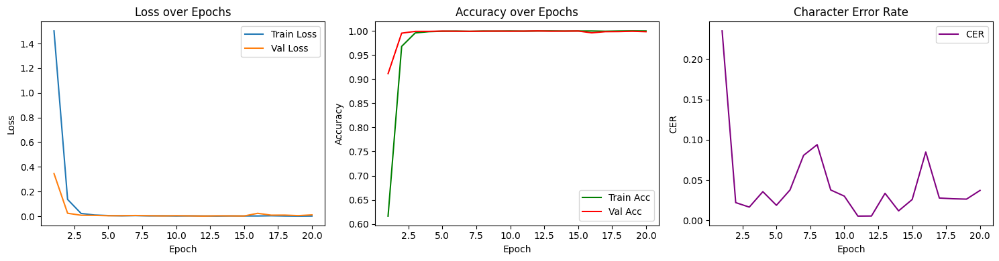

Evaluating: 100%|██████████| 63/63 [00:04<00:00, 12.91it/s]


<Figure size 1200x1000 with 0 Axes>

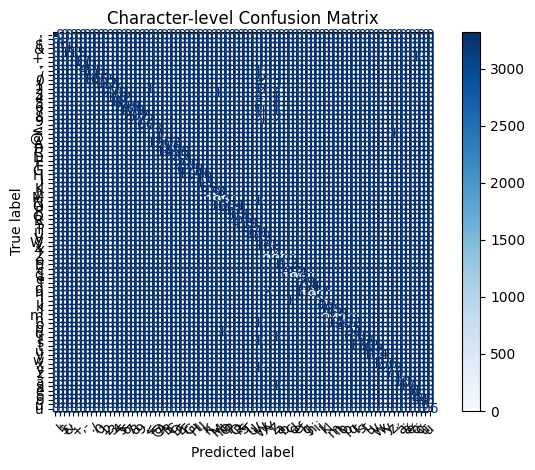

Evaluating: 100%|██████████| 63/63 [00:04<00:00, 12.82it/s]


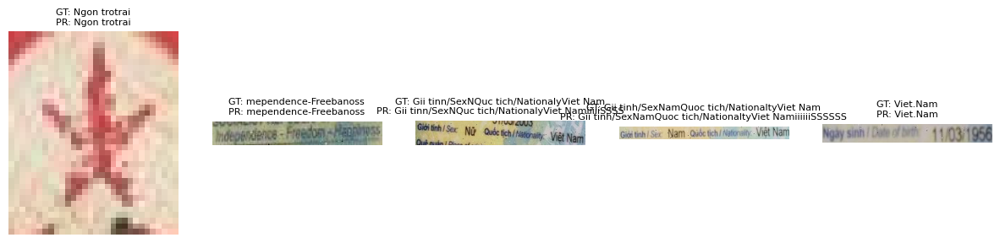

In [13]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from tqdm import tqdm
import editdistance

def train(model, dataloader, optimizer, criterion, device, tokenizer):
    model.train()
    total_loss = 0
    total_correct = 0
    total_chars = 0

    for imgs, labels in tqdm(dataloader, desc="Training"):
        imgs = imgs.to(device)
        labels = labels.to(device)

        tgt_input = labels[:, :-1]
        tgt_output = labels[:, 1:]

        optimizer.zero_grad()
        preds = model(imgs, tgt_input)
        loss = criterion(preds.reshape(-1, preds.size(-1)), tgt_output.reshape(-1))
        loss.backward()
        optimizer.step()
        total_loss += loss.item()

        pred_tokens = preds.argmax(-1)
        for pred_seq, true_seq in zip(pred_tokens.cpu().numpy(), tgt_output.cpu().numpy()):
            pred_text = tokenizer.decode(pred_seq)
            true_text = tokenizer.decode(true_seq)
            correct_chars = sum(p == t for p, t in zip(pred_text, true_text))
            total_correct += correct_chars
            total_chars += len(true_text)

    avg_loss = total_loss / len(dataloader)
    acc = total_correct / total_chars if total_chars > 0 else 0
    return avg_loss, acc

def main():
    IMG_DIR = "/content/DLFinal/output_crops"
    LABEL_PATH = "/content/drive/MyDrive/ocr_dataset.json"
    MAX_LEN = 64
    NUM_EPOCHS = 20
    BATCH_SIZE = 32
    LEARNING_RATE = 1e-4

    train_samples, test_samples = create_datasets(IMG_DIR, LABEL_PATH, max_samples=10000)
    all_texts = [text for _, text in train_samples + test_samples]
    tokenizer = CharTokenizer(all_texts)

    train_dataset = OCRDataset(train_samples, IMG_DIR, tokenizer, max_len=MAX_LEN)
    test_dataset = OCRDataset(test_samples, IMG_DIR, tokenizer, max_len=MAX_LEN)

    train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
    test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)

    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model = OCRModel(tokenizer.vocab_size).to(device)
    optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE)
    criterion = nn.CrossEntropyLoss(ignore_index=tokenizer.token2idx["<PAD>"])

    best_val_loss = float('inf')
    patience = 3
    patience_counter = 0

    train_losses, val_losses = [], []
    train_accuracies, val_accuracies, cers = [], [], []

    for epoch in range(NUM_EPOCHS):
        train_loss, train_acc = train(model, train_loader, optimizer, criterion, device, tokenizer)
        train_losses.append(train_loss)
        train_accuracies.append(train_acc)

        preds, labels, val_loss, val_acc, exact_match, cer, _, _ = evaluate(
            model, test_loader, tokenizer, device, criterion
        )
        val_losses.append(val_loss)
        val_accuracies.append(val_acc)
        cers.append(cer)

        print(f"Epoch {epoch+1}/{NUM_EPOCHS}")
        print(f"  Train Loss       : {train_loss:.4f} | Train Acc: {train_acc:.4f}")
        print(f"  Val Loss         : {val_loss:.4f} | Val Acc  : {val_acc:.4f}")
        print(f"  Exact Match      : {exact_match:.4f} | CER     : {cer:.4f}")

        # # EARLY STOPPING
        # if val_acc > 0.99:
        #     print("🎯 Accuracy quá cao. Early stopping.")
        #     torch.save(model.state_dict(), "best_model.pth")
        #     break
        # if val_loss < 0.01:
        #     print("📉 Loss rất thấp. Early stopping.")
        #     torch.save(model.state_dict(), "best_model.pth")
        #     break
        # if val_loss < best_val_loss:
        #     best_val_loss = val_loss
        #     patience_counter = 0
        #     torch.save(model.state_dict(), "best_model.pth")
        #     print("✅ Model improved. Saved best_model.pth")
        # else:
        #     patience_counter += 1
        #     print(f"⚠️ No improvement. Counter: {patience_counter}/{patience}")
        #     if patience_counter >= patience:
        #         print("⛔ Early stopping triggered.")
        #         break

    # Lưu model cuối
    torch.save(model.state_dict(), "ocr_model.pth")
    print("💾 Model saved as ocr_model.pth")

    # Đồ thị Loss / Accuracy / CER
    epochs = range(1, len(train_losses) + 1)
    plt.figure(figsize=(15, 4))

    plt.subplot(1, 3, 1)
    plt.plot(epochs, train_losses, label='Train Loss')
    plt.plot(epochs, val_losses, label='Val Loss')
    plt.title('Loss over Epochs')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()

    plt.subplot(1, 3, 2)
    plt.plot(epochs, train_accuracies, label='Train Acc', color='green')
    plt.plot(epochs, val_accuracies, label='Val Acc', color='red')
    plt.title('Accuracy over Epochs')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()

    plt.subplot(1, 3, 3)
    plt.plot(epochs, cers, label='CER', color='purple')
    plt.title('Character Error Rate')
    plt.xlabel('Epoch')
    plt.ylabel('CER')
    plt.legend()

    plt.tight_layout()
    plt.show()

    # Confusion Matrix
    _, _, _, _, _, _, pred_chars, true_chars = evaluate(model, test_loader, tokenizer, device, criterion)
    labels = sorted(list(set(true_chars + pred_chars)))
    cm = confusion_matrix(true_chars, pred_chars, labels=labels)

    plt.figure(figsize=(12, 10))
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)
    disp.plot(include_values=True, xticks_rotation=45, cmap='Blues')
    plt.title("Character-level Confusion Matrix")
    plt.tight_layout()
    plt.show()

    # Visualize dự đoán
    preds, labels, _, _, _, _, _, _ = evaluate(model, test_loader, tokenizer, device, criterion)
    visualize_predictions(test_samples, preds, tokenizer, IMG_DIR)

if __name__ == "__main__":
    main()


# Kiếm tra mô hình

In [14]:
IMG_DIR = "/content/DLFinal/output_crops"
LABEL_PATH = "/content/drive/MyDrive/ocr_dataset.json"


train_samples, test_samples = create_datasets(IMG_DIR, LABEL_PATH, max_samples=10000)
all_texts = [text for _, text in train_samples + test_samples]
tokenizer = CharTokenizer(all_texts)

In [15]:
import pickle

# Sau khi tạo tokenizer
with open("/content/tokenizer.pkl", "wb") as f:
    pickle.dump(tokenizer, f)


Đang xử lý 5 ảnh (từ 0 đến 4)
Đang xử lý ảnh 0: 52_jpg.rf.0082e8a5fdf30ee360542d209e18039f.jpg
Dac diemnhan dang  Personal identification
Not ruoiC.2cm dui mat trai
Ngaythang,nam/Datemonthyear.05/04/2020
CUCTRUONG CUC CANH SAT
QUAN LY HANH CHINHVE TRATTU XA HOI
DECTORGENERALOFTHE POLICEDEPARMENT
FORADANSTRATIVEMANAGEMC
SOCIALORDER
OGONG
Ngon tro.trai
Neon tro phai
Lettindoxfiner
Rignt nex.finge
Le Thi Hanh
P6L2T9M1K8J5R3N7X0Q4A1Z3W2C<<1
NK7T1P3M9L5Q2A0X6R12<<<<<<<<<4
TRAN<<THI<TU<<<<<<<<<<<<<<<<<<


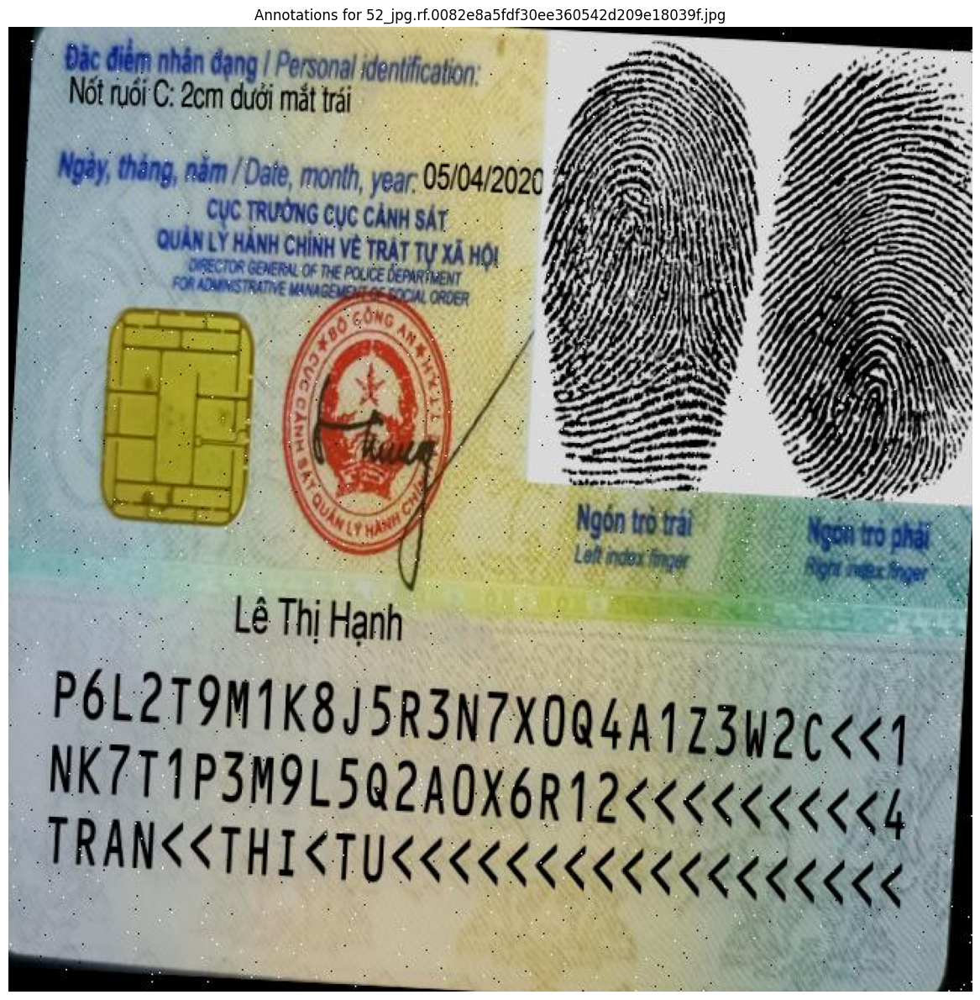

Đã lưu ảnh có annotations tại: output/annotated_52_jpg.rf.0082e8a5fdf30ee360542d209e18039f.jpg
Đang xử lý ảnh 1: 15_jpg.rf.c02a6c9e3fc801f73b52eb29a082f785.jpg
CONGOAXAHGCHU.NGHAVIETNAM
DeTy doHa phoc
SOASTVM
CAN CUOC CONG DAN
022206004066
Hwaton/Fn.
PHAMDUY.LONG
Nh03/12/2006
GSerNamouchNViei Nam
Guequan.l.Pe.Yoror
Hai.XuanThanh pho Mong CalQuang Ninh
NothontrPocod
Khu Trang.Vy
TraCbThanhphd Mong CaiQung Nin


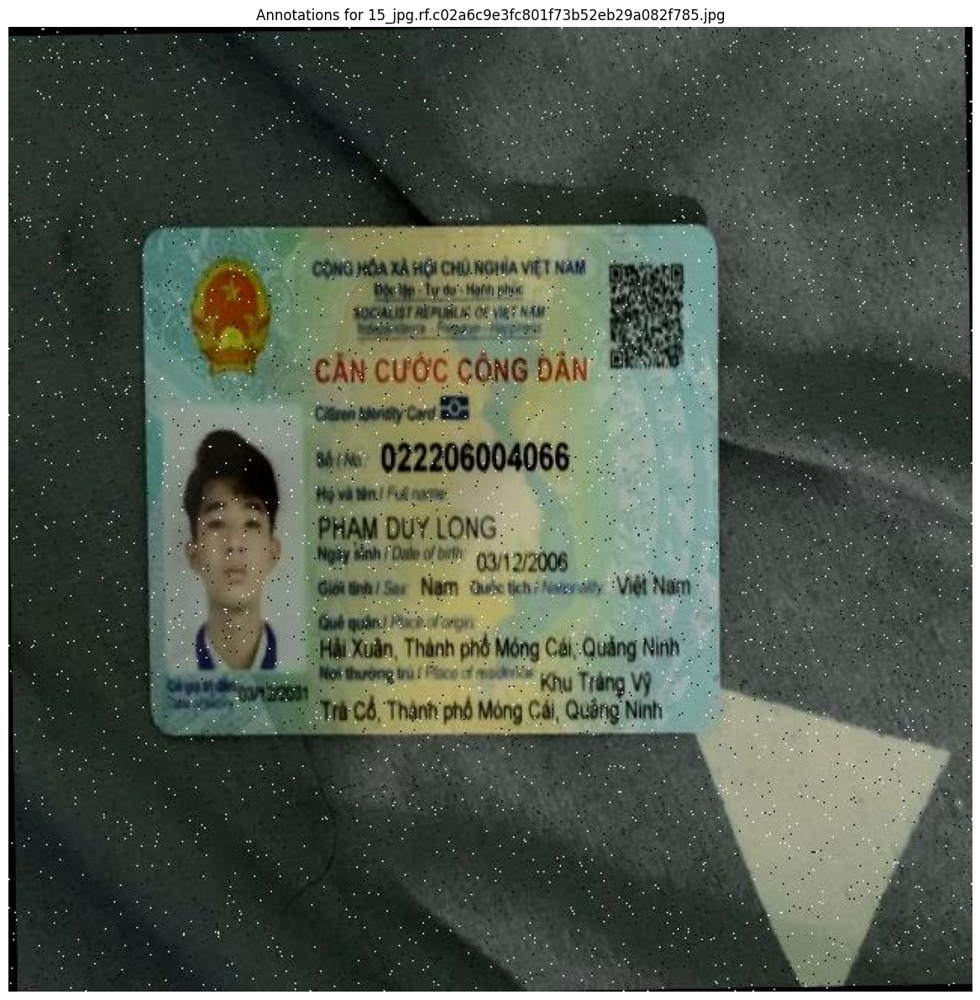

Đã lưu ảnh có annotations tại: output/annotated_15_jpg.rf.c02a6c9e3fc801f73b52eb29a082f785.jpg
Đang xử lý ảnh 2: 1114_jpg.rf.dea271786a2de0bc641e993e77f15e27.jpg
CONG HOAXA HOI CHU NGHIAVIETNAM
Doc lap-Tu do-Hanh phue
CAN CUOCCONG DAN
s6:079074007979
Ho.va ten:
HUAKIEN MINH
Ngay.thang.nam sinh24/10/1974
GiaitinnNam
Quc ichViet Nam
Que quan:Trung Quóc
Noi thuong tn25 Lau 1 Su Van Hanh
Phung 9.Quan5TP.H Chi Minh
Co gia tri den24/10/2034


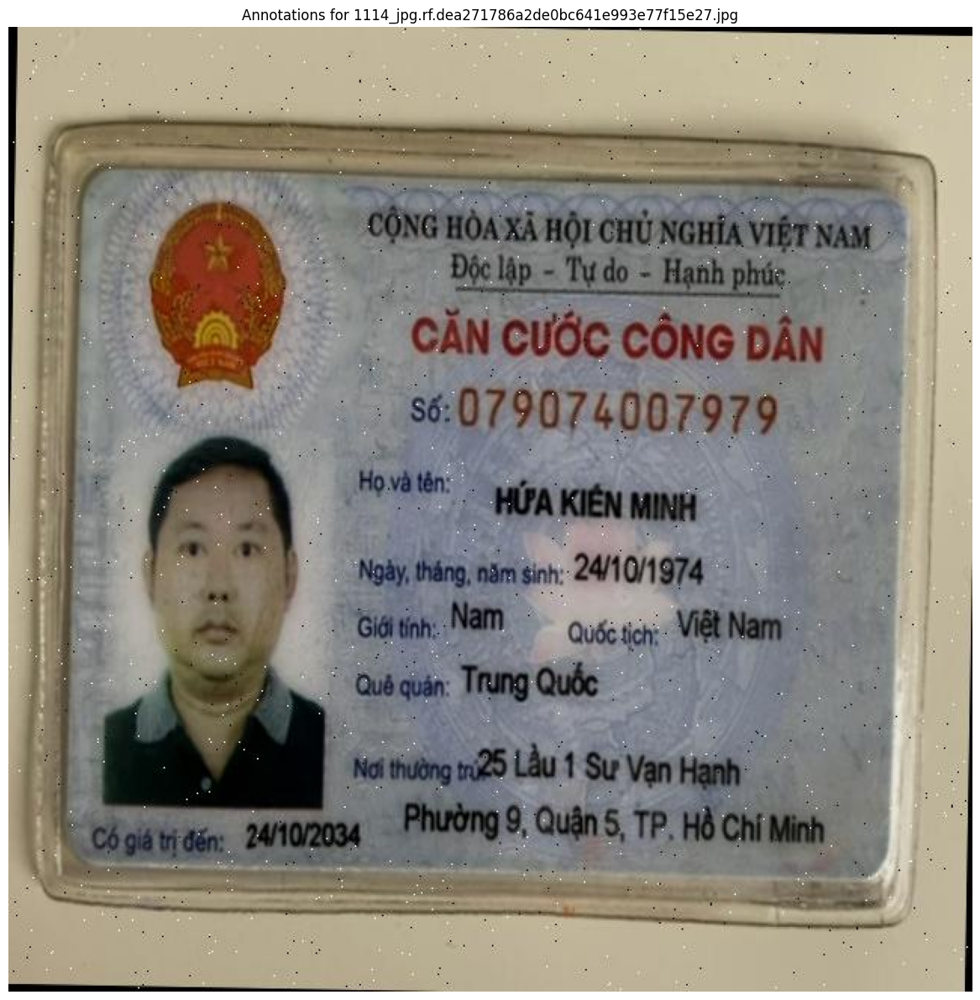

Đã lưu ảnh có annotations tại: output/annotated_1114_jpg.rf.dea271786a2de0bc641e993e77f15e27.jpg
Đang xử lý ảnh 3: 380_jpg.rf.63486f6c6816e537e6639a66addb6db7.jpg
CONG.HOAXAHOICHUNGHIAVIETNAM
pocs.-Tydo-Hanhphuc.
SOCIALISTREPUBLIC.OFVIET'NAM
CANCUOC CONG DAN
C CaO
064200005033
Hovanlnome
NGUYEN DINH VUONG
Gtih/SexNamQuch/Nanay Vit Nam
Que qa/Flace of on
My cat.PhuMBinh Din
10/0/2085
la PhangChu unGla La


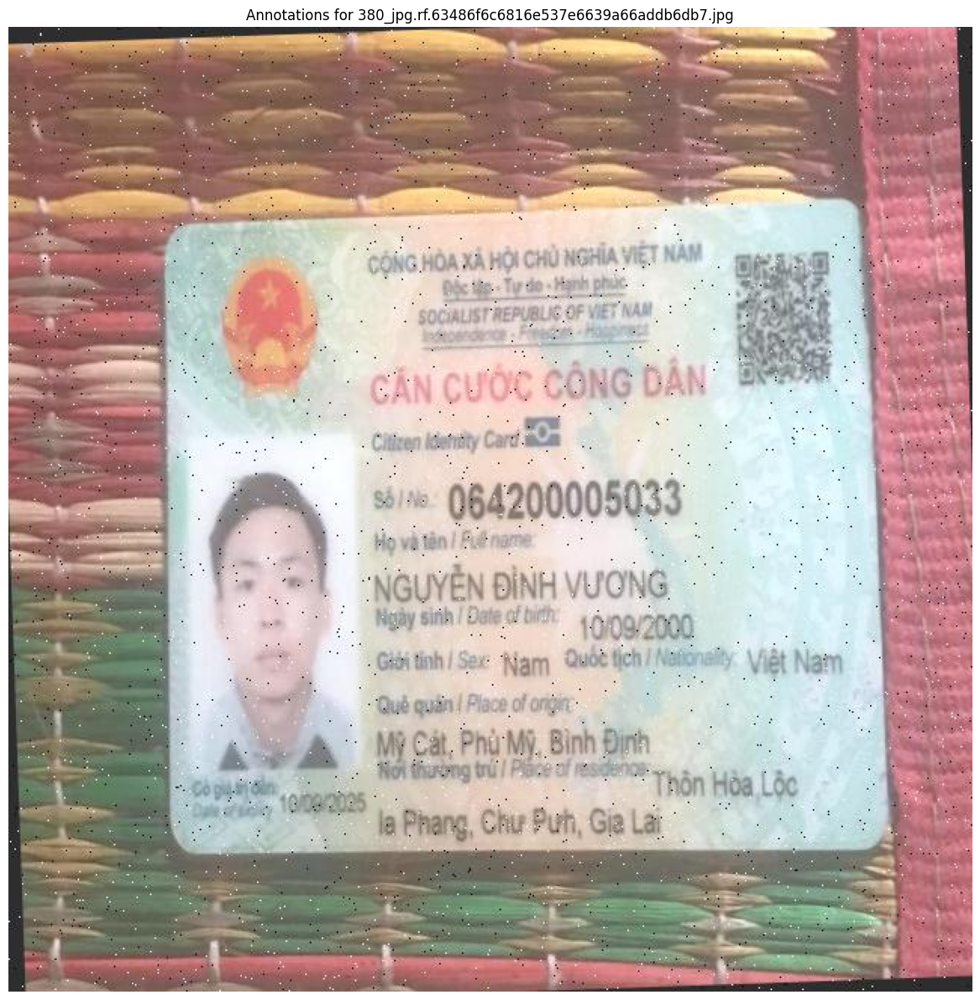

Đã lưu ảnh có annotations tại: output/annotated_380_jpg.rf.63486f6c6816e537e6639a66addb6db7.jpg
Đang xử lý ảnh 4: 209_jpg.rf.195884dae84a1053376aa6922c89b8f7.jpg
CONG HOAXAHOICHUNGHIAVIETNAM
Dac lao-Tr do-Mann phuc
SOCIALISTREPUBUCOFVIETNAM
nceperdew.Frooneccizess
CAN CUOC CONG DAN
Citizen Identity Card
S61No.:1
002086000477
Hovaten Ful name
VUONGVAN GIANG
Ngay sinh/Dateof ith19/12/1986
Giitinh/SexNamQuctch/Natohait Nam
Que quan/Place of origin
MnhTanNam SachHaiDuong
NoithngtrPlaceofednceThön QuangTin
C6nn1912026
Da ofi
TT.Vinh Quang.Hoang Su Phi, Ha Giang


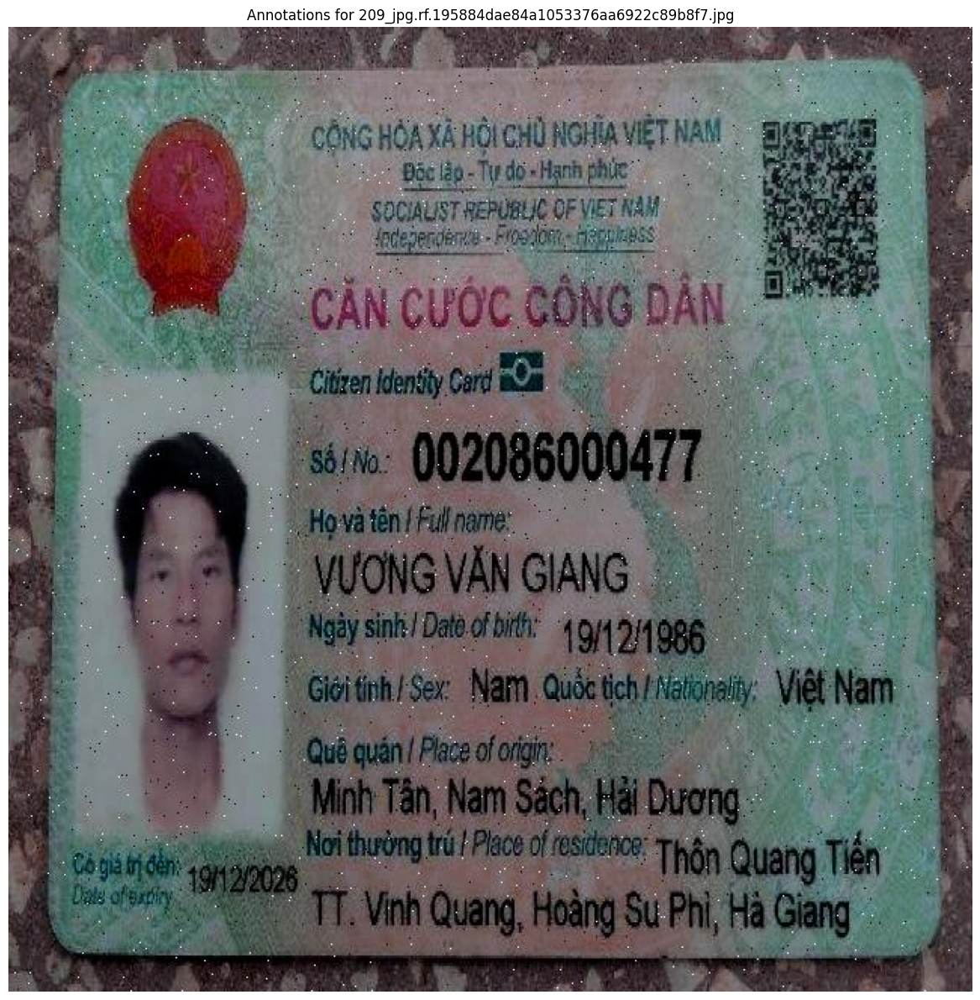

Đã lưu ảnh có annotations tại: output/annotated_209_jpg.rf.195884dae84a1053376aa6922c89b8f7.jpg


In [17]:
import json
import cv2
import os
import numpy as np
from matplotlib import pyplot as plt
import torch
from torchvision import transforms
from torch.utils.data import DataLoader
import argparse

# Đường dẫn đến thư mục chứa ảnh
image_dir = "/content/DLFinal/images"
# Đường dẫn đến file JSON
json_file = "/content/drive/MyDrive/ocr_dataset.json"  # Hãy thay đổi đường dẫn này
MODEL_PATH = "/content/ocr_model.pth"  # Đường dẫn model đã train

# Đọc dữ liệu từ file JSON
with open(json_file, 'r', encoding='utf-8') as f:
    data = json.load(f)

# Hàm vẽ các bounding box và text (cả GT và dự đoán)
def visualize_annotations(image_data, image_path, model=None, tokenizer=None, device=None):
    image = cv2.imread(image_path)
    if image is None:
        print(f"Không thể đọc ảnh từ {image_path}")
        return None

    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image_with_boxes = image_rgb.copy()

    for annotation in image_data["annotations"]:
        bbox = annotation["bbox"]
        text_gt = annotation["text"]
        x, y, w, h = bbox


        # Nếu có model, cắt ảnh vùng bbox và dự đoán
        pred_text = ""
        if model and tokenizer and device:
            cropped = image_rgb[y:y+h, x:x+w]
            pred_text = predict_single_image_crop(cropped, model, tokenizer, device)

        # Vẽ text thật và dự đoán
        text_to_display = f"{text_gt}"
        if pred_text:
            text_to_display += f" | P: {pred_text}"

        # cv2.putText(image_with_boxes, text_to_display, (x, y - 5),
        #             cv2.FONT_HERSHEY_COMPLEX, 0.5, (255, 140, 0), 2)
        print(text_to_display)

    return image_with_boxes

def predict_single_image_crop(crop_img, model, tokenizer, device):
    transform = transforms.Compose([
        transforms.ToPILImage(),
        transforms.Resize((32, 128)),
        transforms.ToTensor(),
    ])
    img_tensor = transform(crop_img).unsqueeze(0).to(device)  # (1, C, H, W)

    model.eval()
    with torch.no_grad():
        # Tạo tgt_input mặc định (chuỗi khởi tạo)
        tgt_input = torch.zeros(1, 1).long().to(device)  # Một tensor chứa giá trị khởi tạo cho decoder

        # Dự đoán với mô hình, truyền cả img_tensor và tgt_input
        output = model(img_tensor, tgt_input)

        # Chuyển kết quả output sang chuỗi văn bản (decode từ id)
        pred_ids = output.argmax(dim=-1).squeeze(0).tolist()
        pred_text = tokenizer.decode(pred_ids)
        return pred_text



# Hàm xử lý từng ảnh
def process_images(start_idx=0, num_images=None, save=True, display=True):
    """
    Xử lý và hiển thị một số lượng hình ảnh nhất định

    Tham số:
    - start_idx: Chỉ số bắt đầu của hình ảnh để xử lý
    - num_images: Số lượng hình ảnh muốn xử lý (None để xử lý tất cả)
    - save: Có lưu các hình ảnh đã vẽ hay không
    - display: Có hiển thị các hình ảnh hay không
    """
    total_images = len(data["images"])
    if start_idx >= total_images:
        print(f"Chỉ số bắt đầu ({start_idx}) lớn hơn tổng số ảnh ({total_images})")
        return

    end_idx = total_images if num_images is None else min(start_idx + num_images, total_images)

    print(f"Đang xử lý {end_idx - start_idx} ảnh (từ {start_idx} đến {end_idx-1})")

    for idx in range(start_idx, end_idx):
        image_info = data["images"][idx]
        file_name = image_info["file_name"]
        image_path = os.path.join(image_dir, file_name)

        print(f"Đang xử lý ảnh {idx}: {file_name}")

        # Vẽ annotations lên ảnh
        annotated_image = visualize_annotations(image_info, image_path, model=model, tokenizer=tokenizer, device=device)

        if annotated_image is not None:
            # Hiển thị ảnh với annotations nếu được yêu cầu
            if display:
                plt.figure(figsize=(12, 12))
                plt.imshow(annotated_image)
                plt.title(f"Annotations for {file_name}")
                plt.axis('off')
                plt.tight_layout()
                plt.show()
            # Lưu ảnh với annotations nếu được yêu cầu
            if save:
                output_path = os.path.join("output", f"annotated_{file_name}")
                os.makedirs("output", exist_ok=True)
                cv2.imwrite(output_path, cv2.cvtColor(annotated_image, cv2.COLOR_RGB2BGR))
                print(f"Đã lưu ảnh có annotations tại: {output_path}")

# Phần command-line interface
def parse_args():
    parser = argparse.ArgumentParser(description='Vẽ bounding box và text từ dữ liệu JSON')
    parser.add_argument('--start', type=int, default=0, help='Chỉ số bắt đầu của ảnh để xử lý')
    parser.add_argument('--num', type=int, default=None, help='Số lượng ảnh muốn xử lý (mặc định: tất cả)')
    parser.add_argument('--no-save', action='store_true', help='Không lưu ảnh đã vẽ')
    parser.add_argument('--no-display', action='store_true', help='Không hiển thị ảnh')
    return parser.parse_args()

# Hàm load model
def load_model(model_path, tokenizer, device):
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model = OCRModel(tokenizer.vocab_size).to(device)
    model.load_state_dict(torch.load(model_path))
    # model.eval()  # Chuyển model sang chế độ evaluation
    return model

# Chạy hàm xử lý
if __name__ == "__main__":
    # Load model
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    IMG_DIR = "/content/DLFinal/output_crops"
    LABEL_PATH = "/content/drive/MyDrive/ocr_dataset.json"
    MAX_LEN = 64

    BATCH_SIZE = 32
    LEARNING_RATE = 1e-4

    # 1. Chuẩn bị dữ liệu
    train_samples, test_samples = create_datasets(IMG_DIR, LABEL_PATH, max_samples=10000)

    all_texts = [text for _, text in train_samples + test_samples]
    tokenizer = CharTokenizer(all_texts)

    # Giả sử bạn đã có tokenizer (có thể lấy từ dữ liệu huấn luyện trước)
    # Đây chỉ là ví dụ, bạn cần khởi tạo tokenizer đúng cách trong ứng dụng của mình # Cần thay thế `all_texts` với dữ liệu text trong tập huấn luyện của bạn
    model = load_model(MODEL_PATH, tokenizer, device)

    # Chạy xử lý
    process_images(start_idx=0, num_images=5, save=True, display=True)
